In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Looking for ETVs in TIC 57297550


In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid = 57297550  # EW, only 2 sectors of 2min data, 2 sectors of TESS-SPOC (10min)

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u


sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
lc_tess = sr.download_all().stitch()
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 24,2020,SPOC,120,57297550,0.0,G022062
1,TESS Sector 25,2020,SPOC,120,57297550,0.0,G022062
2,TESS Sector 51,2022,TESS-SPOC,600,57297550,0.0,N/A
3,TESS Sector 52,2022,TESS-SPOC,600,57297550,0.0,N/A


42040

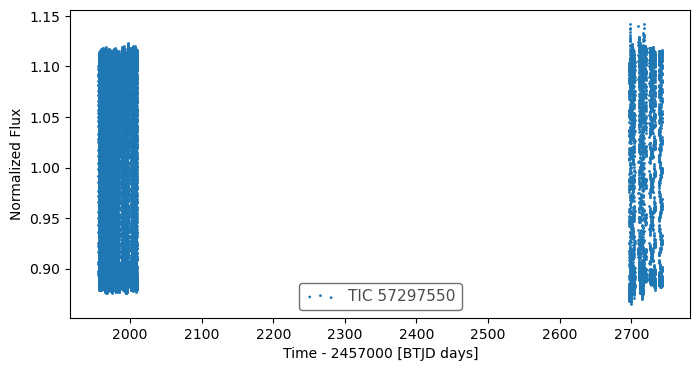

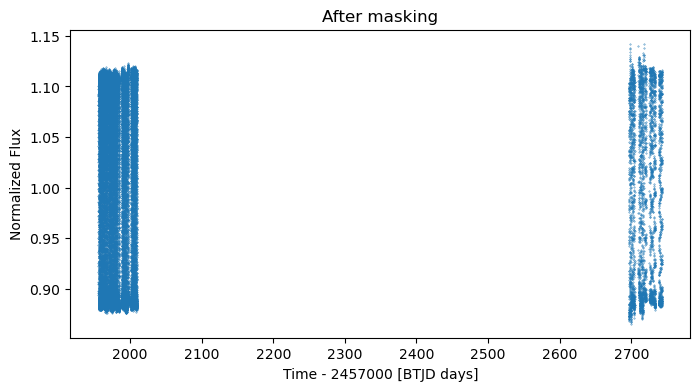

In [5]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  
mask = flux < 0.85    # remove occassional outliers

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [6]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [7]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

In [23]:
round(0.1911155958357545 * 2, 7)

0.3822312

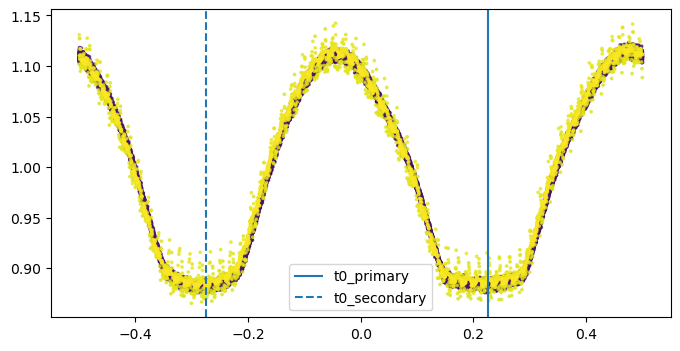

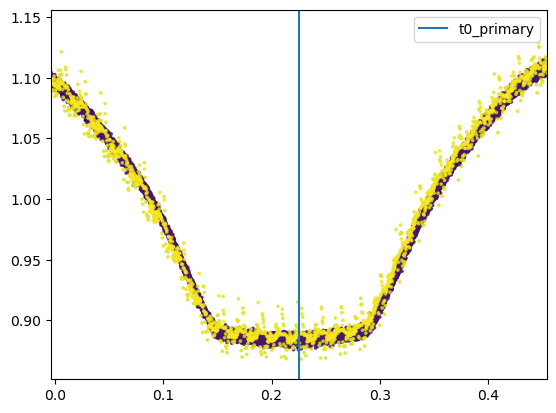

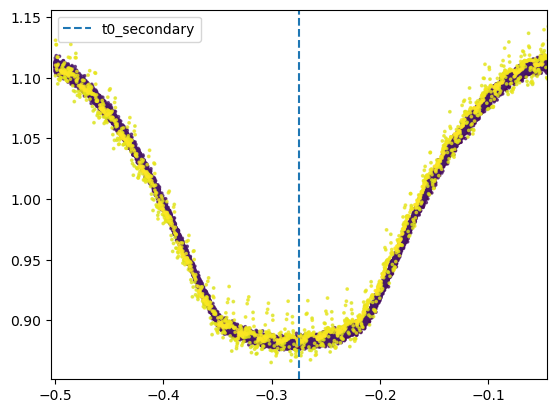

In [8]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# epoch=1955.9687, duration_hr=3.5355, period=0.382169, label="s0014-s0026:TCE1",

# FILL-IN THE eclipse epoch / period, 
period = 0.3822312  # LombScargle result X 2, 6 decimal looks sufficient, add 1 more  # TCE: 0.382169  # VSX: 0.38222952  # LombScargle (oversample_factor=50): 0.1911155958357545 -0.0086909	+0.0087116	
# period = 0.382231 # MCMC result 0.3822306257941068, it is basically the same as LombScarlge result adopted

t0_primary = 1955.9687
t0_secondary = t0_primary + period / 2


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 3.5
duration_hr_secondary = duration_hr_primary

# t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.6 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.6 * duration_hr_primary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.6 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.6 * duration_hr_secondary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [9]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,1955.797846,0.893337,0.001476,-0.221990
1,1955.799235,0.895806,0.001478,-0.218356
2,1955.800624,0.897869,0.001481,-0.214723
3,1955.802013,0.904357,0.001480,-0.211089
4,1955.803402,0.906119,0.001481,-0.207455
...,...,...,...,...
34965,2743.047832,1.066002,0.000571,0.395293
34966,2743.054777,1.085950,0.000575,0.413461
34967,2743.061721,1.101182,0.000578,0.431629
34968,2743.068665,1.111649,0.000581,0.449797


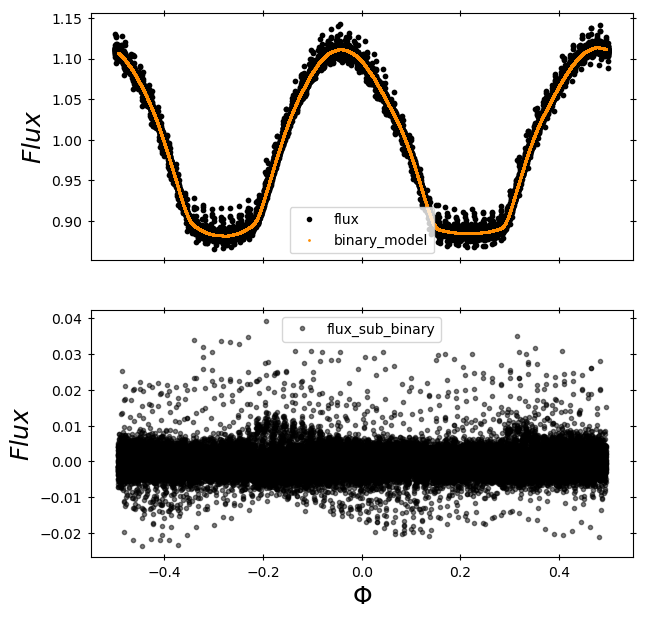

,time,flux,err,phase,flux_sub_binary,binary_model
0,1955.797846,0.893337,0.001476,-0.221990,-0.001381,0.894719
1,1955.799235,0.895806,0.001478,-0.218356,-0.001313,0.897119
2,1955.800624,0.897869,0.001481,-0.214723,-0.002283,0.900151
3,1955.802013,0.904357,0.001480,-0.211089,-0.000119,0.904476
4,1955.803402,0.906119,0.001481,-0.207455,-0.003867,0.909986
...,...,...,...,...,...,...
34965,2743.047832,1.066002,0.000571,0.395293,0.004919,1.061083
34966,2743.054777,1.085950,0.000575,0.413461,0.006234,1.079717
34967,2743.061721,1.101182,0.000578,0.431629,0.005774,1.095408
34968,2743.068665,1.111649,0.000581,0.449797,0.004871,1.106778


In [10]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 34624 901
reached the end
10 33270 901
reached the end
10 33090 901
reached the end
10 33052 901
reached the end
10 33042 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,1955.797846,0.893337,0.001476,-0.221990,-0.001381,0.894719,0.894733
1,1955.799235,0.895806,0.001478,-0.218356,-0.001313,0.897119,0.897204
2,1955.800624,0.897869,0.001481,-0.214723,-0.002283,0.900151,0.899269
3,1955.802013,0.904357,0.001480,-0.211089,-0.000119,0.904476,0.905759
4,1955.803402,0.906119,0.001481,-0.207455,-0.003867,0.909986,0.907523
...,...,...,...,...,...,...,...
34965,2743.047832,1.066002,0.000571,0.395293,0.004919,1.061083,1.060239
34966,2743.054777,1.085950,0.000575,0.413461,0.006234,1.079717,1.080173
34967,2743.061721,1.101182,0.000578,0.431629,0.005774,1.095408,1.095389
34968,2743.068665,1.111649,0.000581,0.449797,0.004871,1.106778,1.105841


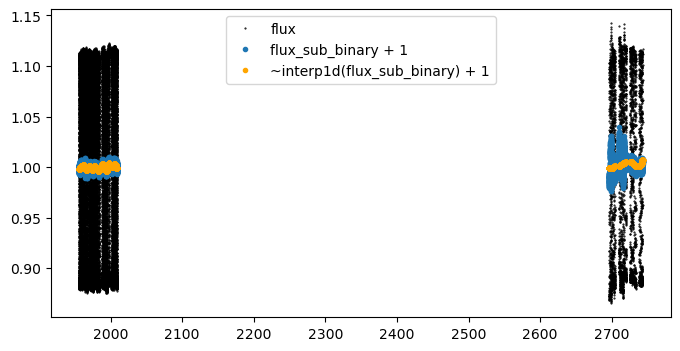

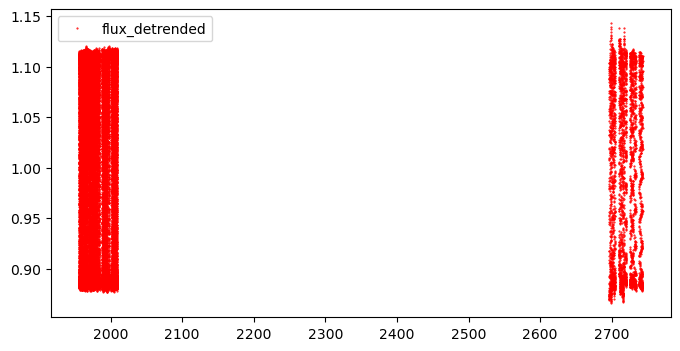

In [11]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

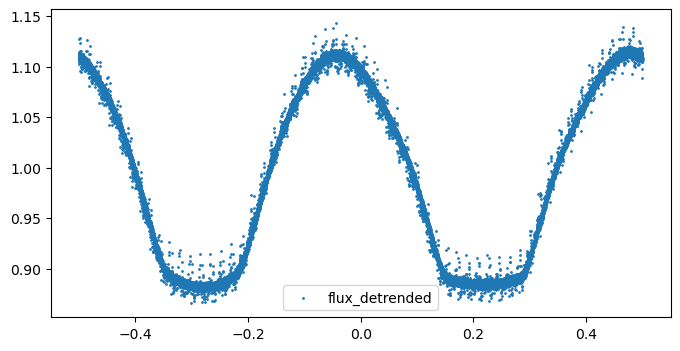

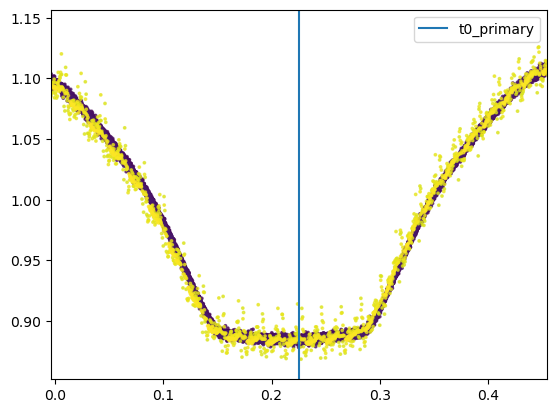

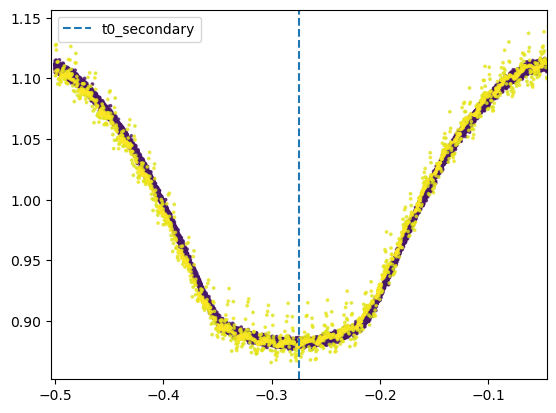

In [12]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1, label="flux_detrended")
plt.legend()
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.6 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.6 * duration_hr_primary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.6 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.6 * duration_hr_secondary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

<span style="background-color: rgba(255, 0, 0, 0.6);"> NOTE: </span> The zoom windows below for the eclipses are made **smaller**, an attempt to reduce the complications of EW variability outside the minima (and some assymetery)

### Now that the data is ready we can start 

Primary:   1955.9687 0.2250000000000616
window_width_p (phase): 0.3815317361150355
Secondary: 1956.1598156 -0.2749999999996693
window_width_s (phase): 0.3815317361150355


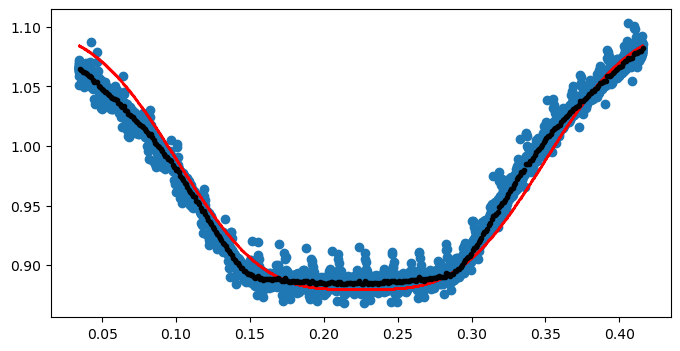

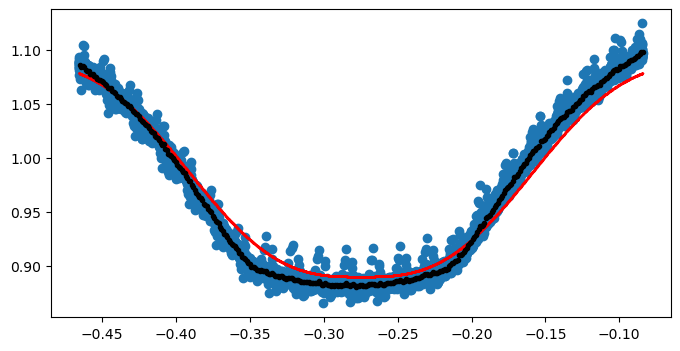

In [13]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 1.0 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
    window_width_s = 1.0 * duration_hr_secondary / 24 / period  
    # window_width_s = 0.22
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1.10, -0.22, midpoint_p, 0.09, 1.8]
start_vals_s = [1.09, -0.20, midpoint_s, 0.09, 1.5]
    
# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
if t0_secondary is not None:
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

In [ ]:
if False: 
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [07:54<00:00,  2.11it/s]


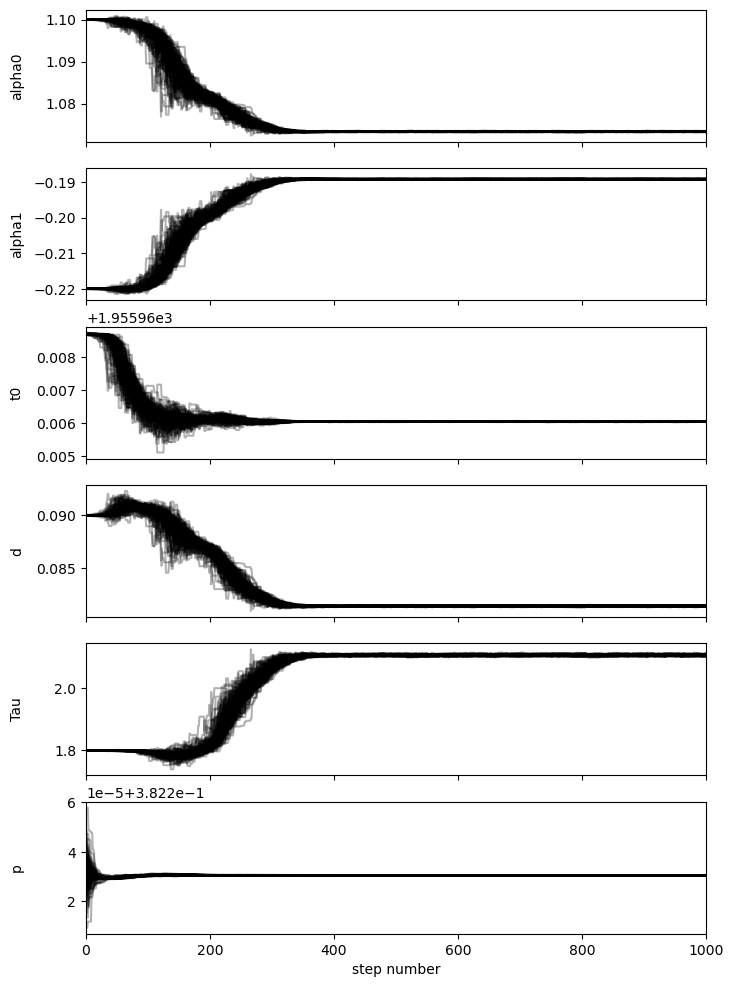

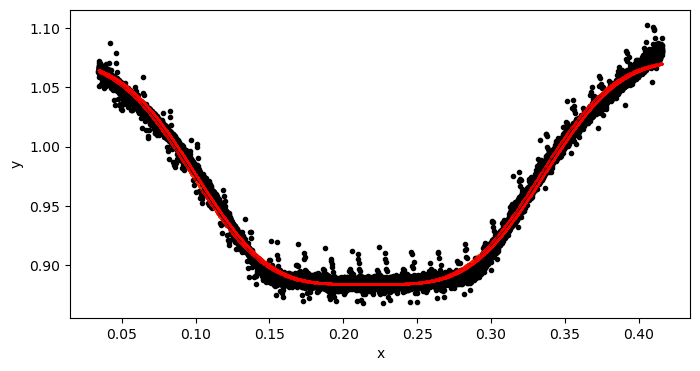

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0733533525645158, -0.18920965599185174, 1955.9660506779878, 0.08145548144851793, 2.107745875851471, 0.3822306257941068
std_p: 3.4703979070044704e-09


In [22]:
# use MCMC to refine the period

use_mcmc_to_fit_period = False

if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()
        
    # MCMC resultL
    # mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 1.0733533525645158, -0.18920965599185174, 1955.9660506779878, 0.08145548144851793, 2.107745875851471, 0.3822306257941068
    # std_p: 3.4703979070044704e-09
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.10, -0.22, t0_primary, 0.09, 1.8, period],
        nruns=1000, discard=600, 
        # nruns=20, discard=1, 
        pool=4,
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"])
    

100%|██████████████████████████████████████████████████████████| 1000/1000 [04:14<00:00,  3.94it/s]


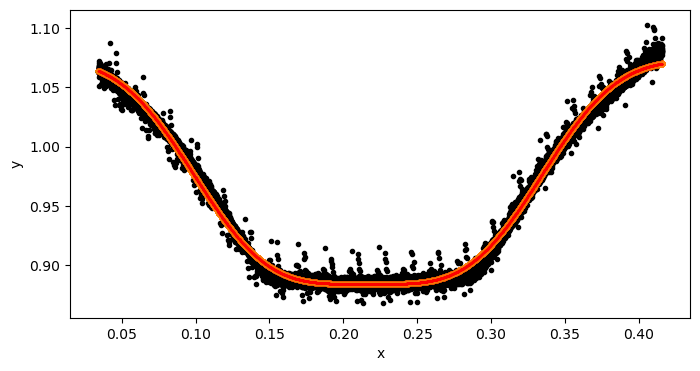

100%|██████████████████████████████████████████████████████████| 1000/1000 [04:20<00:00,  3.83it/s]


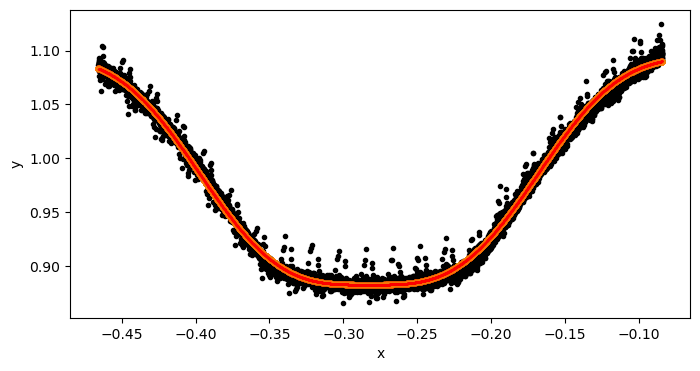

In [54]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = False

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
    !$NOTIFY_CMD "Initial fit done"

Use pre-defined inital model params:


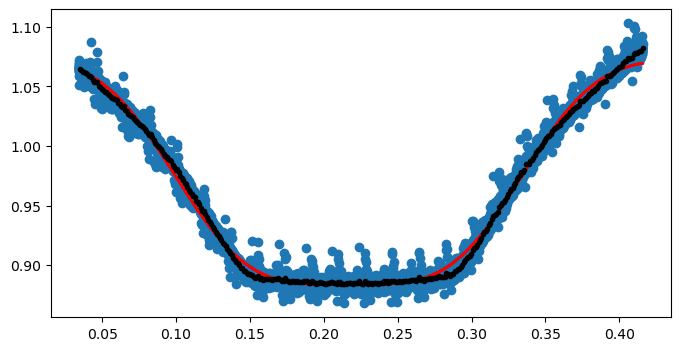

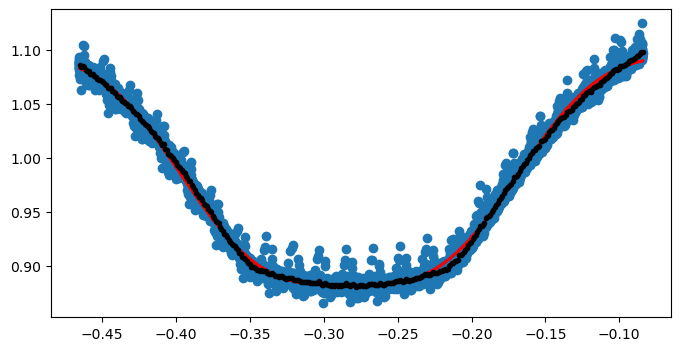

In [24]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0733060735771711, -0.1891585144165238, 0.2165254598082374, 0.08145869672237488, 2.1059379603318096
    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])

    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0947691932283237, -0.21229417277560728, -0.28284599880306965, 0.08395793189313172, 1.7447910963848927
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [25]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0733060735771711, -0.1891585144165238, 0.2165254598082374, 0.08145869672237488, 2.1059379603318096
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0947691932283237, -0.21229417277560728, -0.28284599880306965, 0.08395793189313172, 1.7447910963848927


2059

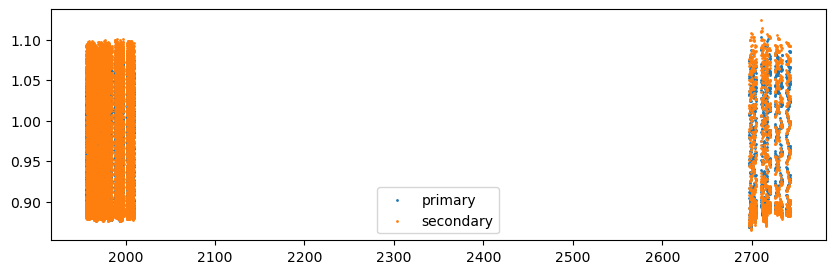

In [26]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1955.9687 0.3822312 1955.9687


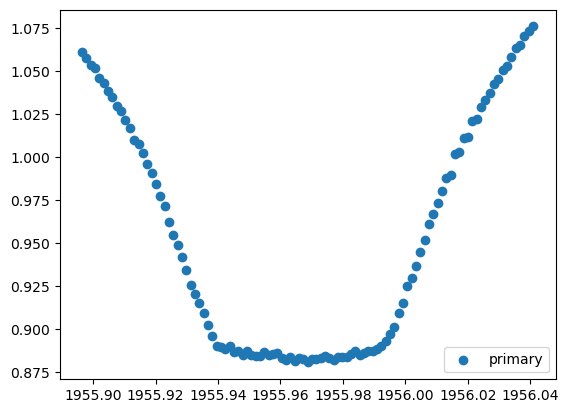

1955.9687 0.3822312 1956.3509311999999


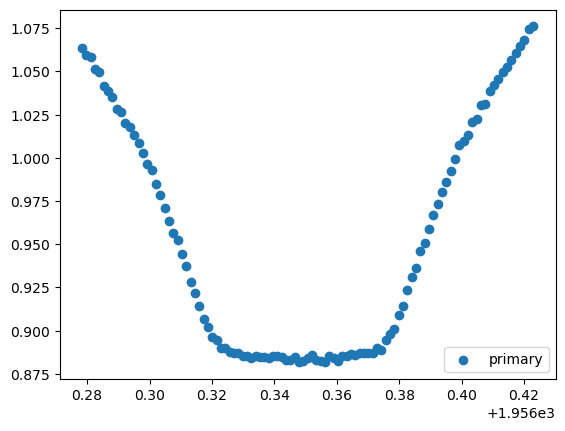

1955.9687 0.3822312 1956.7331623999999


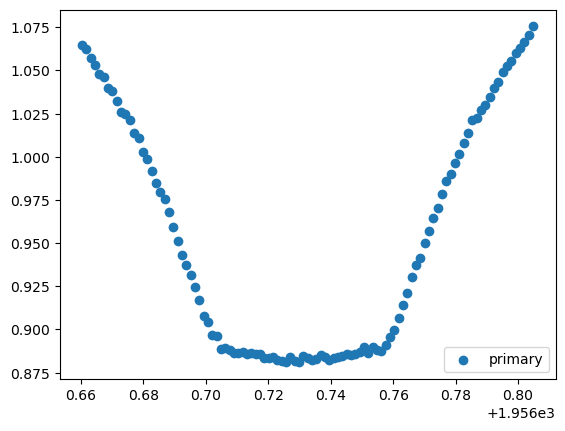

1956.1598156 0.3822312 1956.1598156


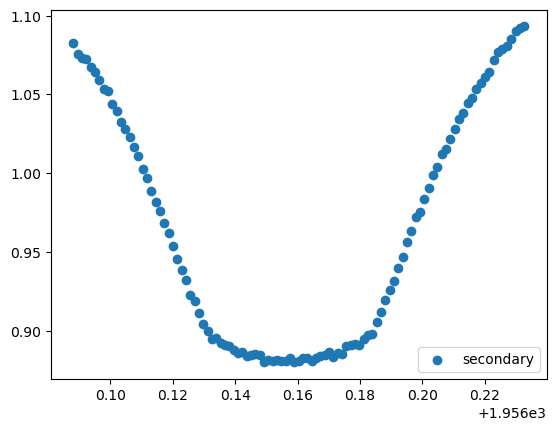

1956.1598156 0.3822312 1956.5420468


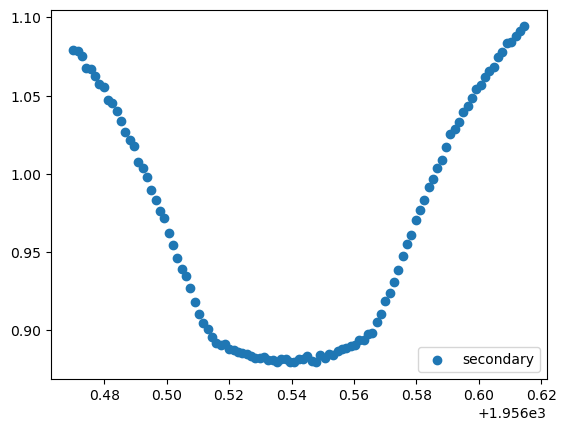

1956.1598156 0.3822312 1956.924278


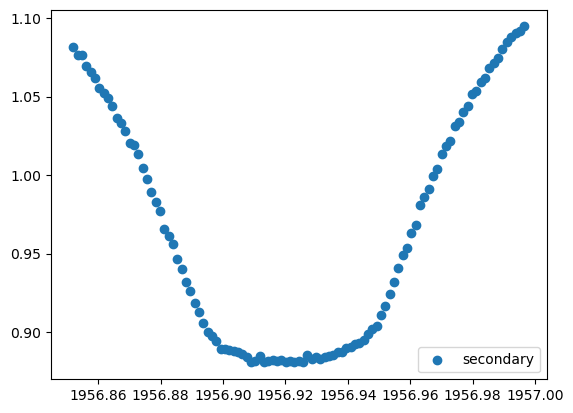

In [27]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Creating new manifest file
1955.9687 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.85it/s]


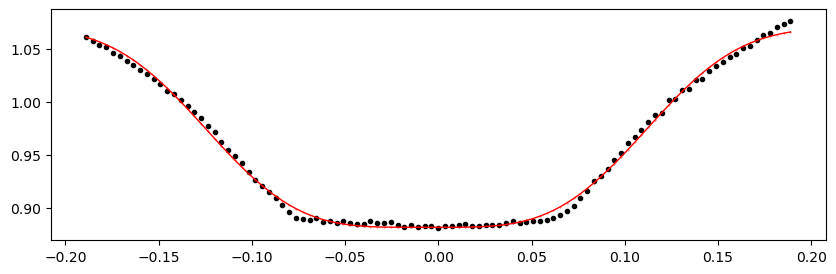

1956.3509311999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.91it/s]


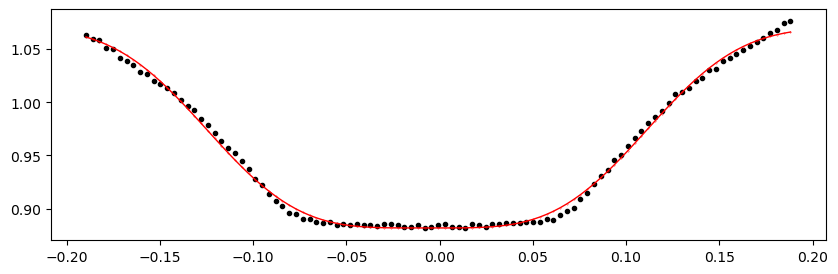

1956.7331623999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.49it/s]


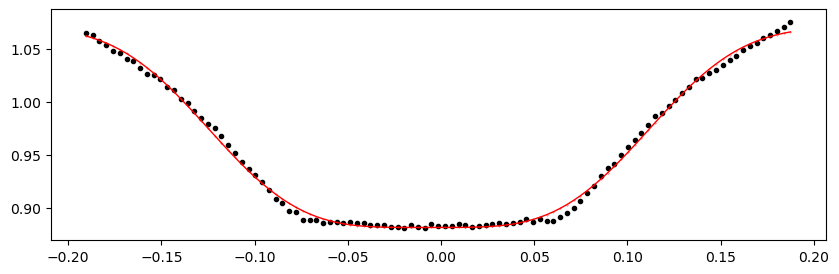

1957.1153935999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.95it/s]


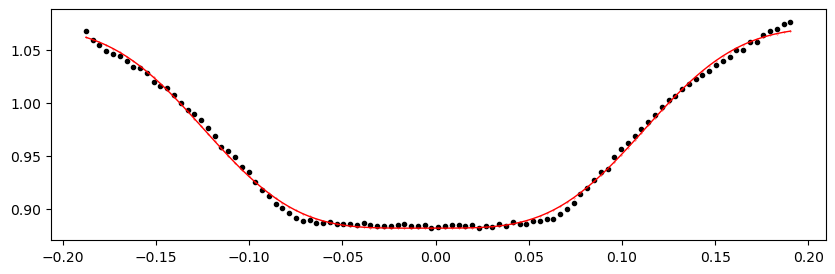

1957.4976247999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.59it/s]


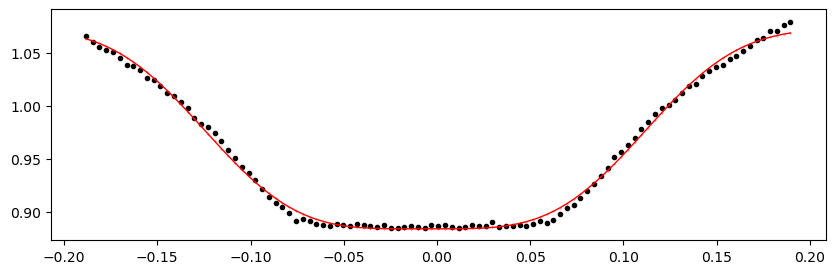

1957.8798559999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.48it/s]


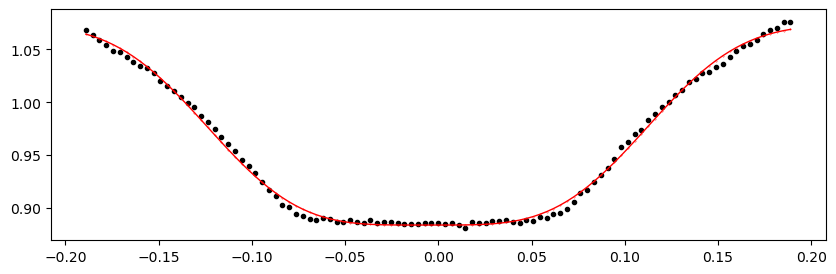

1958.2620872 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.27it/s]


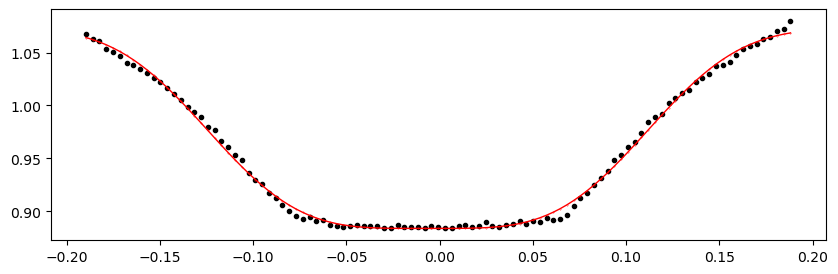

1958.6443184 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.76it/s]


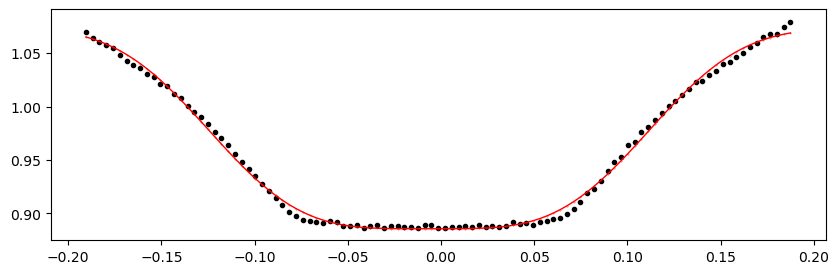

1959.0265496 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.42it/s]


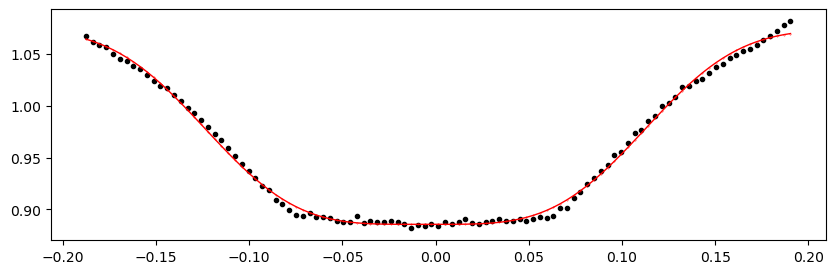

1959.4087808 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.73it/s]


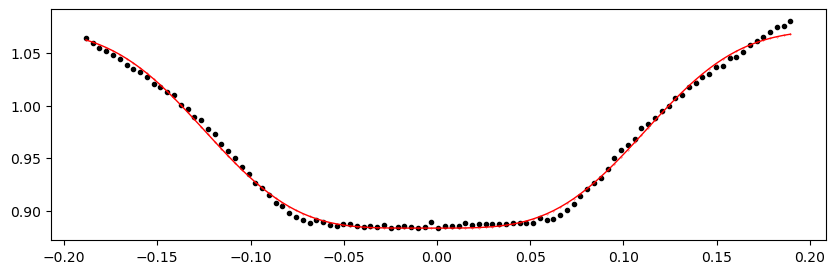

1959.791012 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.64it/s]


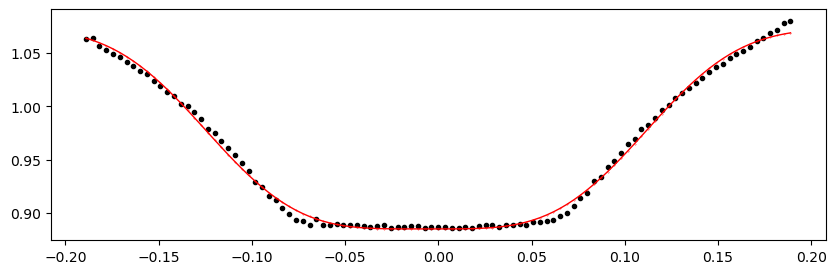

1960.1732432 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.55it/s]


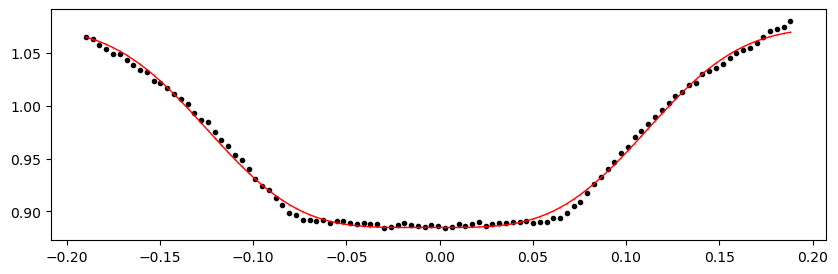

1960.5554743999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.94it/s]


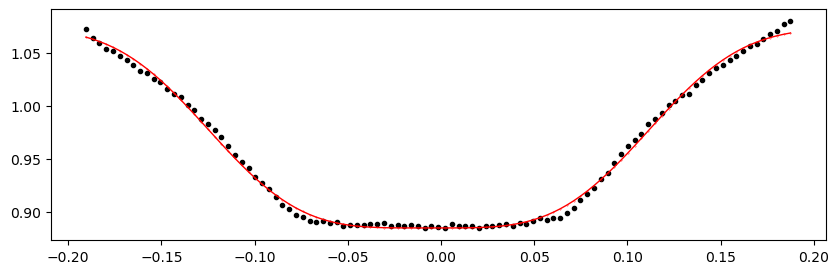

1960.9377055999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.73it/s]


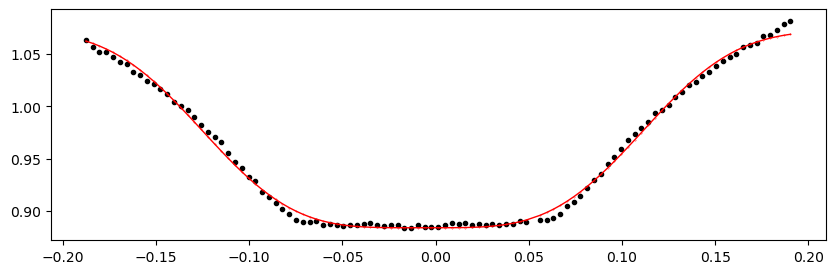

1961.3199367999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.77it/s]


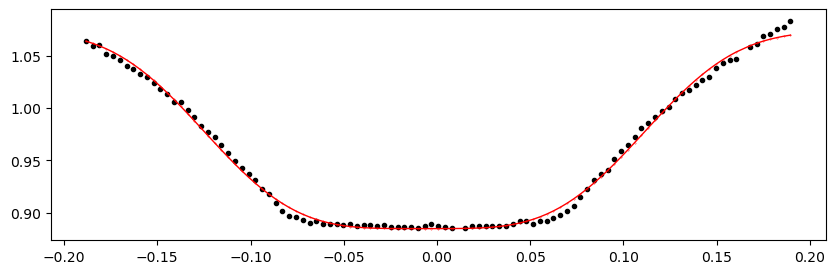

1961.7021679999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.84it/s]


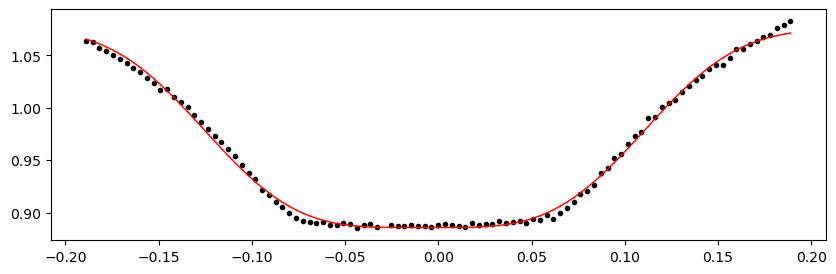

1962.0843992 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.48it/s]


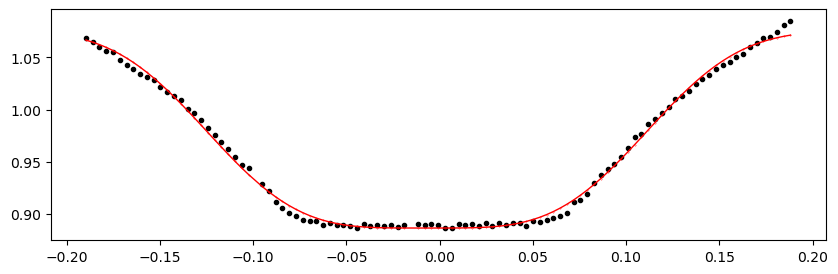

1962.4666304 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.55it/s]


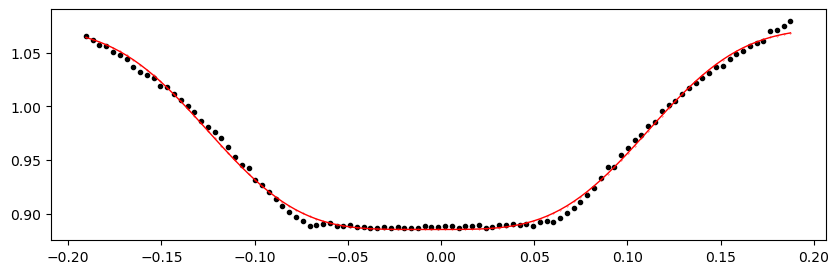

1962.8488616 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.88it/s]


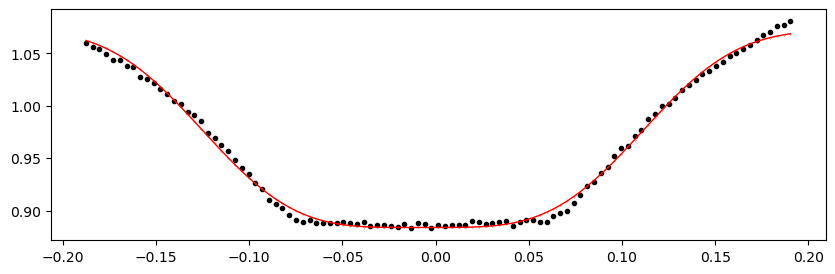

1963.2310928 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.53it/s]


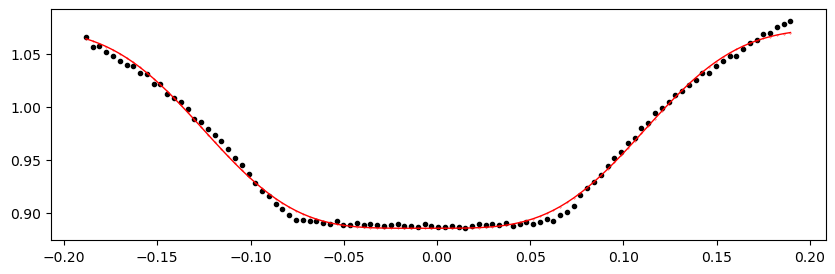

1963.613324 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.80it/s]


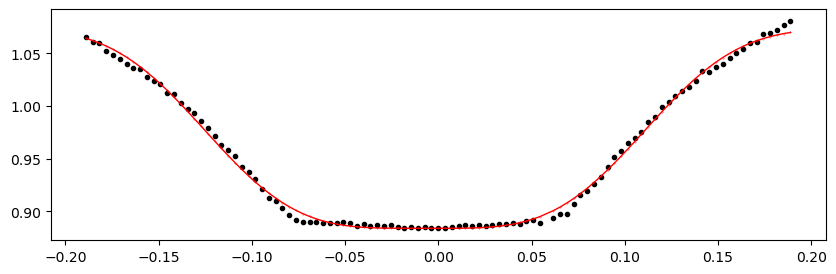

1963.9955552 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.63it/s]


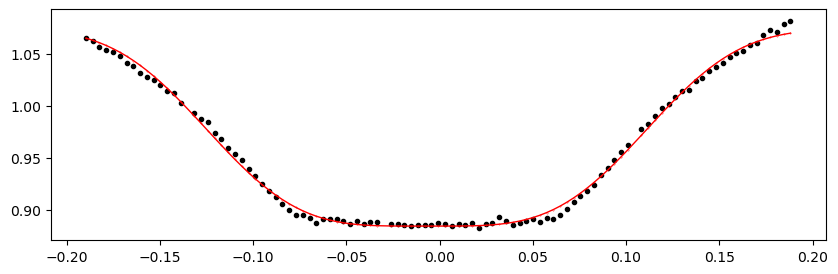

1964.3777863999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.50it/s]


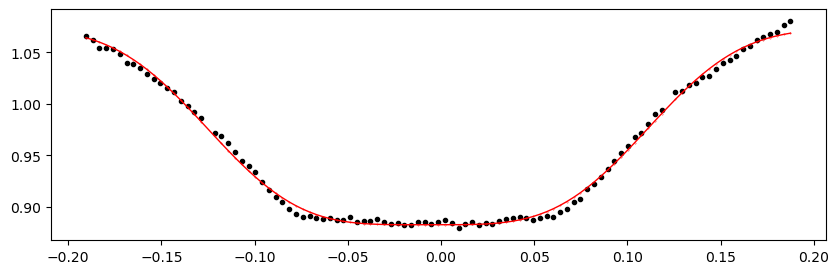

1964.7600175999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.83it/s]


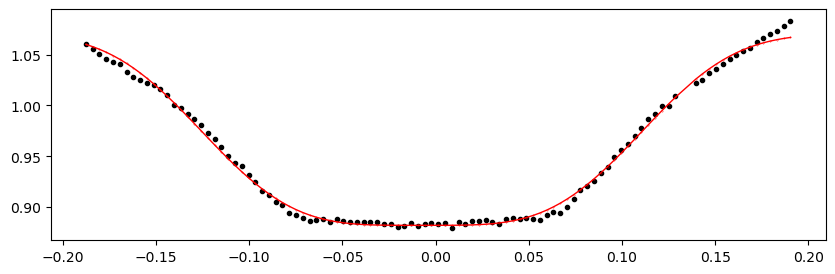

1965.1422487999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.16it/s]


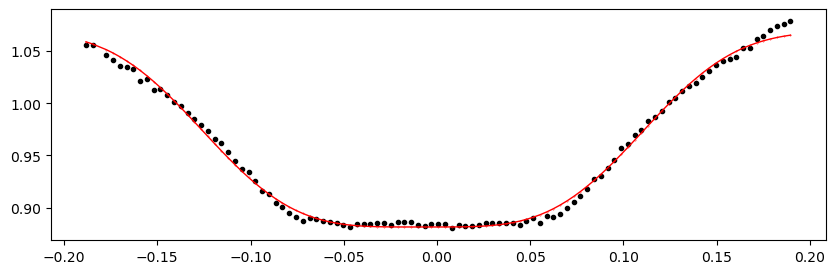

1965.5244799999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.08it/s]


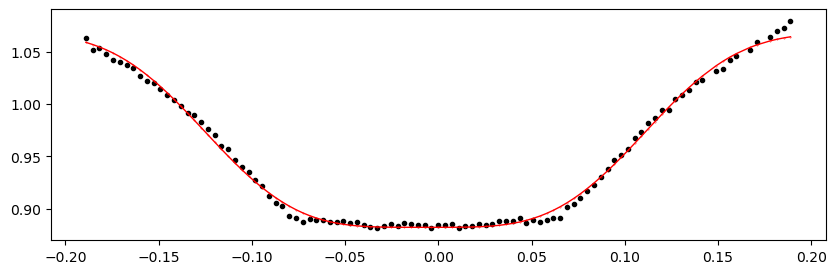

1965.9067111999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 284.71it/s]


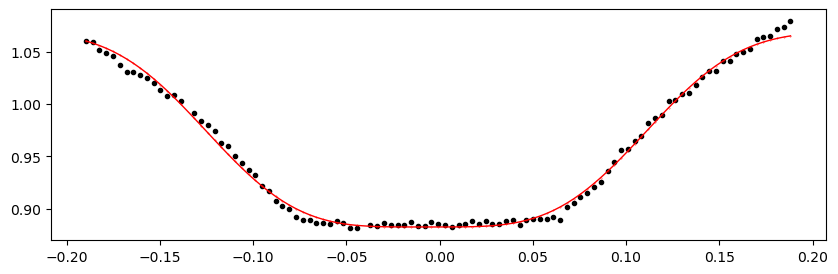

1966.2889424 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.78it/s]


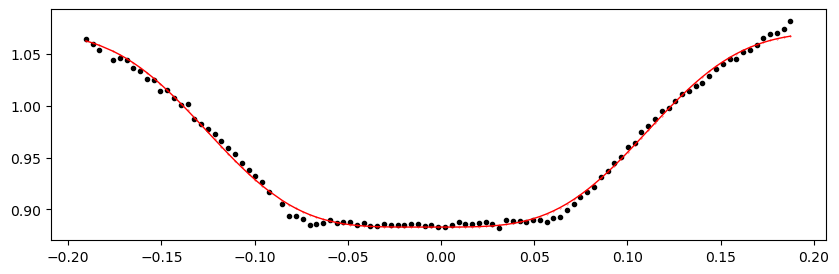

1966.6711736 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.90it/s]


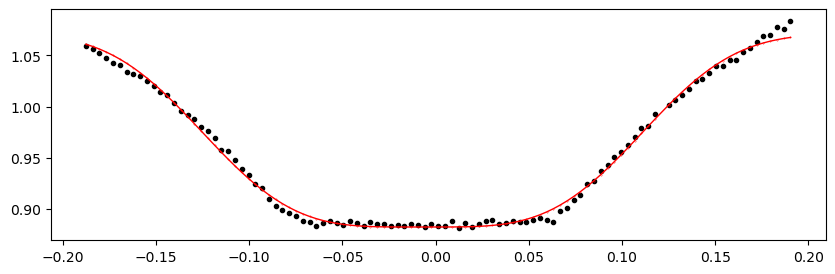

1967.0534048 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.36it/s]


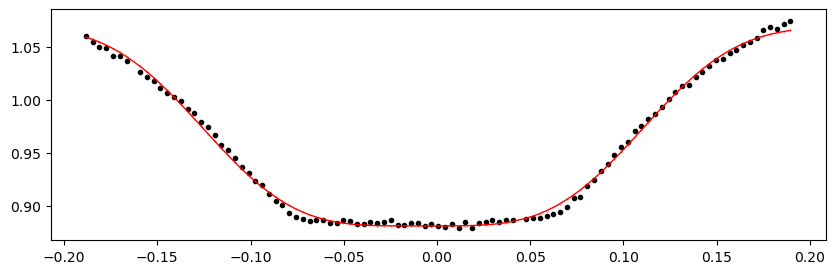

1967.435636 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.87it/s]


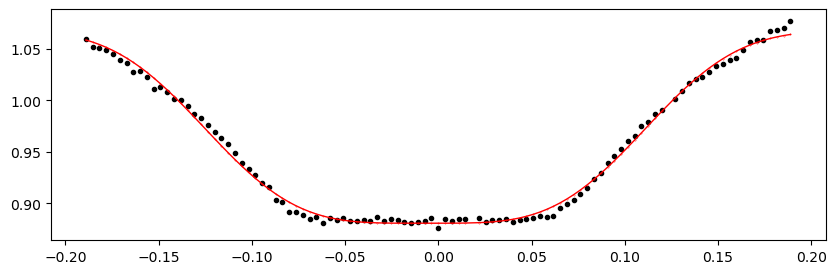

1967.8178672 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.44it/s]


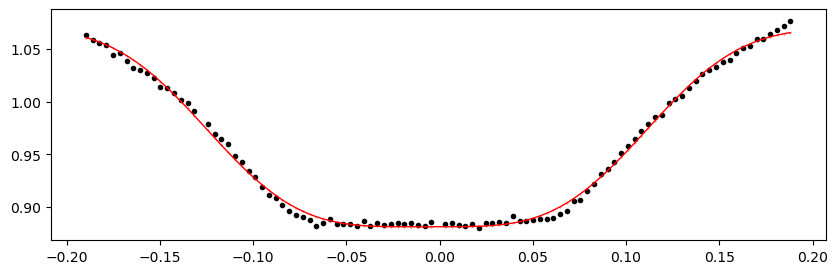

1968.2000984 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.38it/s]


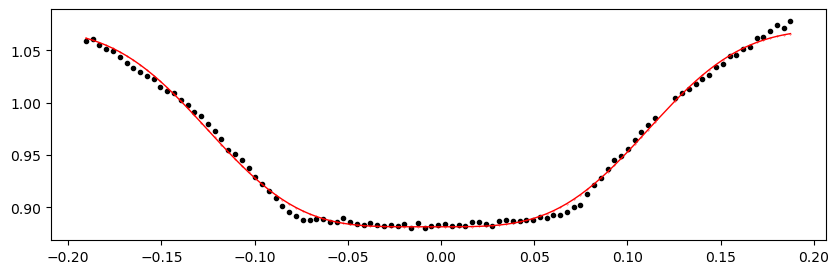

1969.3467919999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.16it/s]


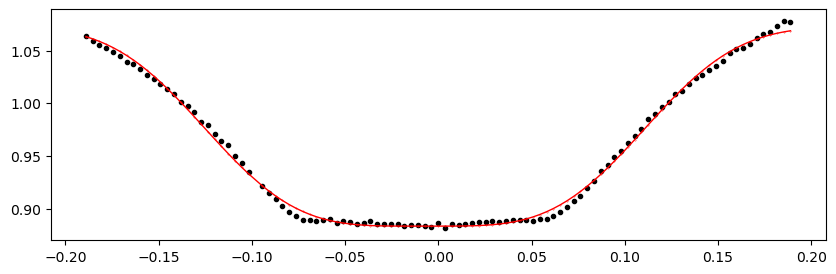

1969.7290231999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.36it/s]


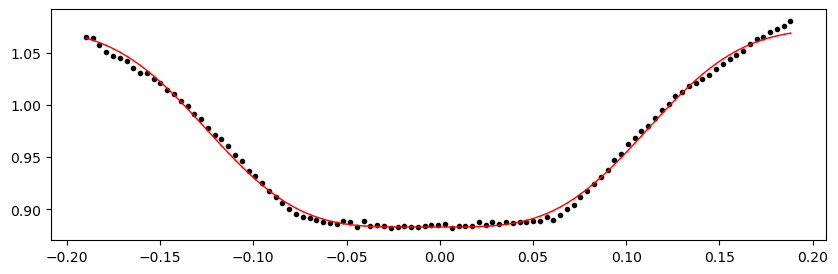

1970.1112544 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.47it/s]


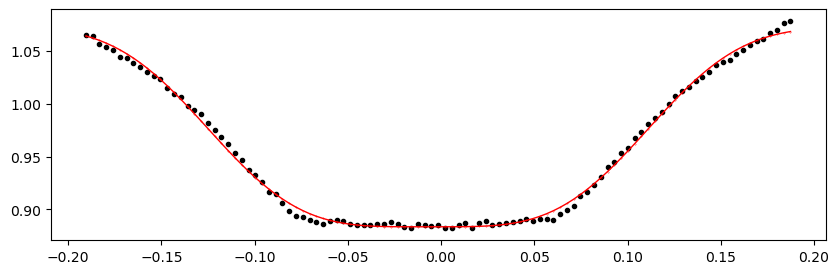

1970.4934856 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.85it/s]


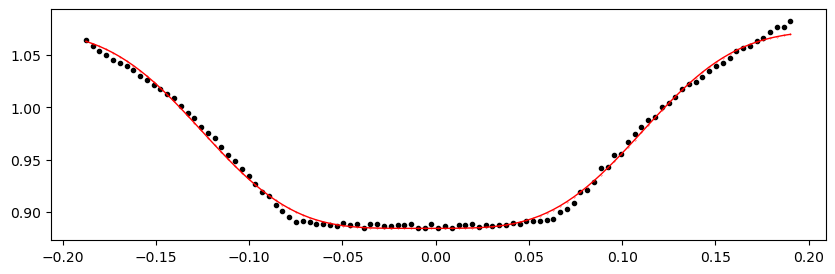

1970.8757168 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.84it/s]


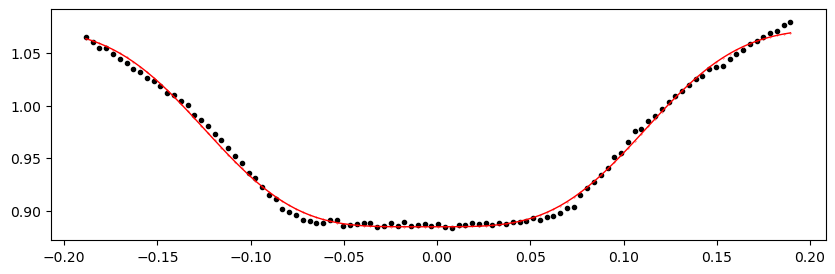

1971.257948 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.23it/s]


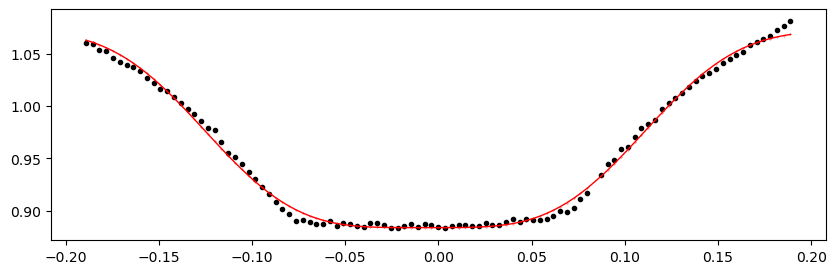

1971.6401792 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.44it/s]


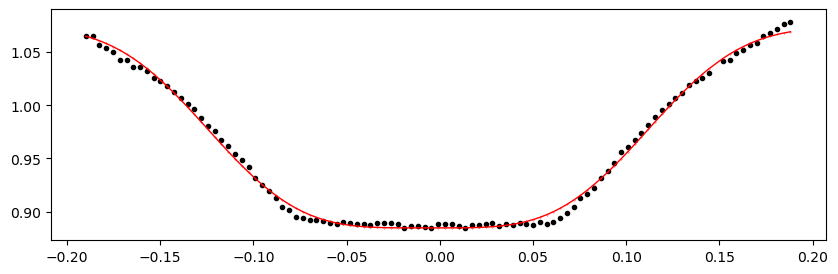

1972.0224104 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 312.84it/s]


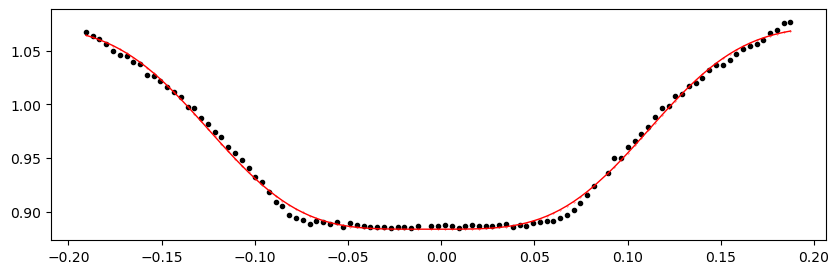

1972.4046415999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.40it/s]


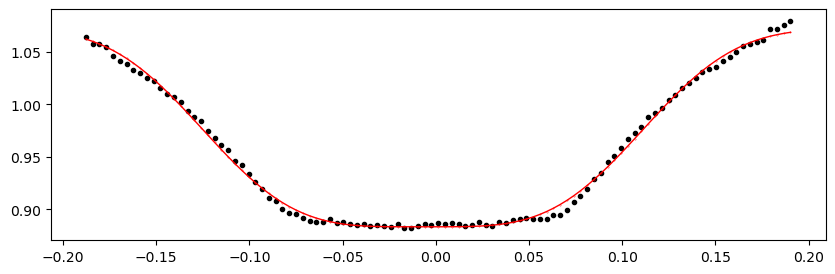

1972.7868727999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.40it/s]


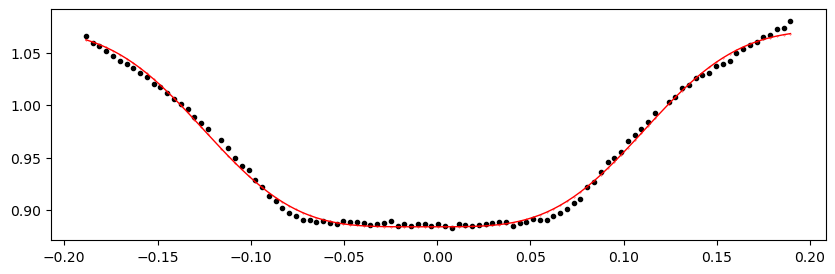

1973.1691039999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.47it/s]


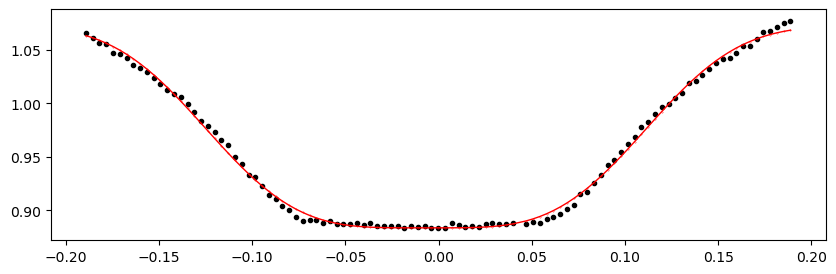

1973.5513351999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.67it/s]


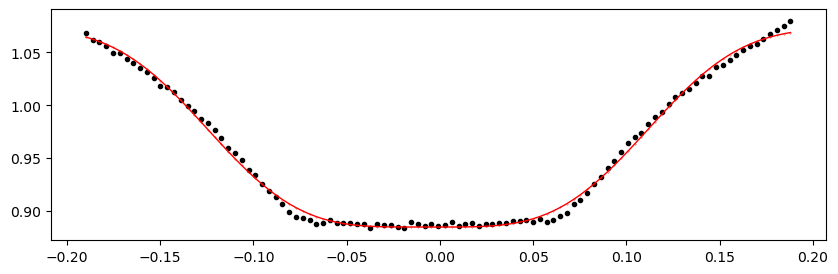

1973.9335663999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 312.54it/s]


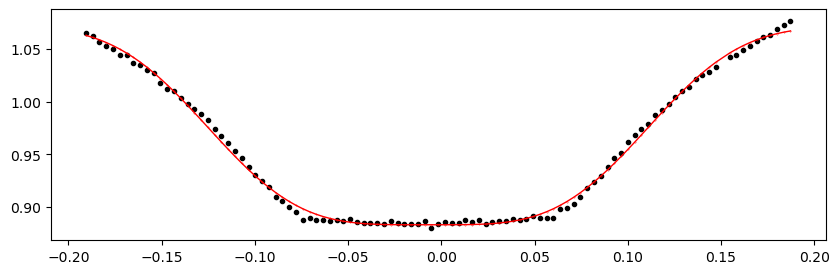

1974.3157976 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.18it/s]


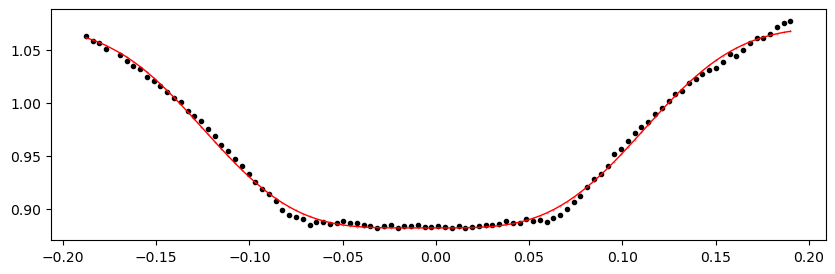

1974.6980288 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.21it/s]


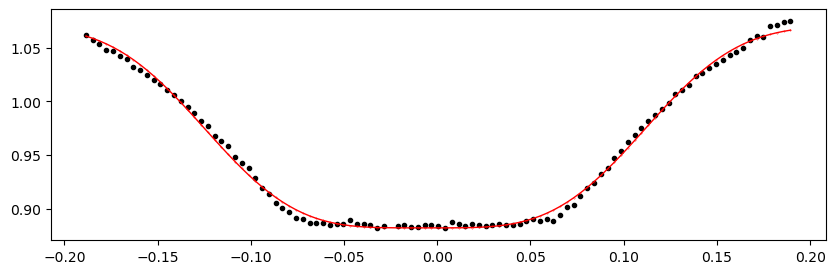

1975.08026 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.87it/s]


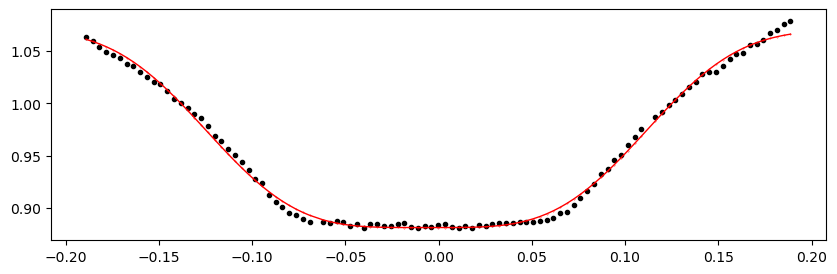

1975.4624912 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.32it/s]


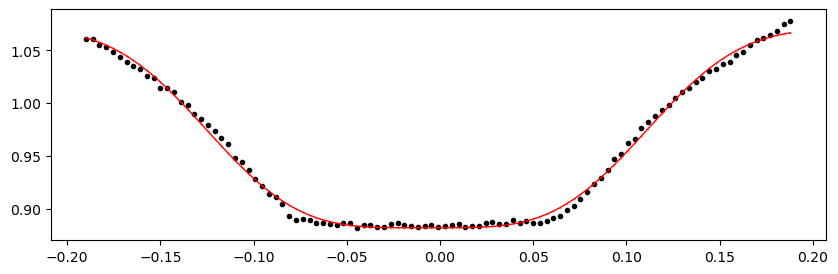

1975.8447224 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.65it/s]


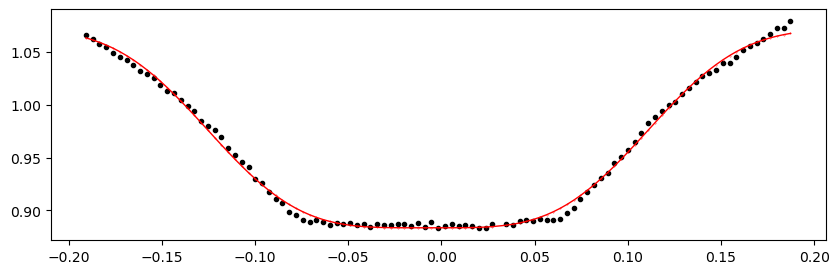

1976.2269536 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.07it/s]


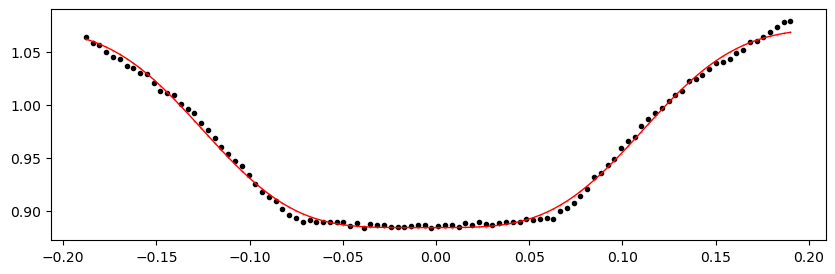

1976.6091847999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.06it/s]


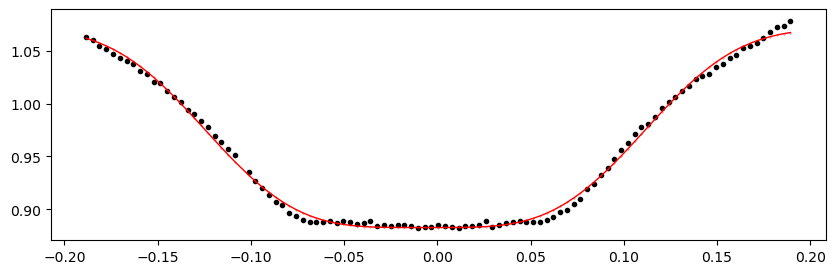

1976.9914159999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.45it/s]


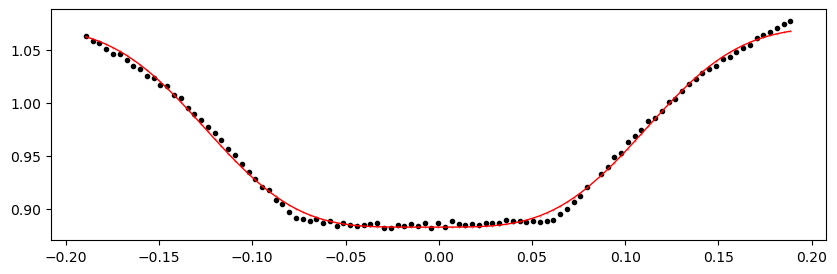

1977.3736471999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.43it/s]


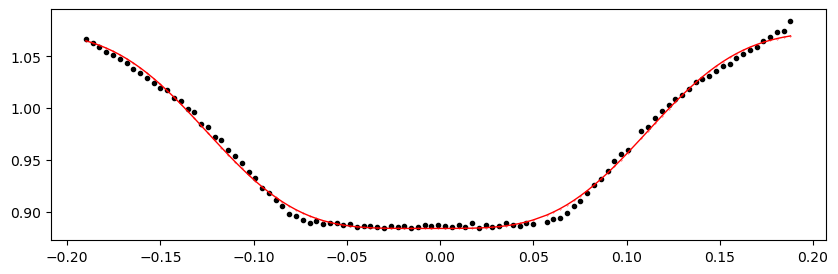

1977.7558783999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.11it/s]


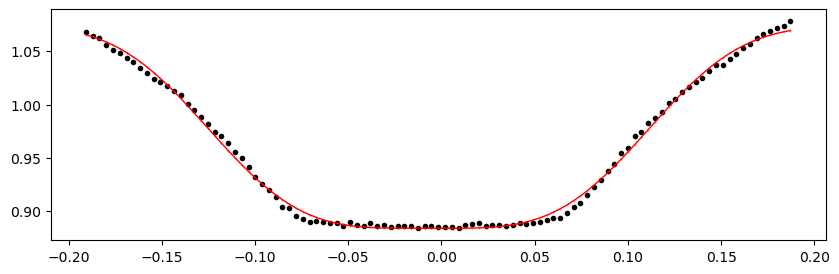

1978.1381096 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.96it/s]


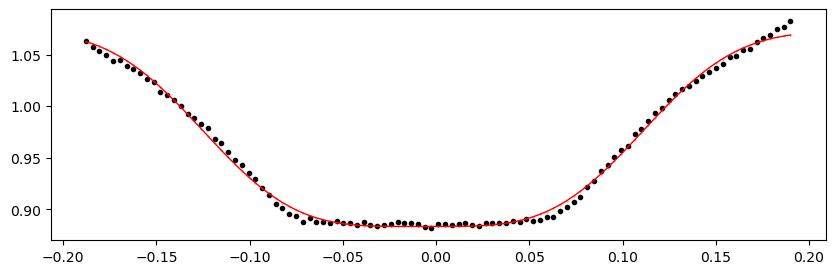

1978.5203408 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.67it/s]


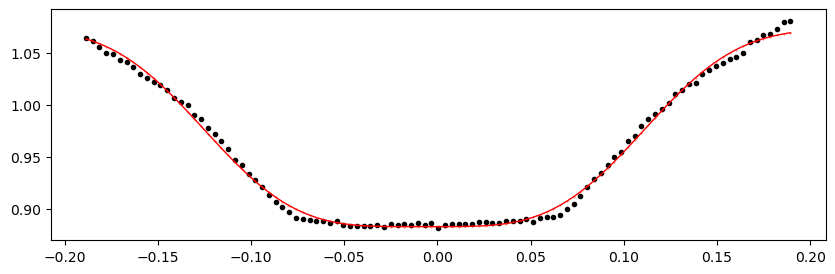

1978.902572 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.22it/s]


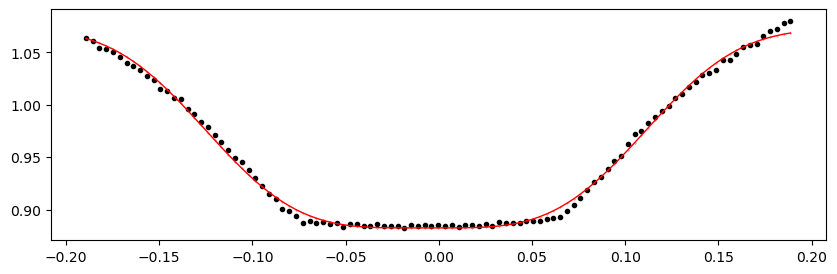

1979.2848032 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.01it/s]


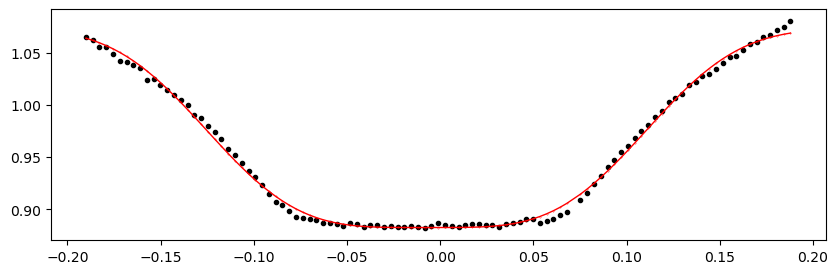

1979.6670344 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.70it/s]


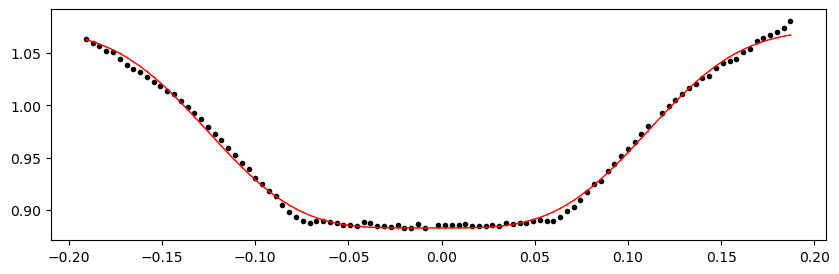

1980.0492656 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.46it/s]


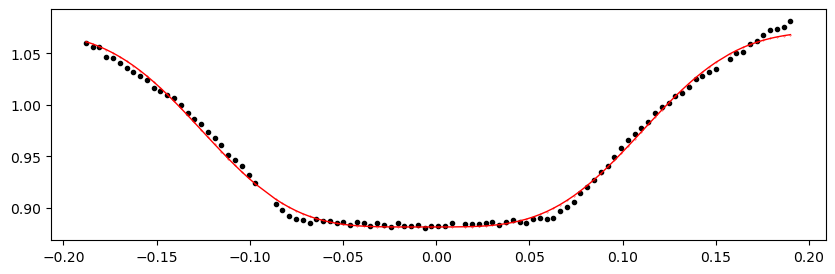

1980.4314967999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.13it/s]


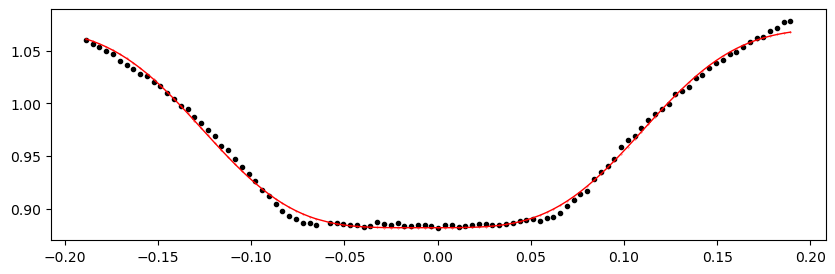

1980.8137279999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.74it/s]


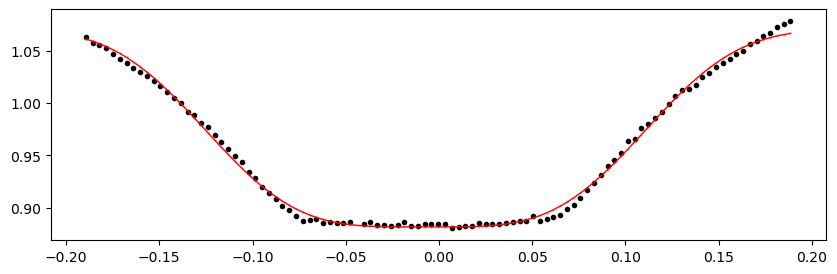

1981.1959591999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.20it/s]


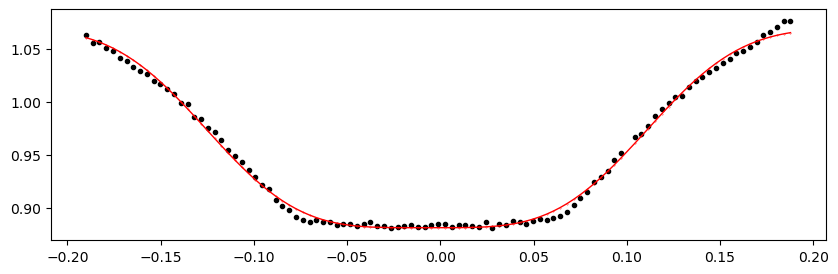

1981.5781903999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.92it/s]


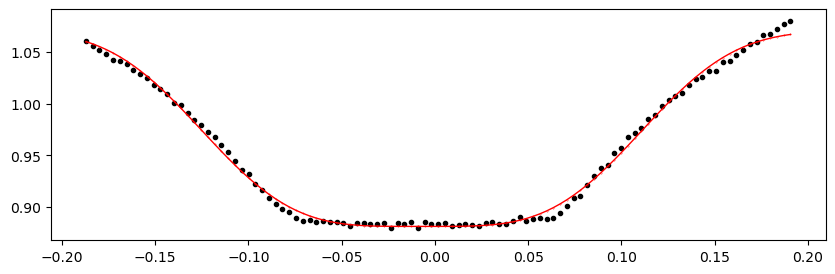

1981.9604215999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.79it/s]


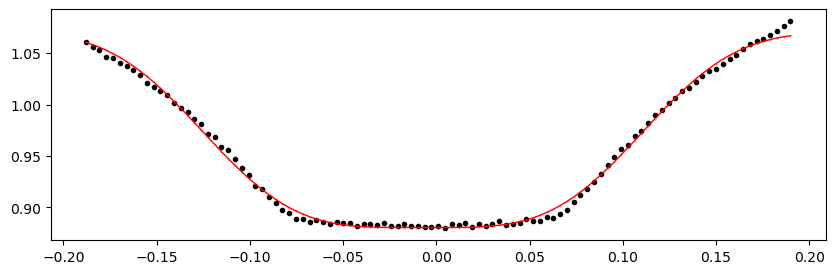

Time 1982.3426528 does not have enough data points: 10
1983.8715776 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.34it/s]


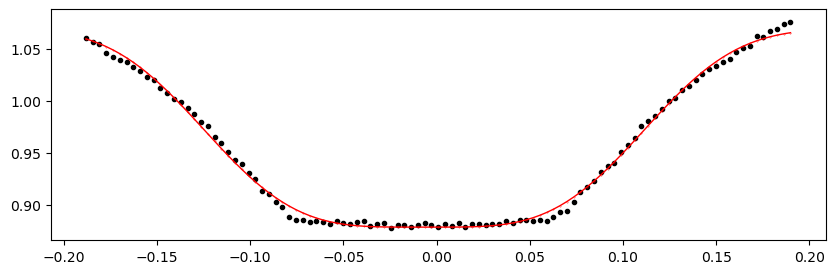

1984.2538088 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 303.35it/s]


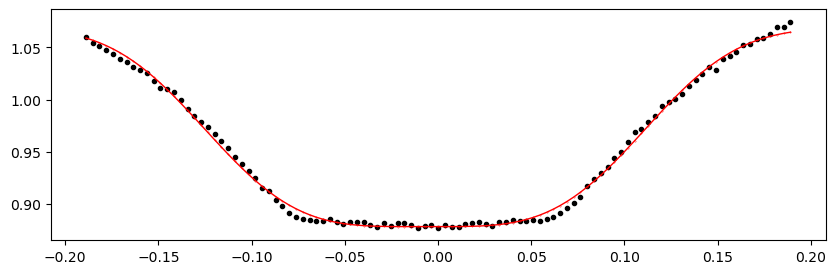

1984.6360399999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.81it/s]


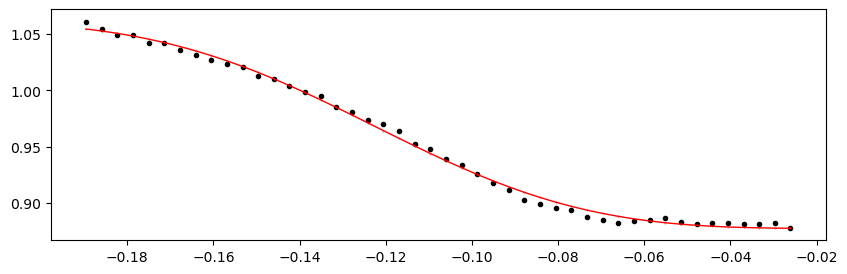

1988.0761208 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 272.58it/s]


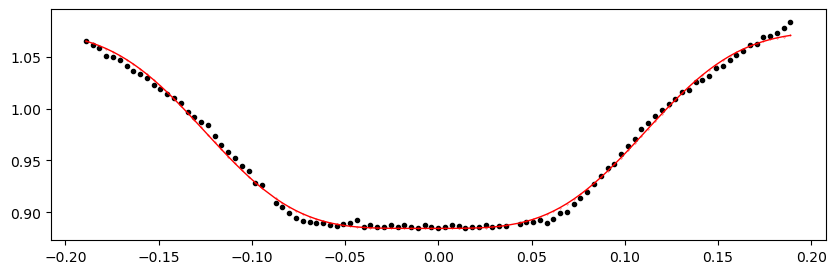

1988.4583519999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 312.04it/s]


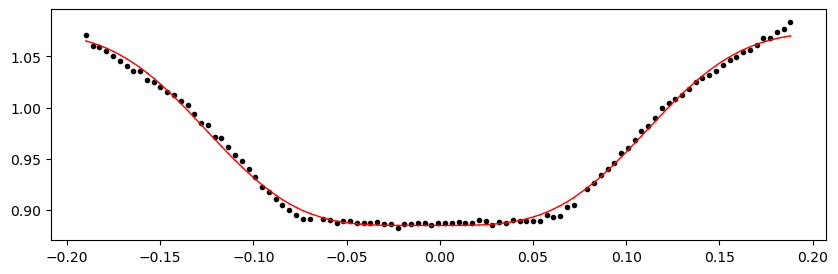

1988.8405831999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 306.11it/s]


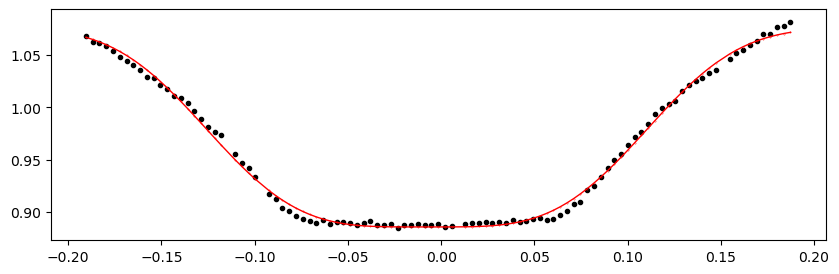

1989.2228143999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.56it/s]


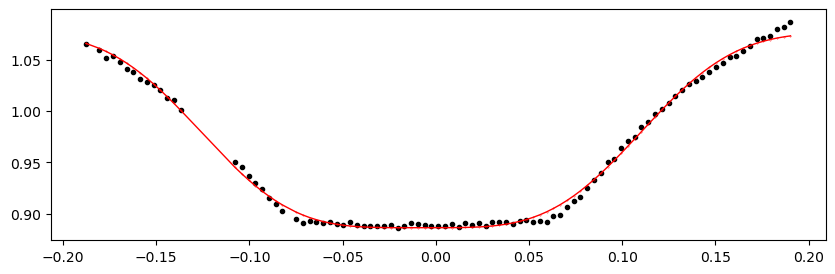

1989.6050455999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.02it/s]


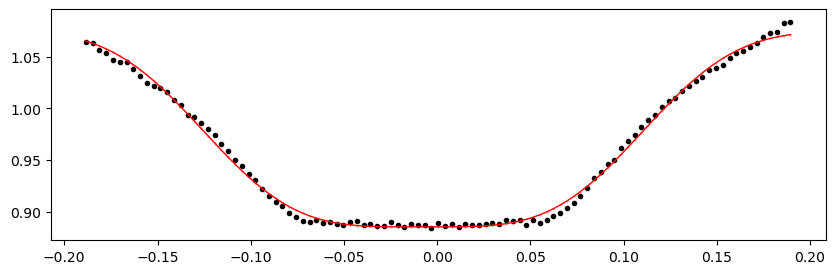

1989.9872767999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.35it/s]


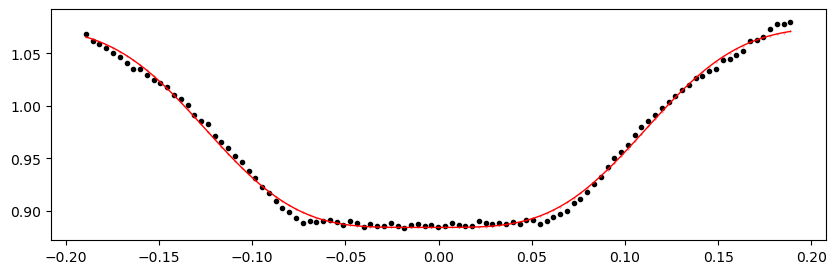

1990.369508 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 299.01it/s]


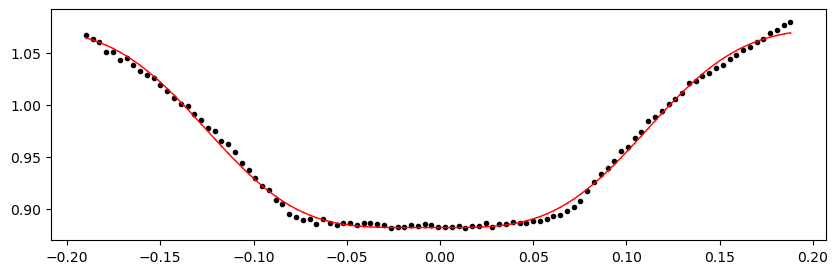

1990.7517392 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 322.19it/s]


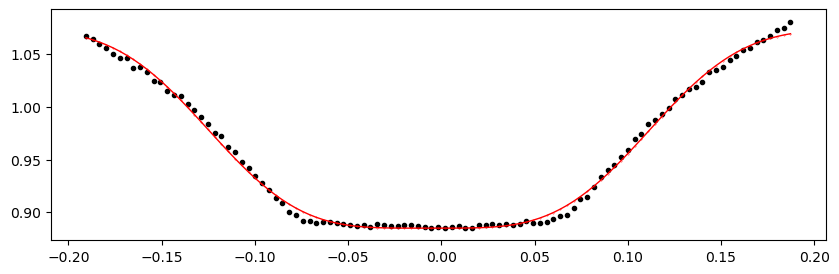

1991.1339704 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 292.13it/s]


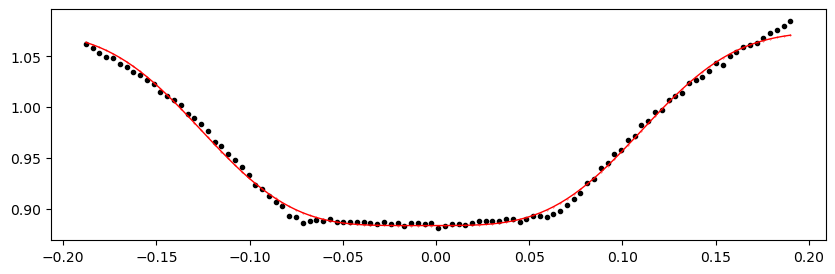

1991.5162016 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.70it/s]


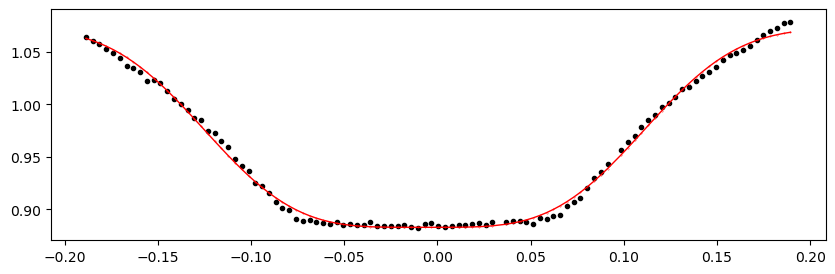

1991.8984328 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.69it/s]


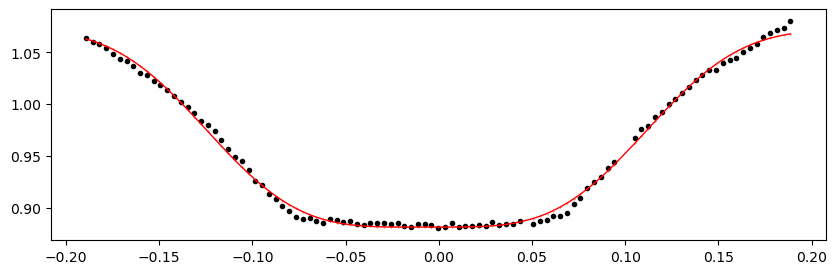

1992.280664 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 293.60it/s]


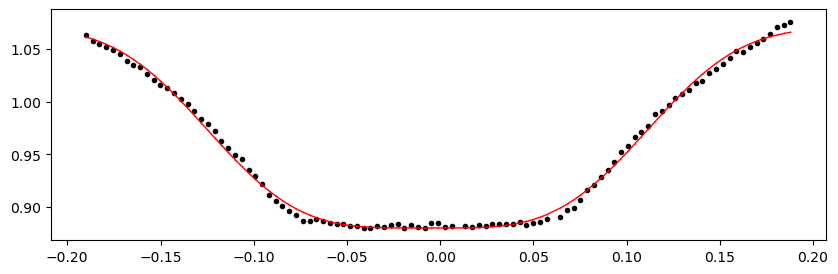

1992.6628951999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 258.01it/s]


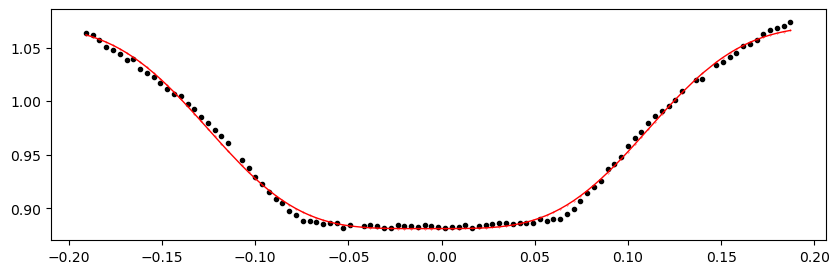

1993.0451263999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.57it/s]


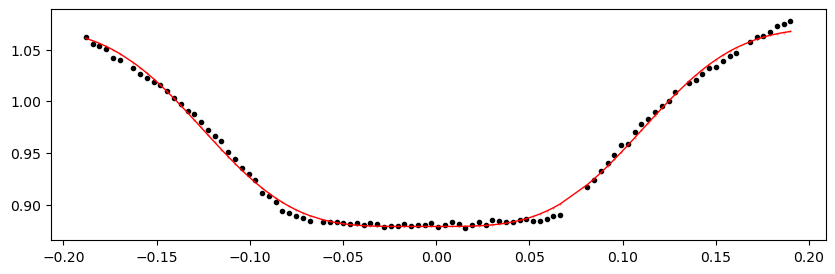

1993.4273575999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.67it/s]


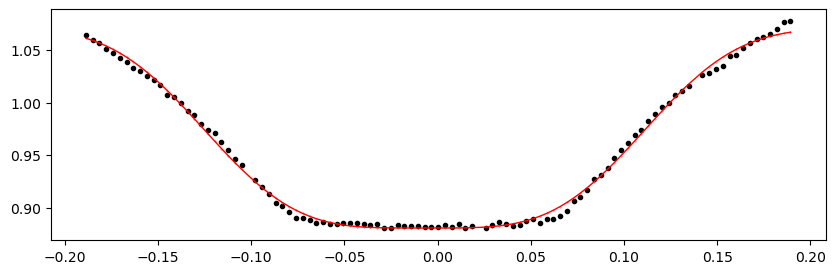

1993.8095887999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.48it/s]


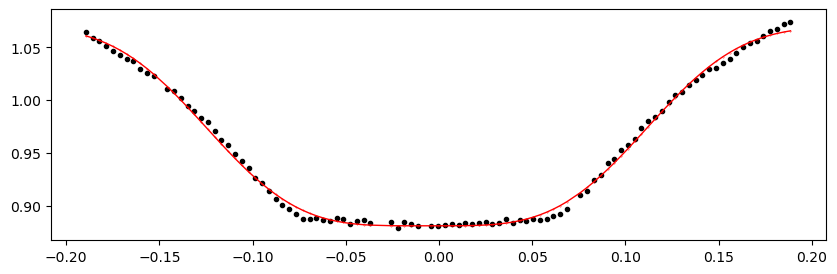

1994.19182 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.37it/s]


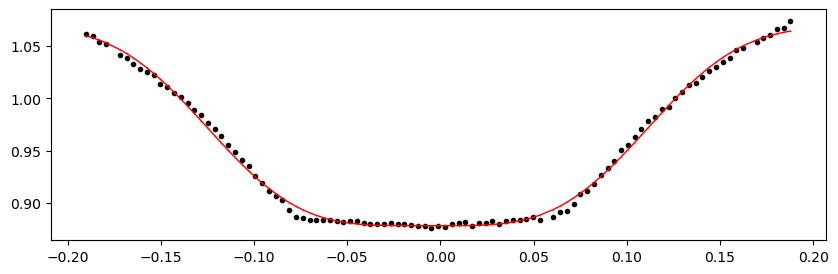

1994.5740512 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 302.03it/s]


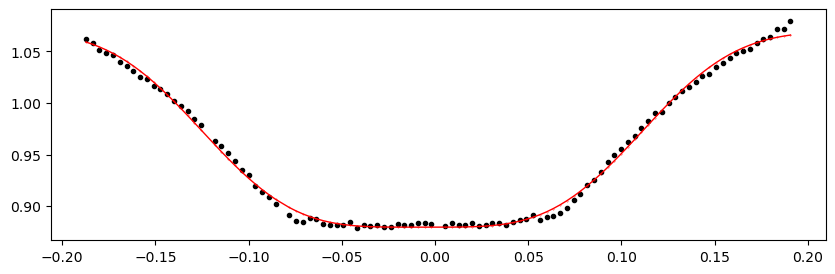

1994.9562824 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 300.80it/s]


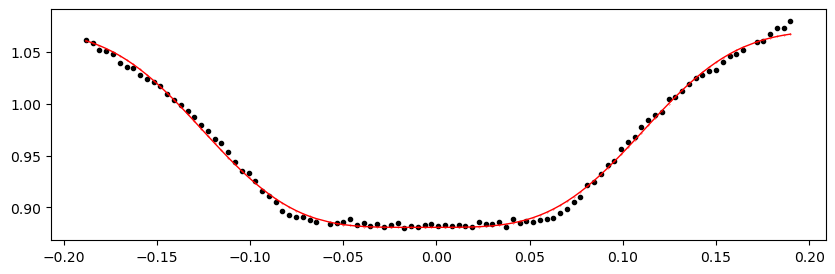

1995.3385136 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 296.34it/s]


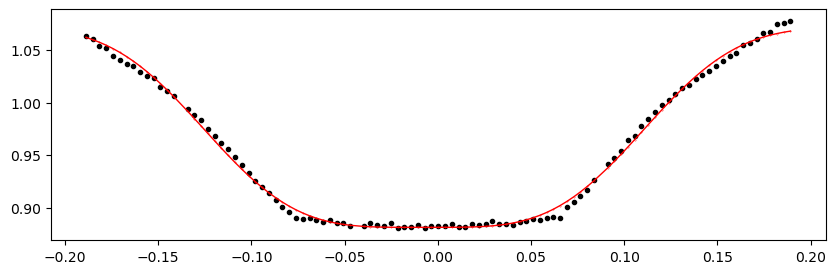

Time 1996.8674383999999 does not have enough data points: 14
1997.2496695999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 303.91it/s]


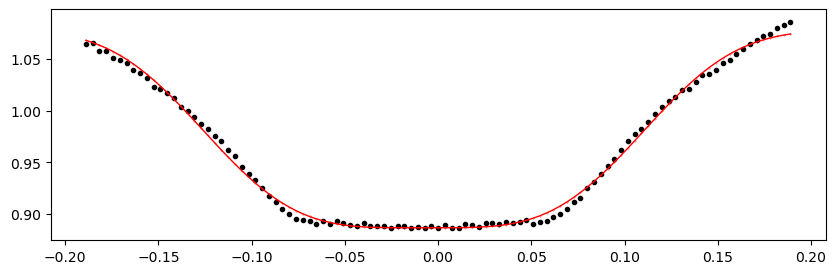

1997.6319007999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 296.95it/s]


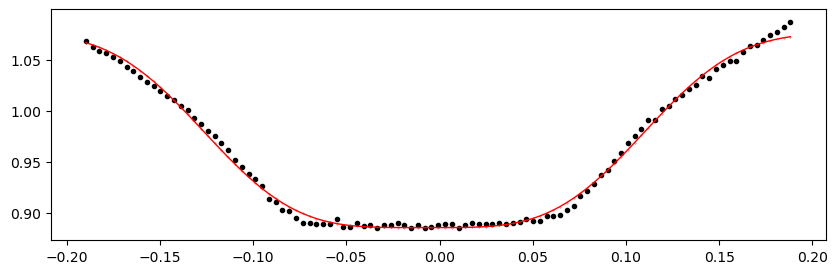

2001.4542127999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 283.86it/s]


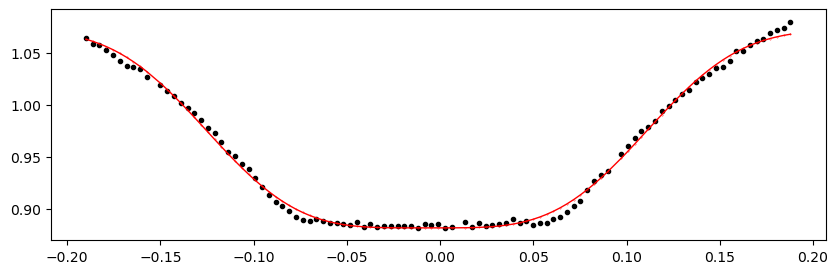

2001.8364439999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 277.33it/s]


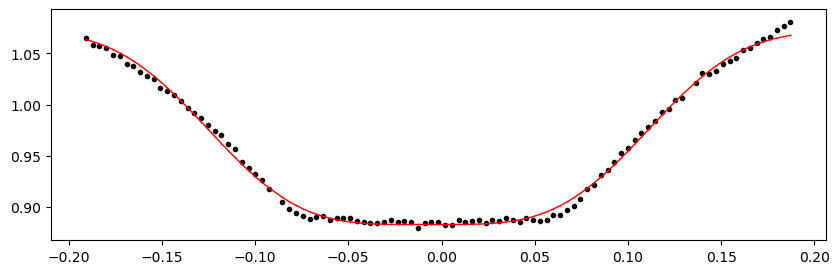

2002.2186752 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 275.93it/s]


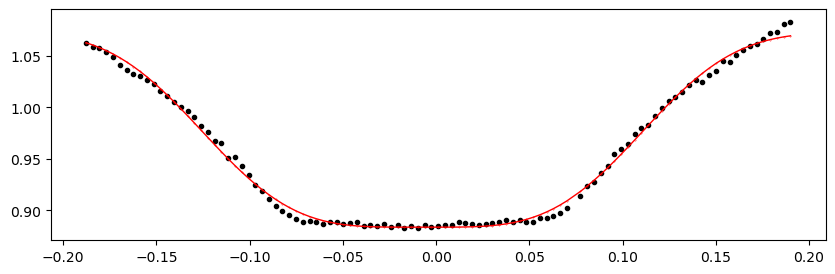

2002.6009064 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 276.96it/s]


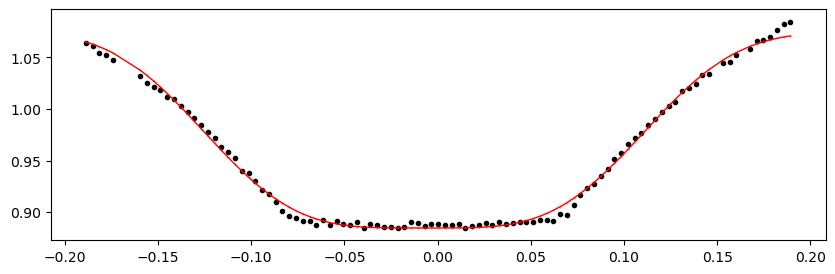

2002.9831376 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 274.11it/s]


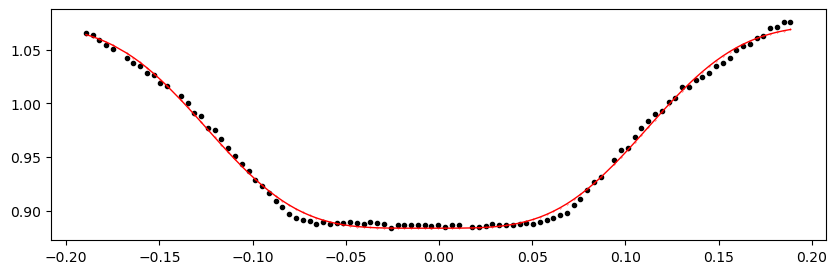

2003.3653688 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 274.20it/s]


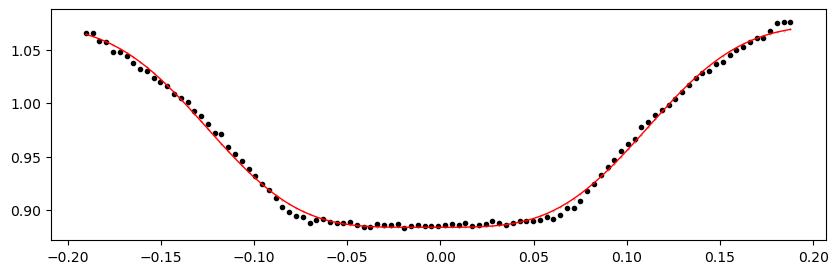

2003.7476 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 276.82it/s]


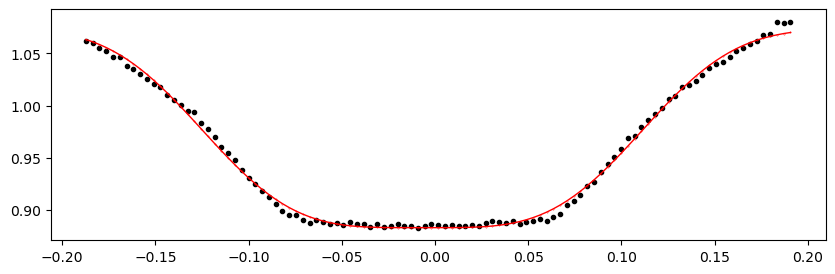

2004.1298312 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 266.51it/s]


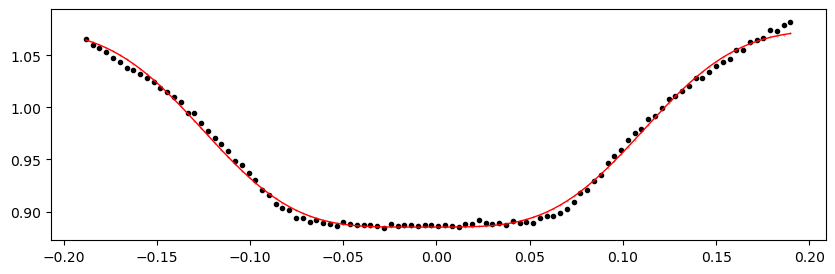

2004.5120623999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 279.41it/s]


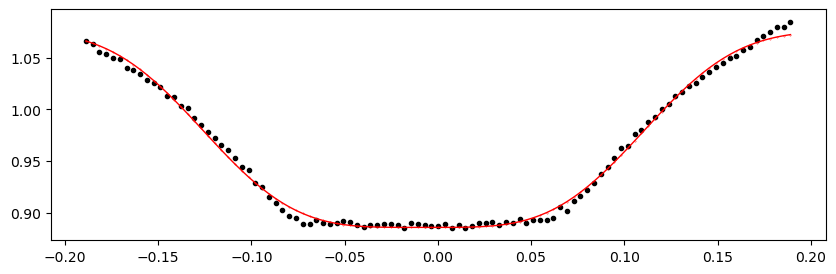

2004.8942935999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 269.65it/s]


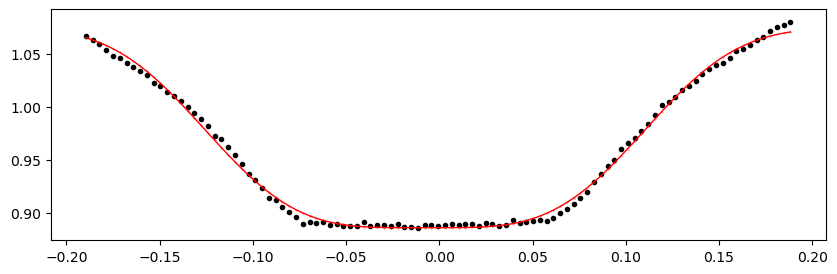

2005.2765247999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 308.57it/s]


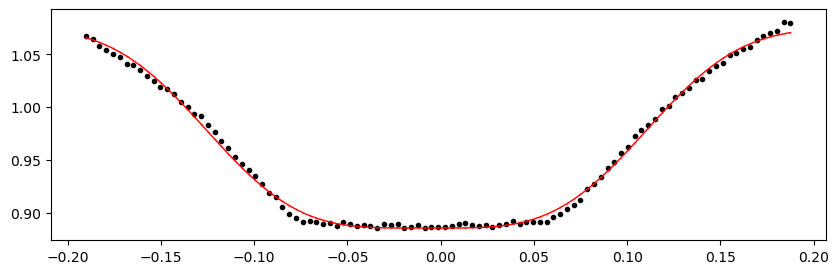

2005.6587559999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 301.14it/s]


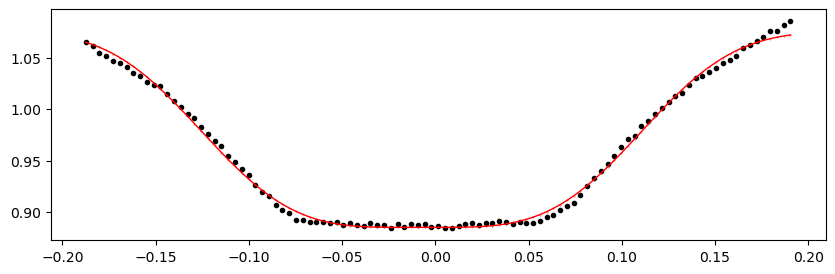

2006.0409871999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.92it/s]


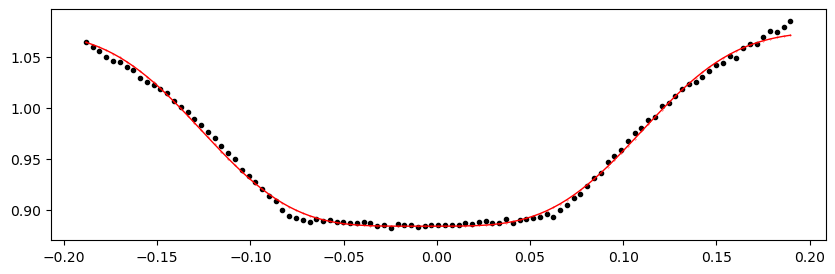

2006.4232184 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.80it/s]


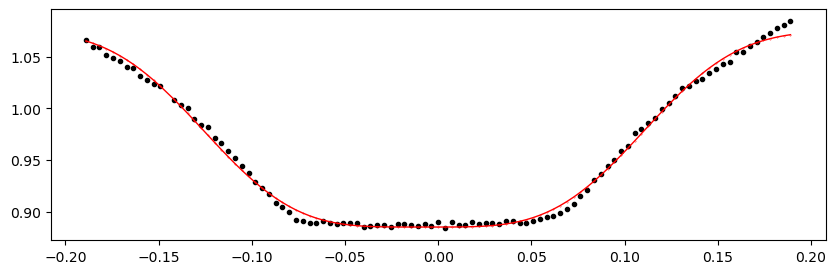

2006.8054496 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.41it/s]


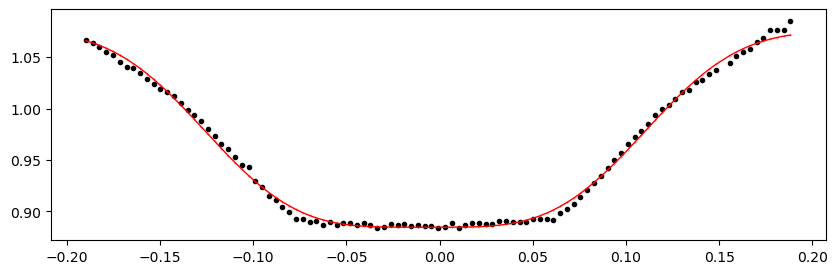

2007.1876808 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.85it/s]


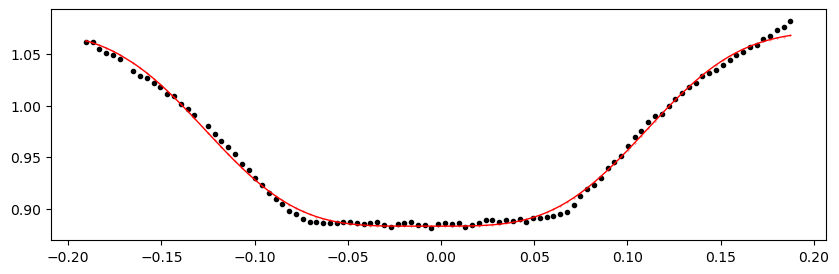

2007.569912 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.88it/s]


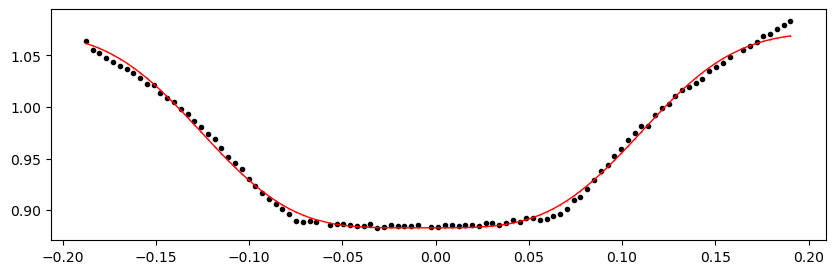

2007.9521432 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.40it/s]


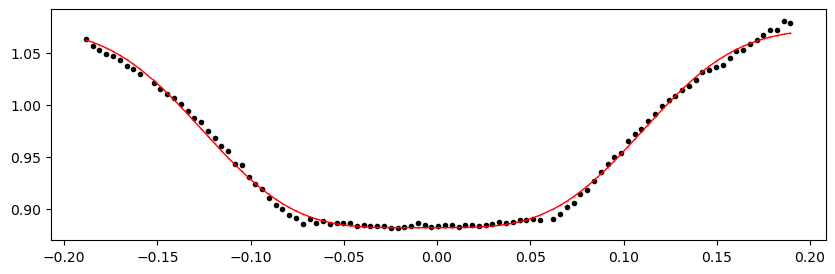

2008.3343744 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.16it/s]


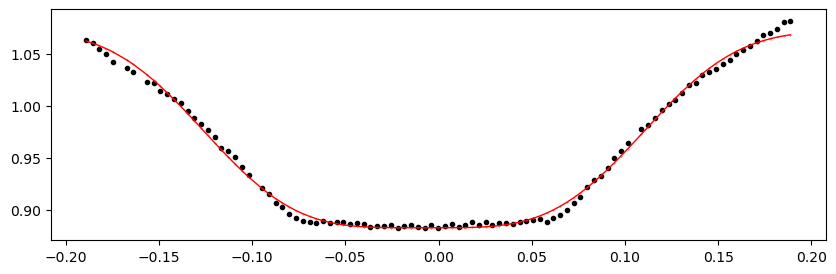

2008.7166055999999 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.07it/s]


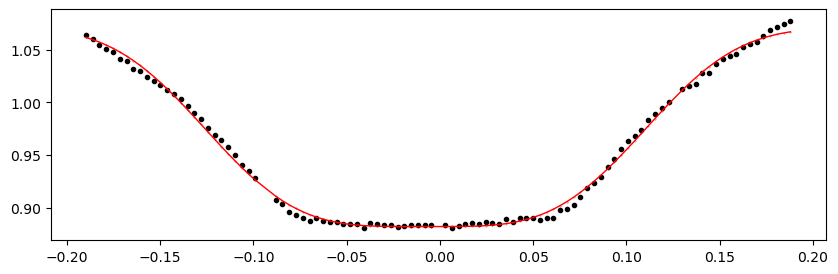

2009.0988367999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.17it/s]


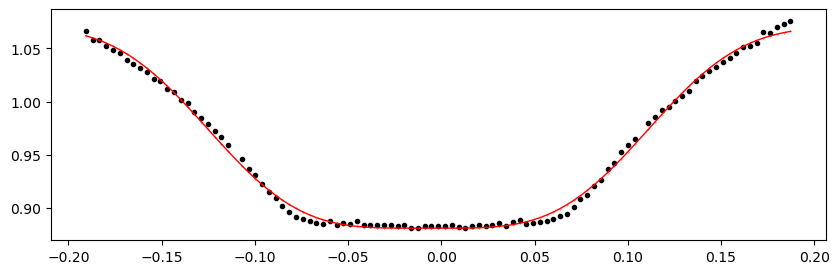

Time 2696.3505344 does not have enough data points: 8
Time 2696.7327655999998 does not have enough data points: 17
Time 2697.1149968 does not have enough data points: 6
2697.4972279999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.53it/s]


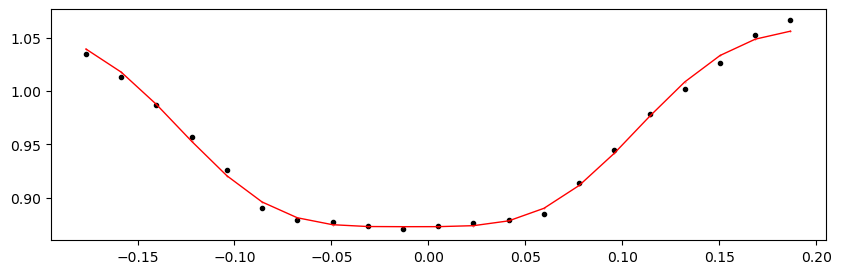

2697.8794592 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.48it/s]


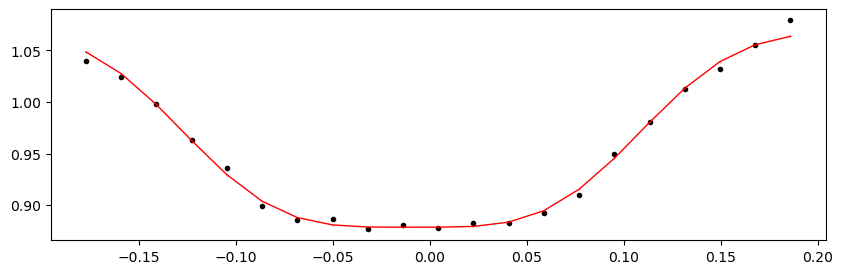

2698.2616903999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 285.56it/s]


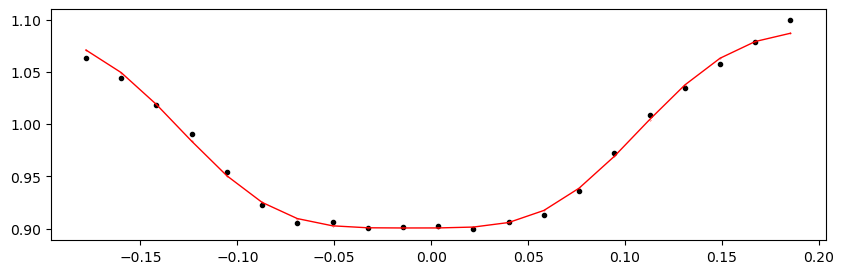

2698.6439216 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.36it/s]


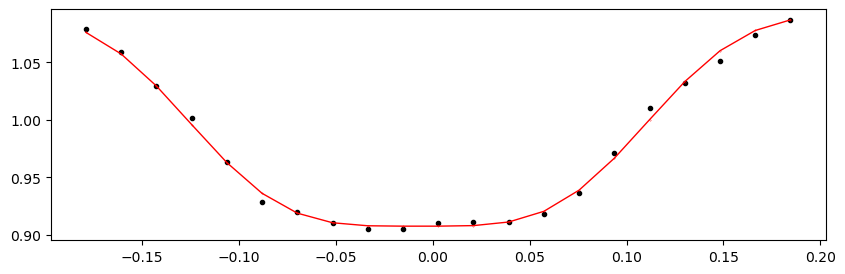

2699.0261528 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 289.31it/s]


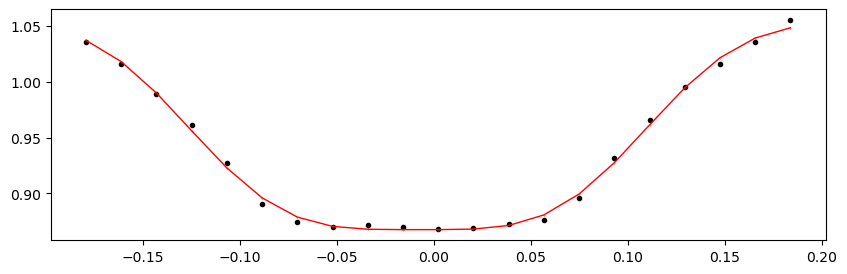

2699.408384 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.55it/s]


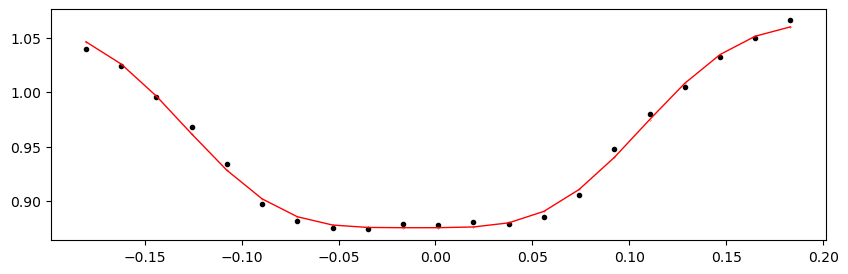

2699.7906152 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.26it/s]


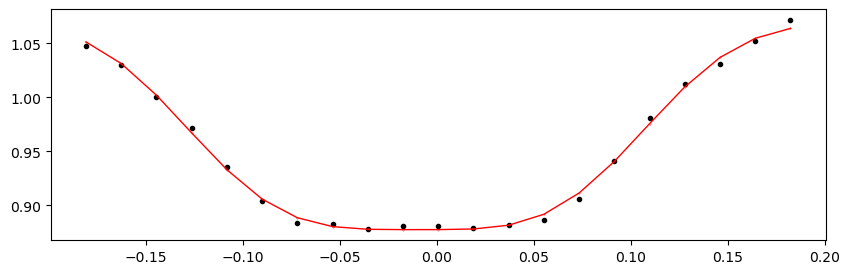

2700.1728464 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.52it/s]


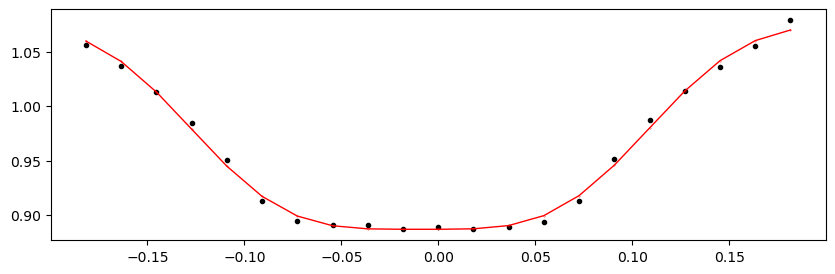

2700.5550776 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.10it/s]


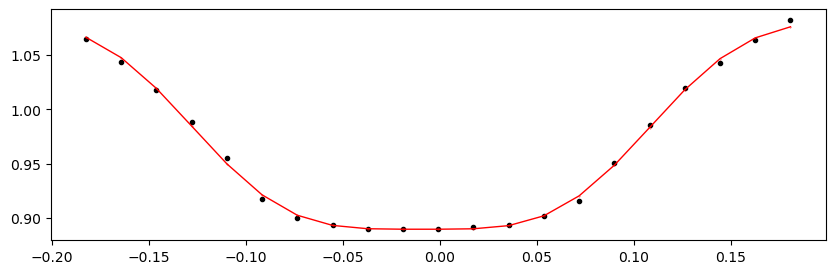

2700.9373087999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.34it/s]


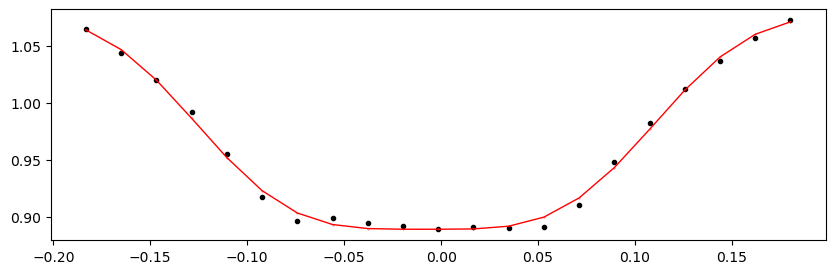

2701.31954 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.08it/s]


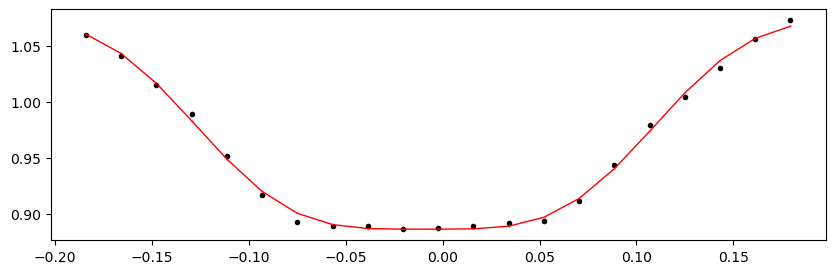

2701.7017711999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.62it/s]


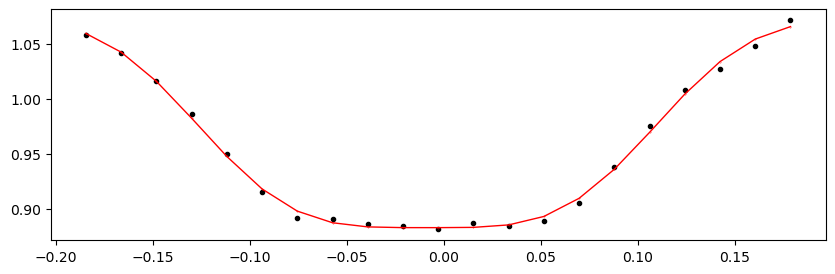

2702.0840024 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.67it/s]


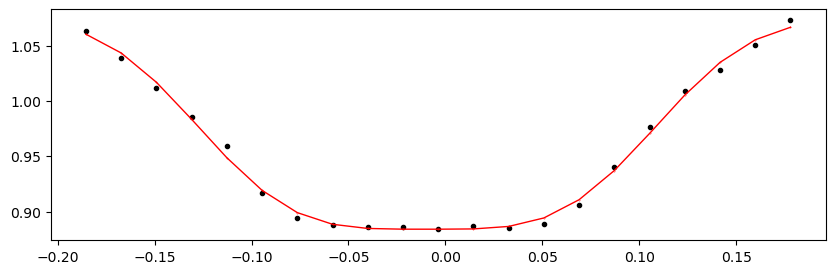

2702.4662336 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.63it/s]


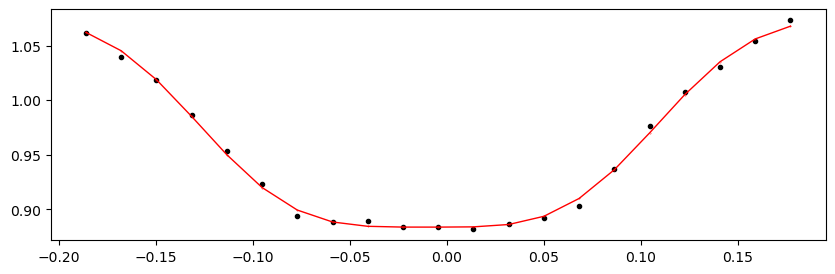

2702.8484648 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.84it/s]


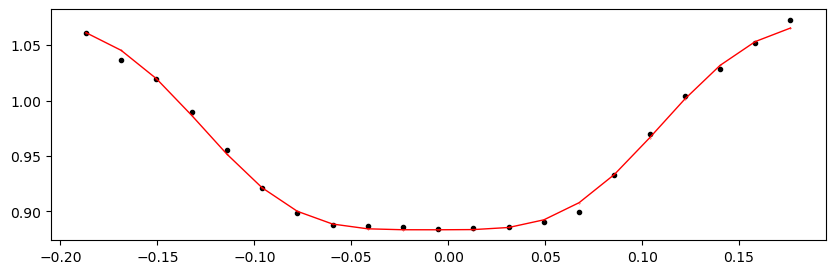

2703.2306959999996 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.26it/s]


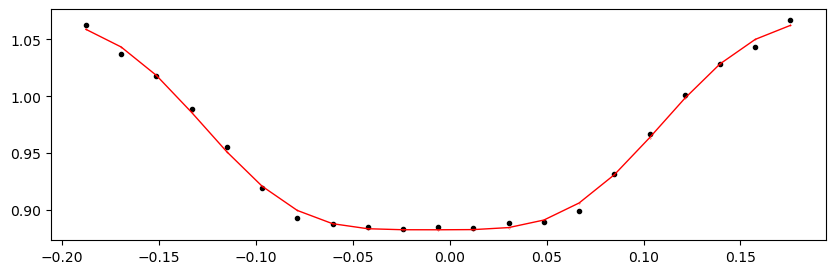

2703.6129272 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.09it/s]


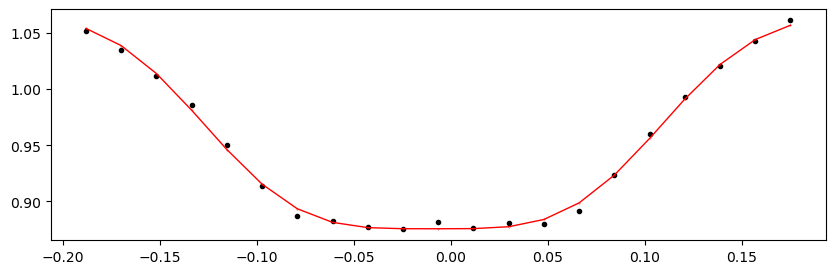

2703.9951584 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.38it/s]


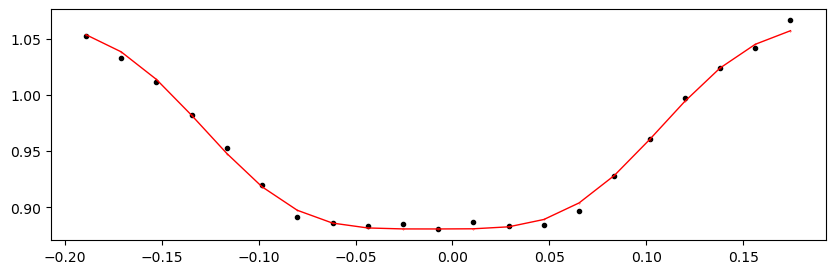

2704.3773896 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.08it/s]


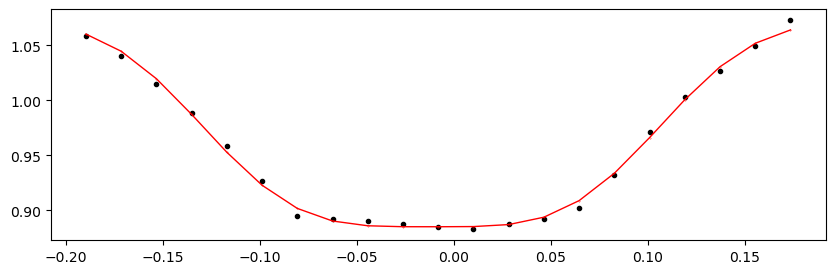

Time 2704.7596208 does not have enough data points: 2
Time 2710.1108575999997 does not have enough data points: 12
2710.4930888 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 263.25it/s]


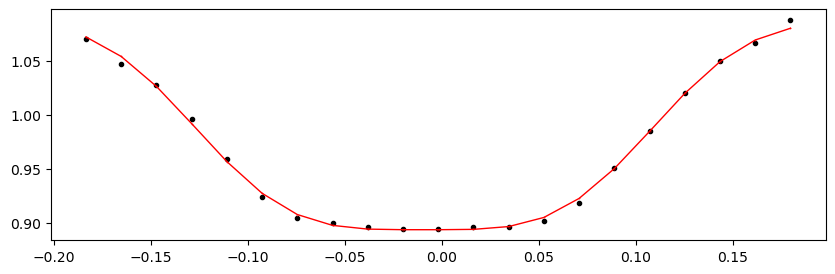

2710.87532 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.94it/s]


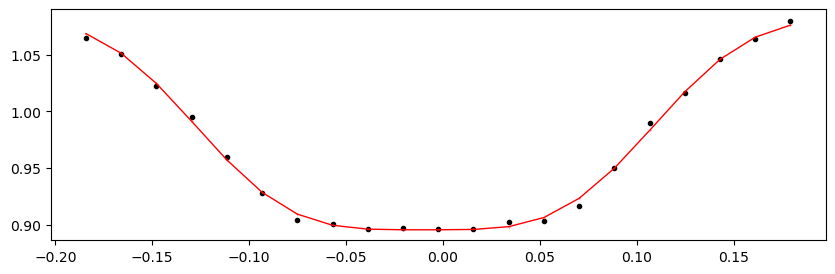

2711.2575512 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.47it/s]


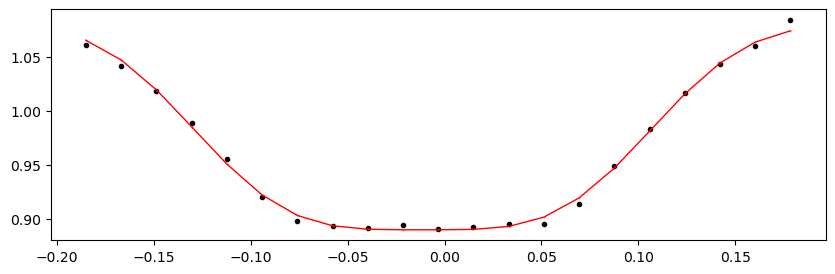

Time 2711.6397823999996 does not have enough data points: 17
2712.0220136 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.09it/s]


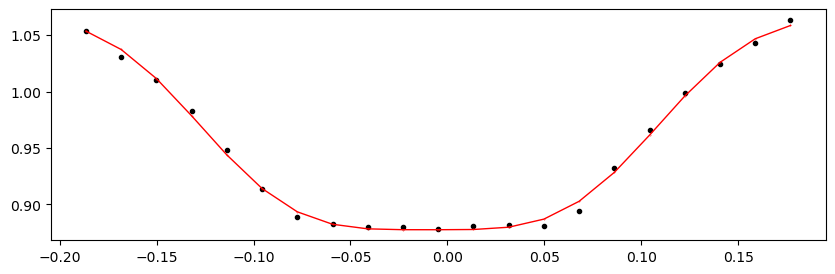

2712.4042448 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.12it/s]


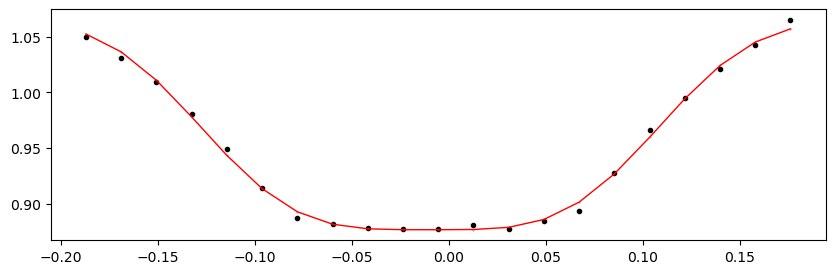

2712.7864759999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.98it/s]


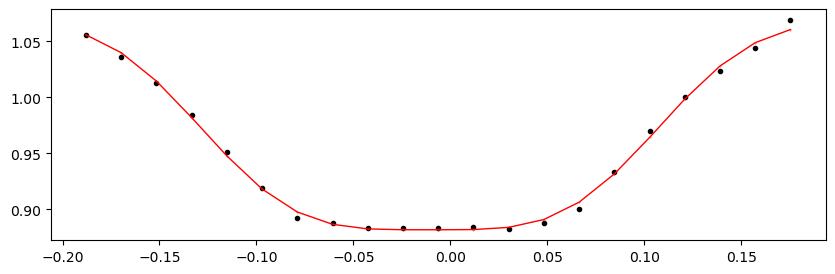

2713.1687072 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.91it/s]


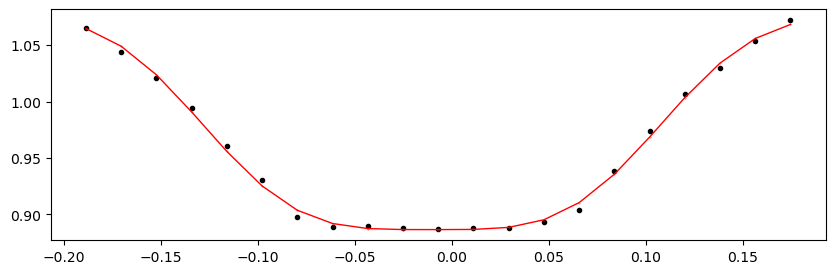

2713.5509383999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.56it/s]


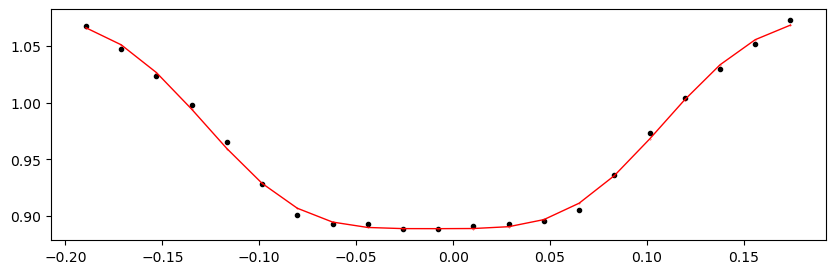

2713.9331696 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.68it/s]


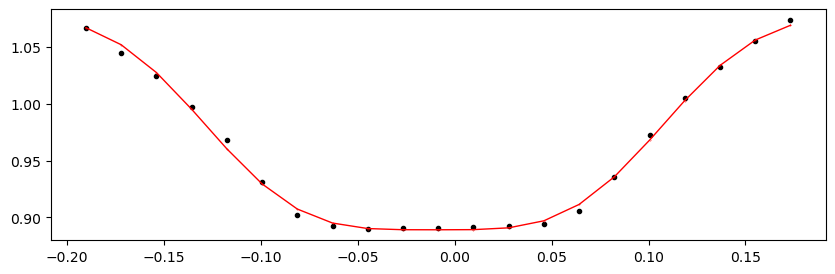

2714.3154008 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.56it/s]


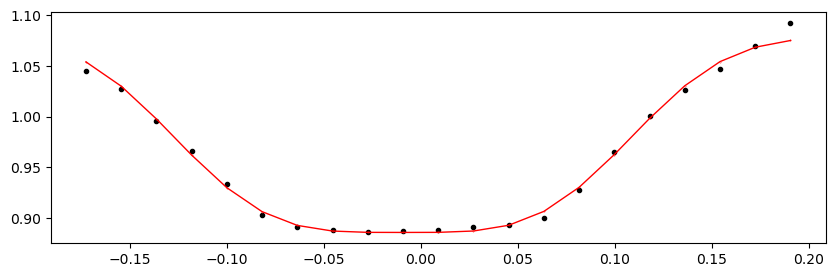

2714.697632 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.06it/s]


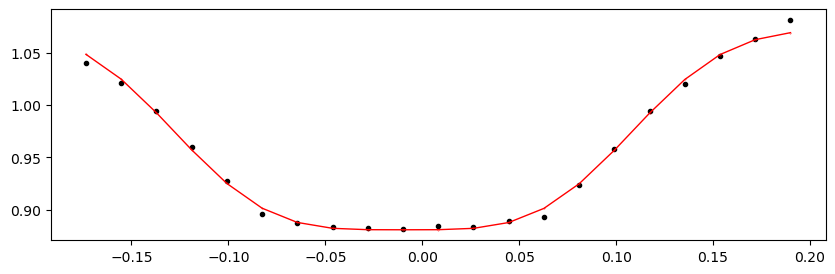

2715.0798631999996 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.62it/s]


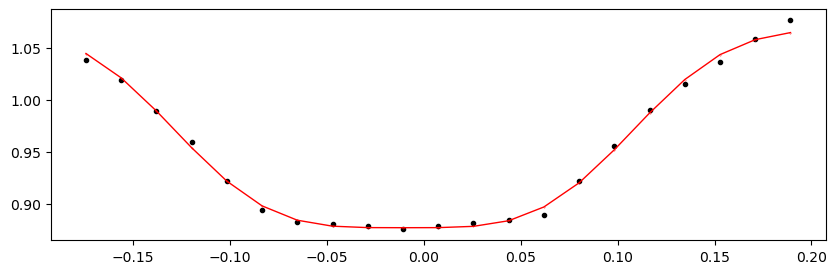

2715.4620944 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.65it/s]


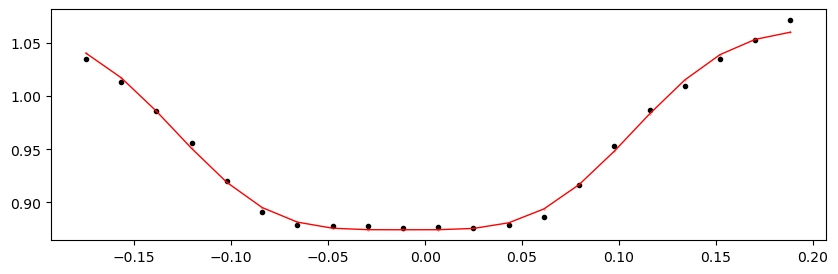

2715.8443256 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.53it/s]


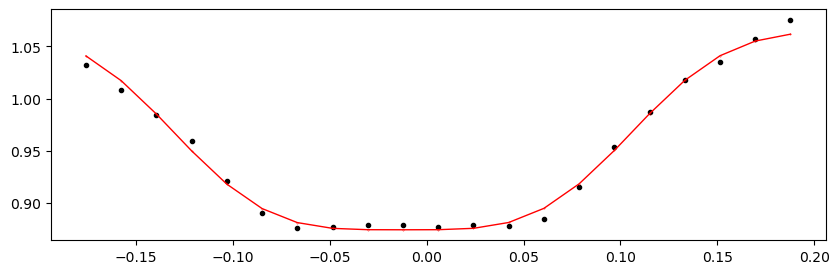

2716.2265568 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.76it/s]


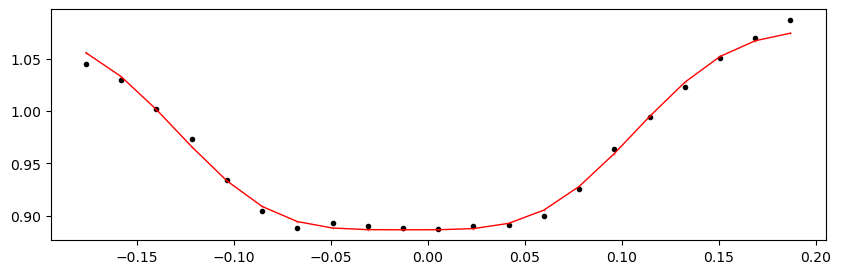

2716.608788 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.71it/s]


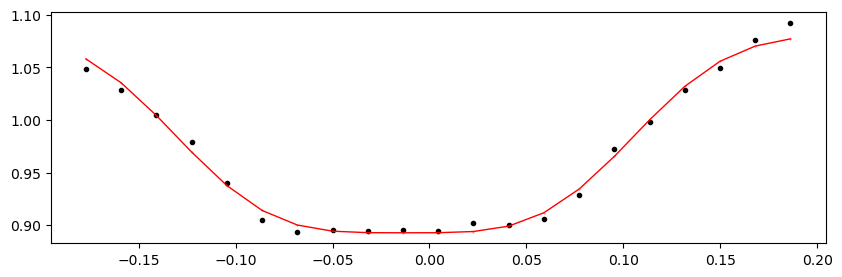

2716.9910191999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.00it/s]


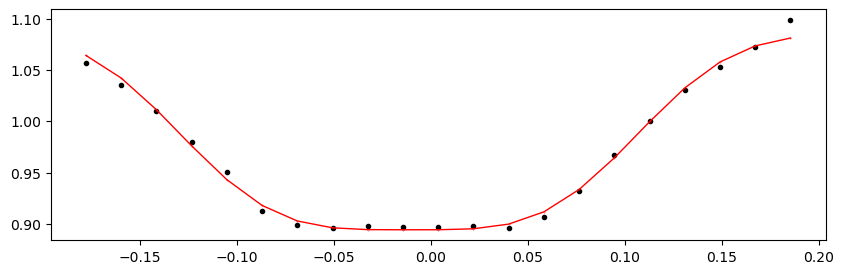

2717.3732504 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.55it/s]


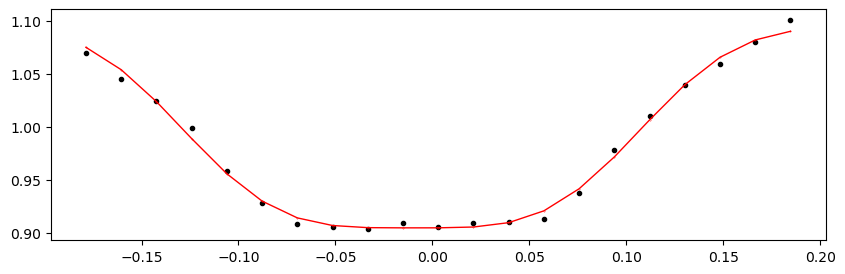

2718.9021752 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.91it/s]


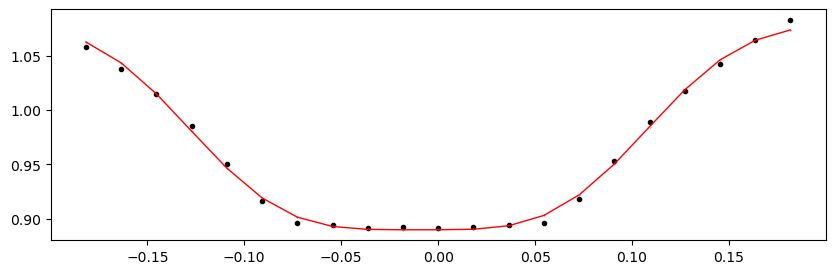

2719.2844064 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.11it/s]


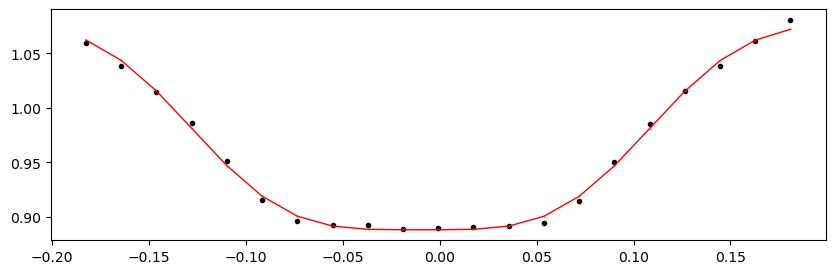

2719.6666376 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.34it/s]


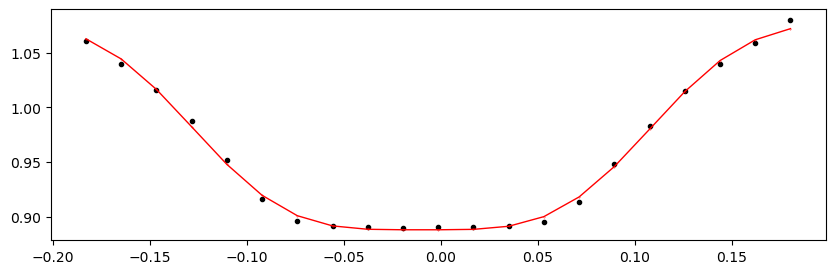

2720.0488688 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.63it/s]


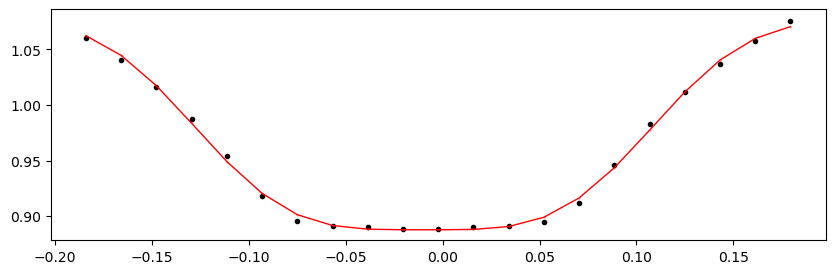

2720.4311 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.50it/s]


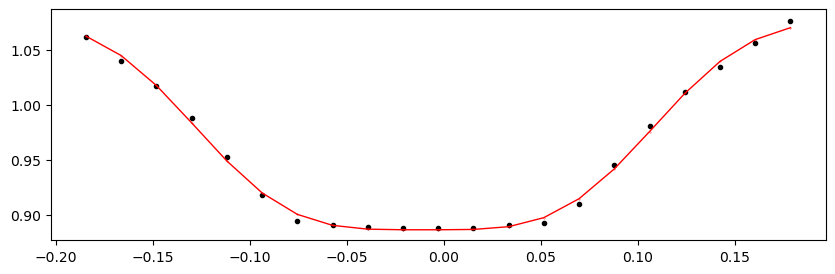

2725.4001055999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.80it/s]


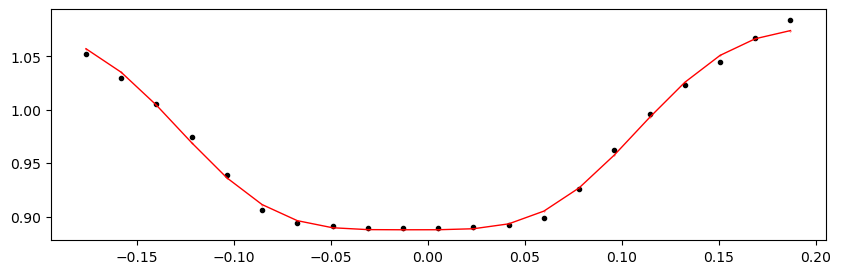

2725.7823368 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.77it/s]


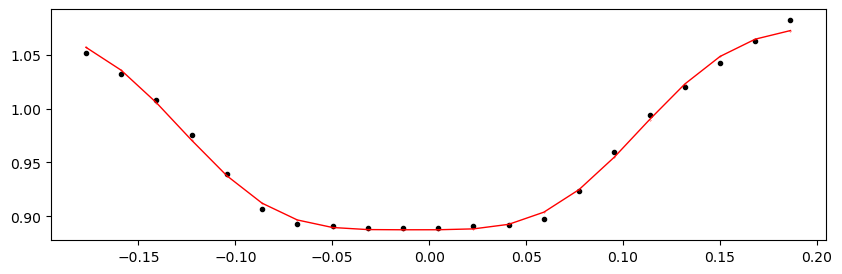

2726.164568 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.22it/s]


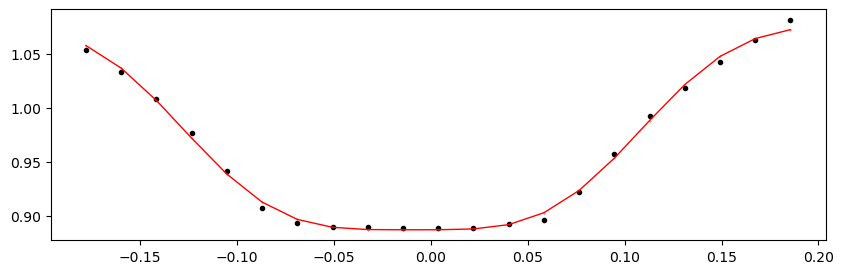

2726.5467992 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.99it/s]


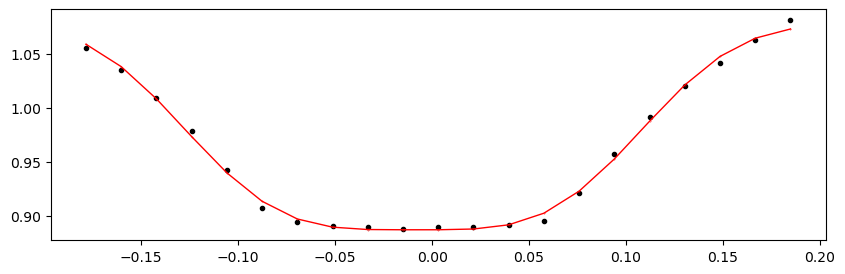

2726.9290303999996 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.75it/s]


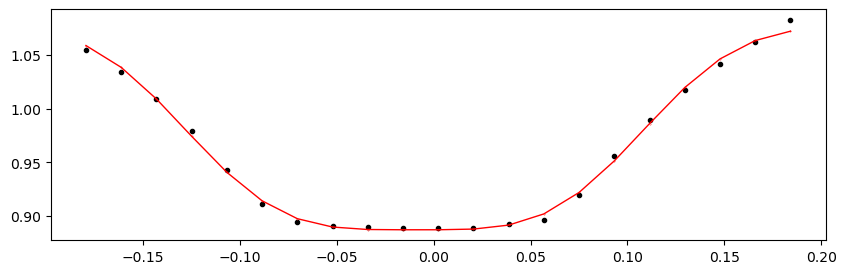

2727.3112616 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.82it/s]


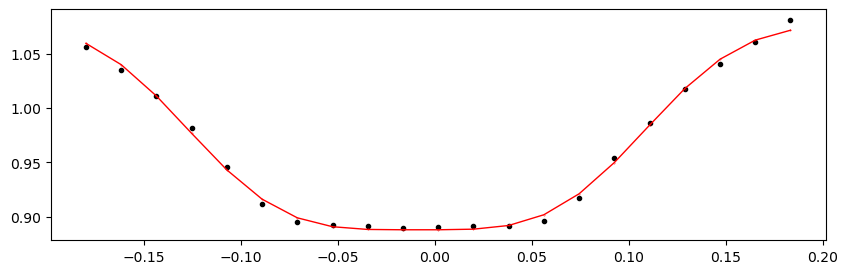

2727.6934928 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.78it/s]


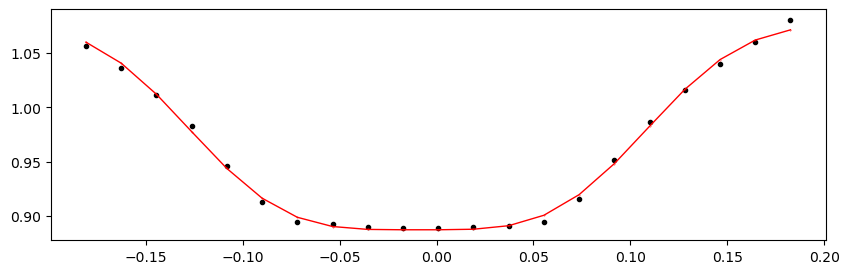

2728.075724 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.49it/s]


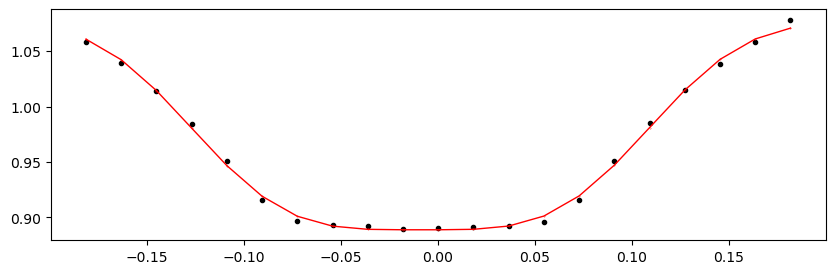

2728.4579552 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.30it/s]


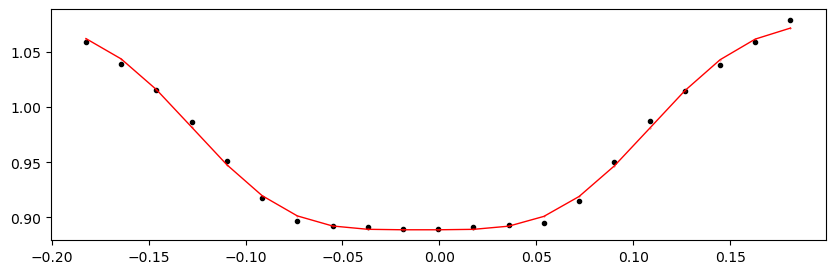

2728.8401863999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.17it/s]


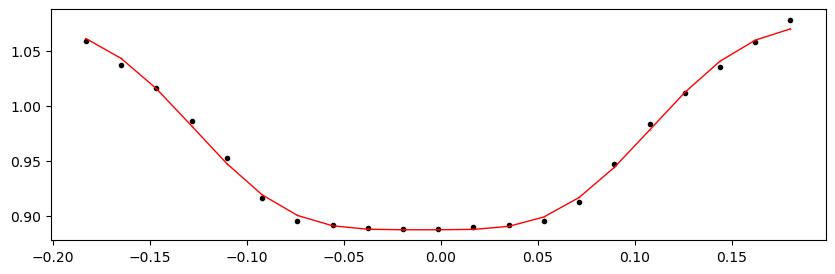

2729.2224176 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.80it/s]


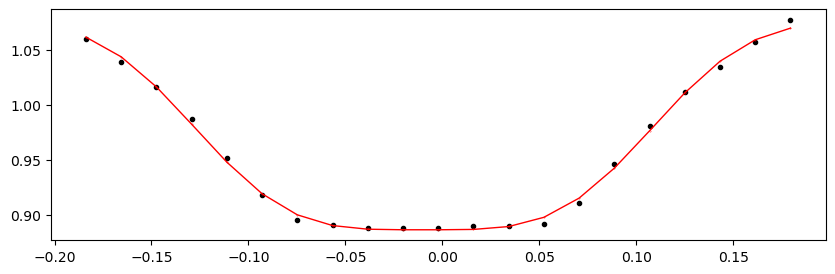

2729.6046487999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.25it/s]


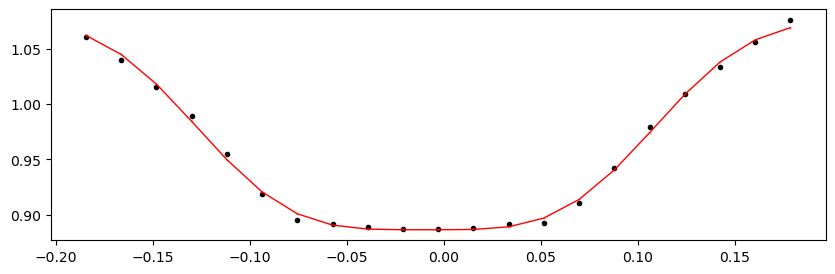

2729.98688 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.41it/s]


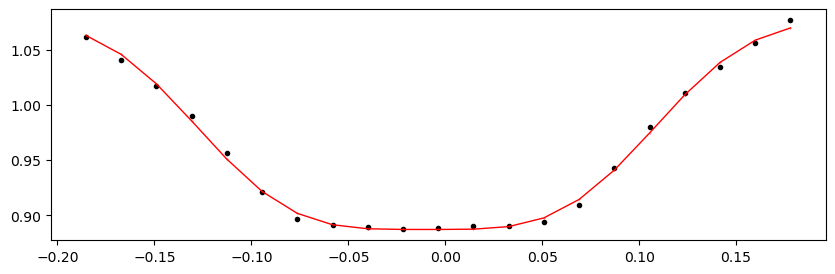

Time 2730.3691111999997 does not have enough data points: 1
Time 2731.5158048 does not have enough data points: 19
2731.898036 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.30it/s]


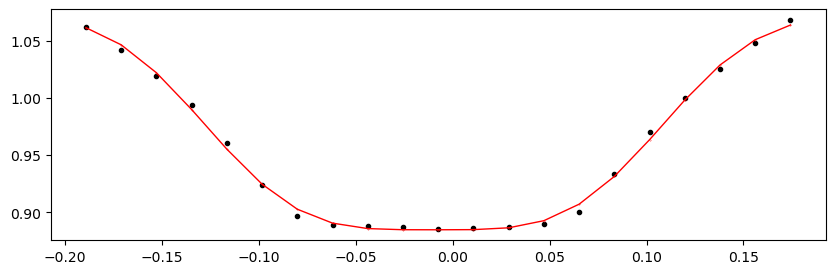

2732.2802672 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.70it/s]


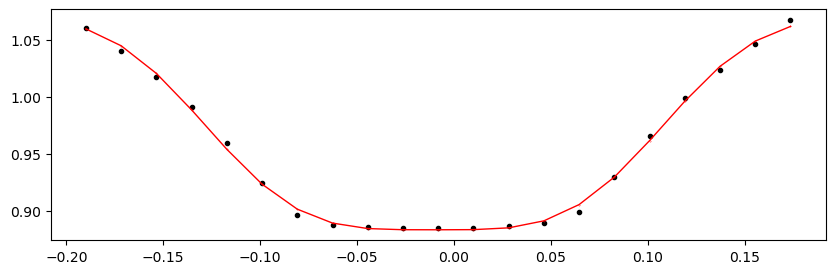

2732.6624984 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.64it/s]


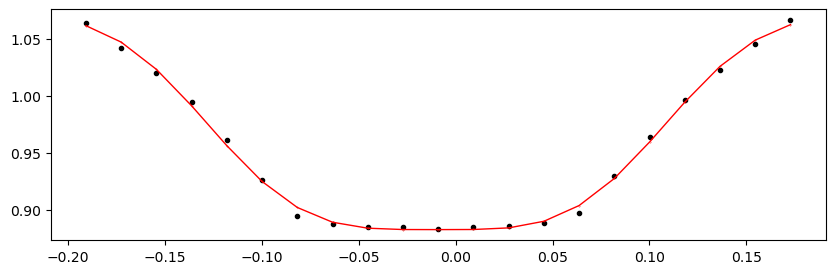

2733.0447295999998 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.39it/s]


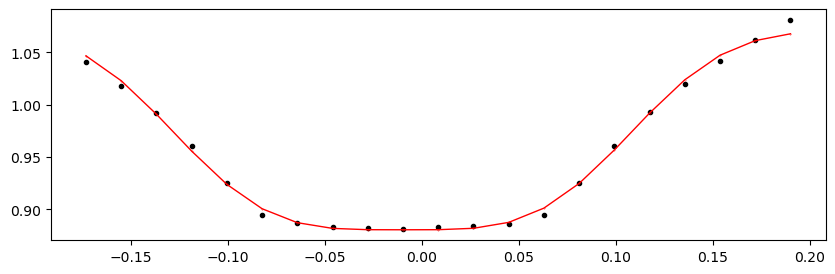

2733.4269608 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.05it/s]


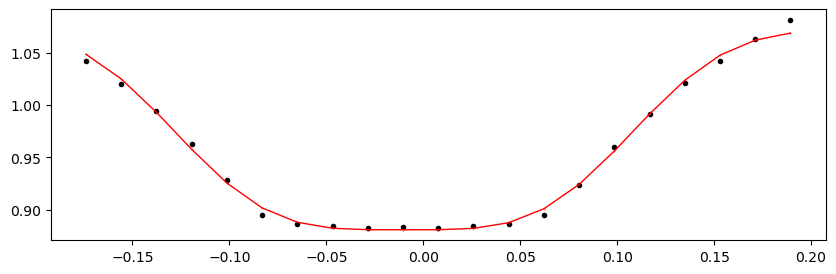

2738.3959664 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.70it/s]


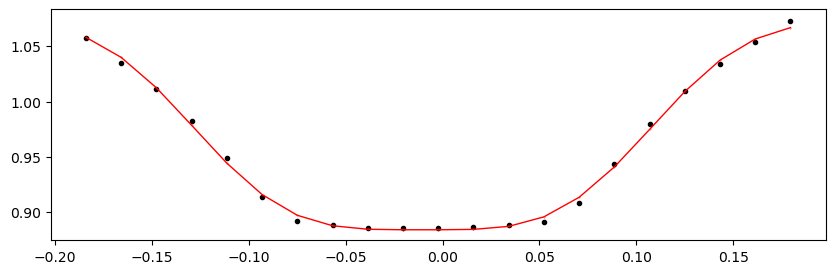

2738.7781975999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.20it/s]


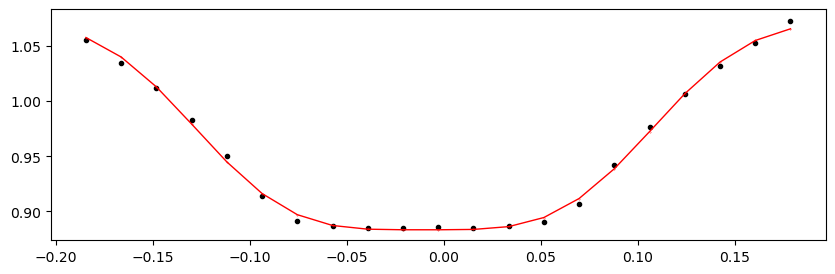

2739.1604288 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.30it/s]


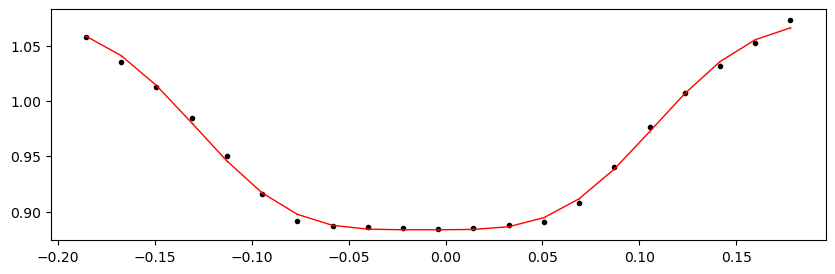

2739.54266 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.67it/s]


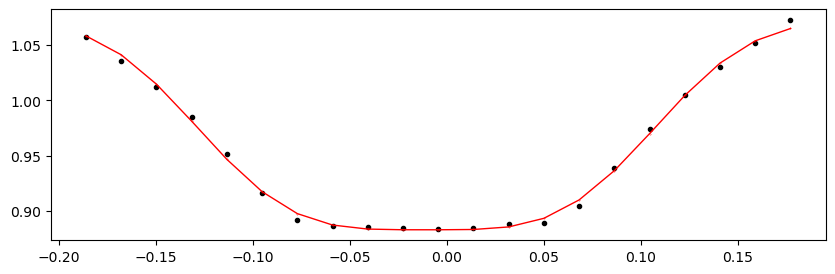

2739.9248912 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.49it/s]


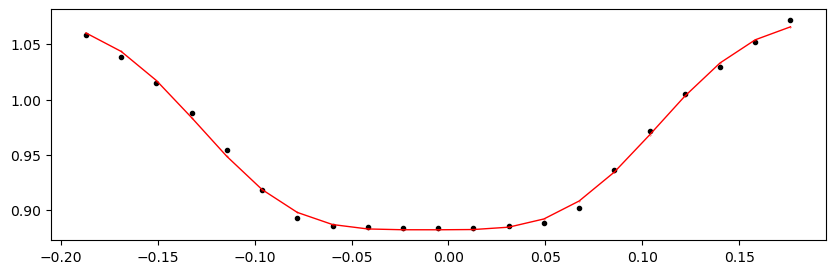

2740.3071224 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.60it/s]


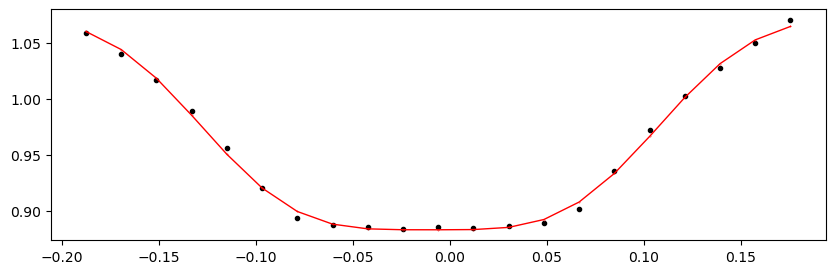

2740.6893536 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.72it/s]


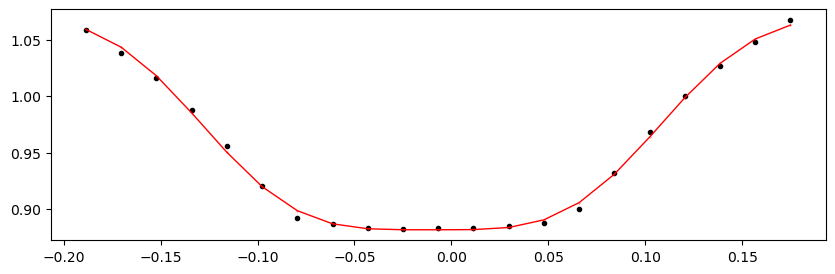

2741.0715848 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.02it/s]


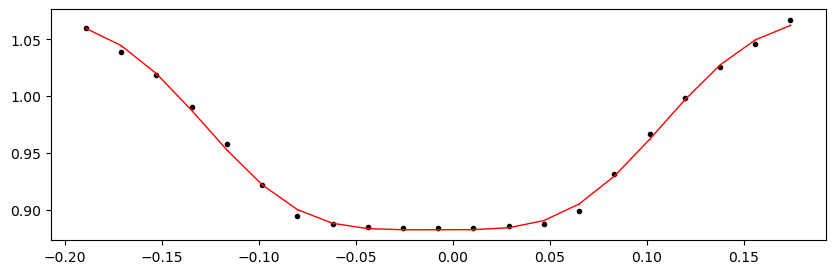

2741.4538159999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.53it/s]


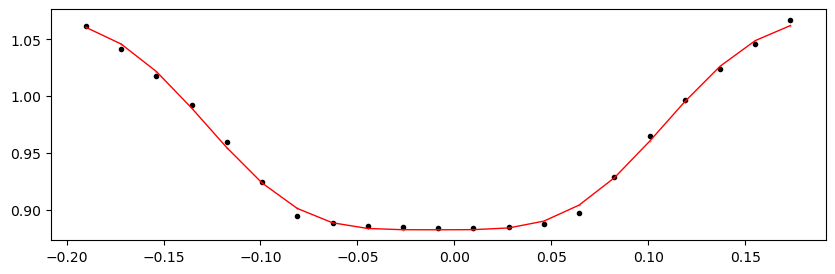

2741.8360472 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.10it/s]


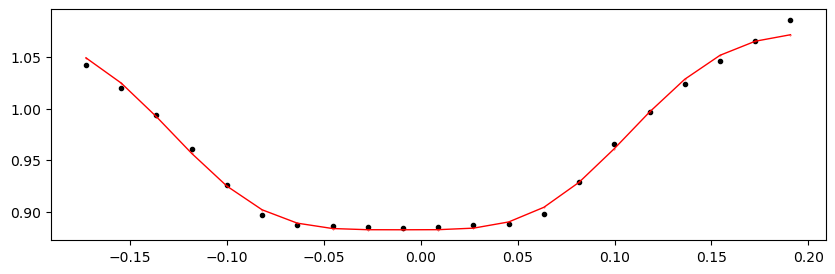

2742.2182783999997 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.40it/s]


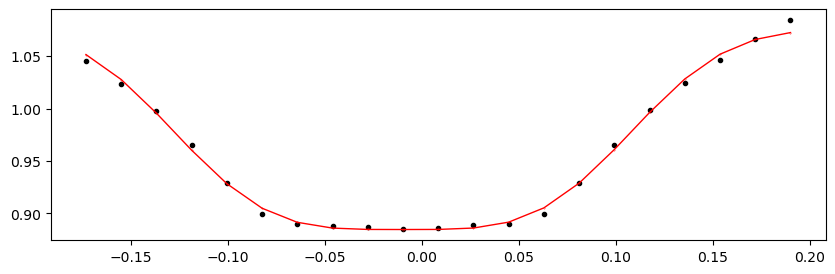

2742.6005096 1.0733060735771711 -0.1891585144165238 0.2165254598082374


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.81it/s]


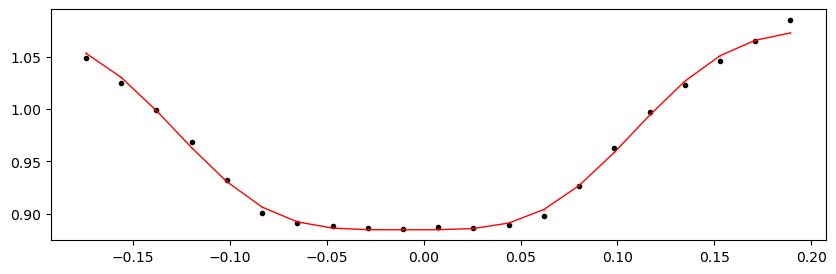

Fitting individual secondary eclipses...
Creating new manifest file
1956.1598156 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.49it/s]


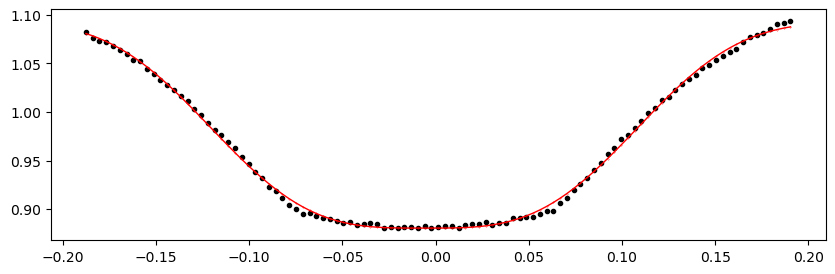

1956.5420468 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 315.14it/s]


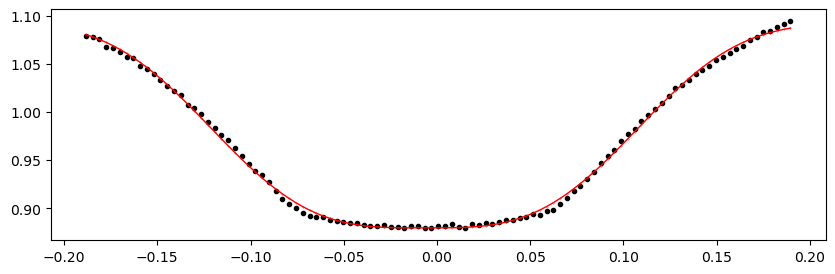

1956.924278 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.78it/s]


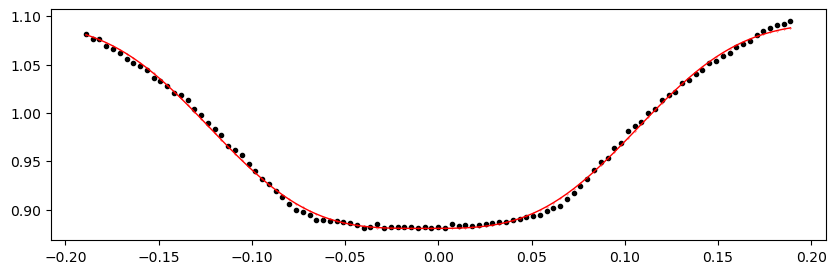

1957.3065092 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 289.68it/s]


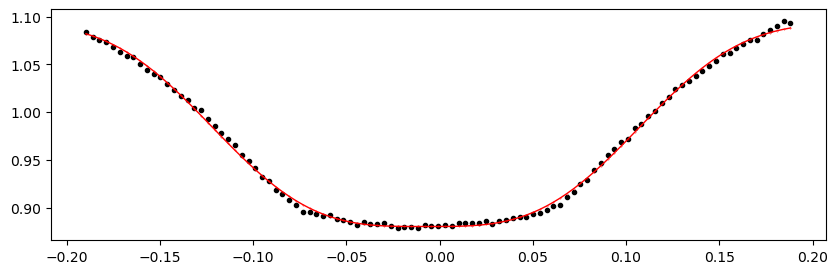

1957.6887404 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 309.03it/s]


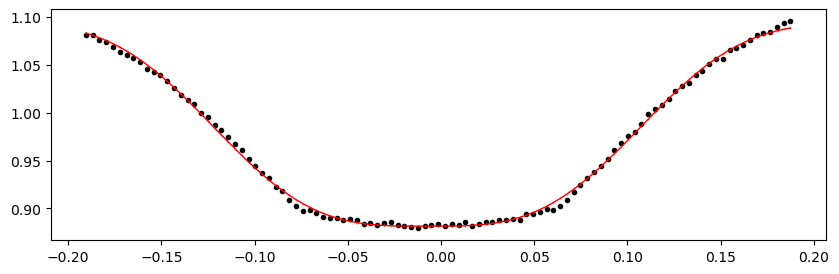

1958.0709716 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 311.07it/s]


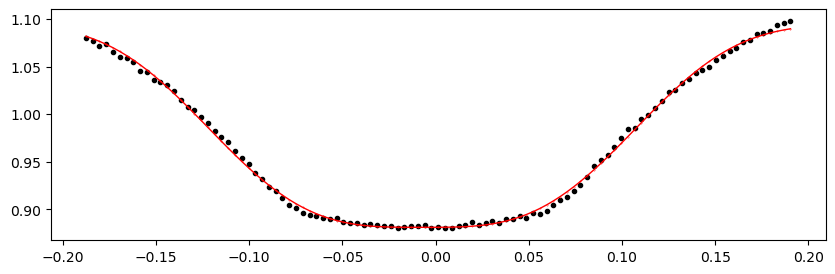

1958.4532028 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 308.67it/s]


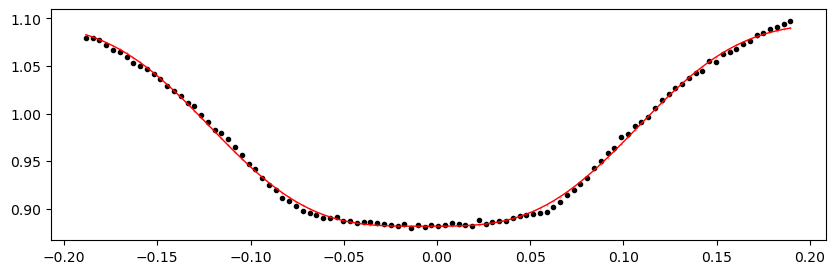

1958.835434 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.75it/s]


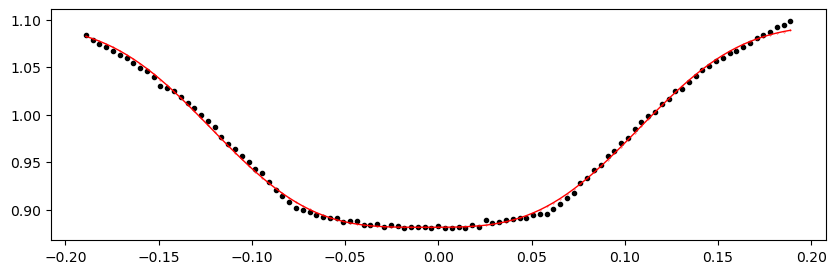

1959.2176652 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 311.11it/s]


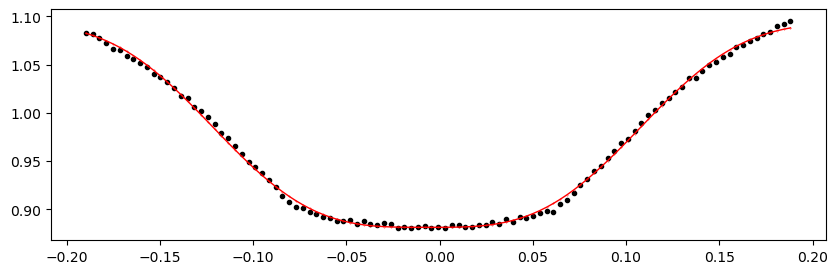

1959.5998964 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 306.85it/s]


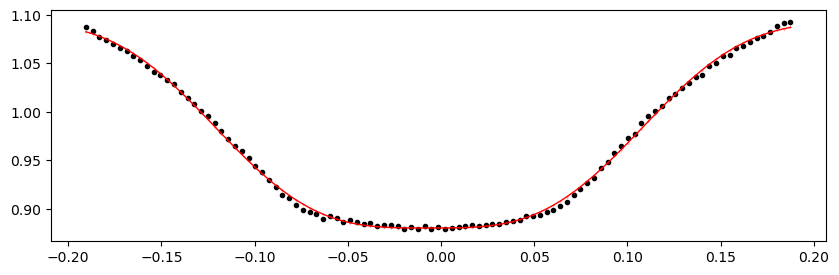

1959.9821276 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.23it/s]


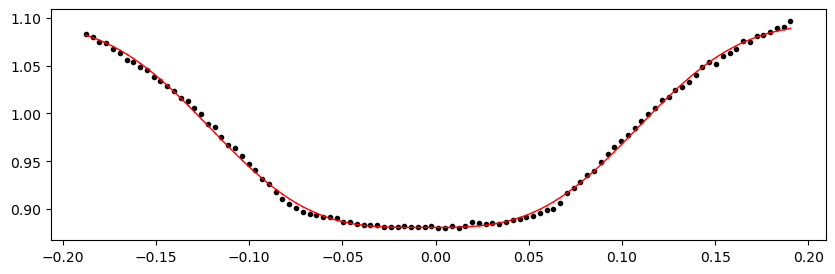

1960.3643588 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.34it/s]


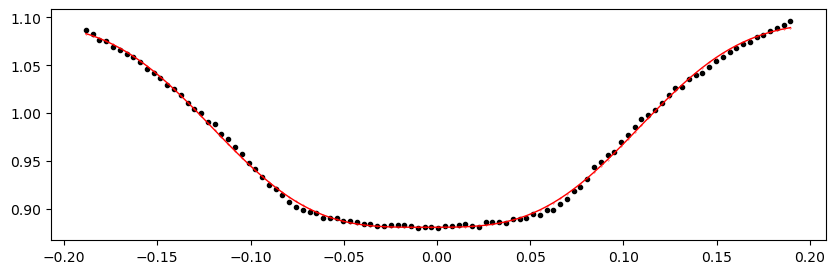

1960.74659 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.12it/s]


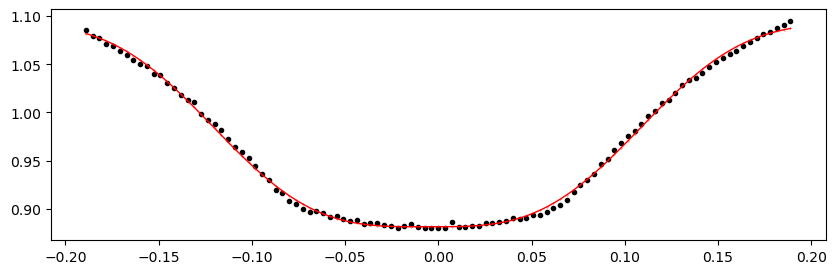

1961.1288212 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.00it/s]


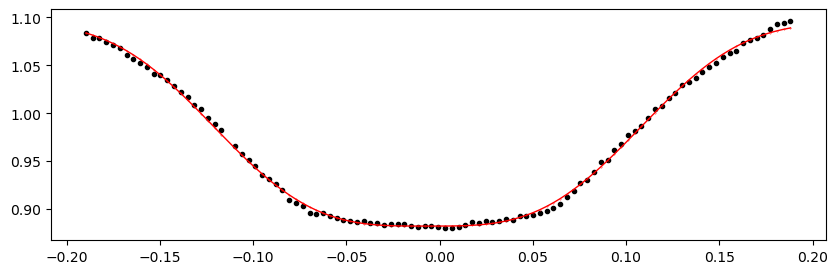

1961.5110524 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.98it/s]


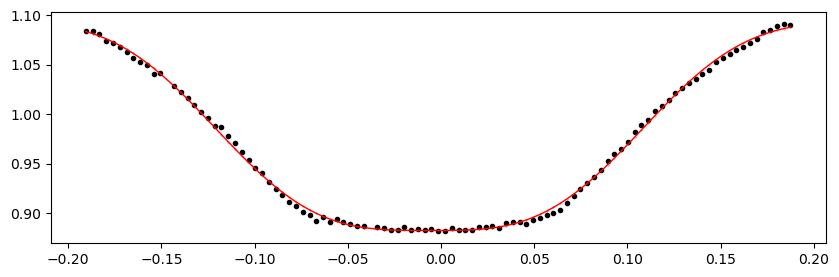

1961.8932836 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.96it/s]


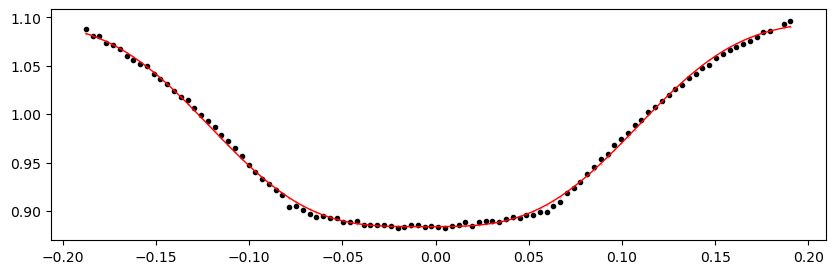

1962.2755148 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.60it/s]


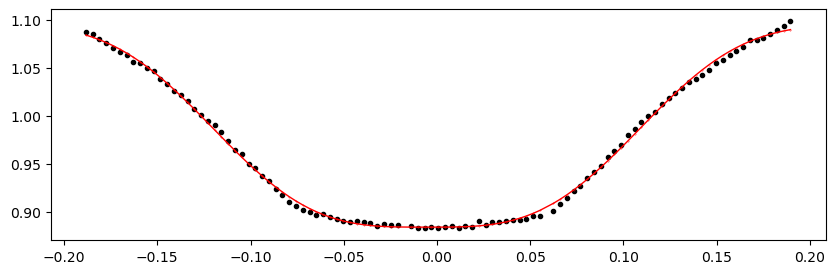

1962.657746 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.82it/s]


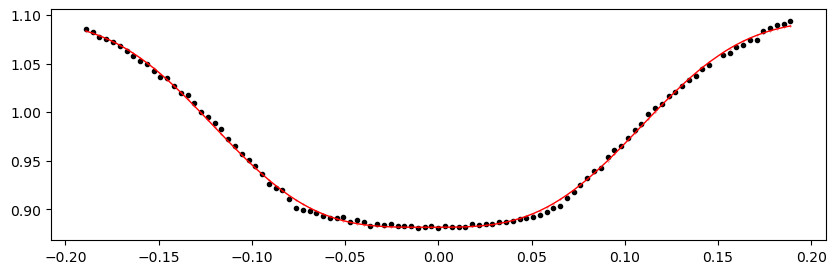

1963.0399772 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.57it/s]


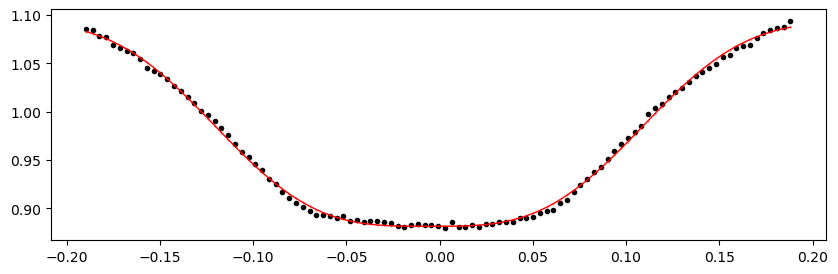

1963.4222084 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.93it/s]


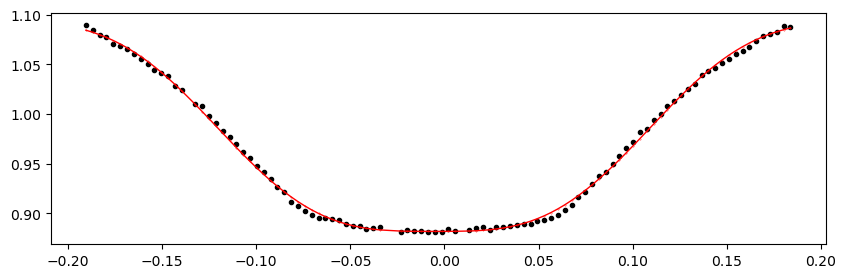

1963.8044396 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.27it/s]


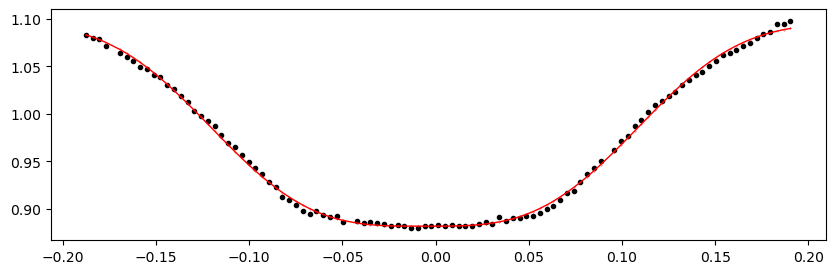

1964.1866708 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.19it/s]


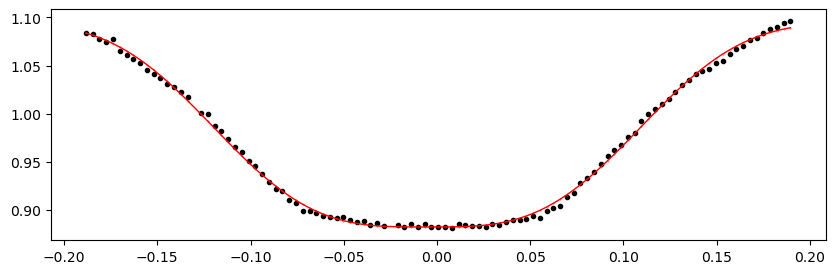

1964.568902 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.00it/s]


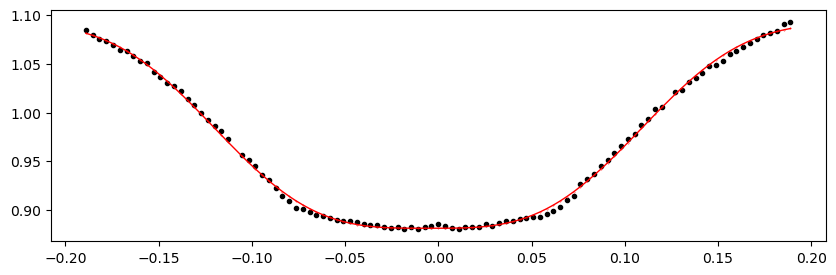

1964.9511332 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.46it/s]


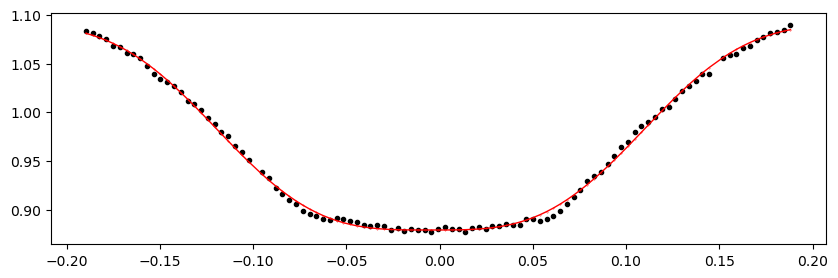

1965.3333644 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.89it/s]


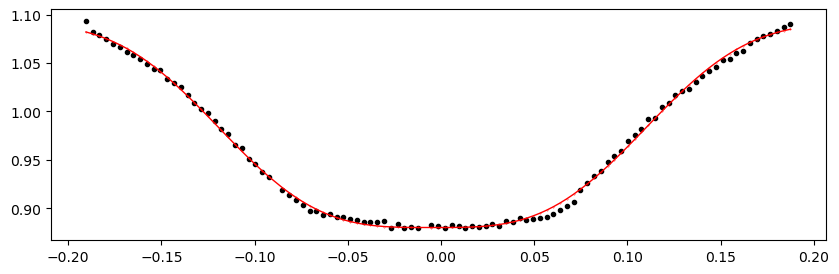

1965.7155956 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.84it/s]


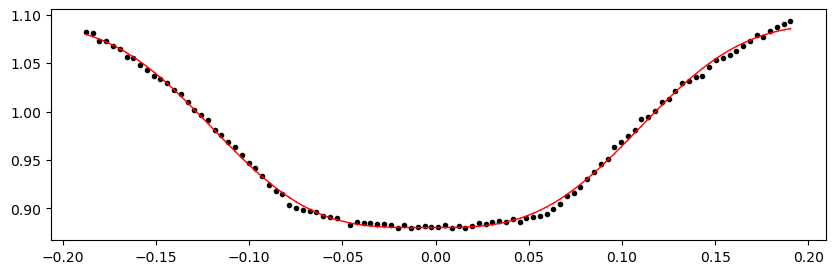

1966.0978268 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.06it/s]


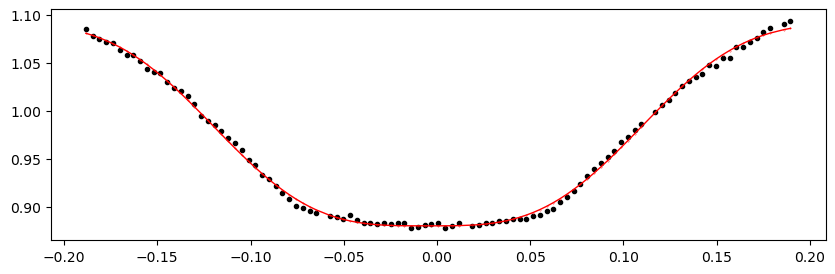

1966.480058 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.52it/s]


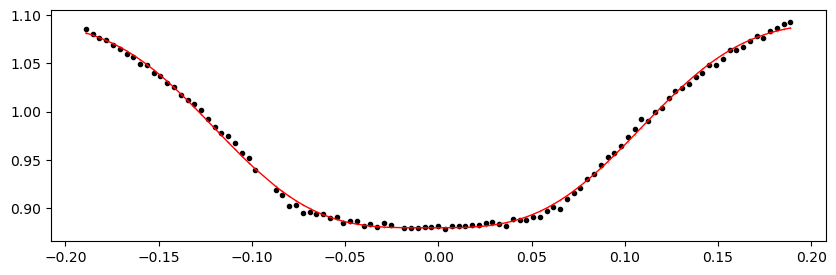

1966.8622892 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.12it/s]


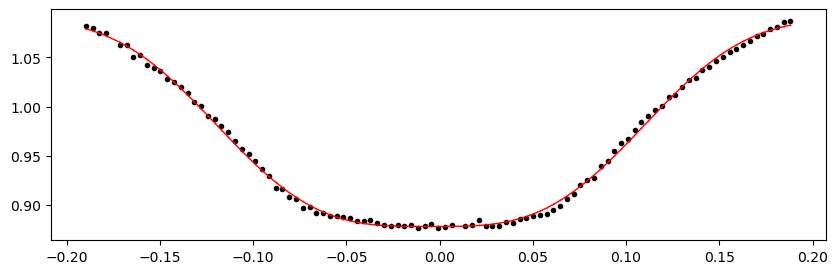

1967.2445204 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.13it/s]


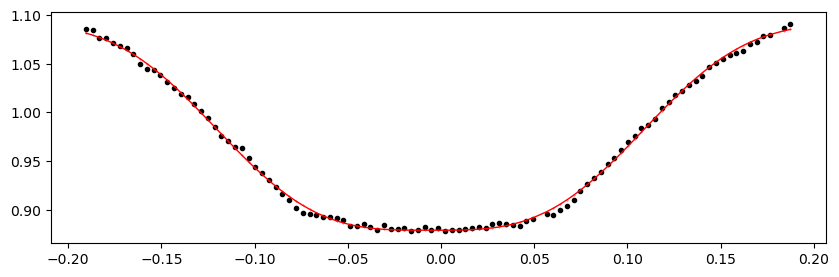

1967.6267516 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 323.77it/s]


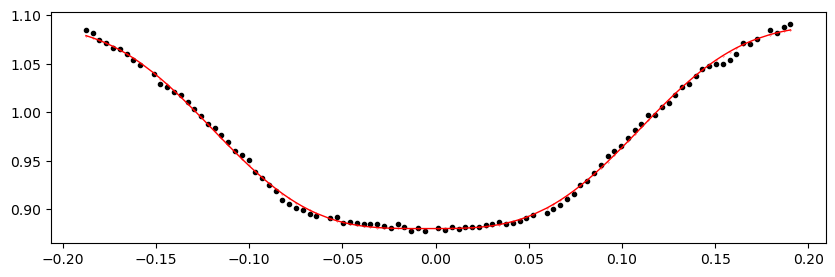

1968.0089828 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.49it/s]


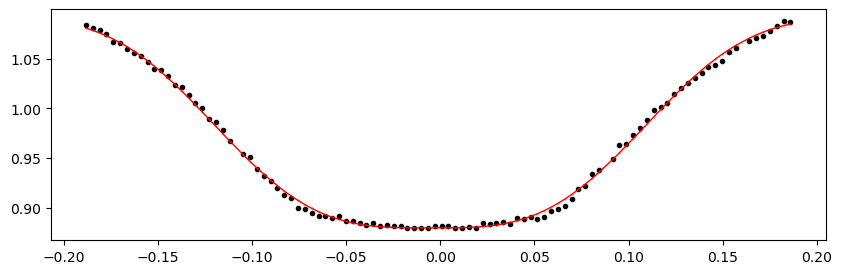

1968.391214 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.29it/s]


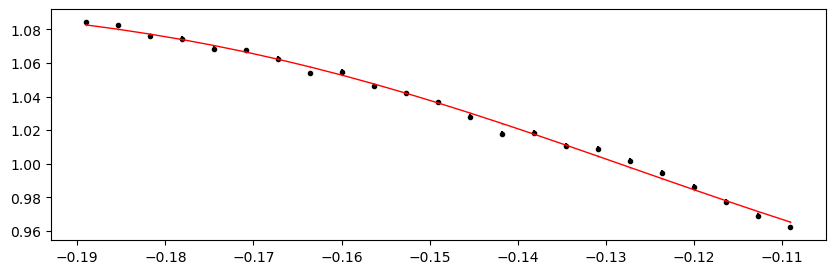

1969.5379076 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.54it/s]


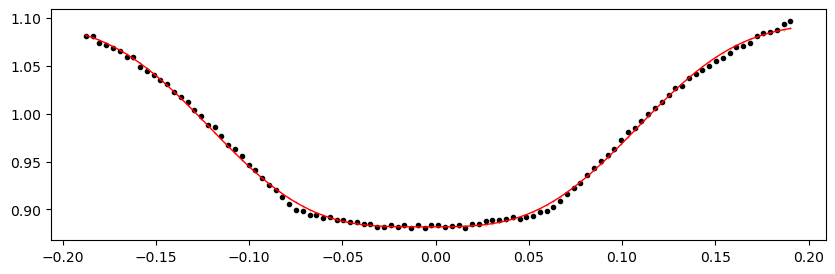

1969.9201388 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.23it/s]


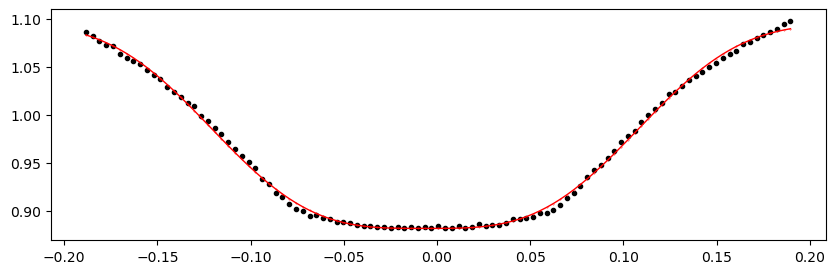

1970.30237 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.82it/s]


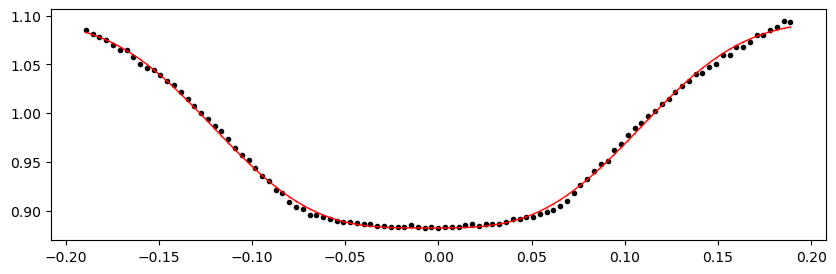

1970.6846012 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.91it/s]


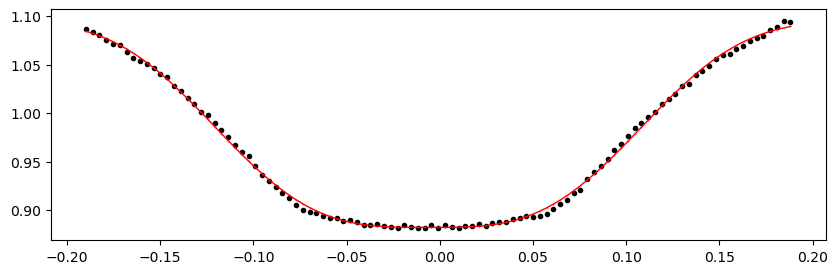

1971.0668324 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 322.73it/s]


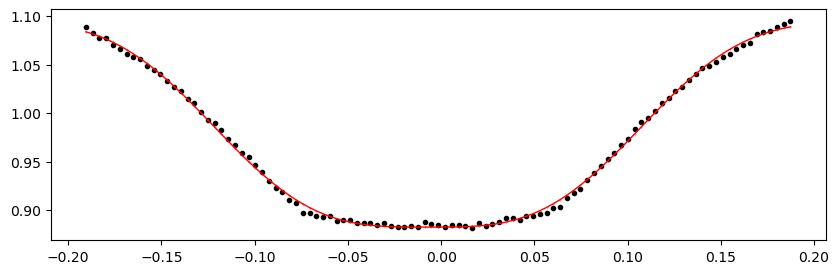

1971.4490636 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.76it/s]


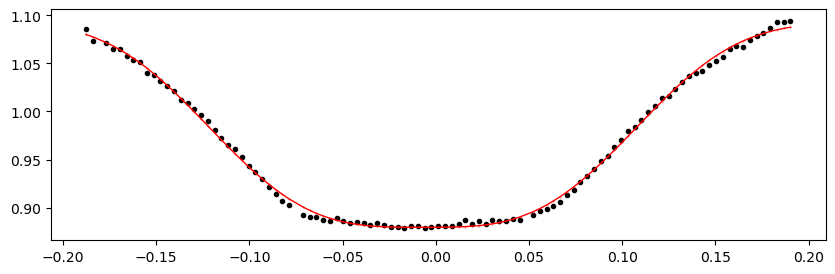

1971.8312948 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.58it/s]


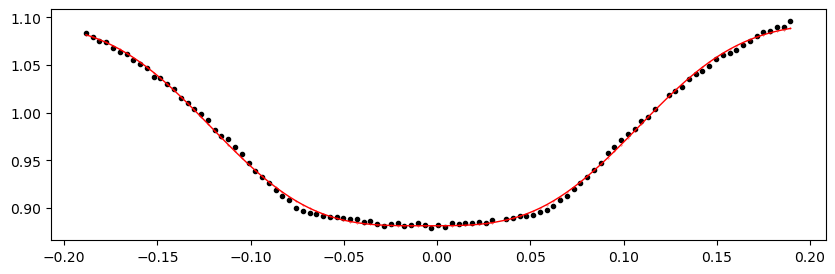

1972.213526 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.52it/s]


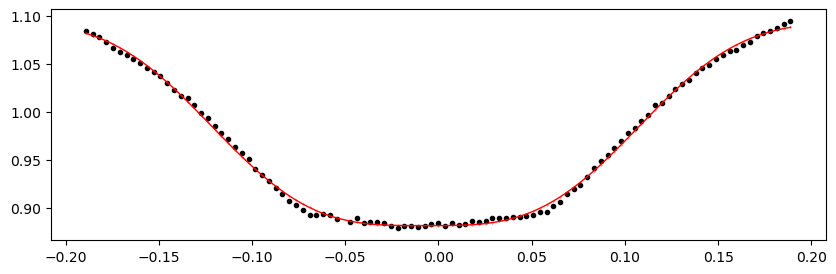

1972.5957572 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.16it/s]


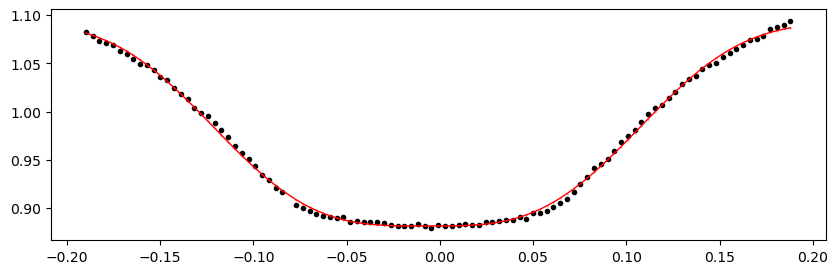

1972.9779884 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.16it/s]


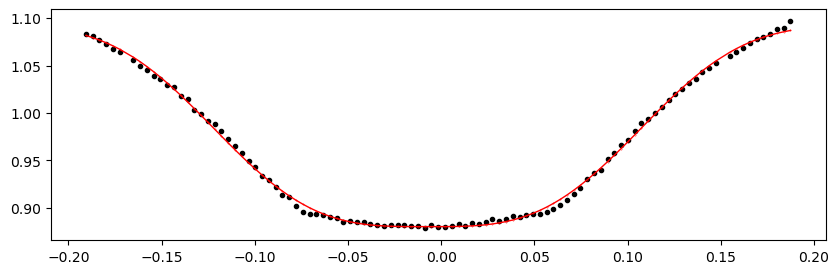

1973.3602196 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.30it/s]


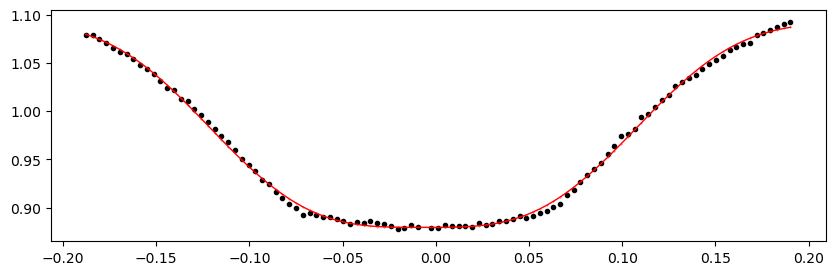

1973.7424508 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.32it/s]


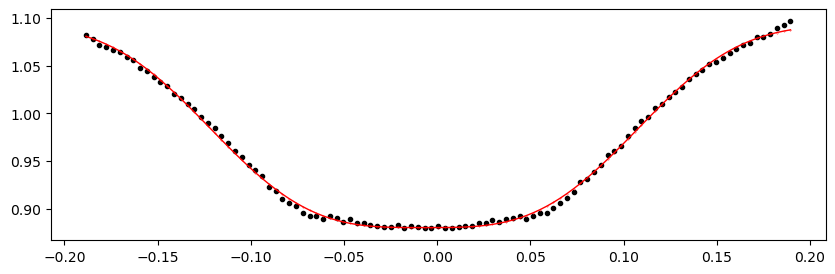

1974.124682 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.08it/s]


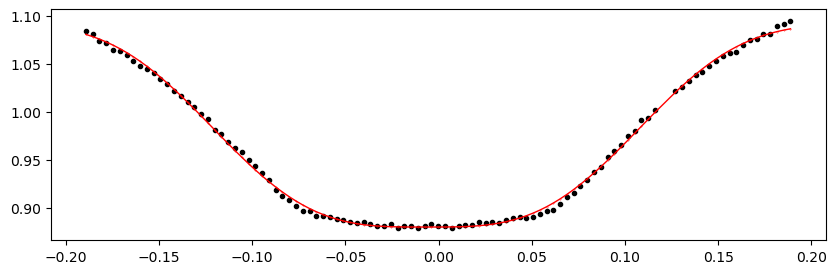

1974.5069132 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.30it/s]


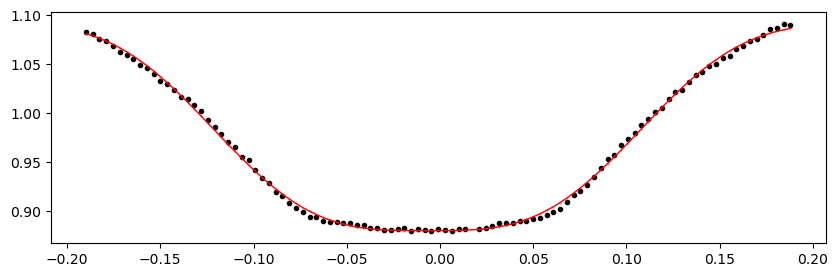

1974.8891444 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.16it/s]


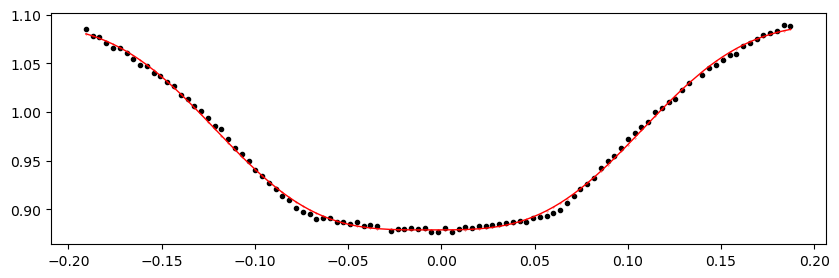

1975.2713756 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.76it/s]


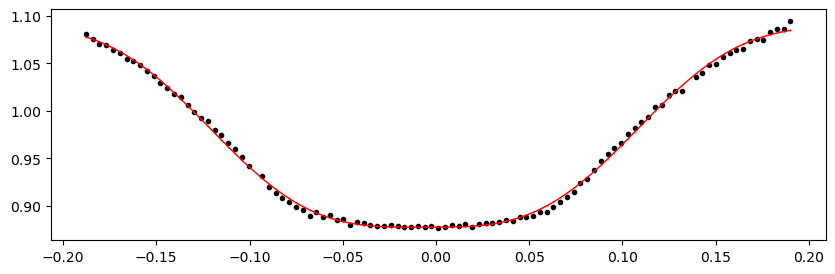

1975.6536068 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.33it/s]


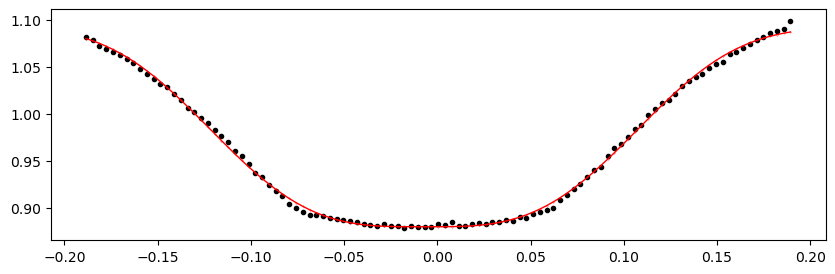

1976.035838 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.31it/s]


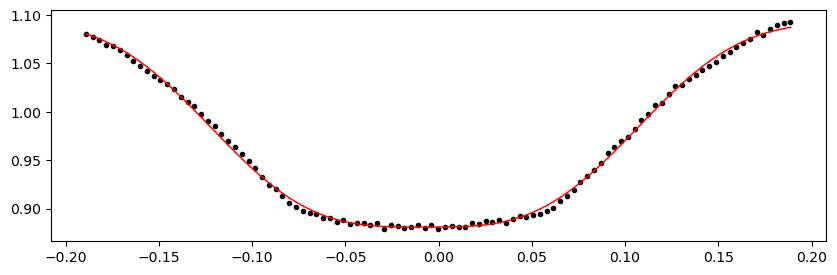

1976.4180692 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.37it/s]


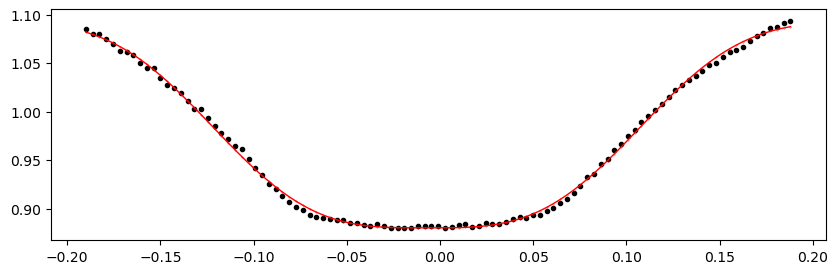

1976.8003004 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.19it/s]


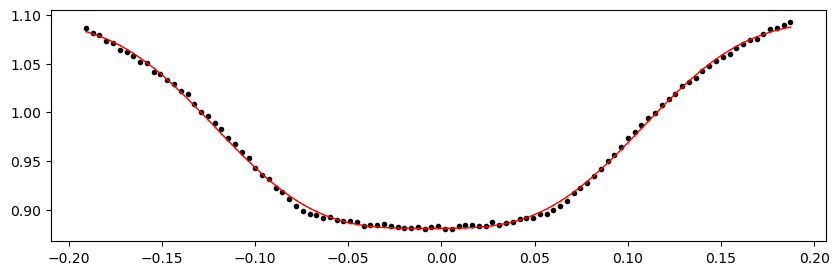

1977.1825316 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.59it/s]


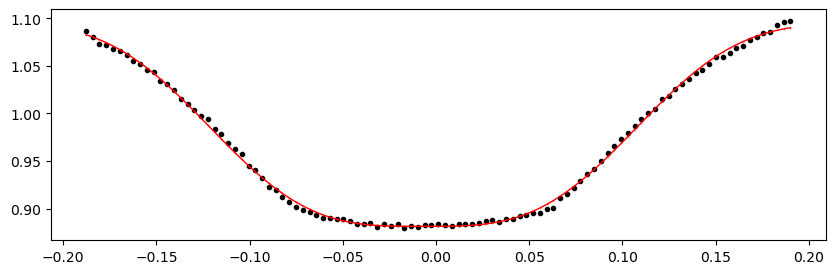

1977.5647628 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.25it/s]


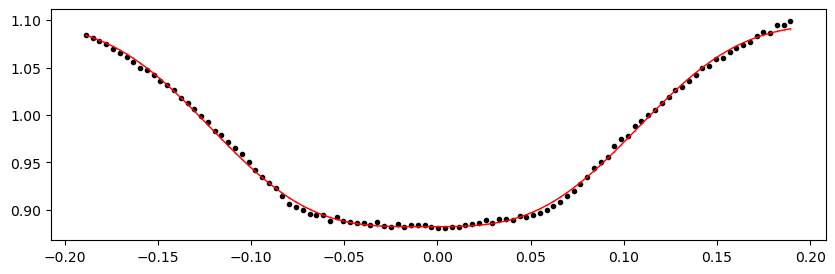

1977.946994 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.64it/s]


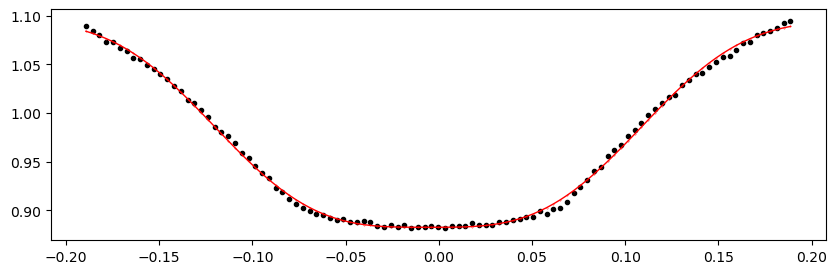

1978.3292252 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.36it/s]


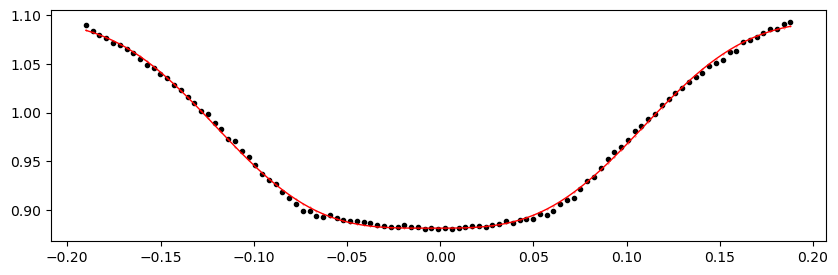

1978.7114564 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.52it/s]


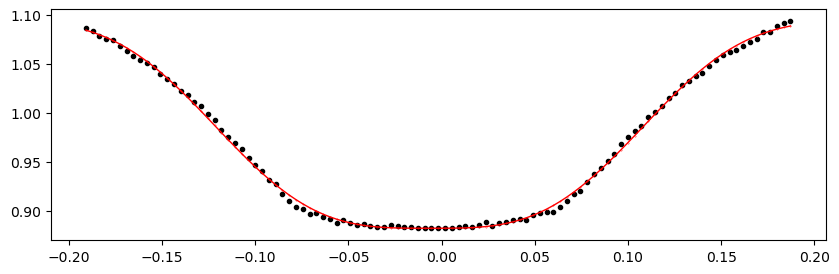

1979.0936876 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.74it/s]


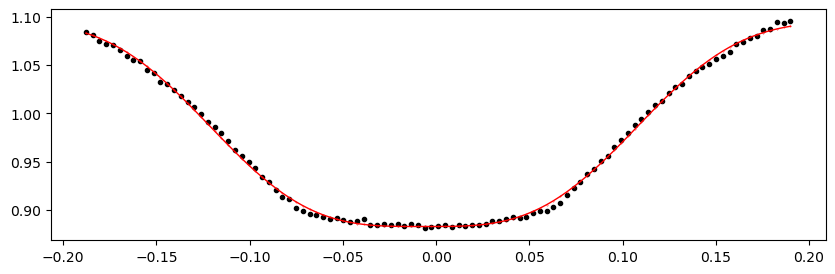

1979.4759188 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.37it/s]


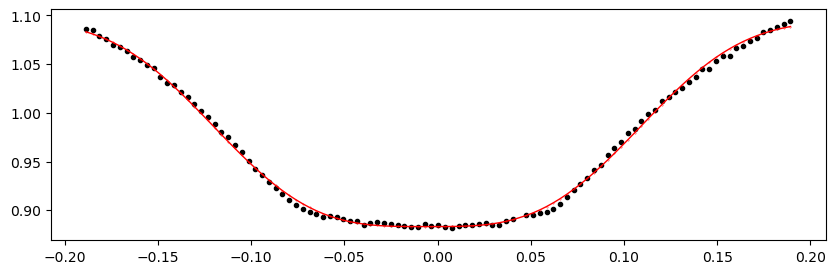

1979.85815 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.79it/s]


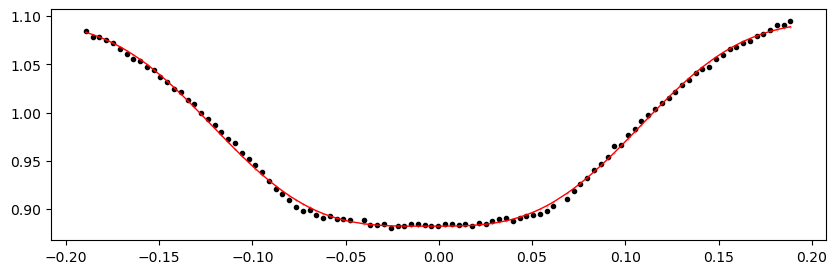

1980.2403812 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.17it/s]


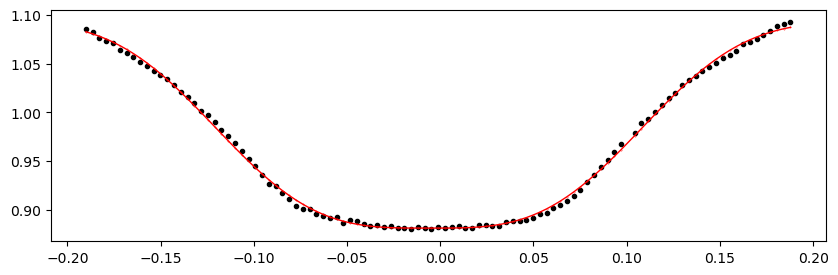

1980.6226124 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.99it/s]


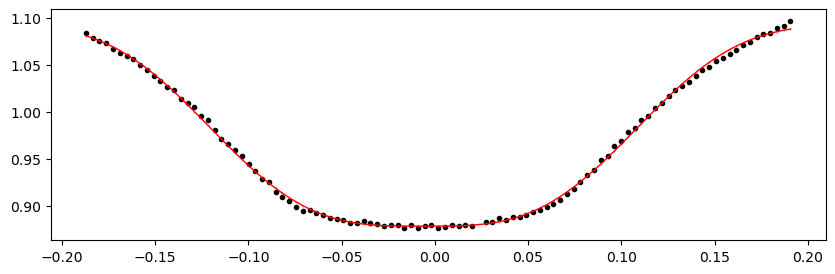

1981.0048436 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.48it/s]


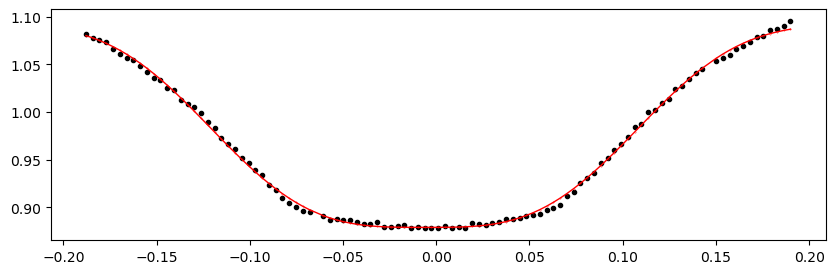

1981.3870748 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.07it/s]


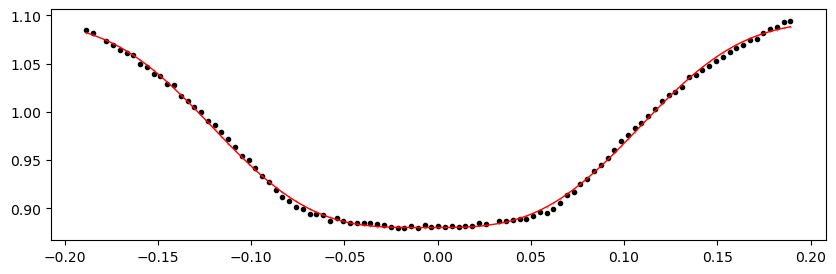

1981.769306 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.72it/s]


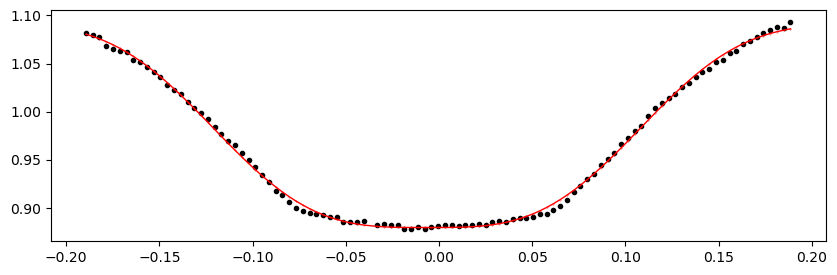

1982.1515372 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.42it/s]


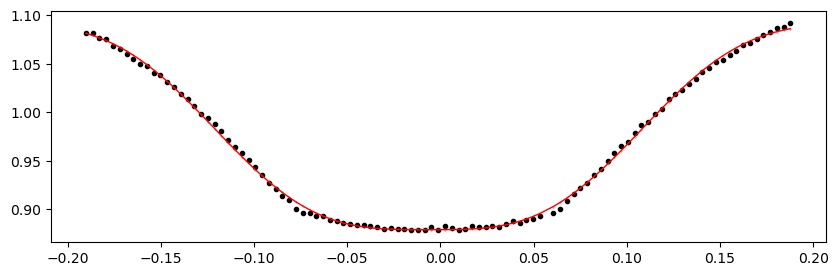

1983.680462 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.56it/s]


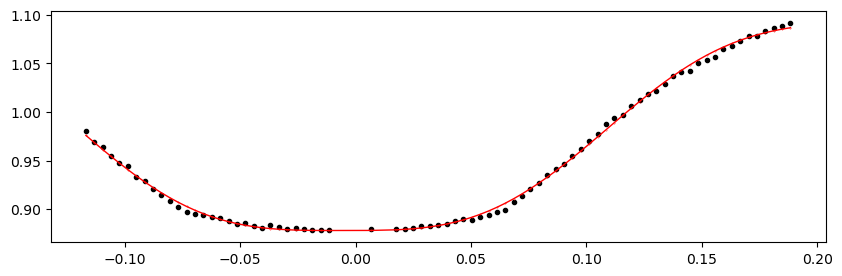

1984.0626932 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.19it/s]


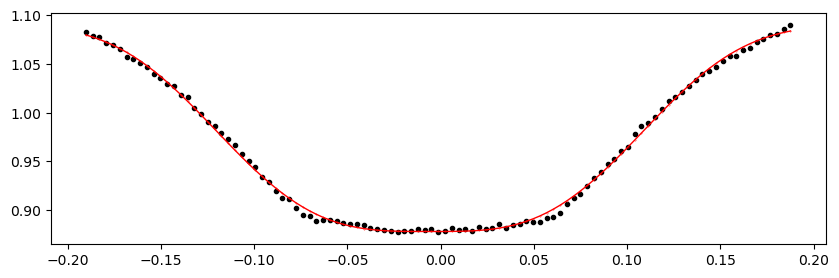

1984.4449244 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.91it/s]


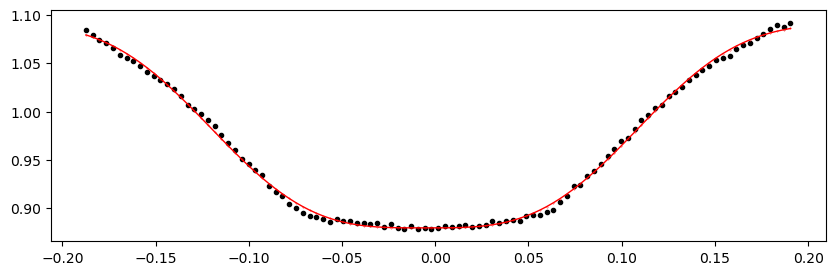

1988.2672364 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.15it/s]


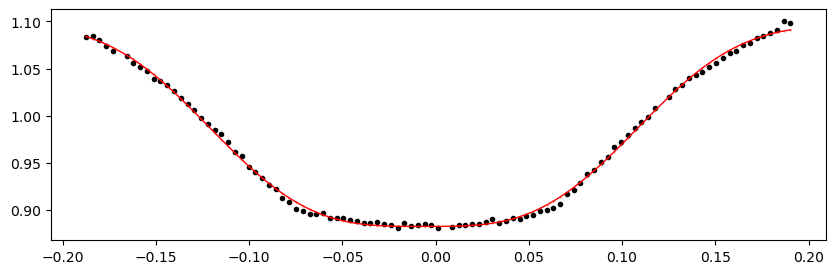

1988.6494676 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.20it/s]


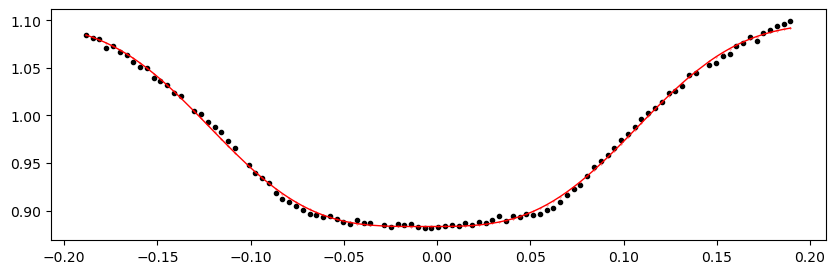

1989.0316988 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.65it/s]


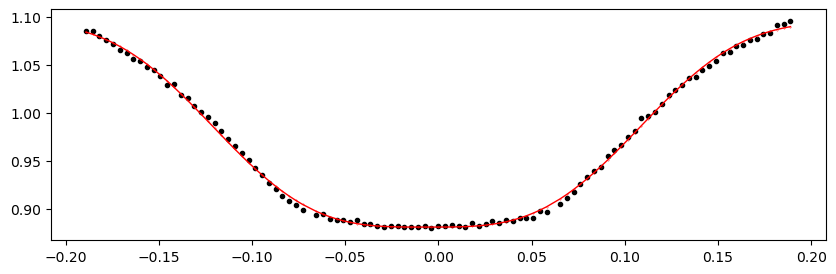

1989.41393 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.20it/s]


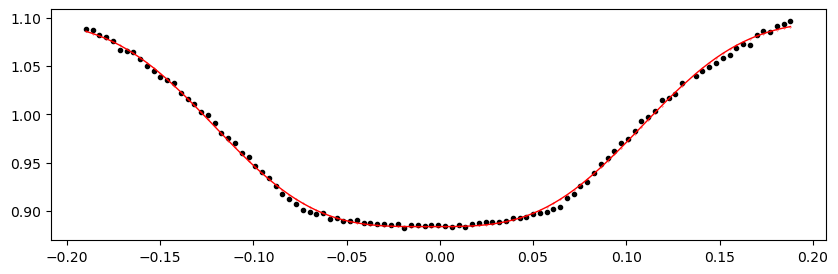

1989.7961612 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 314.61it/s]


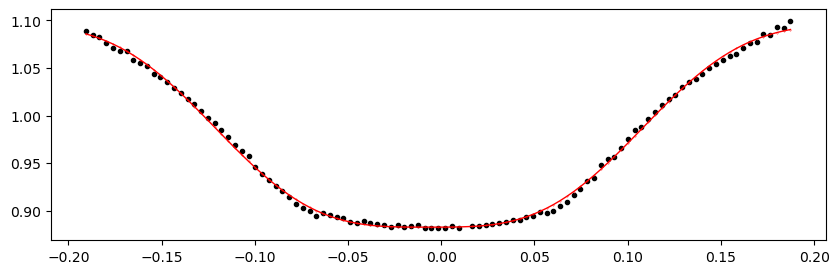

1990.1783924 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.47it/s]


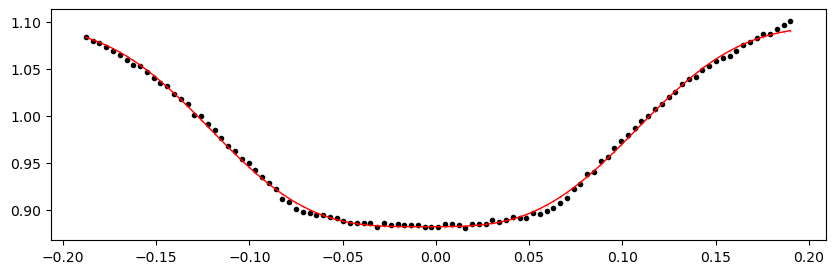

1990.5606236 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.07it/s]


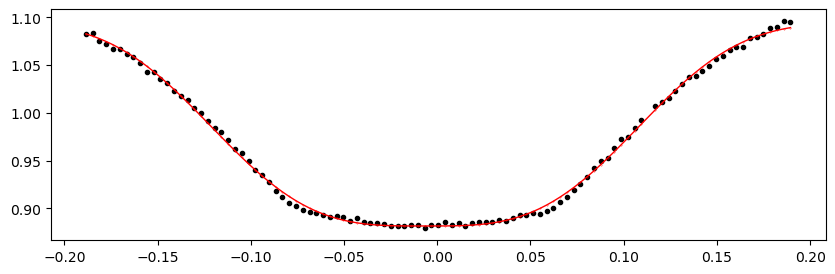

1990.9428548 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.83it/s]


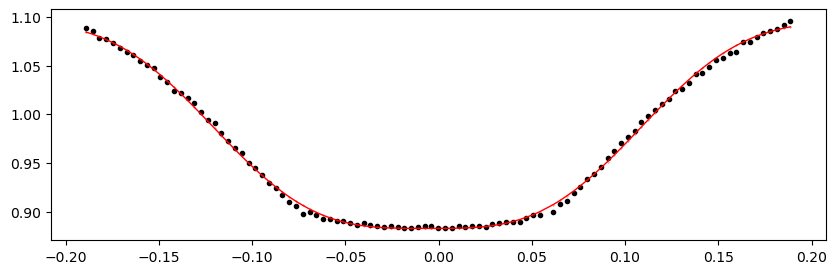

1991.325086 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.67it/s]


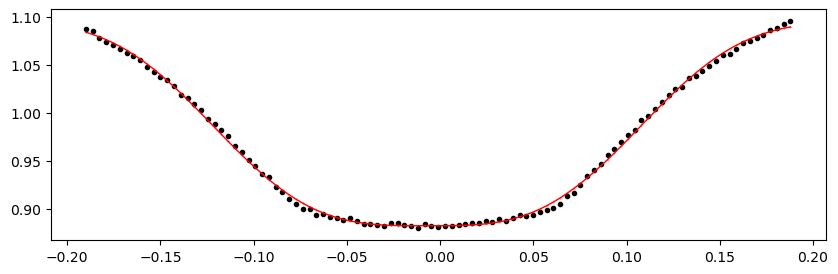

1991.7073172 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.97it/s]


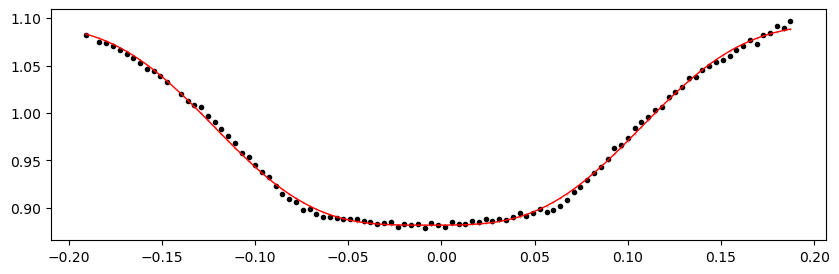

1992.0895484 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.06it/s]


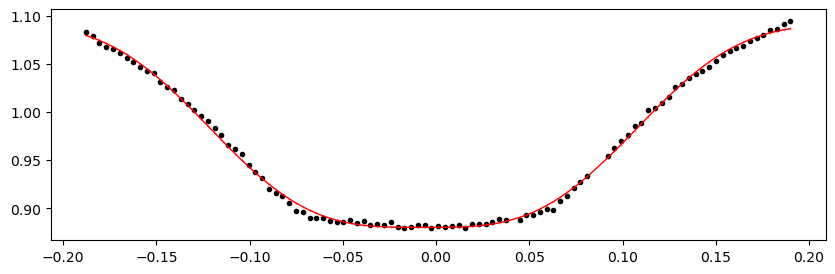

1992.4717796 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.38it/s]


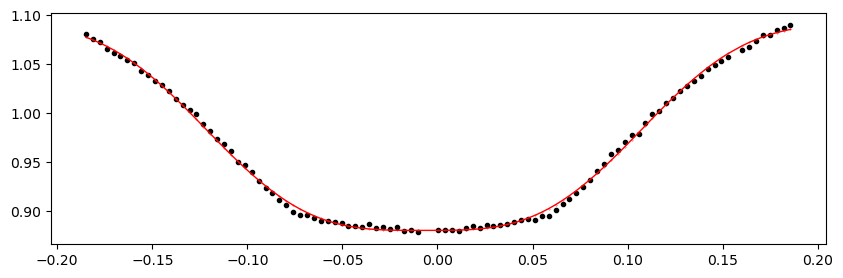

1992.8540108 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.56it/s]


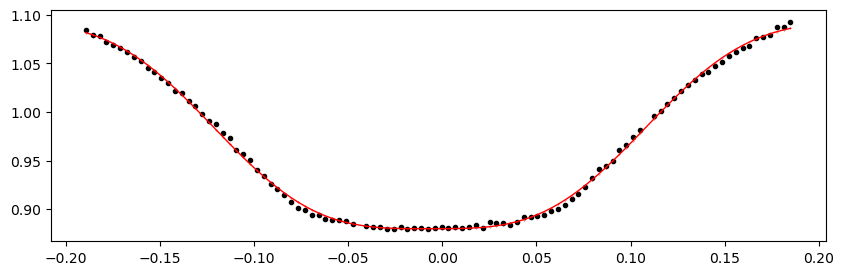

1993.236242 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.10it/s]


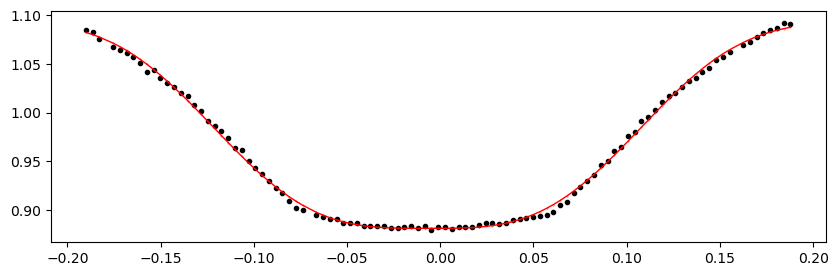

1993.6184732 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.90it/s]


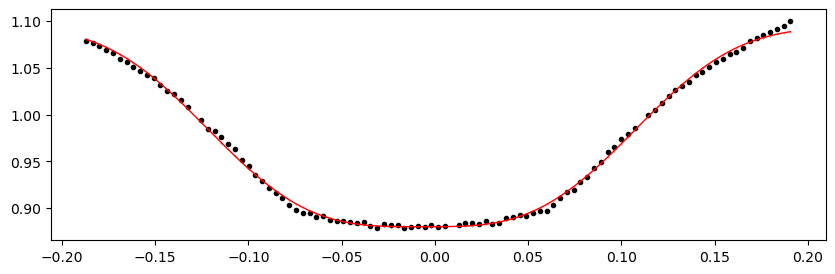

1994.0007044 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.56it/s]


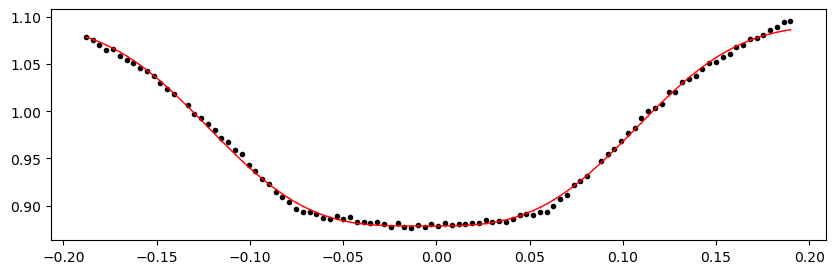

1994.3829356 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.87it/s]


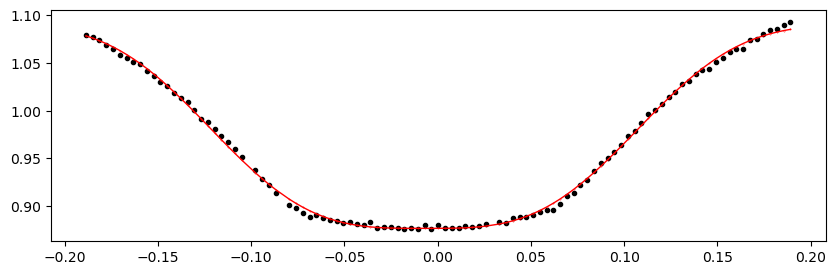

1994.7651668 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.66it/s]


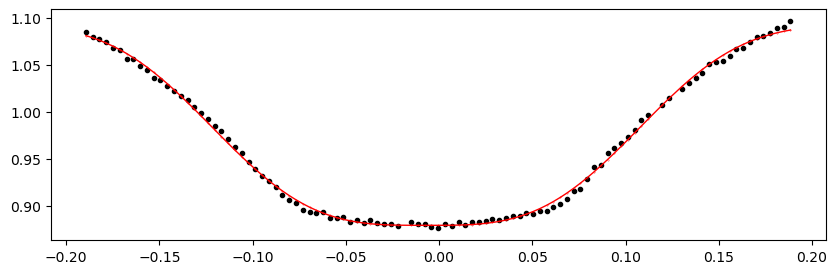

1995.147398 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.97it/s]


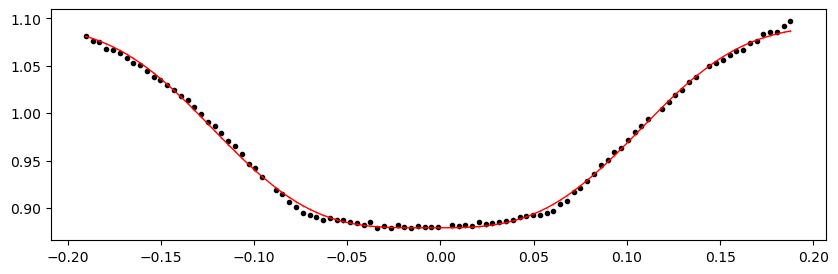

1995.5296292 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.03it/s]


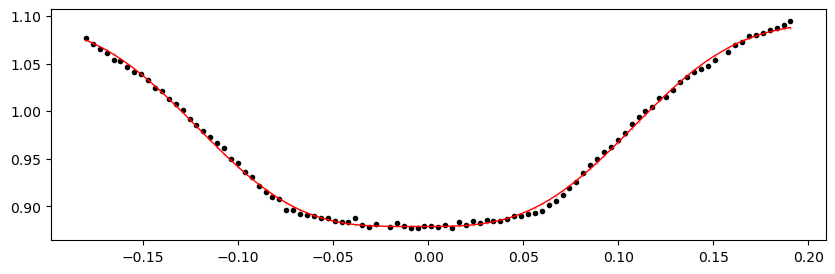

1997.058554 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.84it/s]


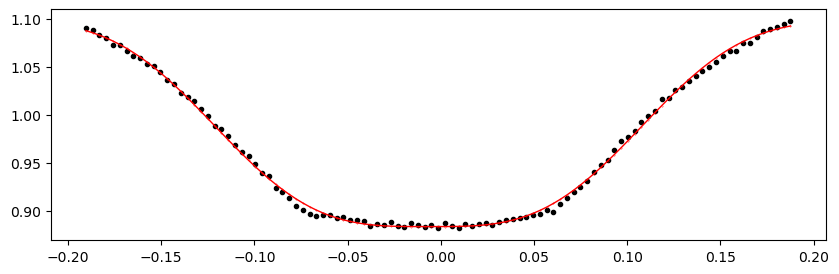

1997.4407852 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.49it/s]


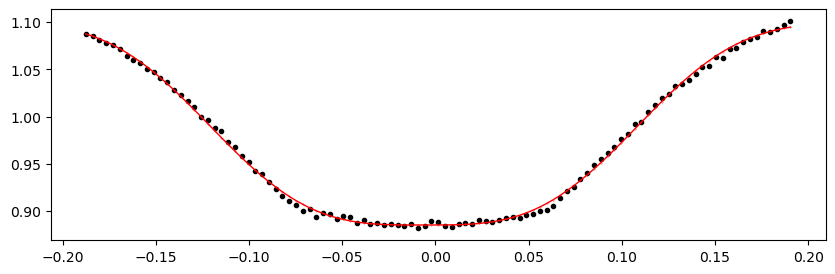

1997.8230164 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.83it/s]


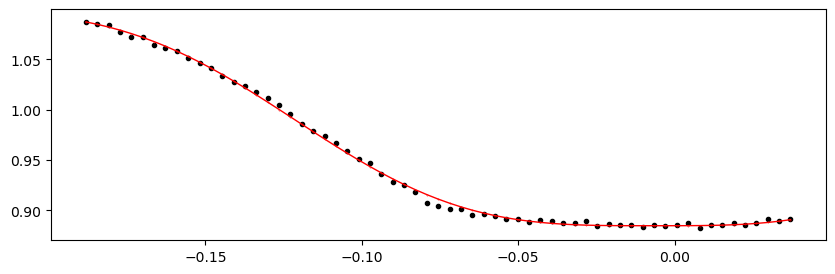

2001.2630972 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.38it/s]


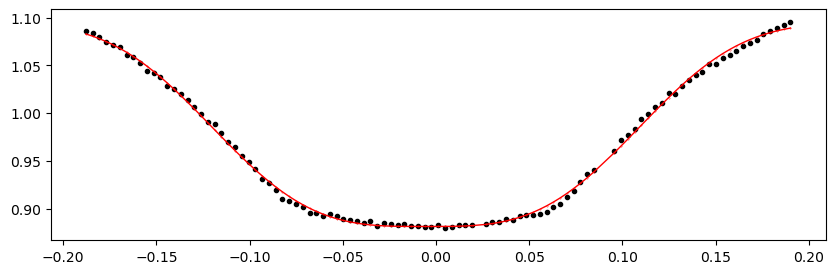

2001.6453284 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.43it/s]


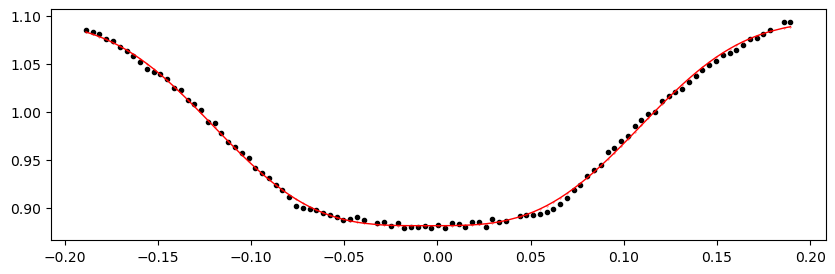

2002.0275596 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.21it/s]


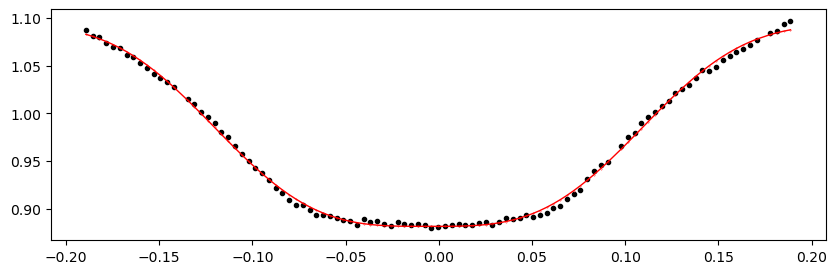

2002.4097908 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.45it/s]


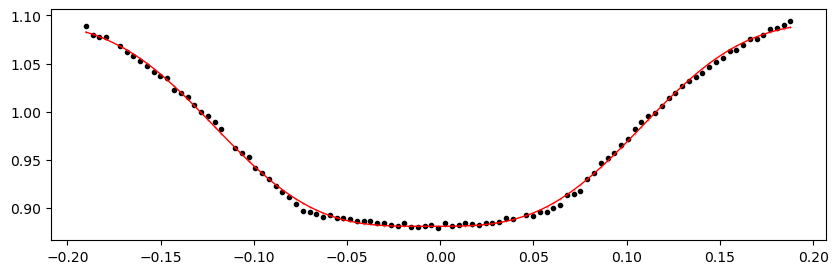

2002.792022 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.83it/s]


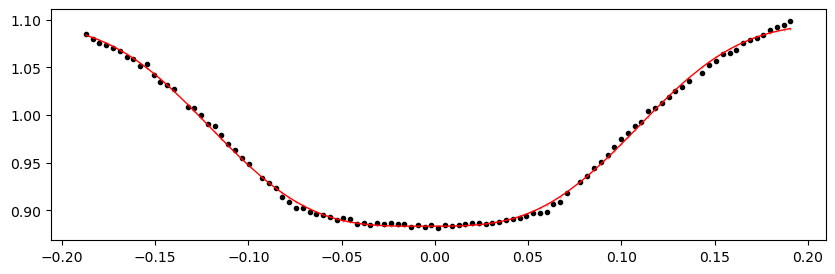

2003.1742532 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.83it/s]


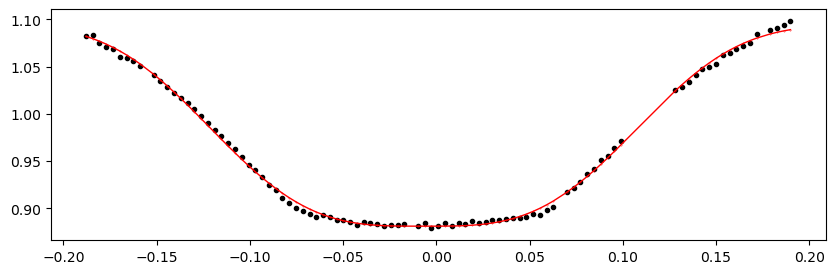

2003.5564844 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.44it/s]


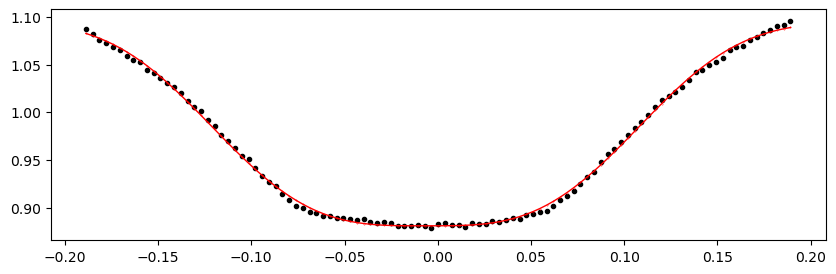

2003.9387156 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.26it/s]


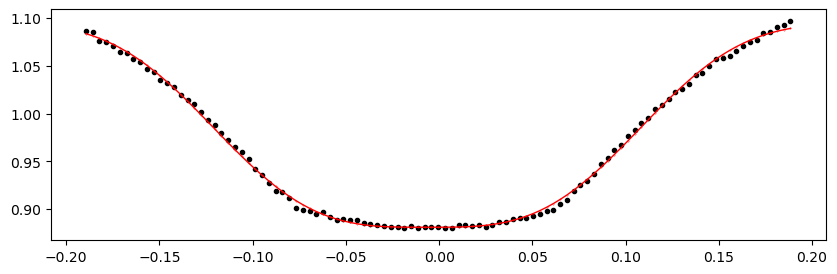

2004.3209468 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.15it/s]


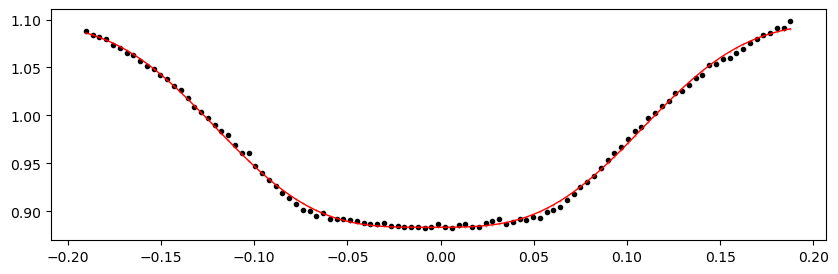

2004.703178 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.84it/s]


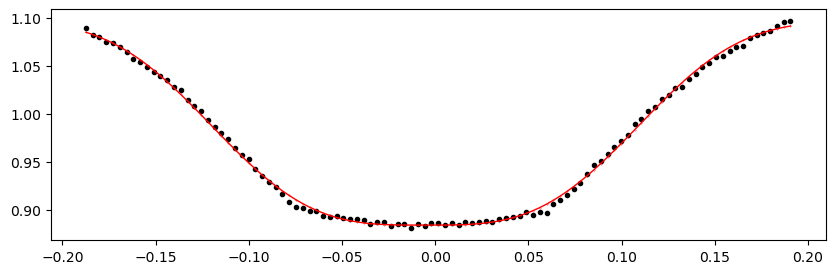

2005.0854092 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.01it/s]


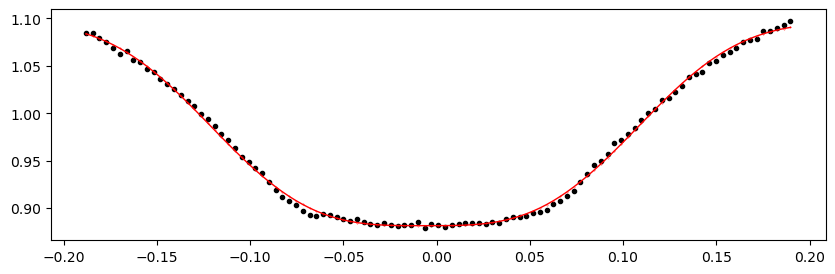

2005.4676404 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.58it/s]


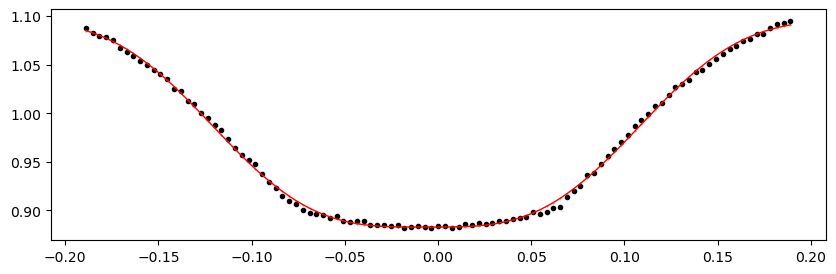

2005.8498716 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.80it/s]


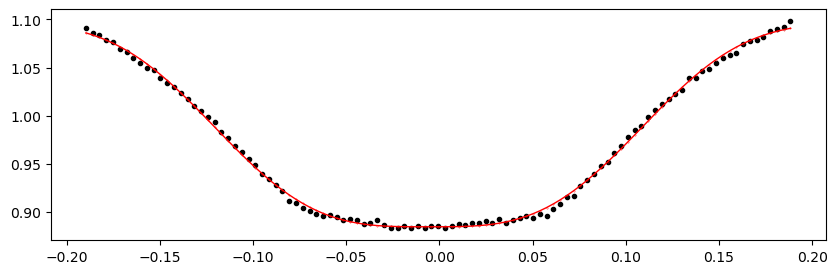

2006.2321028 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.47it/s]


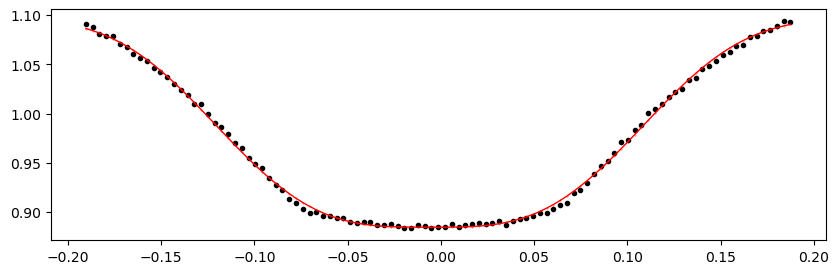

2006.614334 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.79it/s]


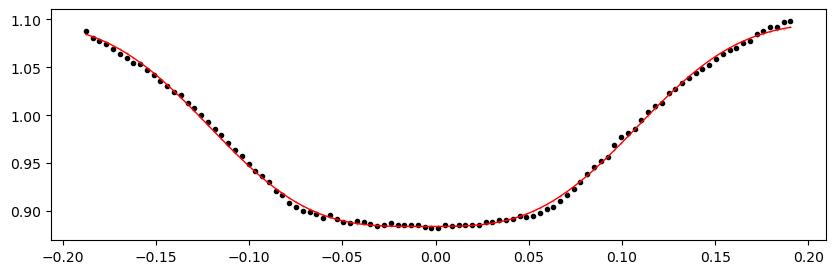

2006.9965652 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.27it/s]


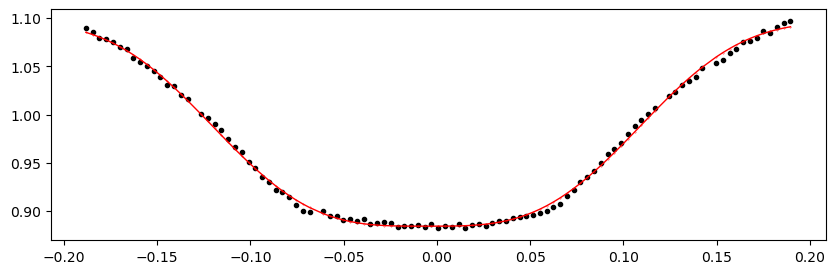

2007.3787964 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.13it/s]


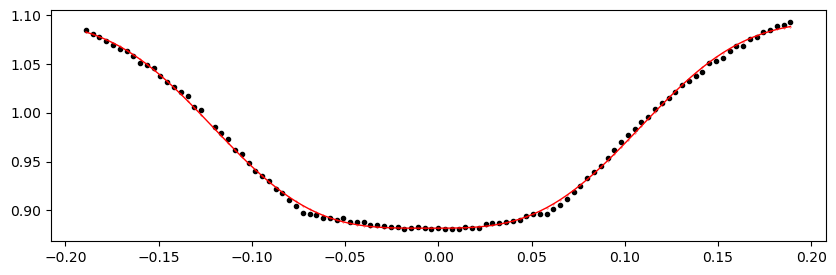

2007.7610276 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.97it/s]


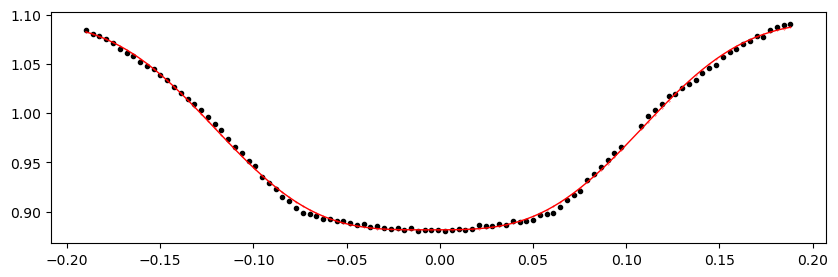

2008.1432588 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.38it/s]


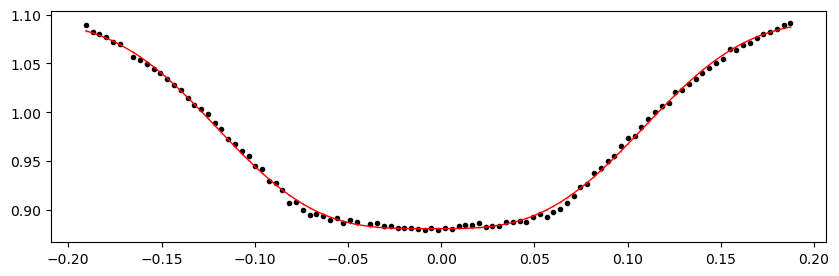

2008.52549 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.90it/s]


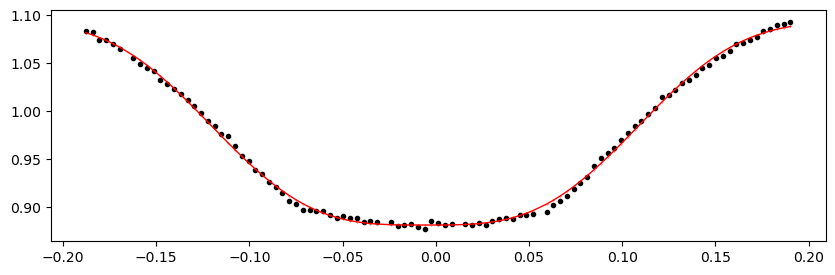

2008.9077212 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.18it/s]


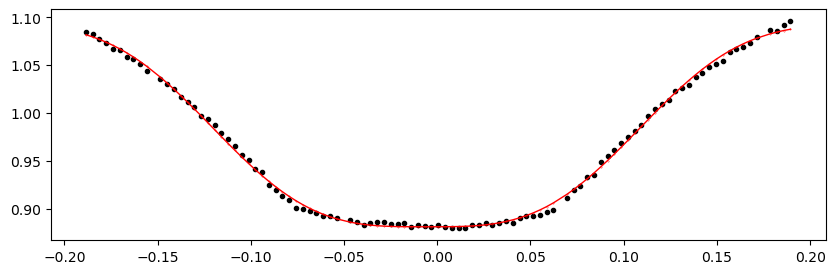

2009.2899524 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.29it/s]


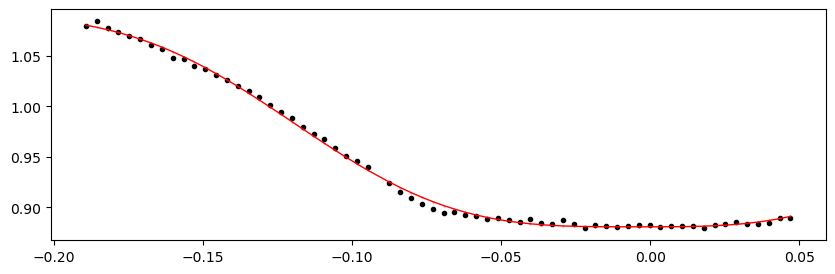

2696.54165 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.93it/s]


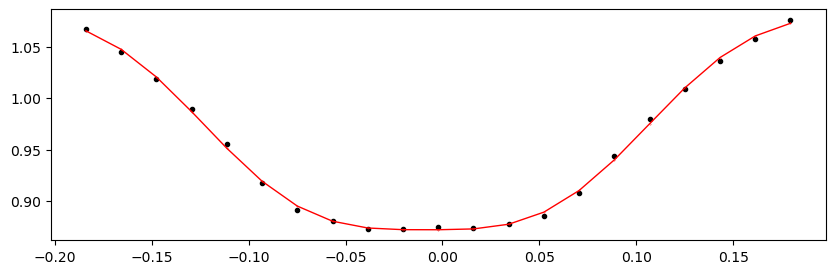

Time 2696.9238812 does not have enough data points: 7
2697.3061124 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.21it/s]


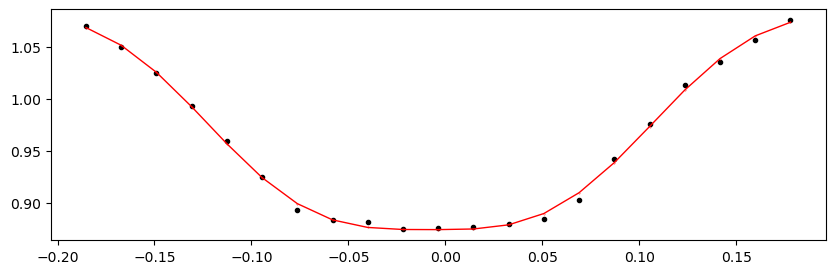

2697.6883436 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.82it/s]


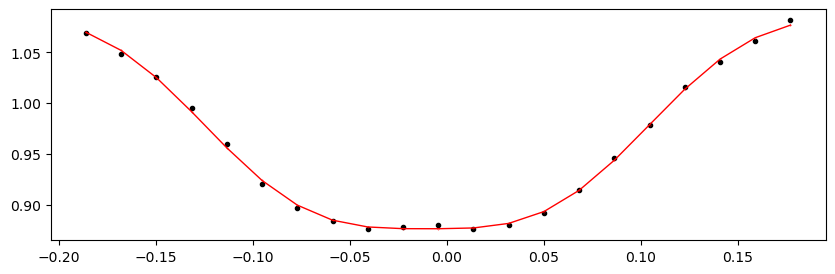

2698.0705748 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.94it/s]


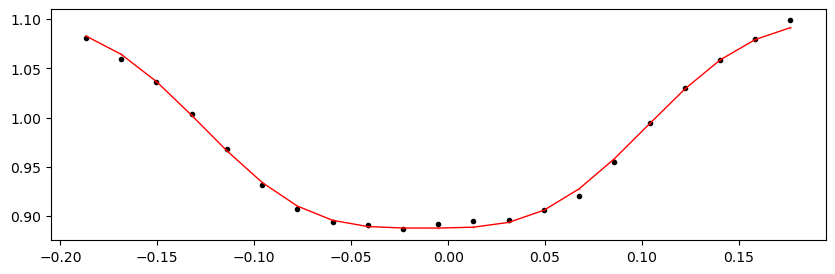

2698.4528060000002 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.52it/s]


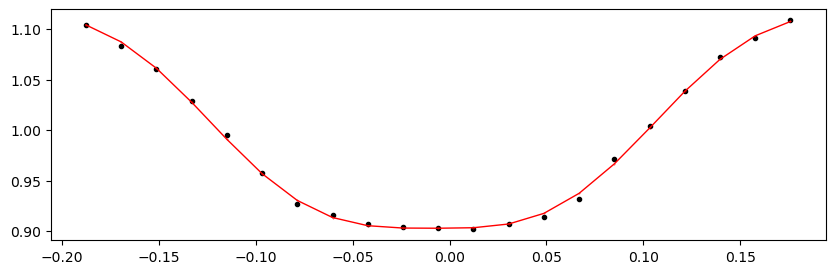

2698.8350372 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.62it/s]


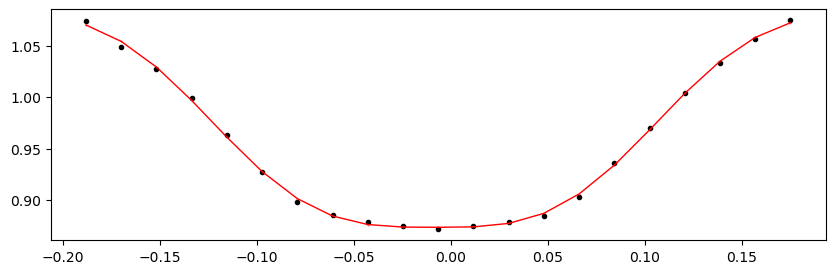

2699.2172683999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.30it/s]


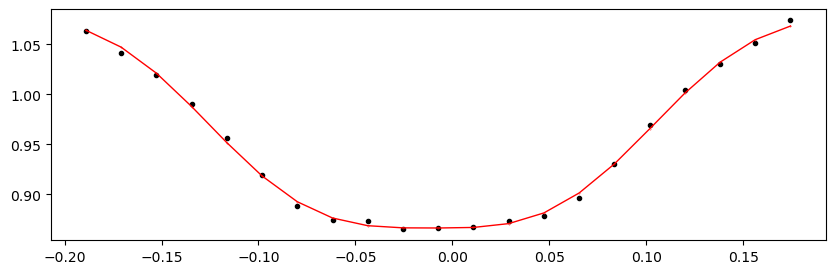

2699.5994996 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.25it/s]


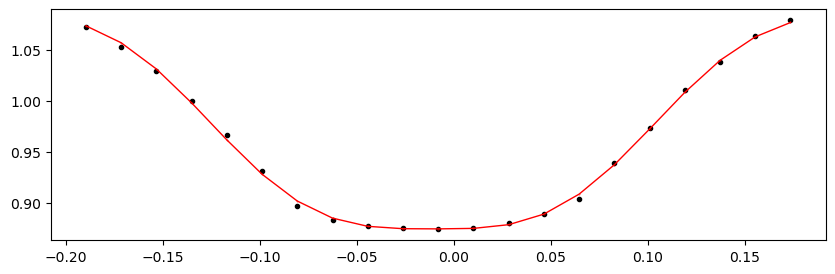

2699.9817308 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.90it/s]


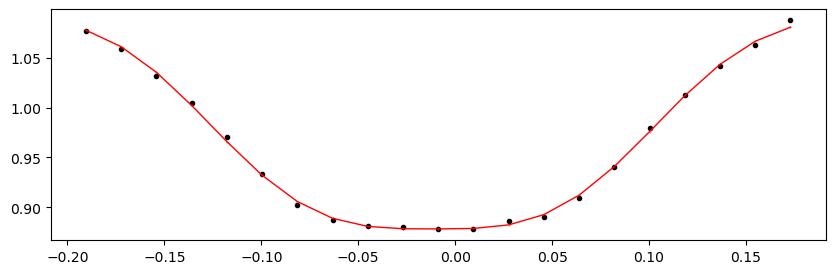

2700.363962 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.14it/s]


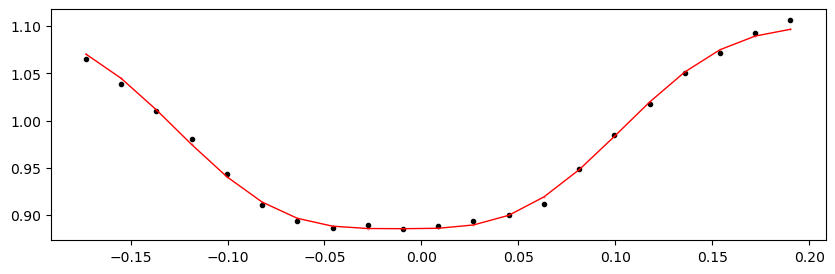

2700.7461932 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.72it/s]


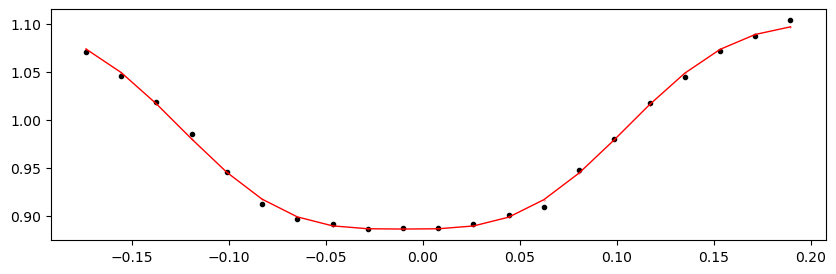

2701.1284244 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.16it/s]


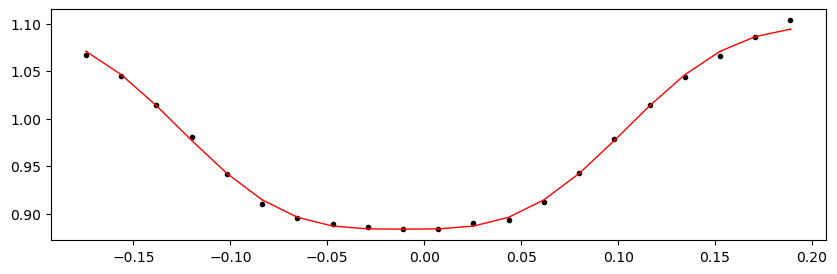

2701.5106556 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.04it/s]


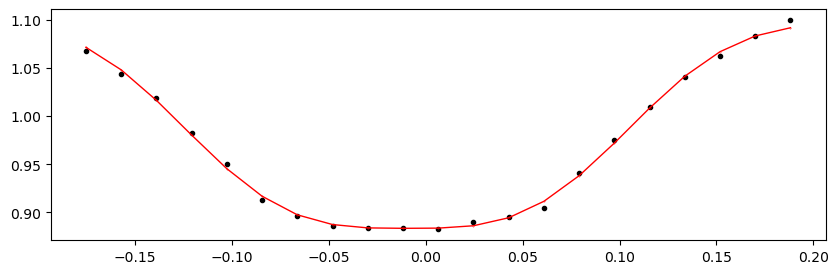

2701.8928868000003 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.58it/s]


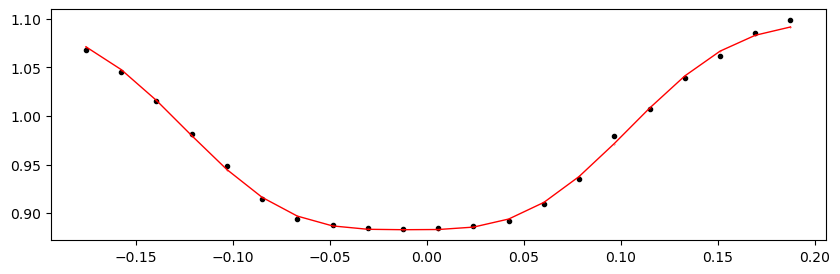

2702.275118 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.88it/s]


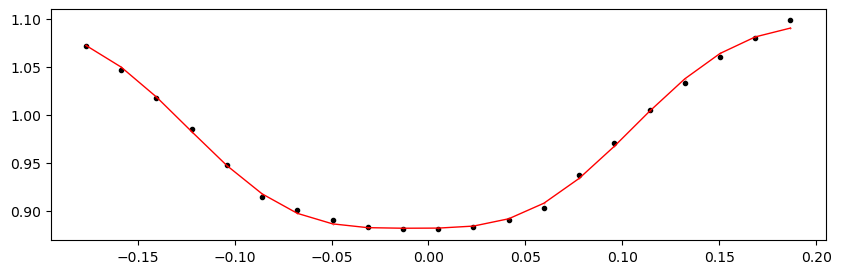

2702.6573491999998 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.11it/s]


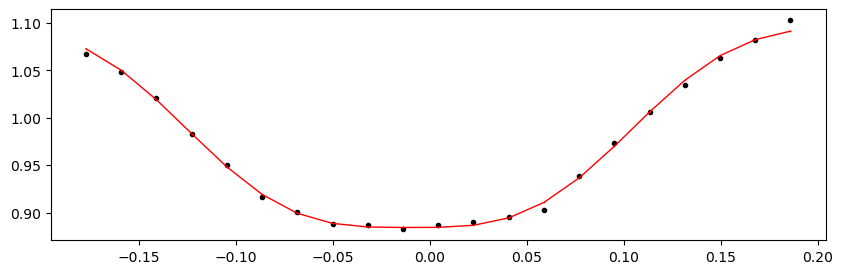

2703.0395804 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.17it/s]


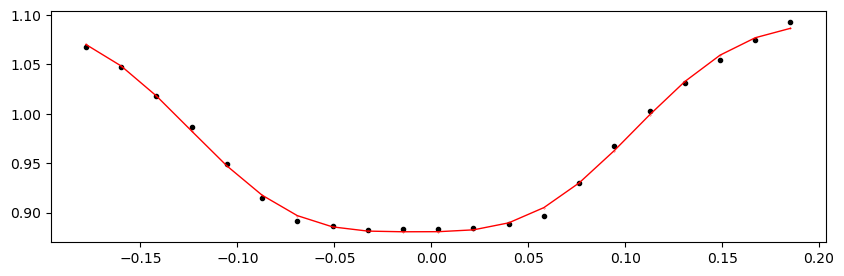

2703.4218116 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.83it/s]


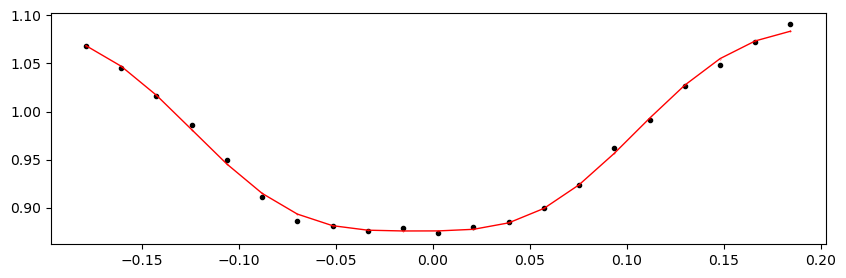

2703.8040428 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.47it/s]


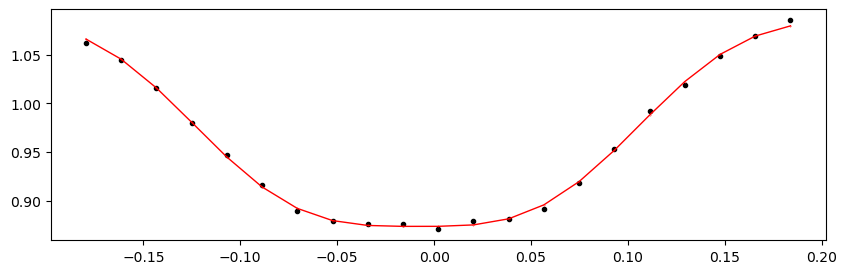

2704.186274 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.08it/s]


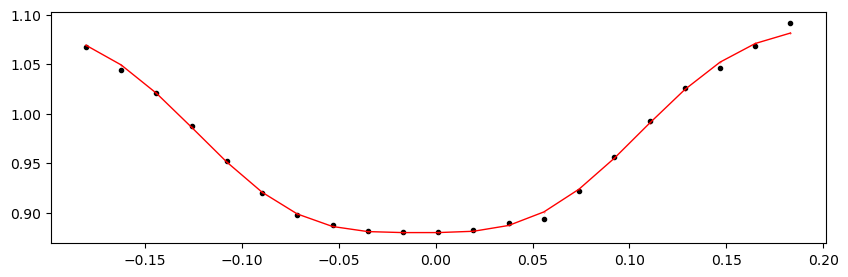

2704.5685052 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.60it/s]


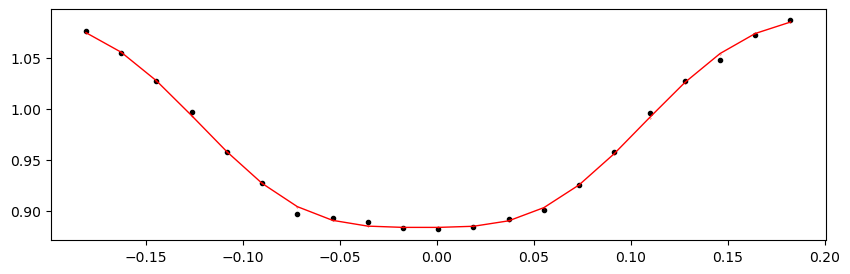

Time 2709.919742 does not have enough data points: 10
2710.3019732000002 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.90it/s]


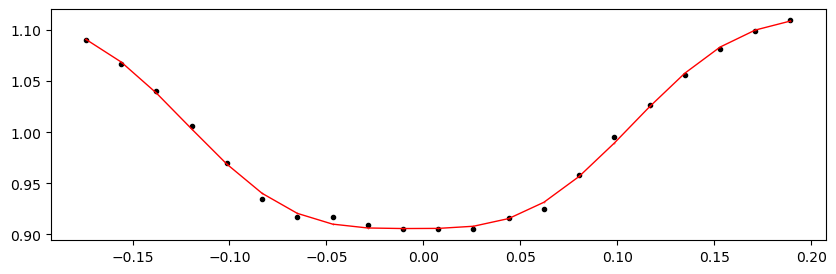

2710.6842044 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.88it/s]


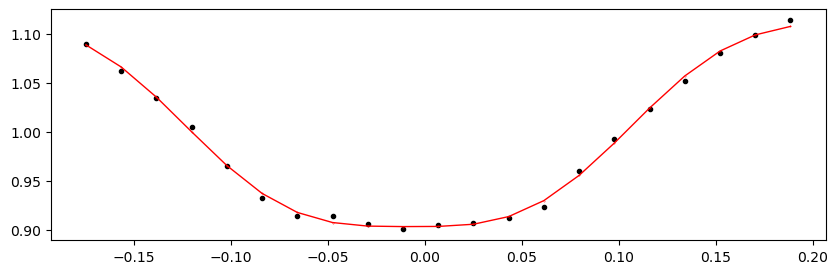

2711.0664355999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.36it/s]


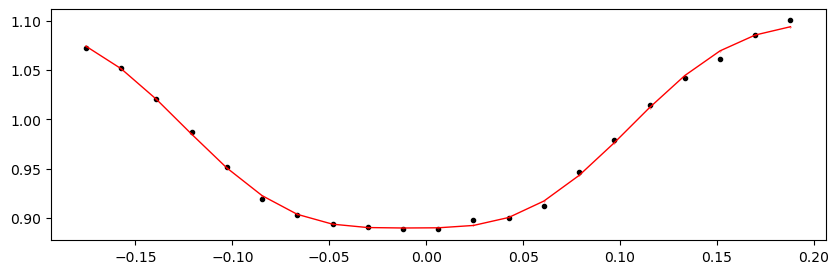

2711.4486668 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.47it/s]


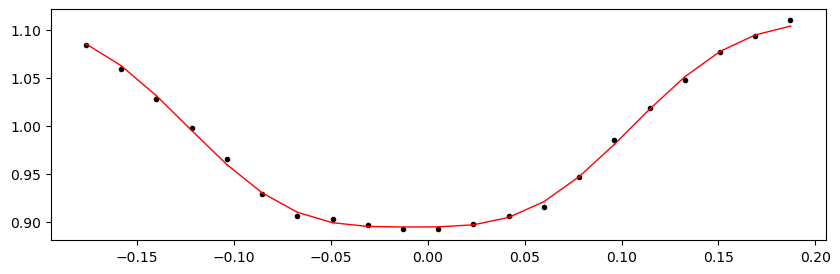

2711.830898 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.62it/s]


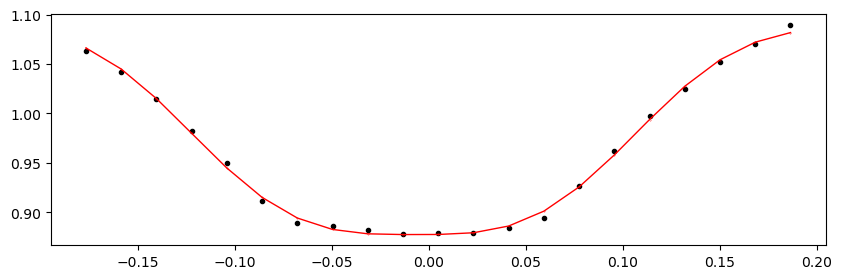

2712.2131292 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.85it/s]


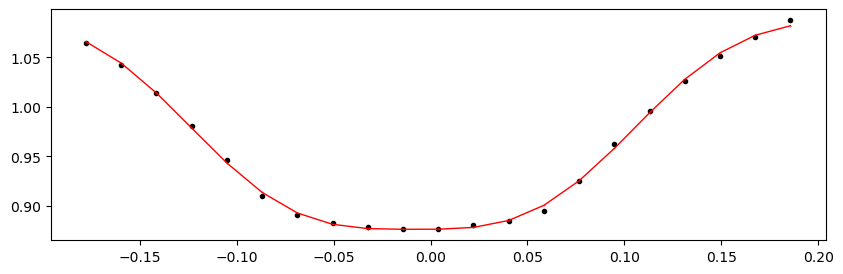

2712.5953604 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.12it/s]


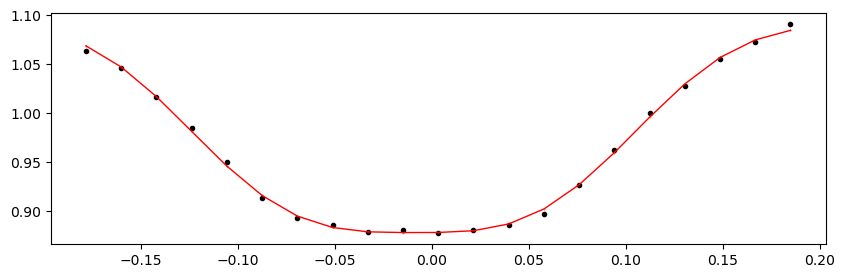

2712.9775916 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.40it/s]


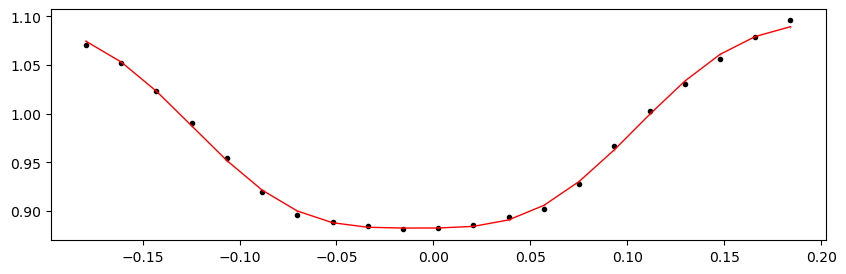

2713.3598228 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.59it/s]


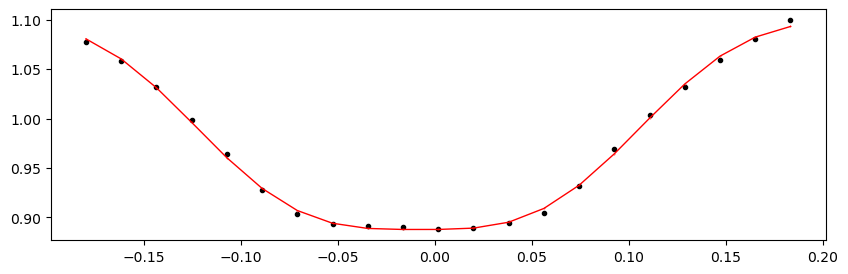

2713.742054 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.27it/s]


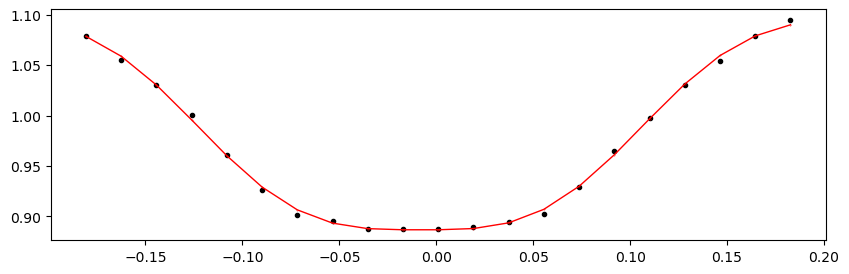

2714.1242852 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.90it/s]


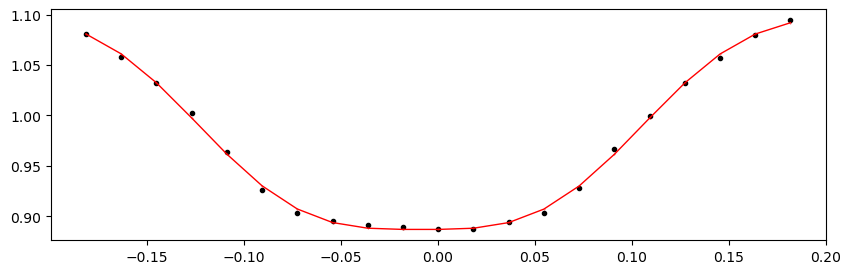

2714.5065164 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.41it/s]


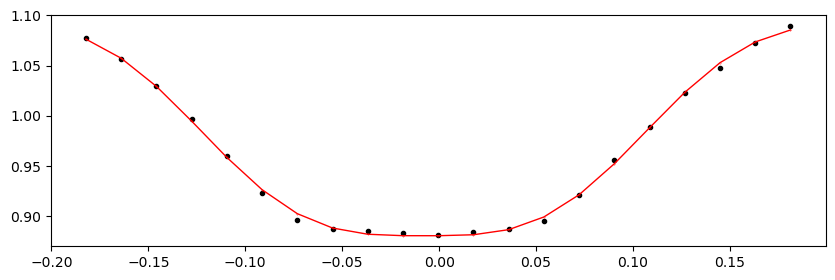

2714.8887476 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.05it/s]


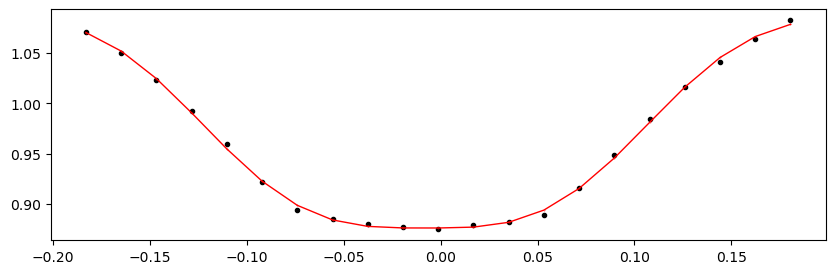

2715.2709788 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.68it/s]


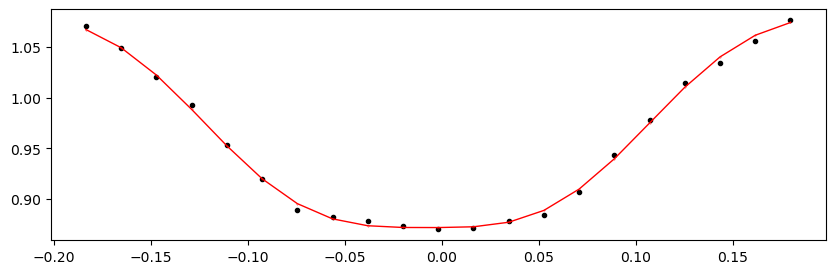

2715.65321 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.63it/s]


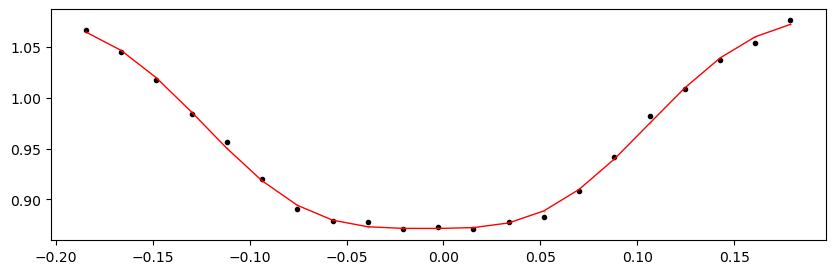

2716.0354412 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.84it/s]


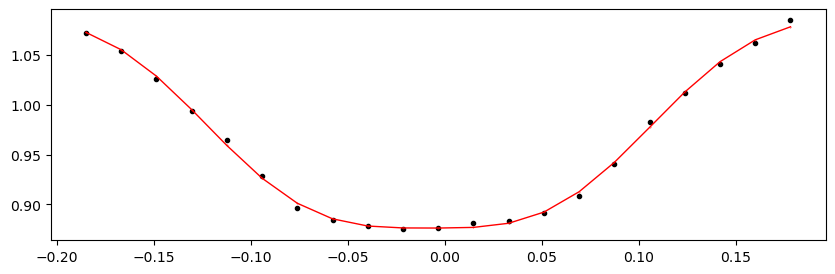

2716.4176724 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.49it/s]


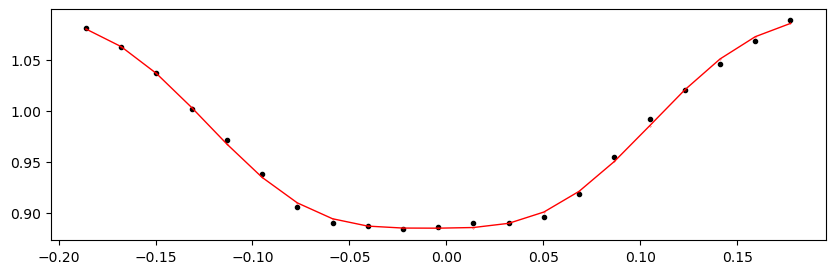

2716.7999036 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.09it/s]


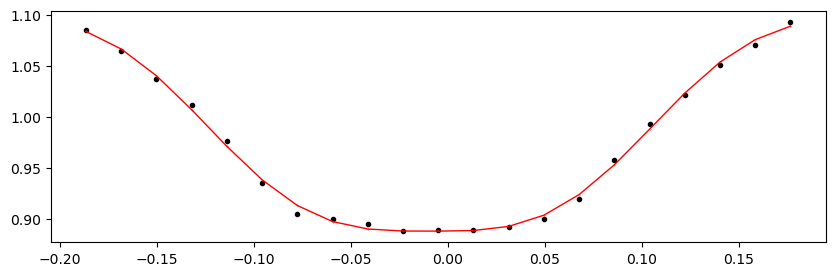

2717.1821348 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.92it/s]


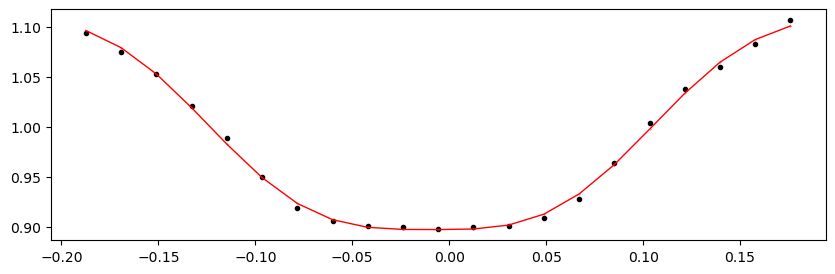

Time 2717.564366 does not have enough data points: 7
Time 2718.7110596 does not have enough data points: 20
2719.0932908 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.16it/s]


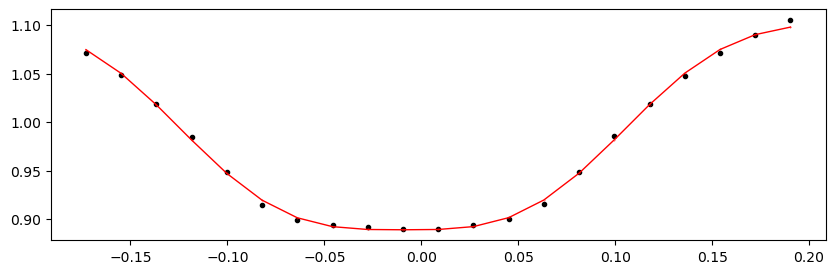

2719.4755219999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.08it/s]


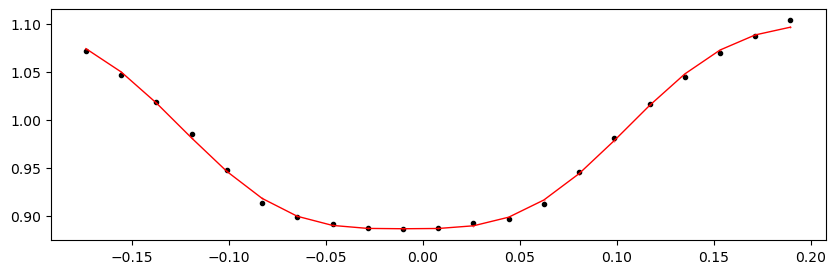

2719.8577532 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.74it/s]


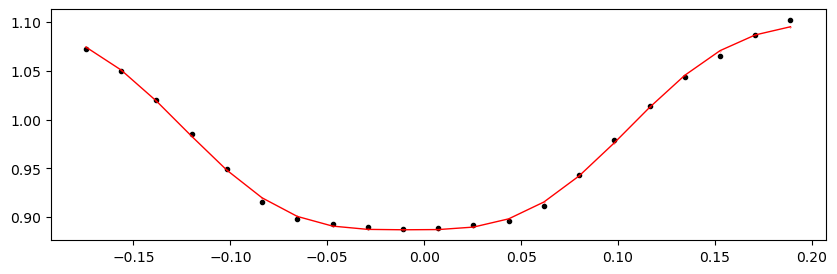

Time 2720.2399844 does not have enough data points: 19
Time 2720.6222156 does not have enough data points: 8
2725.5912212 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.73it/s]


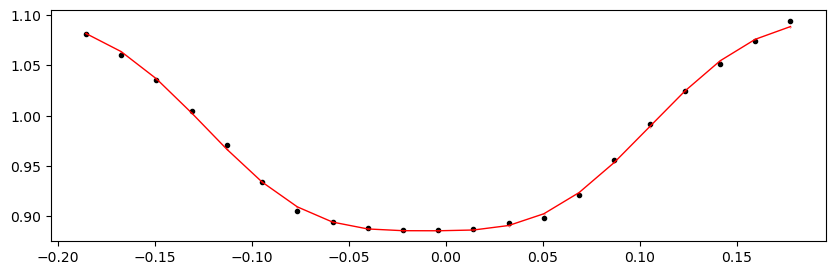

2725.9734524 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.83it/s]


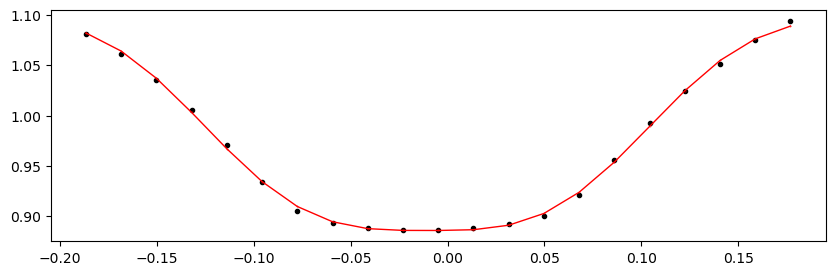

2726.3556836 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.88it/s]


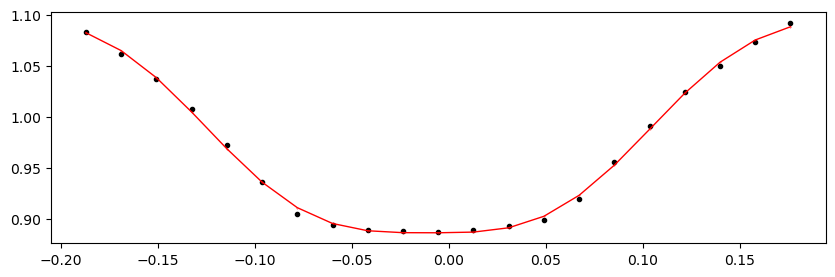

2726.7379148 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.76it/s]


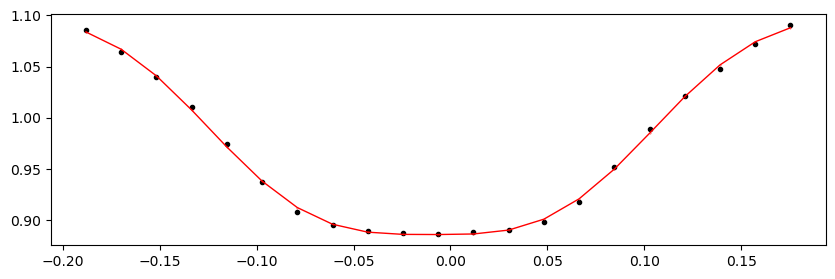

2727.120146 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [3:27:59<00:00,  1.25s/it]


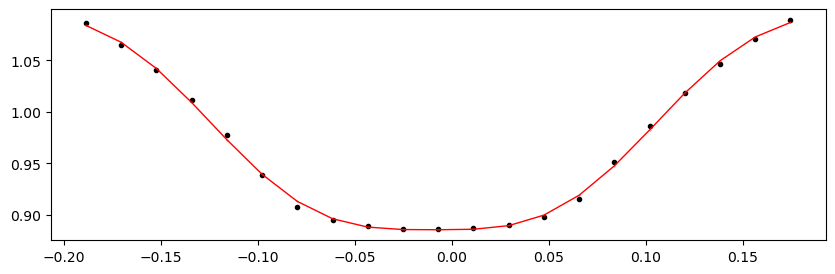

2727.5023772 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 279.98it/s]


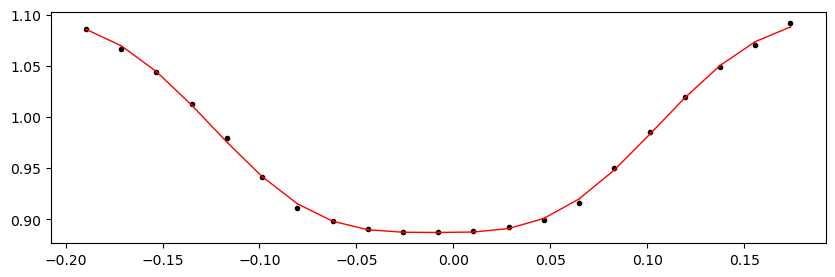

2727.8846083999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.02it/s]


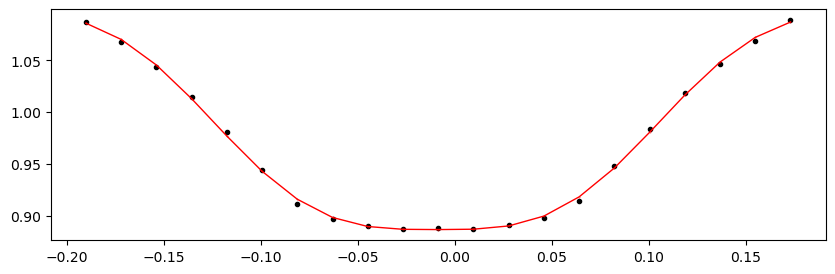

2728.2668396 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.91it/s]


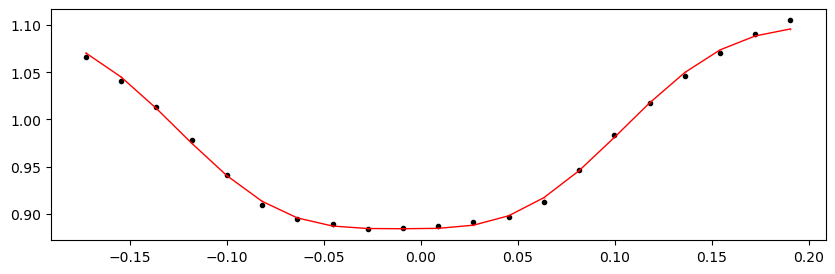

2728.6490708 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.33it/s]


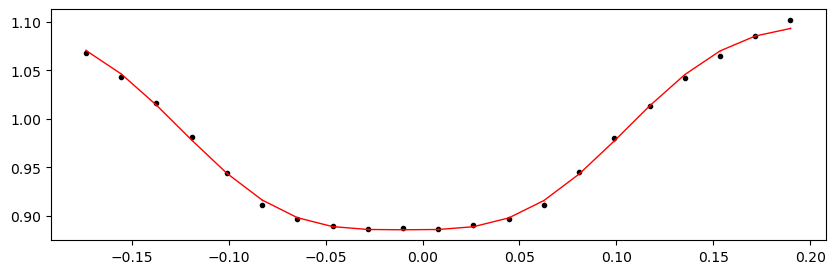

2729.031302 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.97it/s]


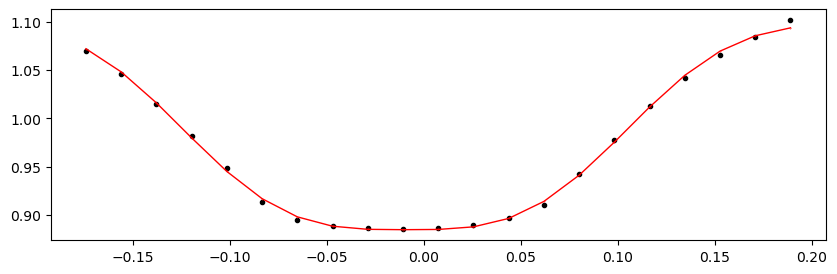

2729.4135332 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.01it/s]


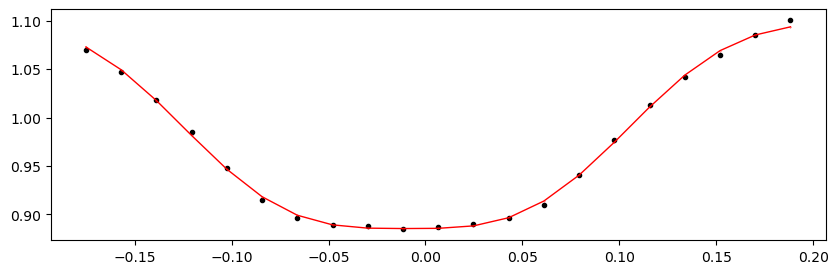

2729.7957644 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.35it/s]


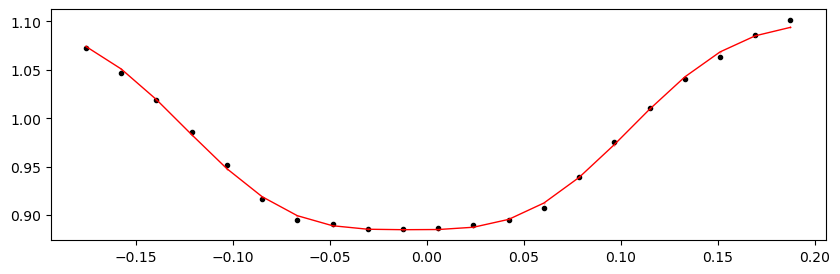

2730.1779956 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.47it/s]


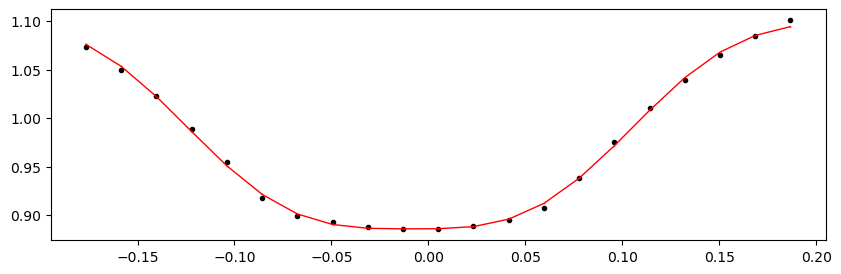

2731.7069204 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.62it/s]


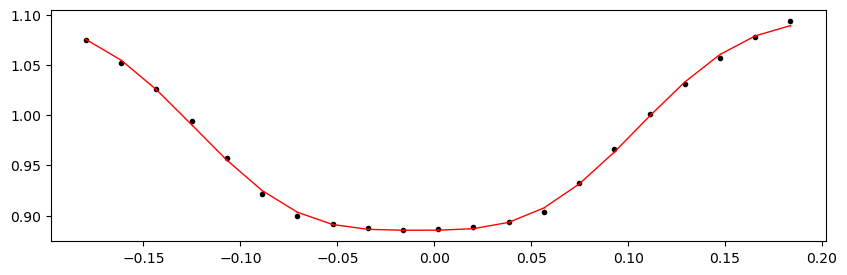

2732.0891516 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.04it/s]


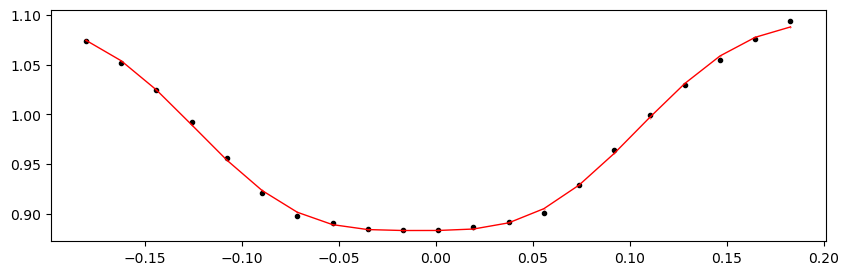

2732.4713828 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.55it/s]


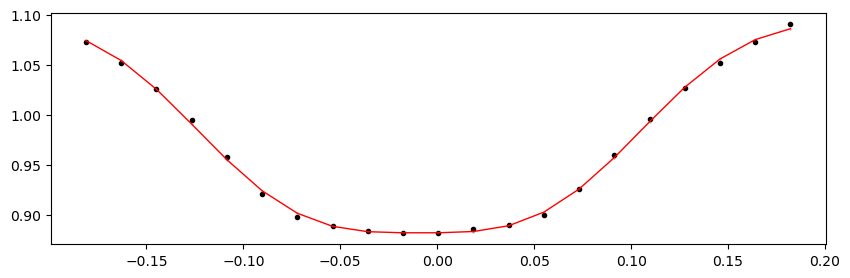

2732.853614 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.47it/s]


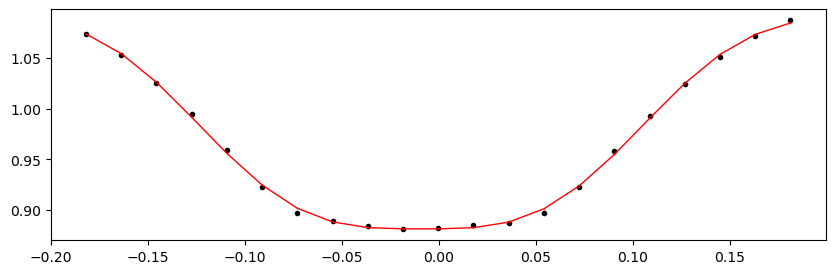

2733.2358452 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.21it/s]


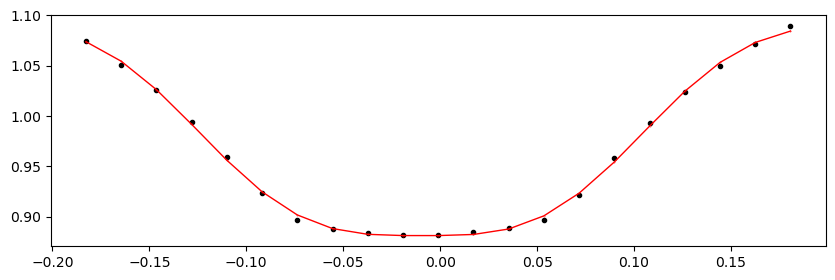

Time 2733.6180764 does not have enough data points: 11
Time 2738.2048508 does not have enough data points: 6
2738.587082 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.53it/s]


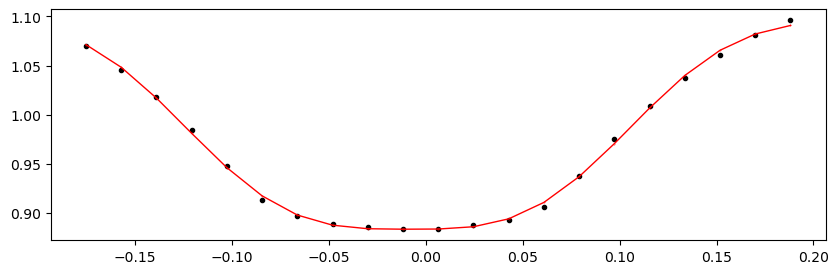

2738.9693132 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.01it/s]


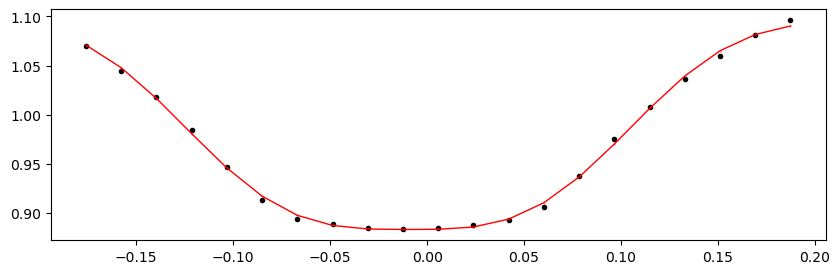

2739.3515444 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.81it/s]


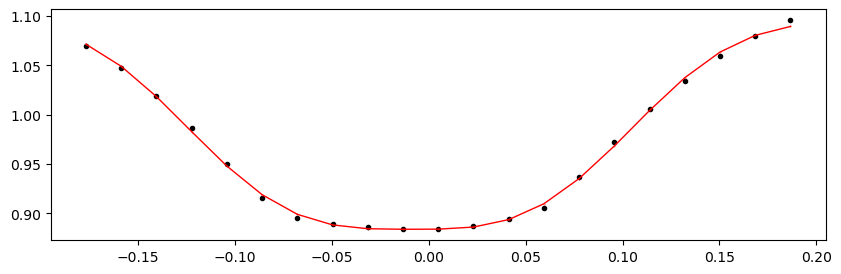

2739.7337755999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.33it/s]


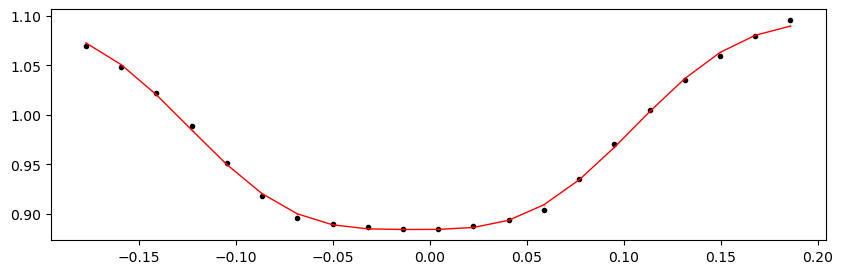

2740.1160068 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.12it/s]


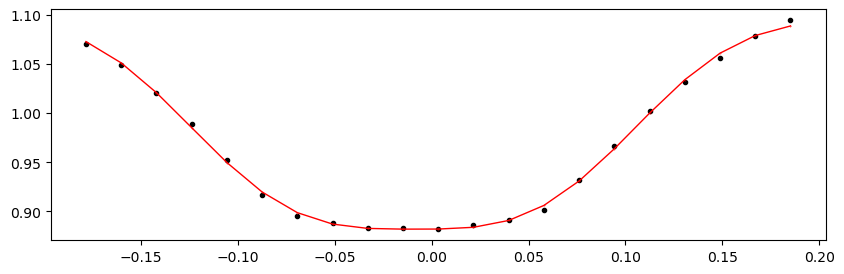

2740.498238 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.91it/s]


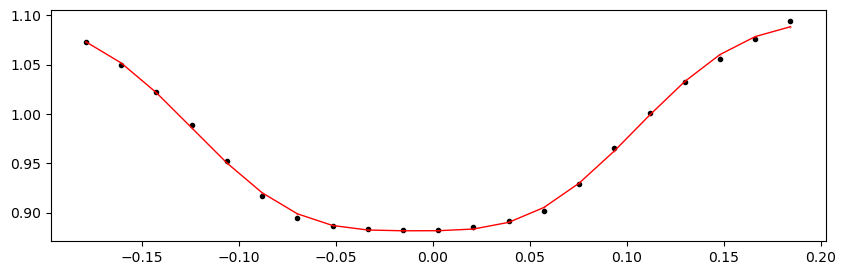

2740.8804692 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.90it/s]


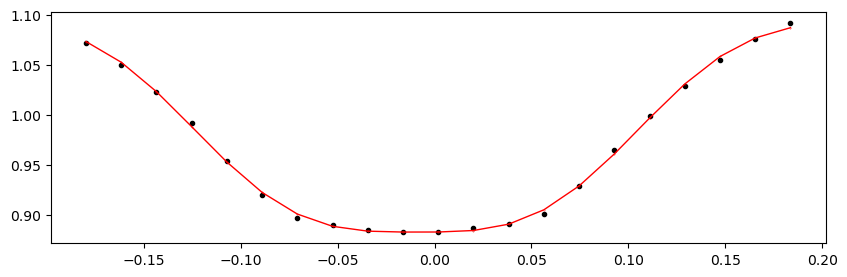

2741.2627004 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.12it/s]


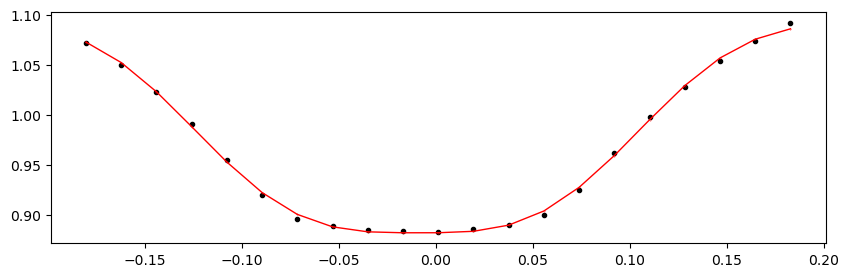

2741.6449316 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.80it/s]


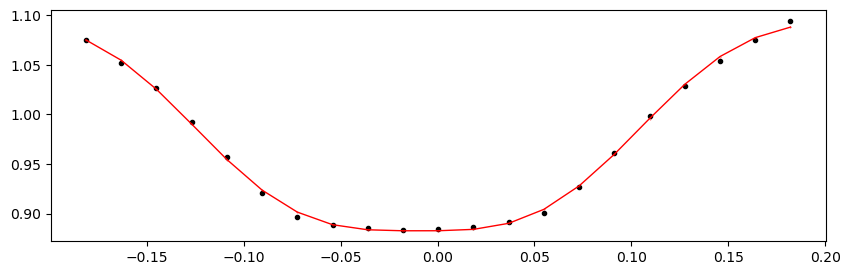

2742.0271628 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.22it/s]


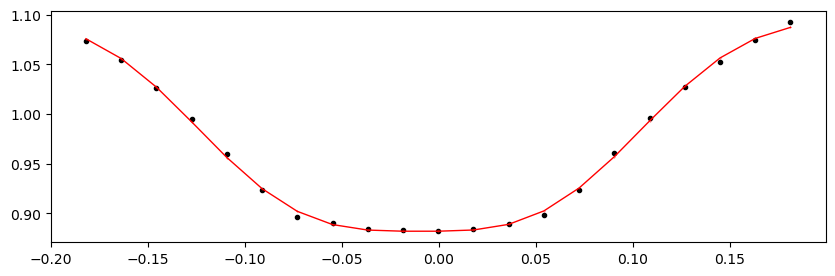

2742.4093940000002 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.59it/s]


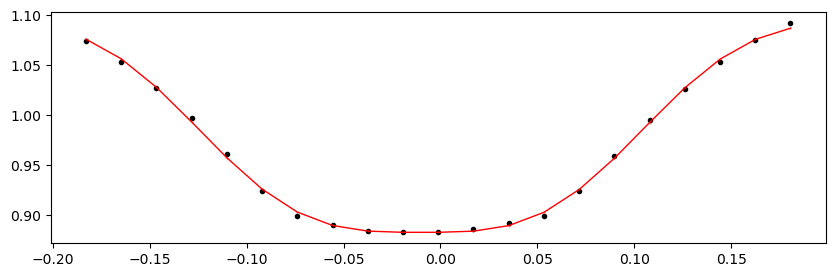

2742.7916252 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.12it/s]


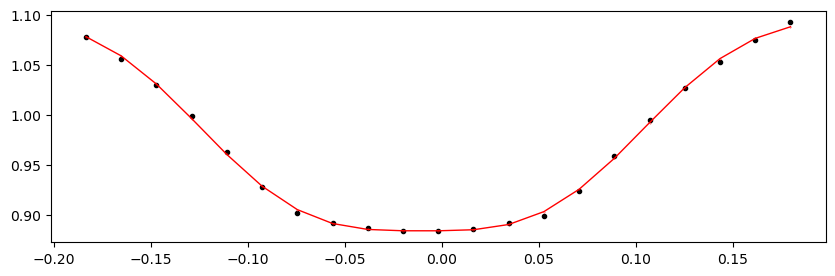

In [28]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=20, 
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"

# ---

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=20, 
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

Fitting individual secondary eclipses...
Creating new manifest file
1956.1598156 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.01it/s]


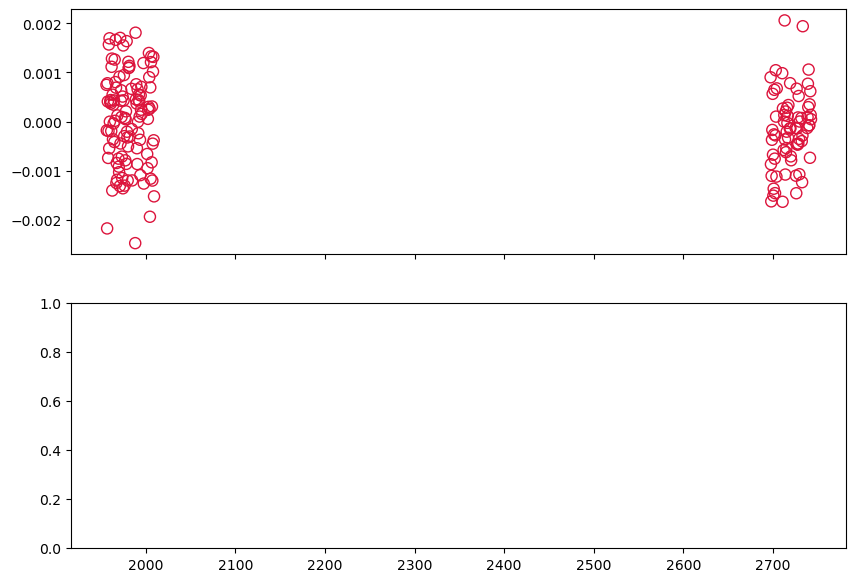

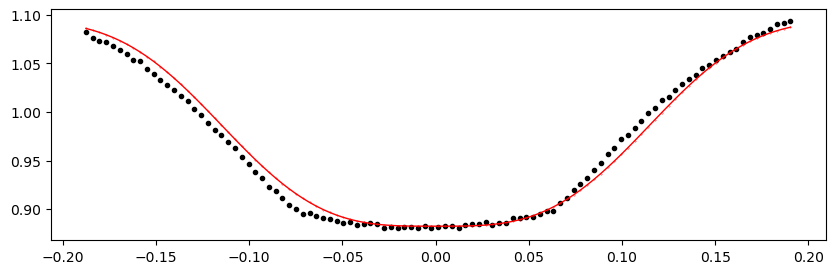

1956.5420468 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.43it/s]


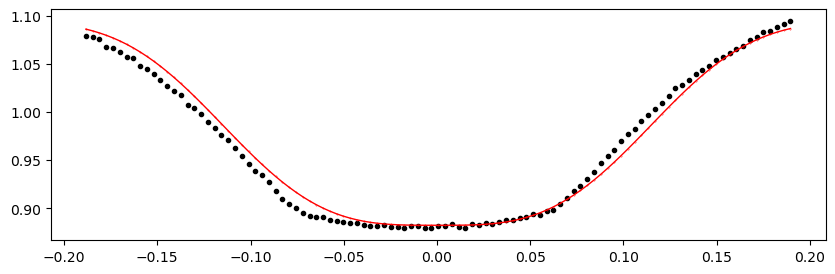

1956.924278 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.45it/s]


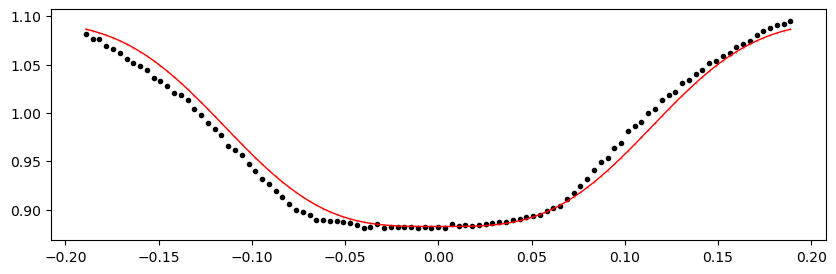

1957.3065092 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.92it/s]


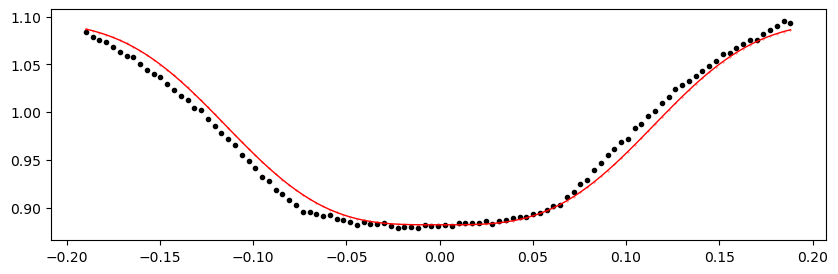

1957.6887404 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.04it/s]


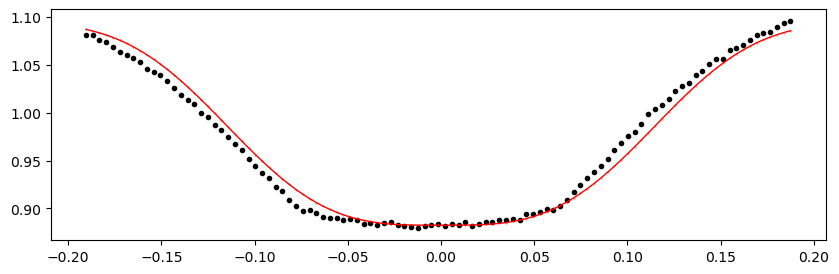

1958.0709716 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1328.92it/s]


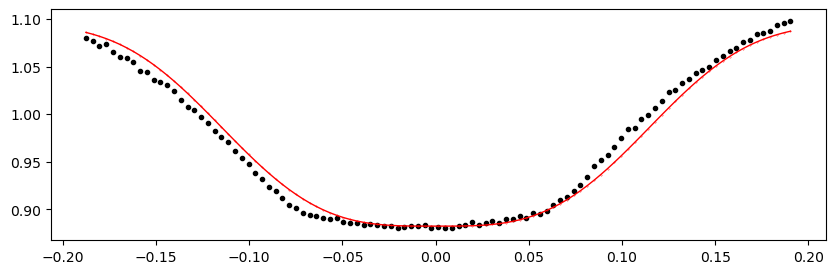

1958.4532028 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.90it/s]


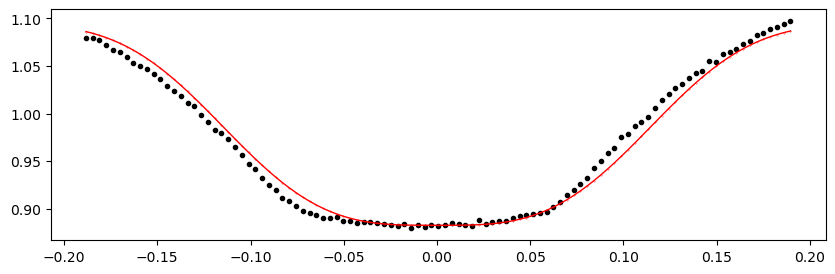

1958.835434 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1377.01it/s]


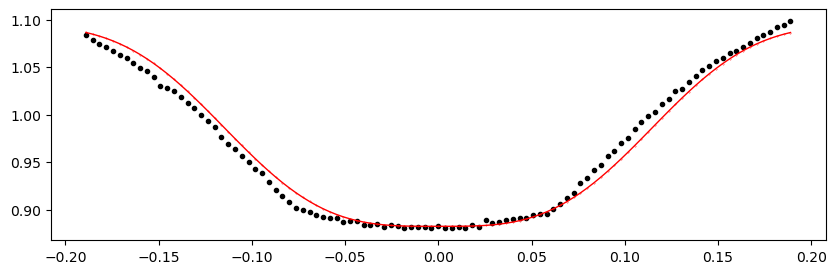

1959.2176652 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.07it/s]


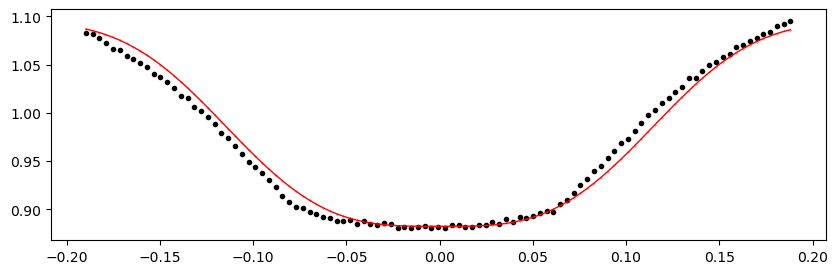

1959.5998964 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1316.33it/s]


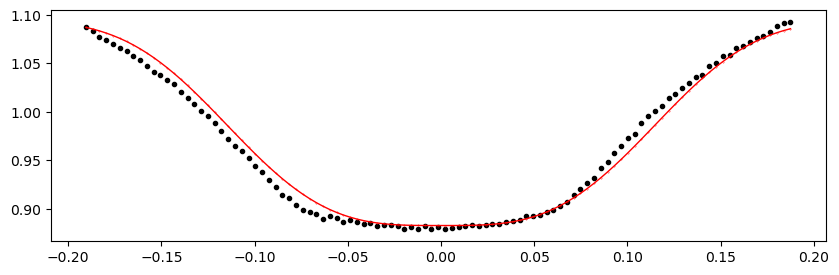

1959.9821276 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.54it/s]


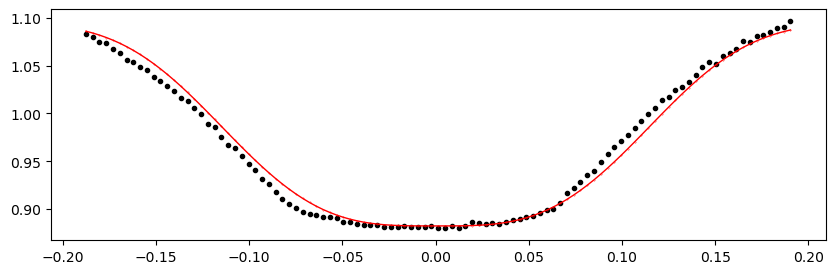

1960.3643588 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.89it/s]


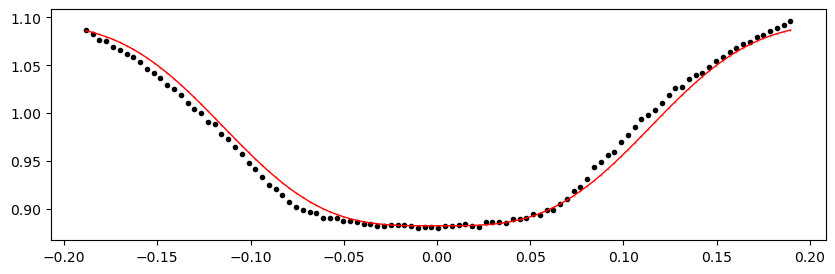

1960.74659 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1306.23it/s]


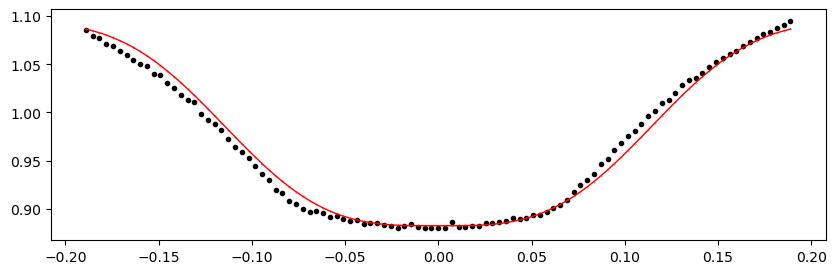

1961.1288212 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1294.92it/s]


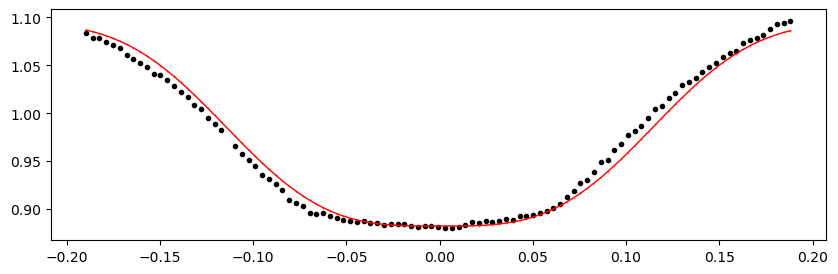

1961.5110524 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.92it/s]


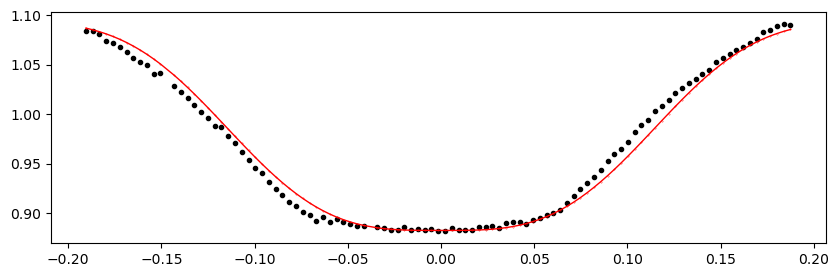

1961.8932836 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.66it/s]


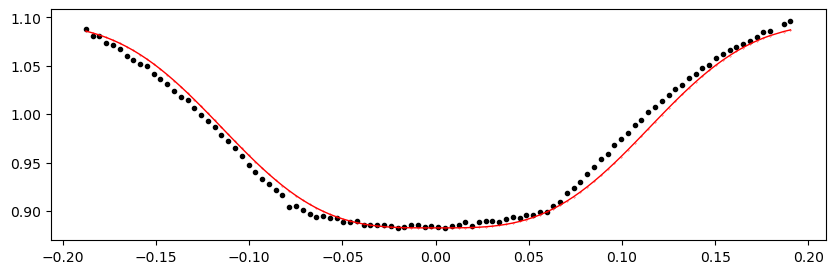

1962.2755148 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.73it/s]


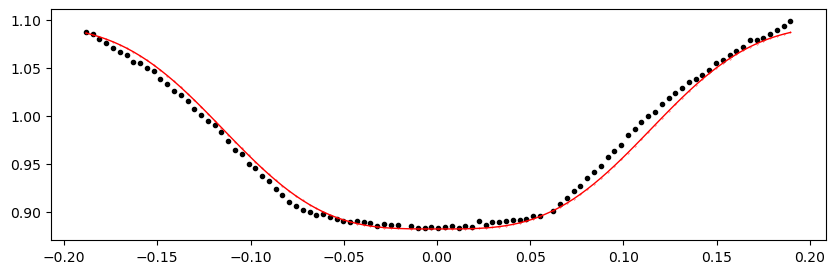

1962.657746 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.46it/s]


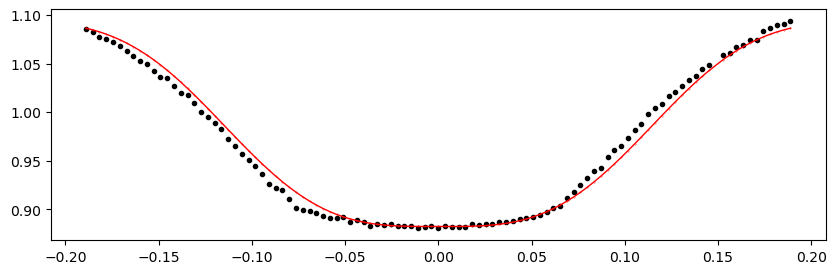

1963.0399772 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.70it/s]


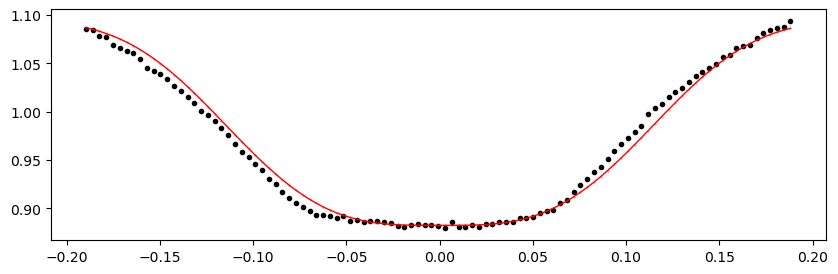

1963.4222084 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.18it/s]


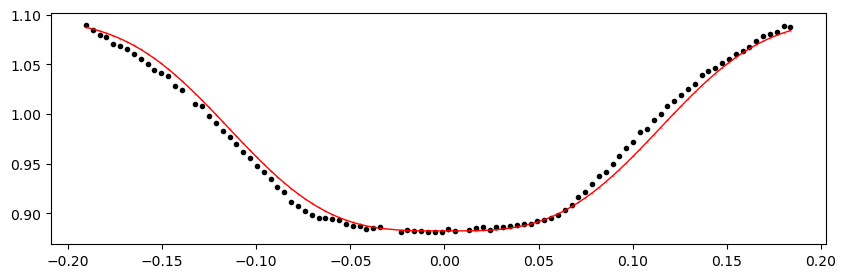

1963.8044396 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.78it/s]


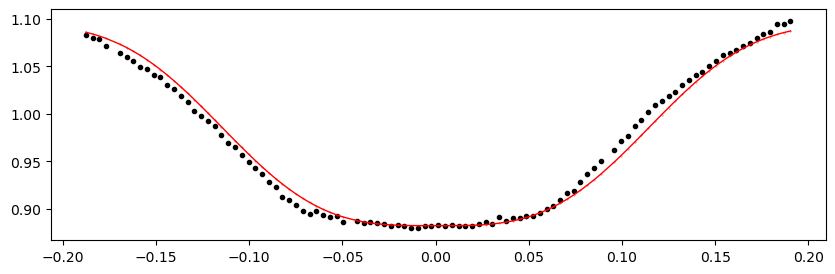

1964.1866708 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.51it/s]


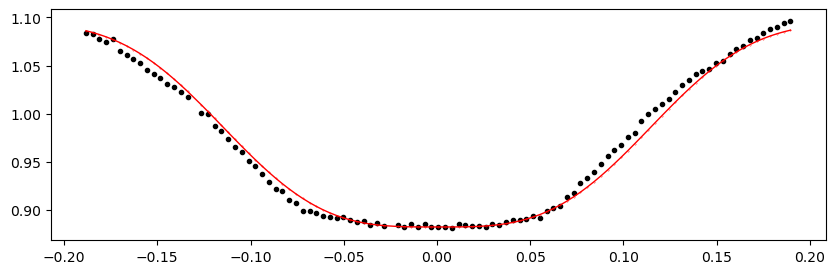

1964.568902 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.62it/s]


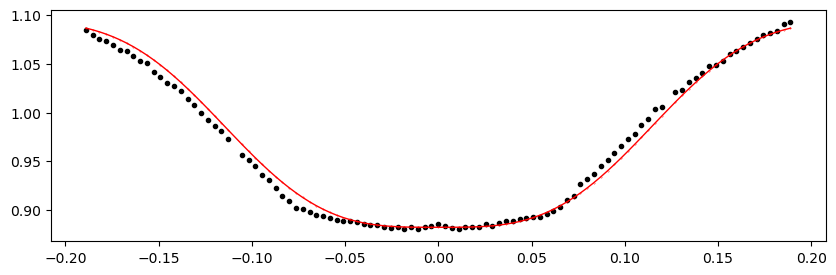

1964.9511332 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.25it/s]


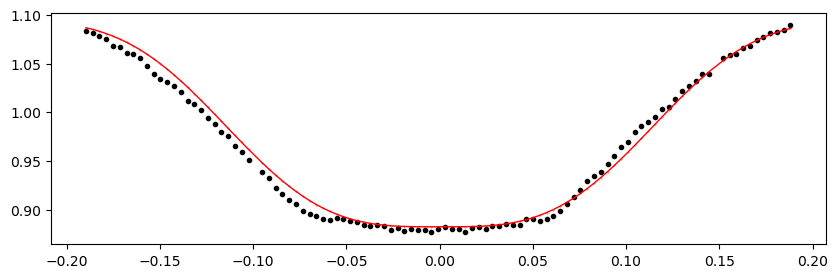

1965.3333644 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.17it/s]


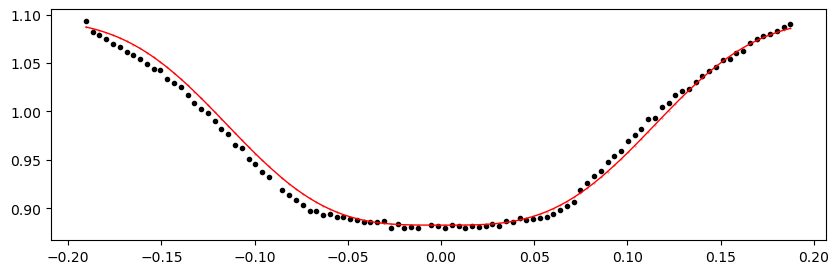

1965.7155956 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1376.18it/s]


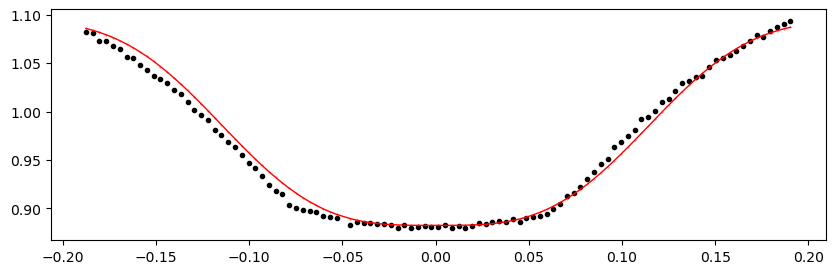

1966.0978268 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.24it/s]


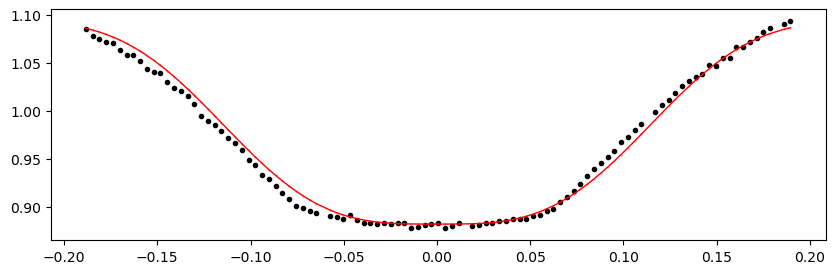

1966.480058 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.49it/s]


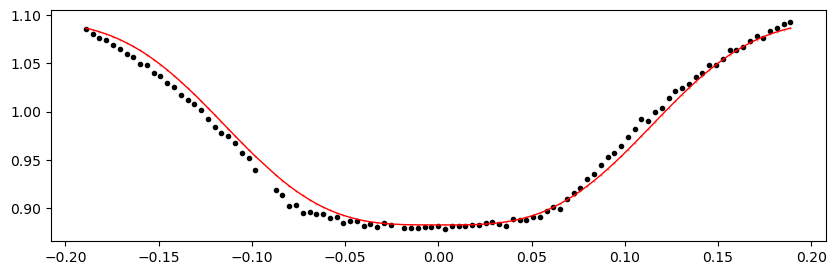

1966.8622892 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.70it/s]


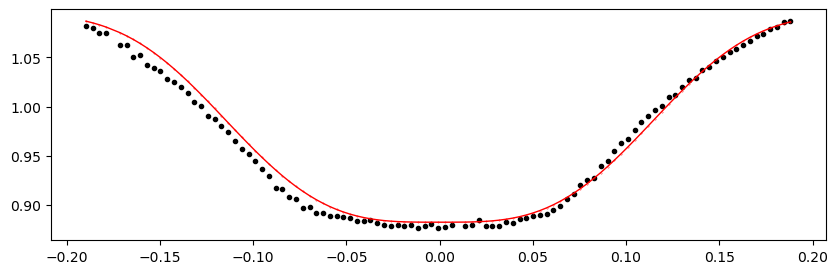

1967.2445204 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.72it/s]


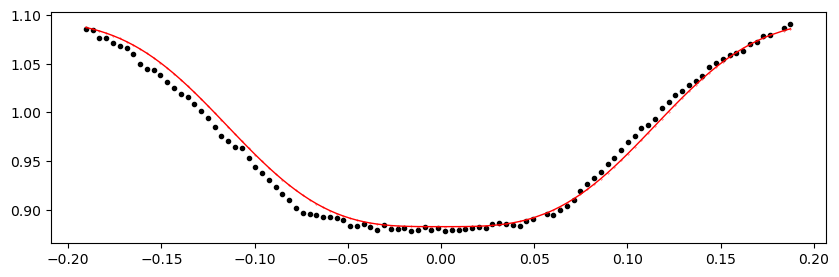

1967.6267516 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1382.09it/s]


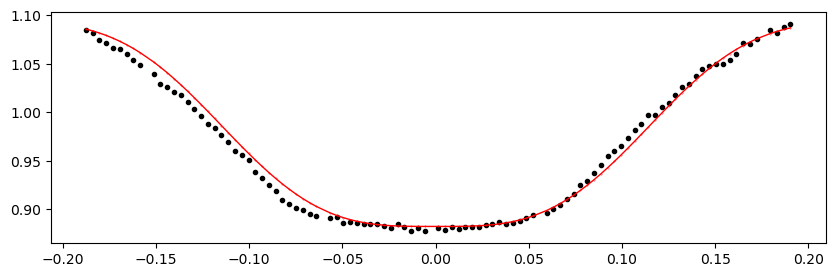

1968.0089828 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.65it/s]


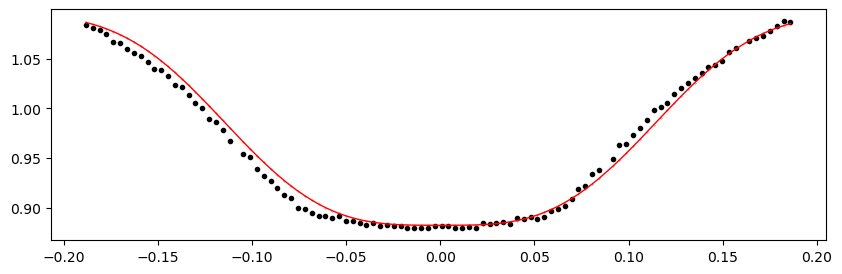

1968.391214 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.84it/s]


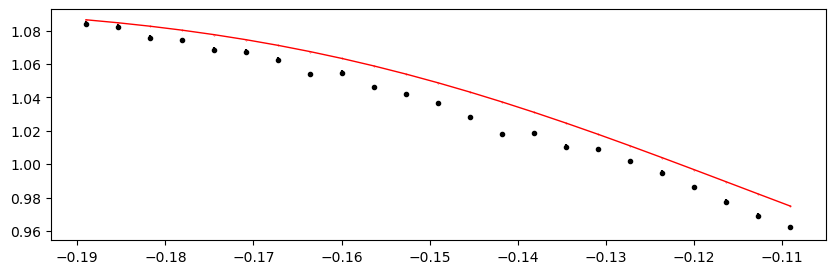

1969.5379076 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.35it/s]


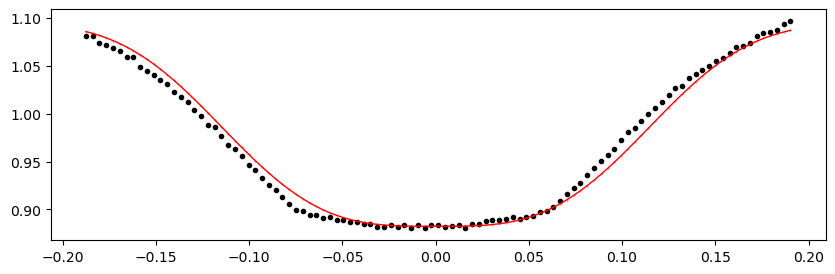

1969.9201388 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.02it/s]


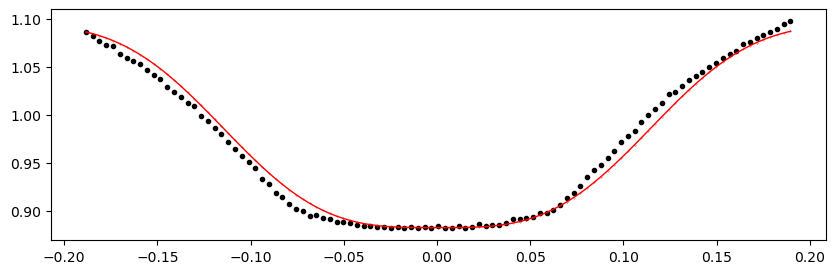

1970.30237 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.09it/s]


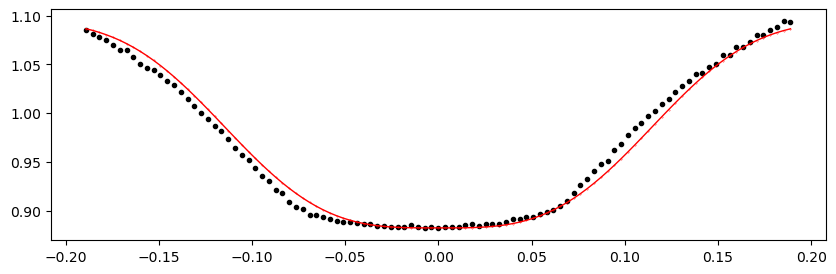

1970.6846012 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.30it/s]


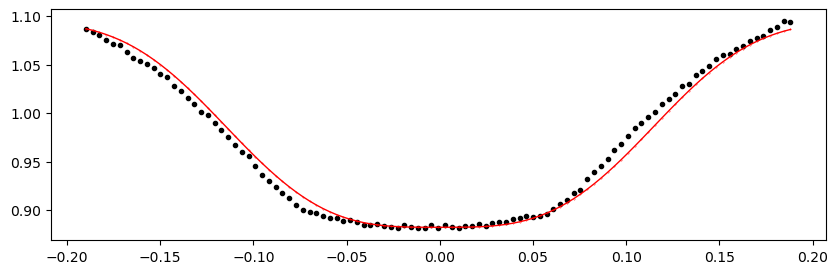

1971.0668324 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.44it/s]


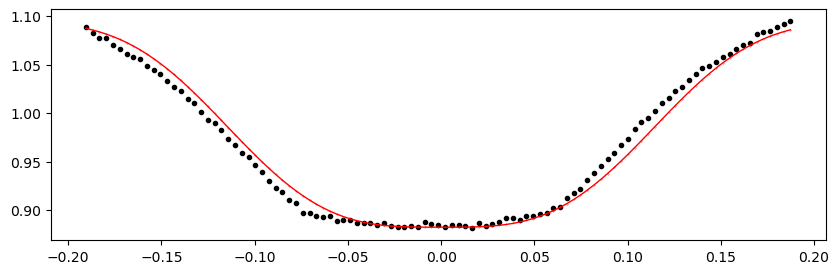

1971.4490636 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.88it/s]


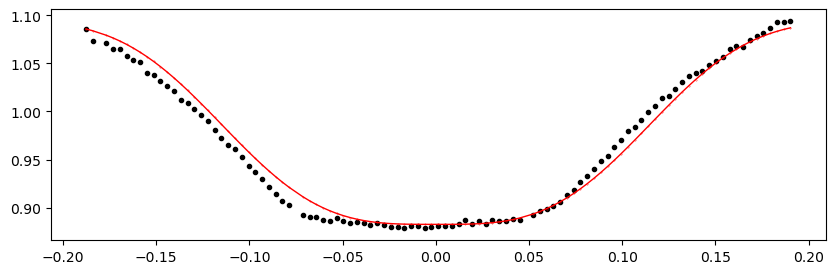

1971.8312948 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.19it/s]


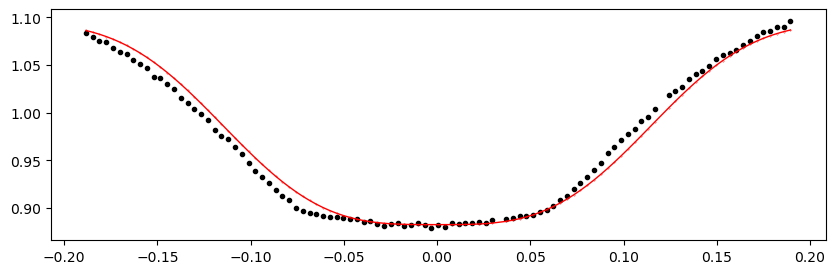

1972.213526 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.10it/s]


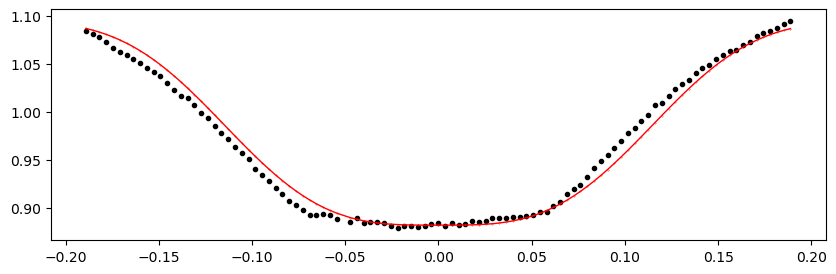

1972.5957572 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.90it/s]


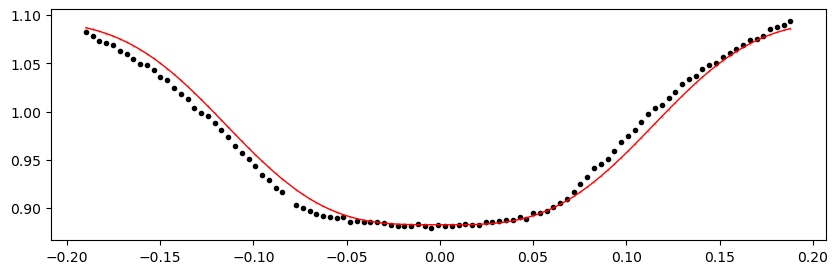

1972.9779884 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.94it/s]


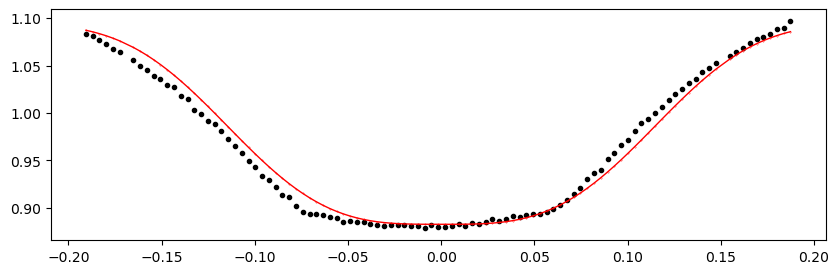

1973.3602196 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.93it/s]


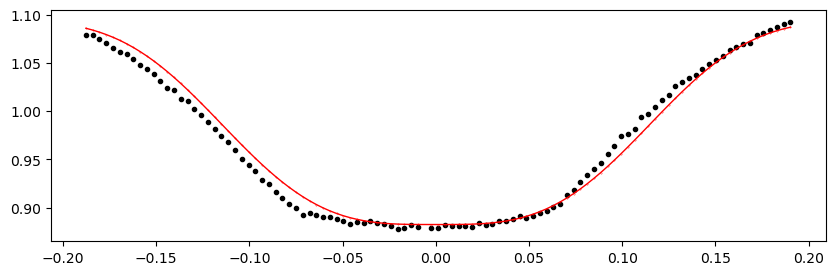

1973.7424508 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.10it/s]


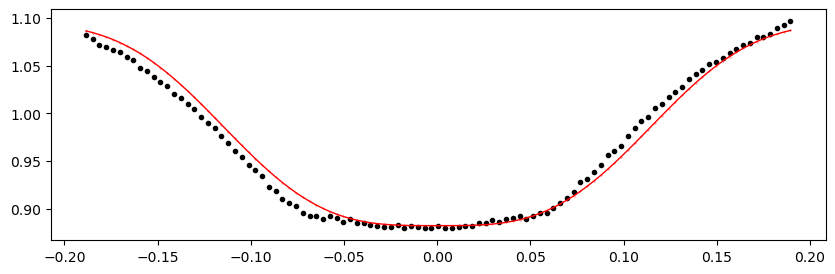

1974.124682 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.93it/s]


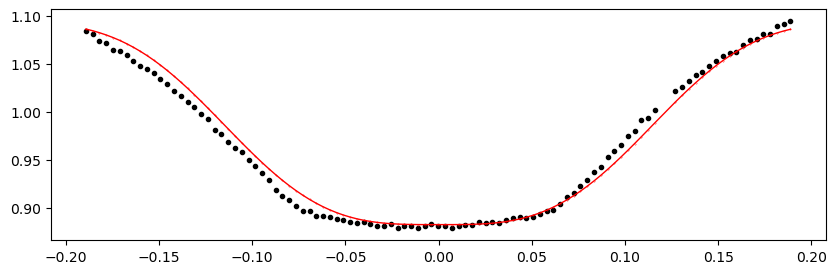

1974.5069132 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.94it/s]


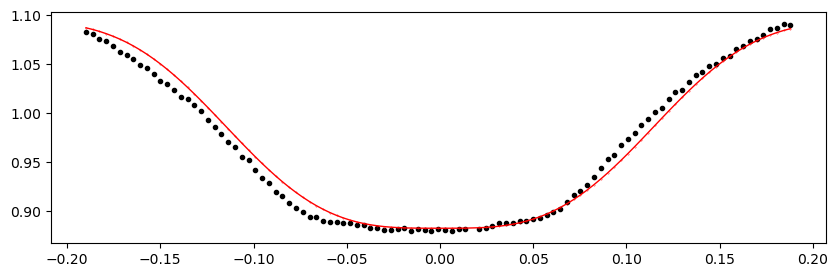

1974.8891444 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.86it/s]


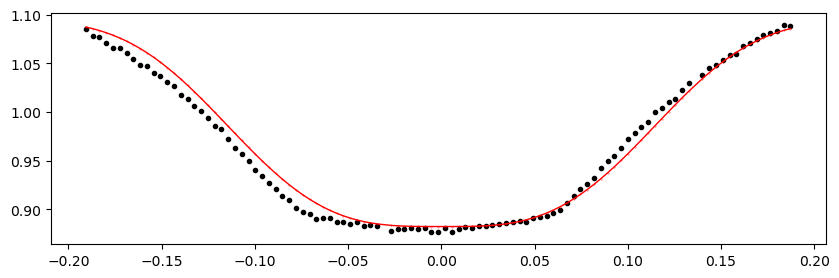

1975.2713756 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.33it/s]


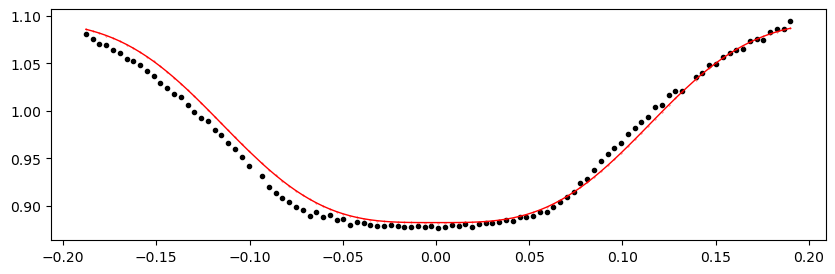

1975.6536068 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.30it/s]


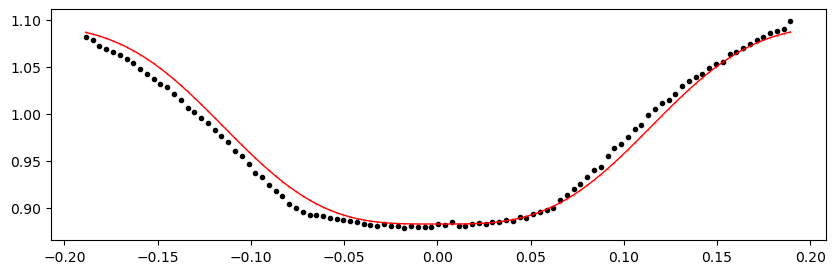

1976.035838 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.43it/s]


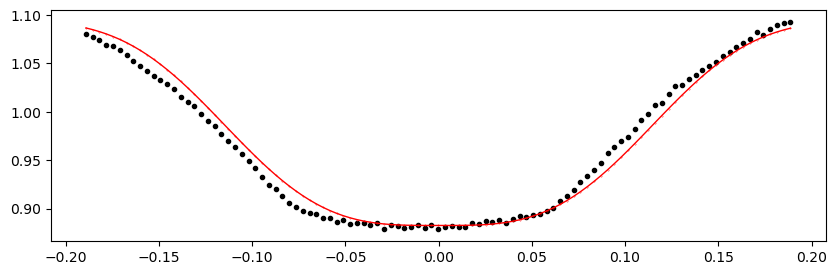

1976.4180692 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.98it/s]


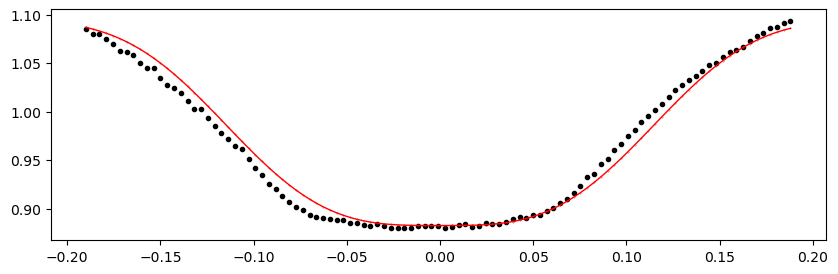

1976.8003004 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.14it/s]


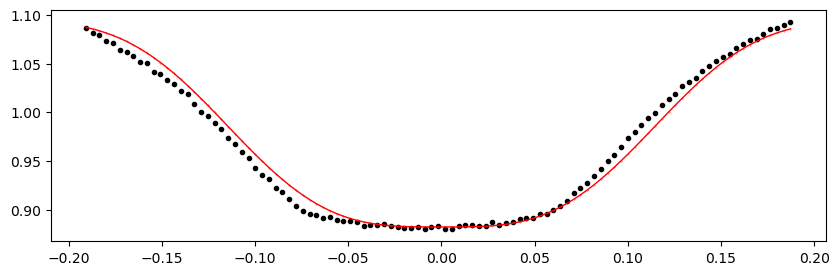

1977.1825316 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.06it/s]


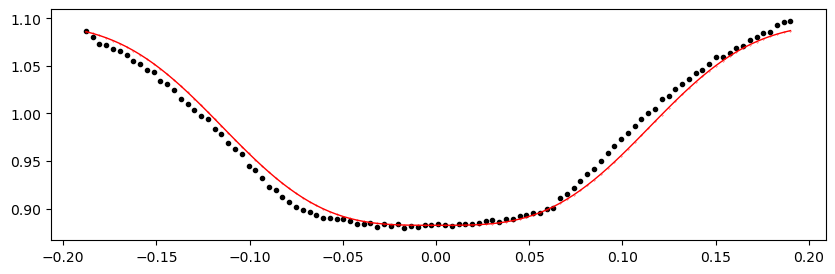

1977.5647628 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.10it/s]


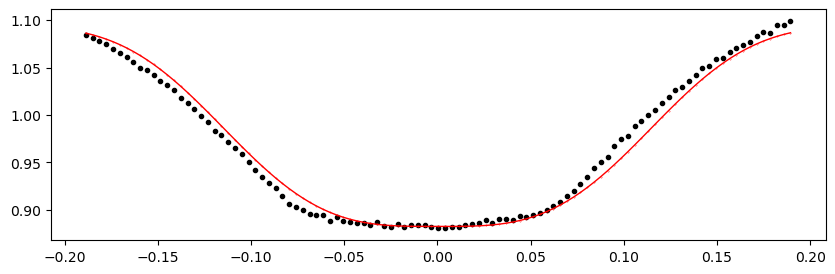

1977.946994 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.80it/s]


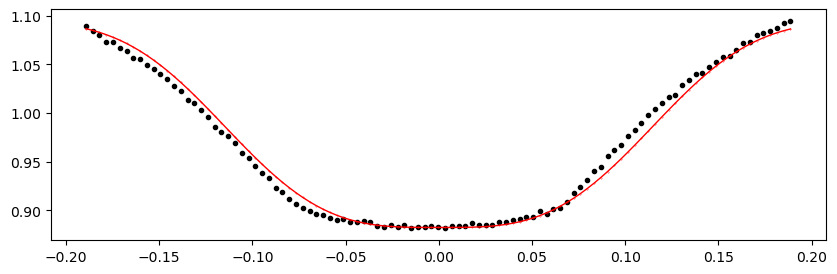

1978.3292252 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.45it/s]


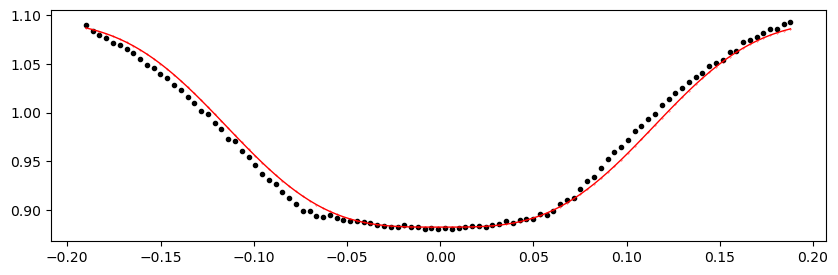

1978.7114564 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.32it/s]


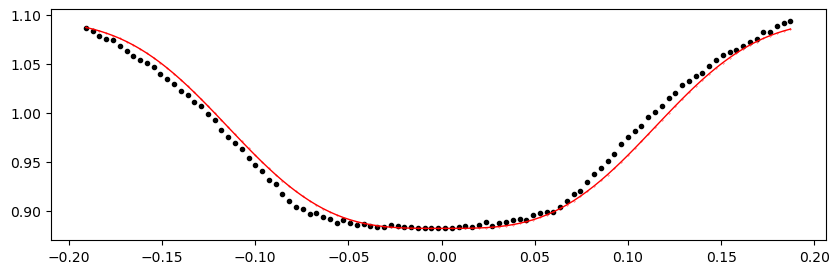

1979.0936876 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.41it/s]


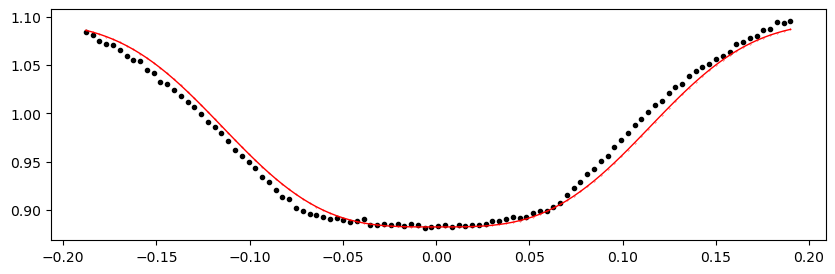

1979.4759188 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.74it/s]


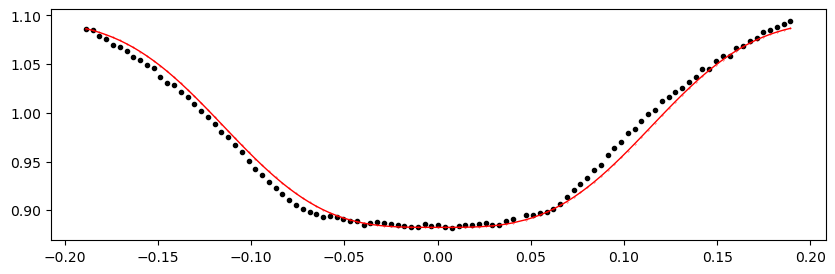

1979.85815 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.63it/s]


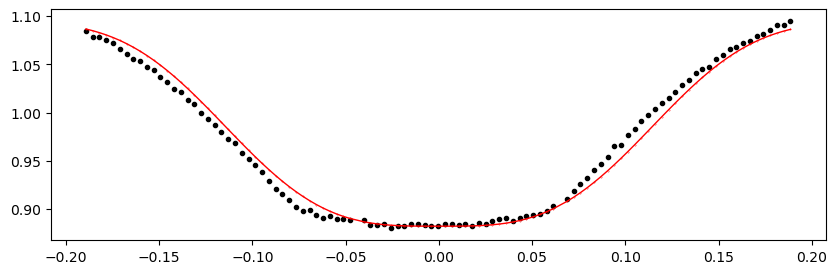

1980.2403812 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.48it/s]


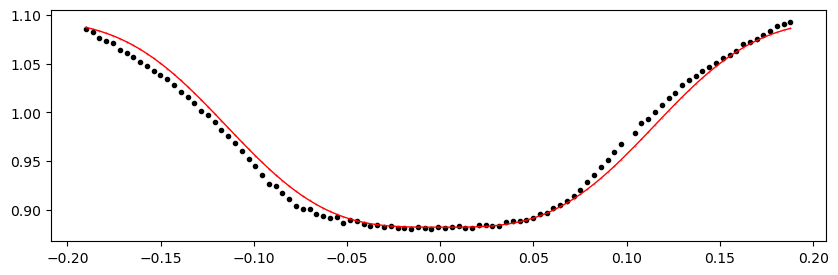

1980.6226124 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.35it/s]


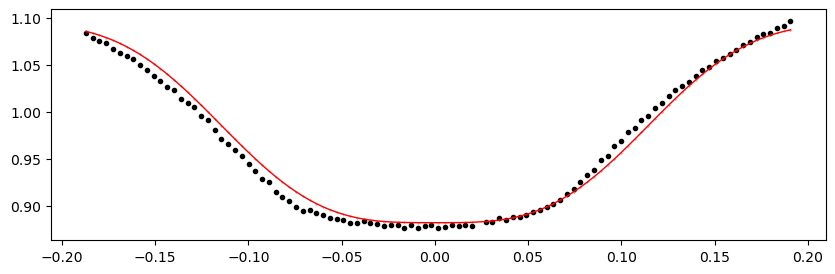

1981.0048436 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.54it/s]


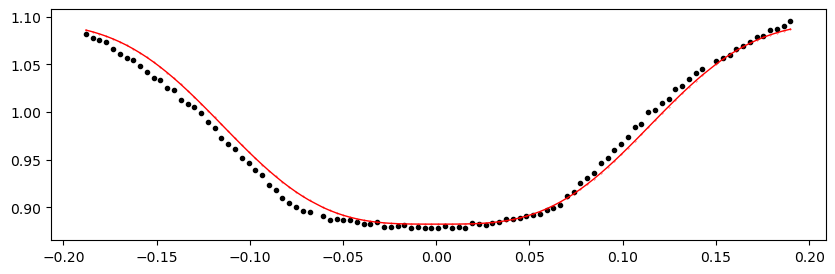

1981.3870748 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.51it/s]


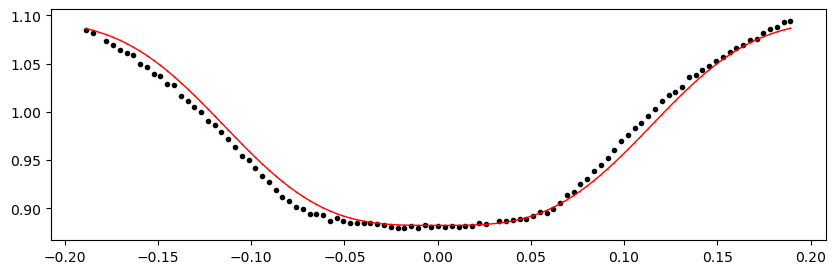

1981.769306 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.21it/s]


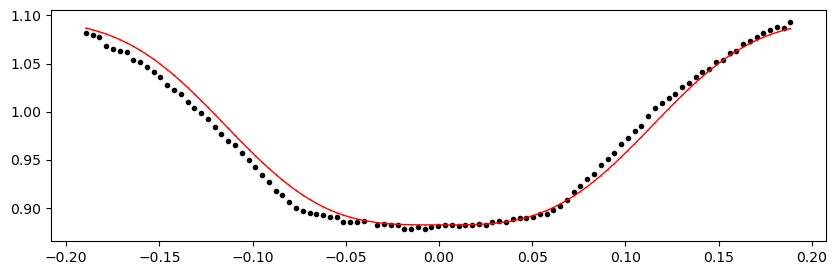

1982.1515372 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.55it/s]


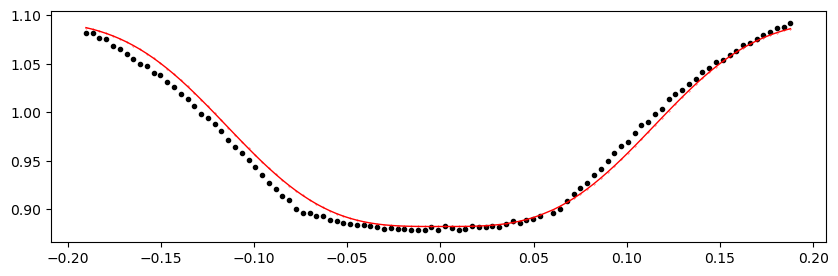

1983.680462 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1376.02it/s]


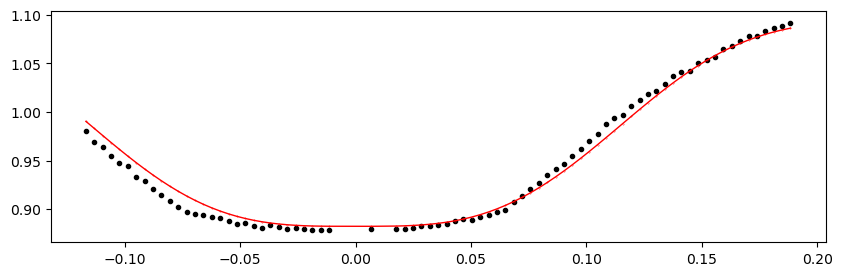

1984.0626932 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.14it/s]


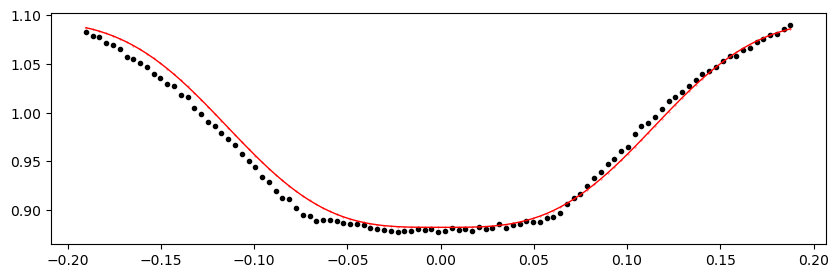

1984.4449244 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.74it/s]


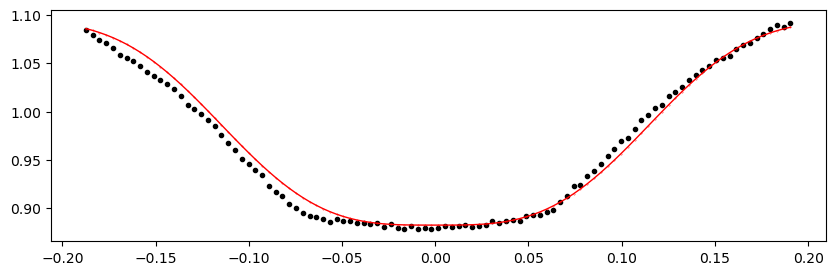

1988.2672364 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.52it/s]


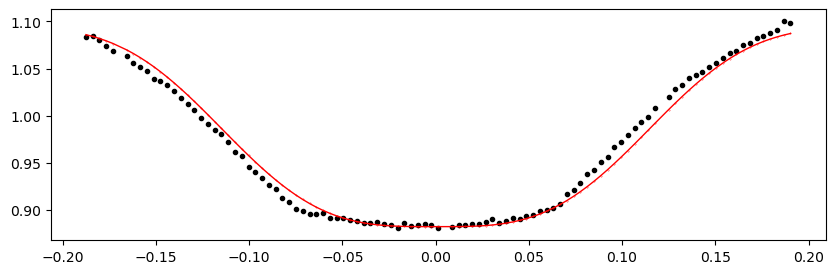

1988.6494676 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.86it/s]


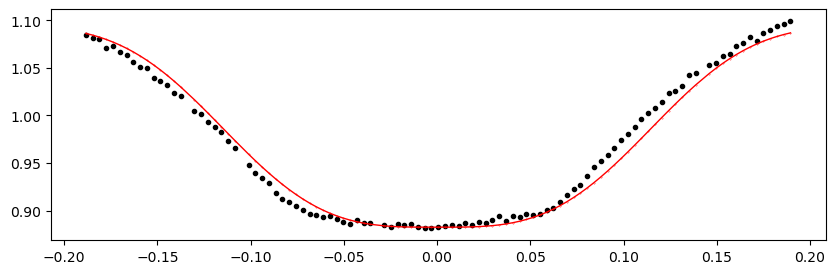

1989.0316988 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.43it/s]


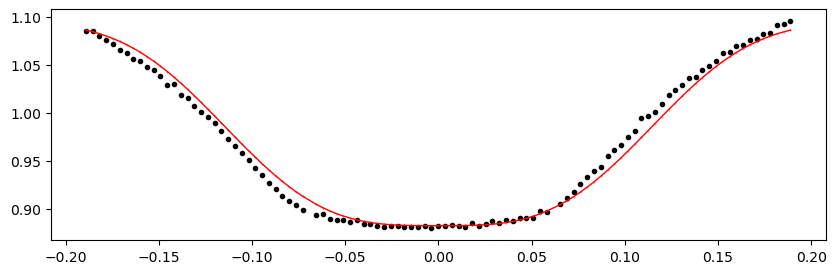

1989.41393 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1381.72it/s]


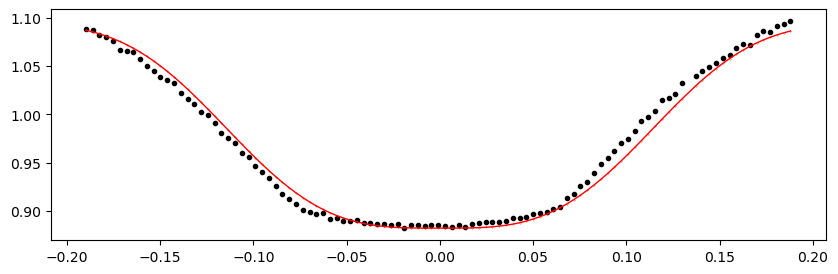

1989.7961612 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1165.01it/s]


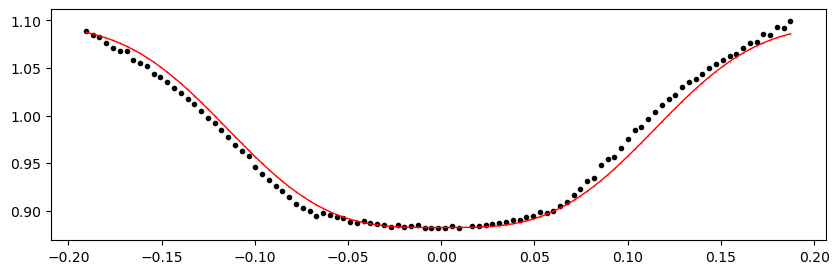

1990.1783924 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1072.43it/s]


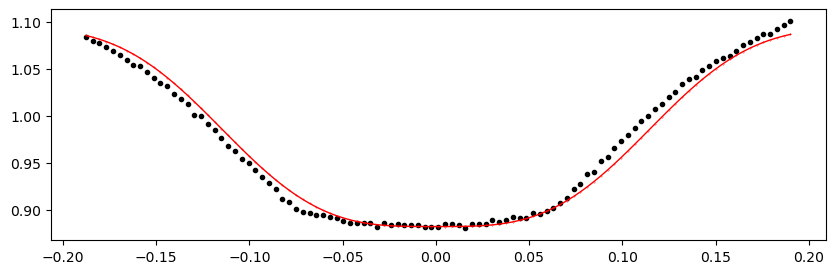

1990.5606236 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1255.98it/s]


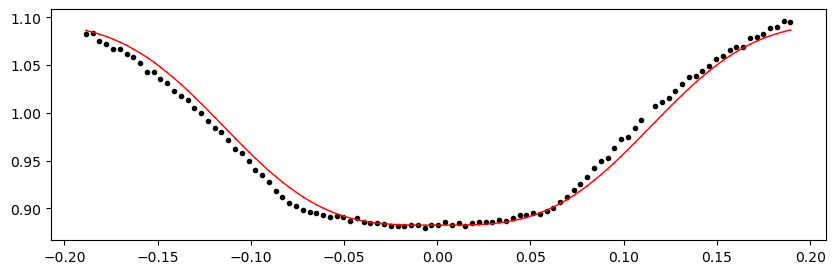

1990.9428548 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.34it/s]


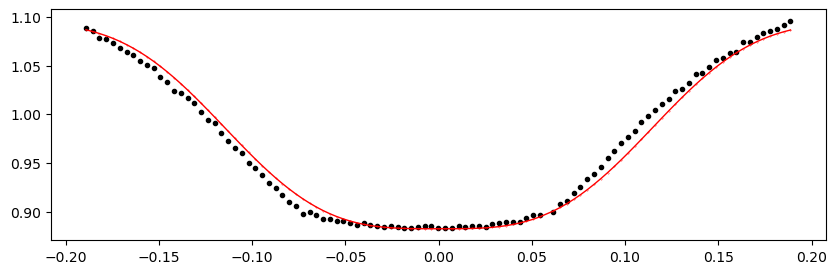

1991.325086 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.76it/s]


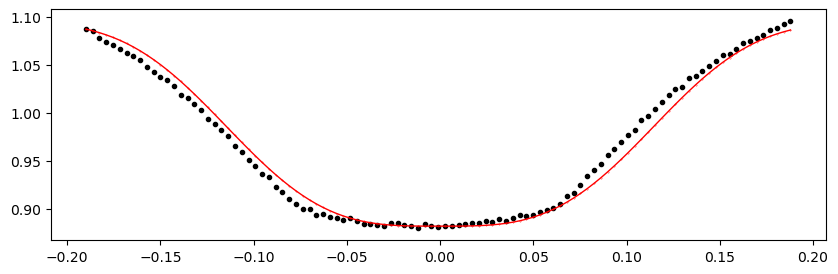

1991.7073172 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.02it/s]


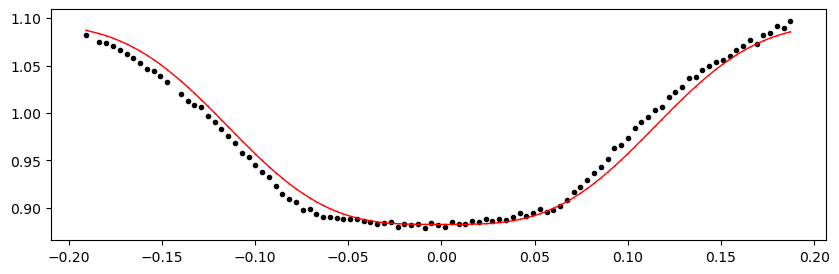

1992.0895484 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.05it/s]


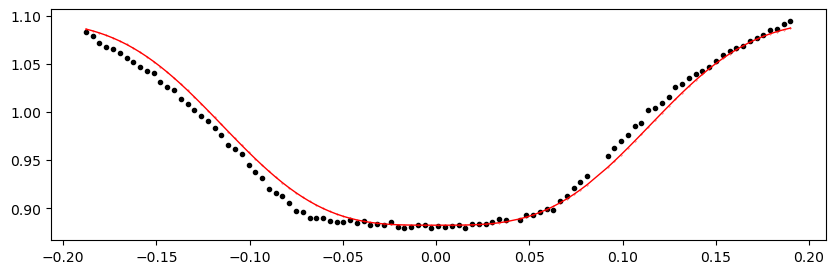

1992.4717796 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.48it/s]


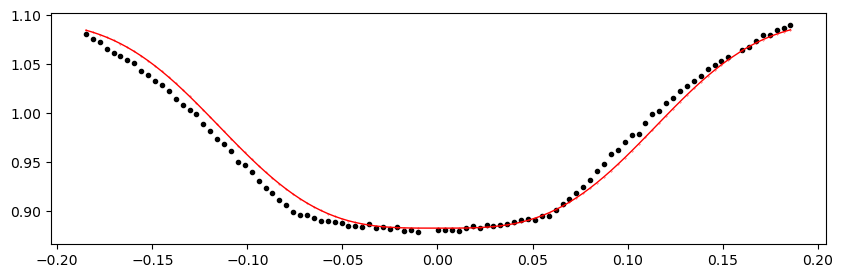

1992.8540108 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1319.30it/s]


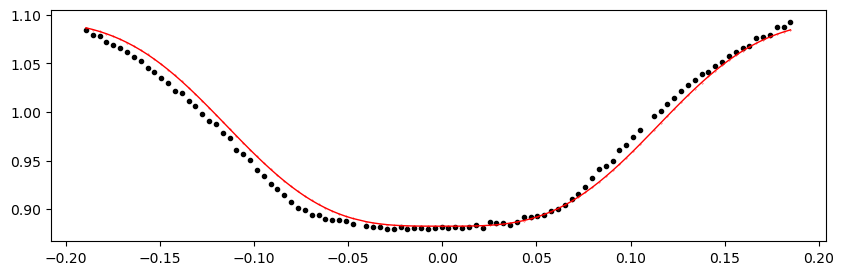

1993.236242 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.83it/s]


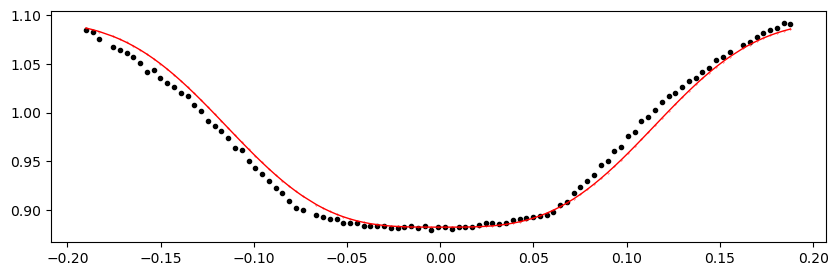

1993.6184732 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.40it/s]


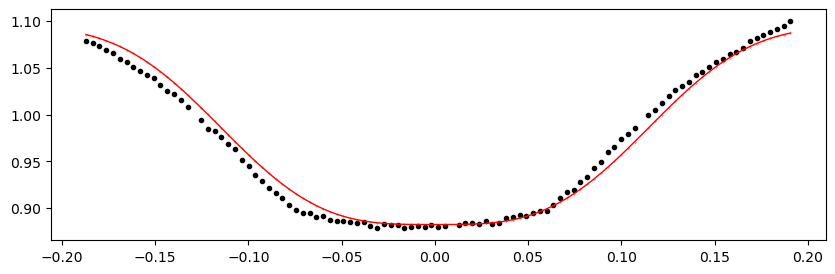

1994.0007044 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.66it/s]


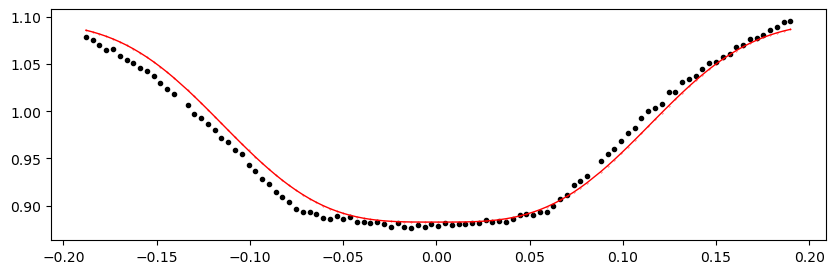

1994.3829356 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.04it/s]


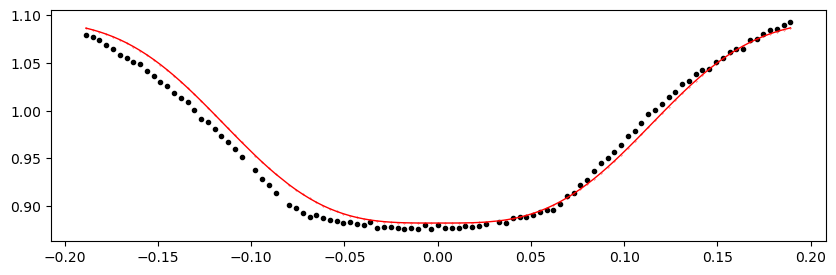

1994.7651668 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.50it/s]


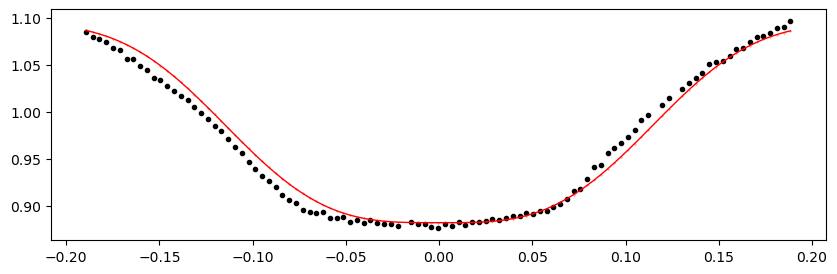

1995.147398 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.56it/s]


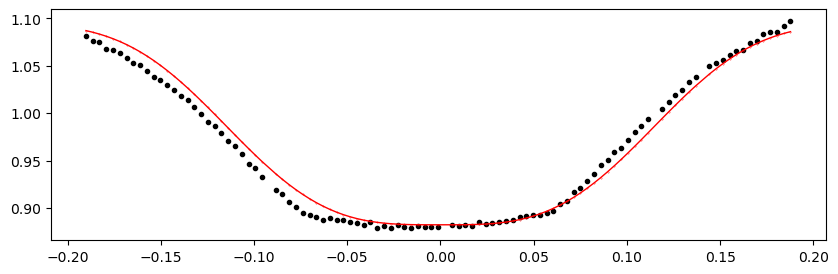

1995.5296292 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.23it/s]


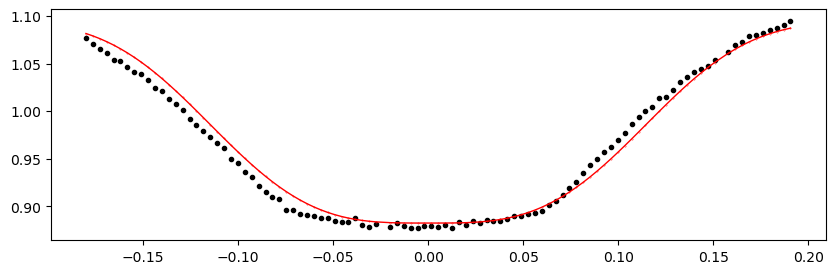

1997.058554 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.06it/s]


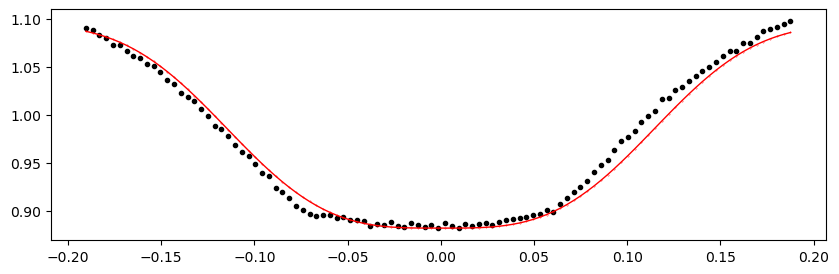

1997.4407852 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.46it/s]


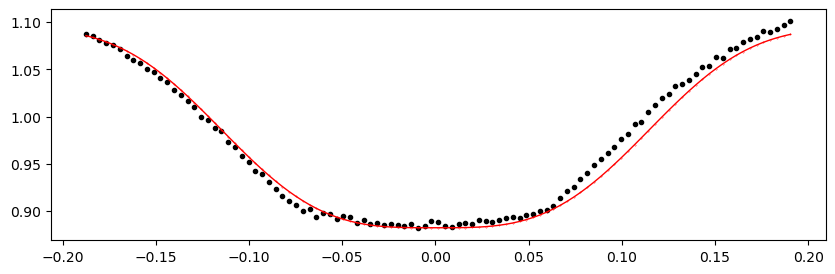

1997.8230164 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.52it/s]


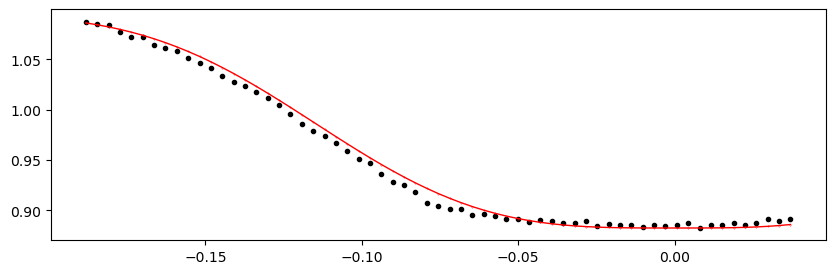

2001.2630972 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.54it/s]


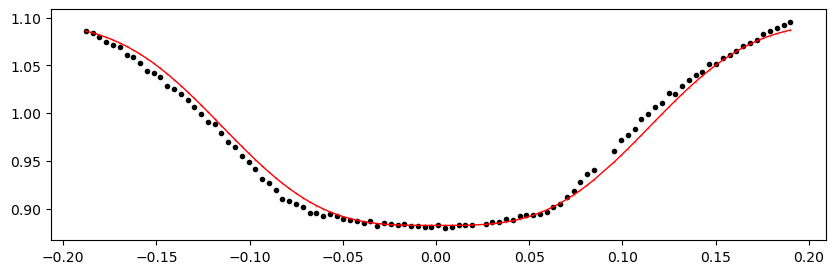

2001.6453284 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.02it/s]


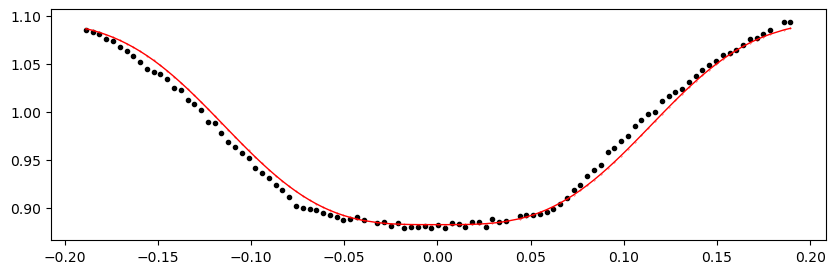

2002.0275596 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.54it/s]


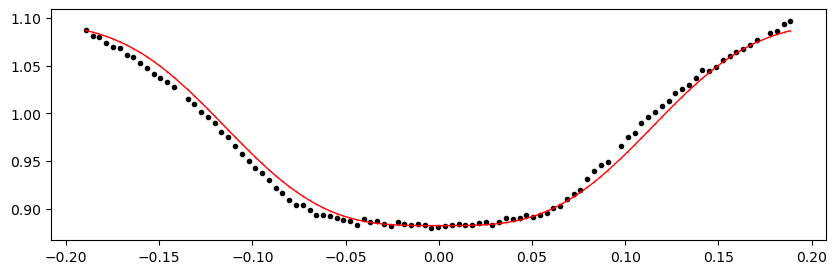

2002.4097908 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1387.20it/s]


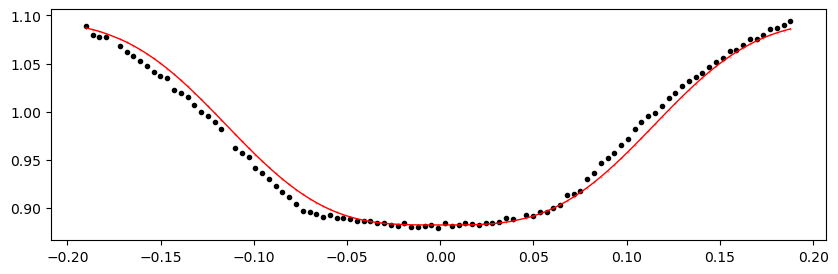

2002.792022 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.41it/s]


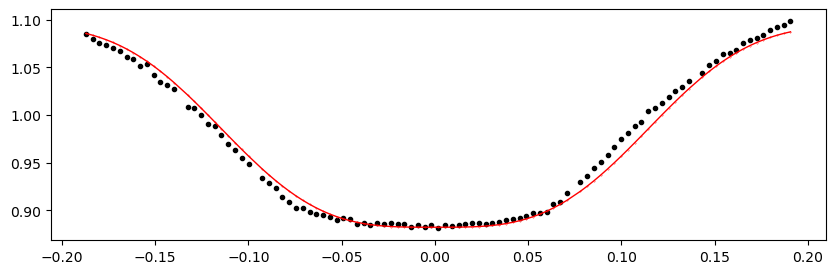

2003.1742532 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.67it/s]


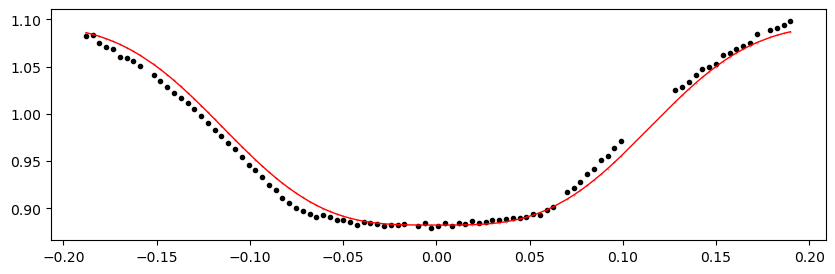

2003.5564844 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.32it/s]


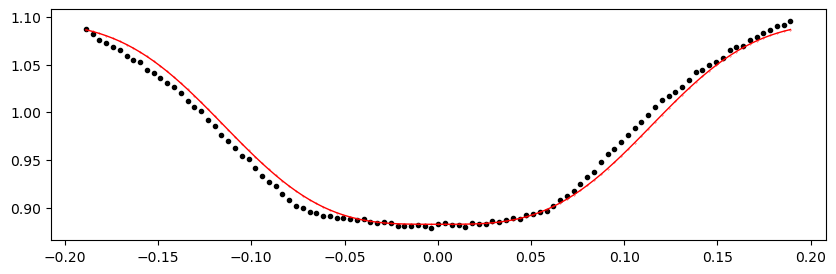

2003.9387156 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.24it/s]


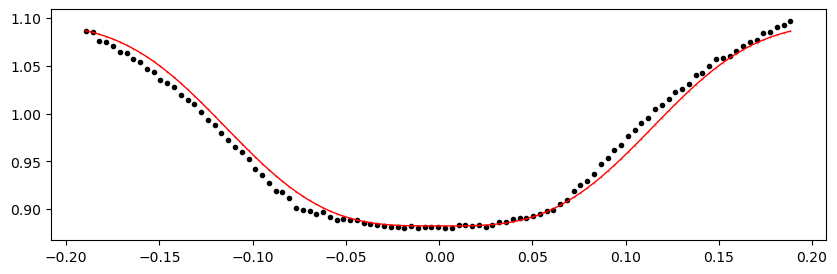

2004.3209468 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.84it/s]


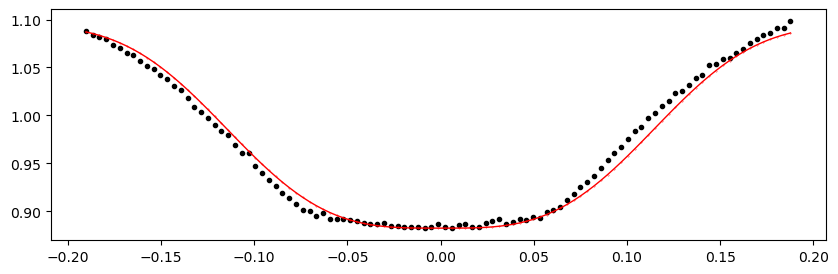

2004.703178 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.01it/s]


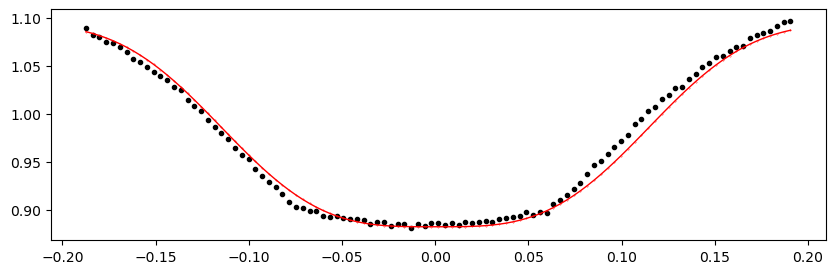

2005.0854092 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.06it/s]


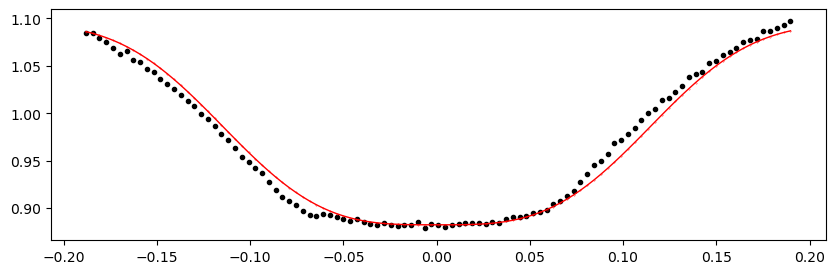

2005.4676404 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.28it/s]


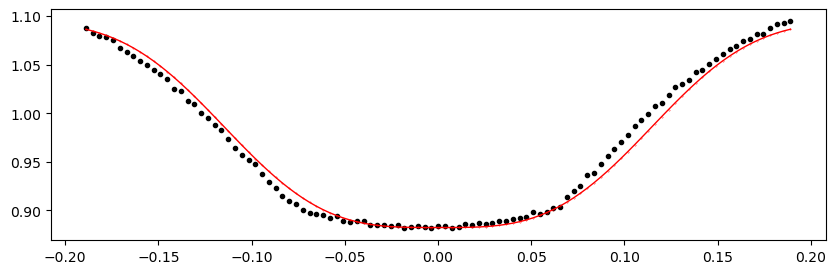

2005.8498716 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.02it/s]


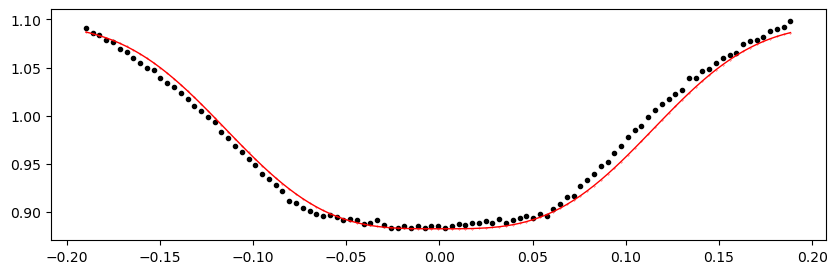

2006.2321028 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.70it/s]


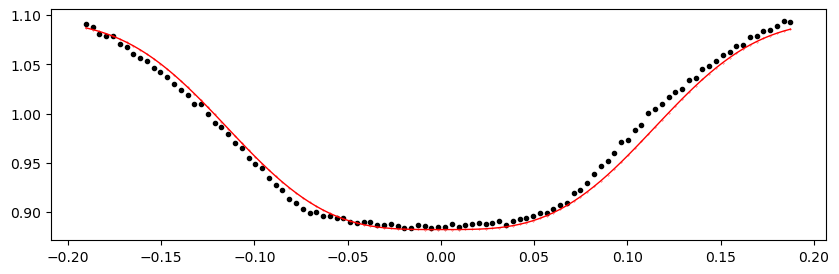

2006.614334 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.19it/s]


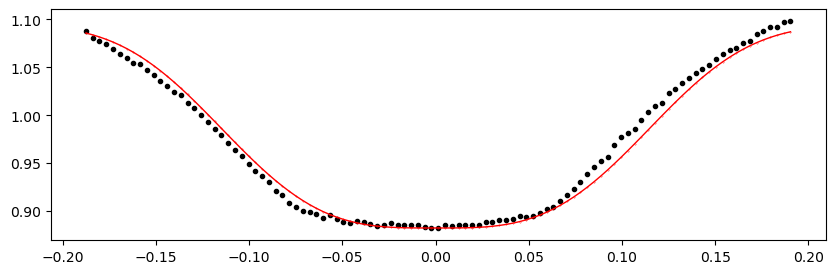

2006.9965652 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.17it/s]


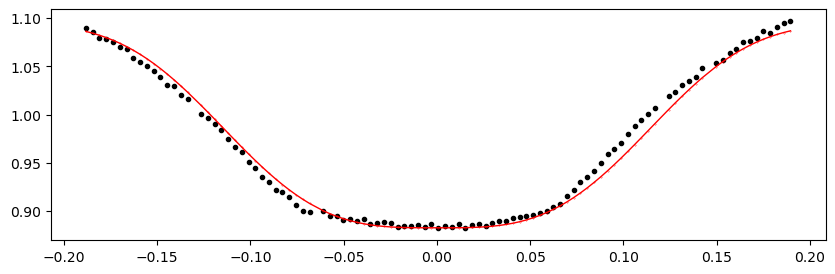

2007.3787964 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.03it/s]


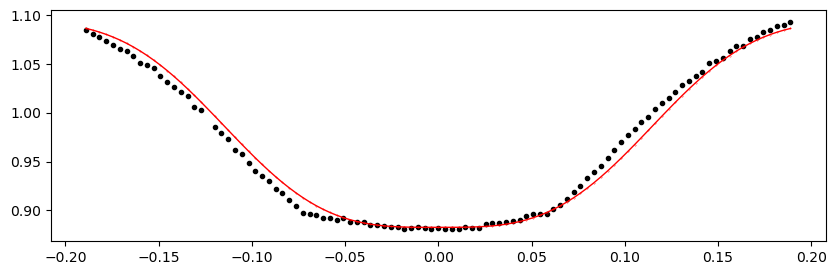

2007.7610276 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.52it/s]


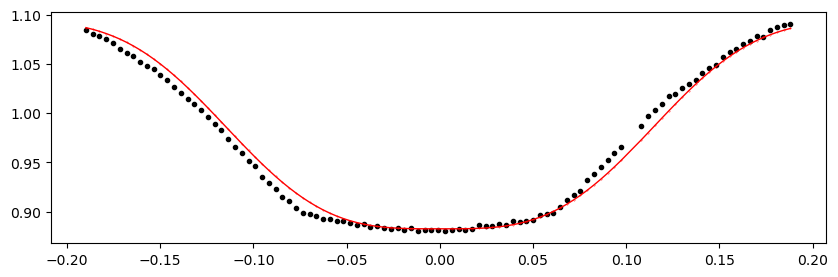

2008.1432588 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.79it/s]


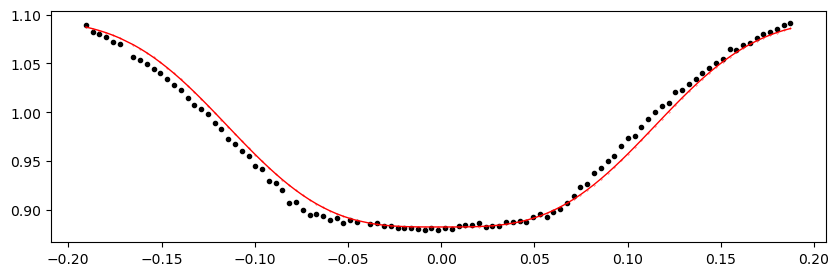

2008.52549 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.51it/s]


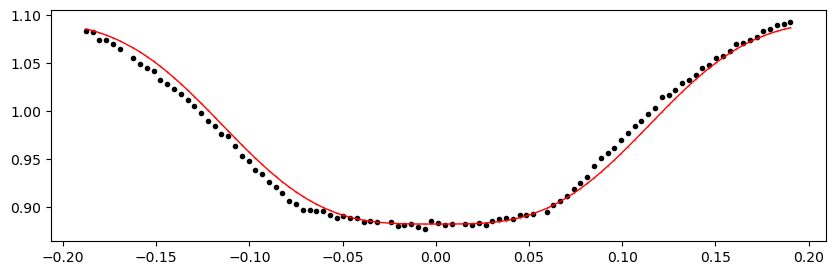

2008.9077212 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.10it/s]


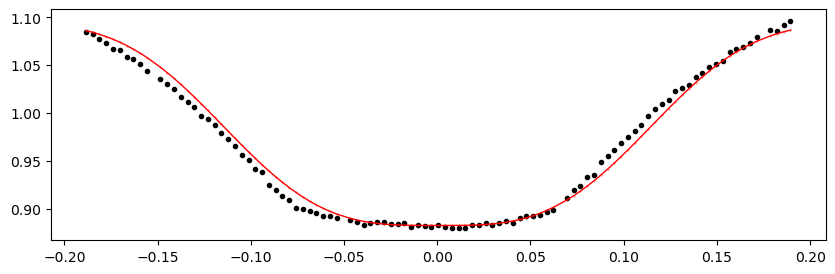

2009.2899524 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.79it/s]


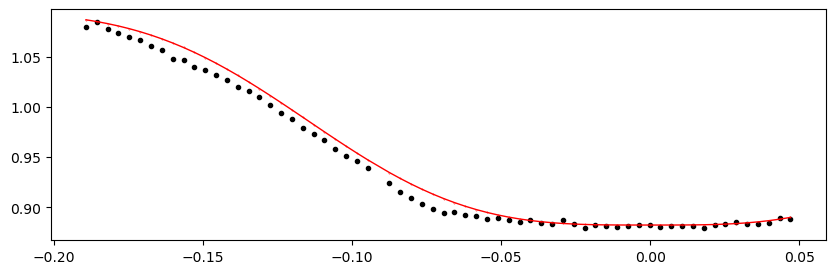

2696.54165 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.18it/s]


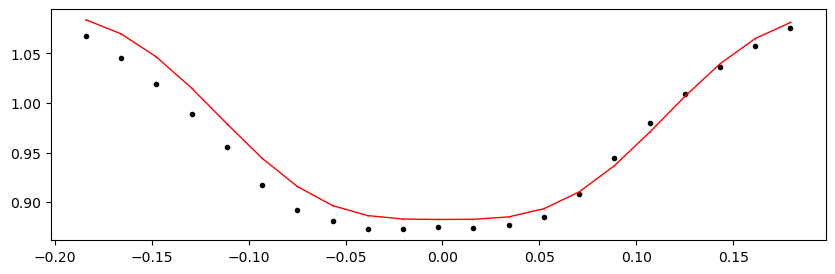

Time 2696.9238812 does not have enough data points: 7
2697.3061124 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.04it/s]


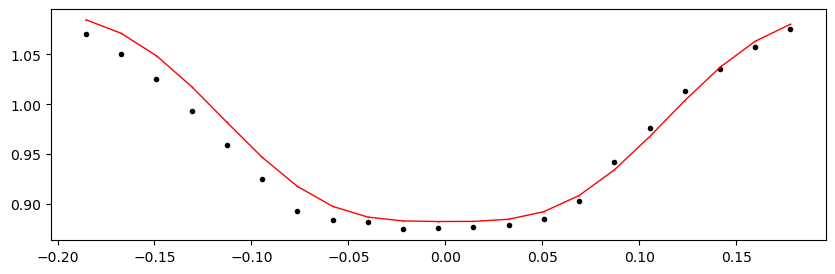

2697.6883436 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.89it/s]


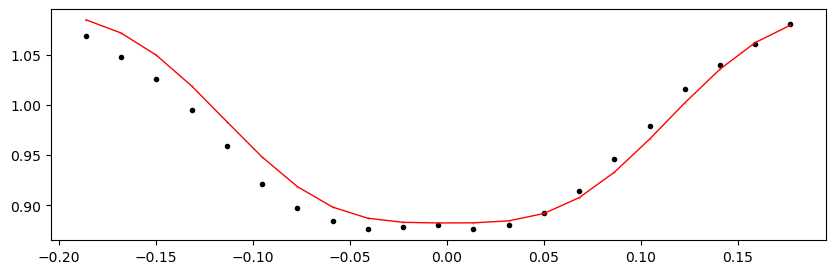

2698.0705748 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.67it/s]


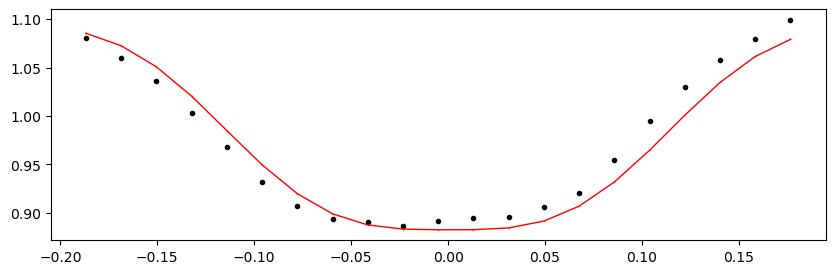

2698.4528060000002 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.07it/s]


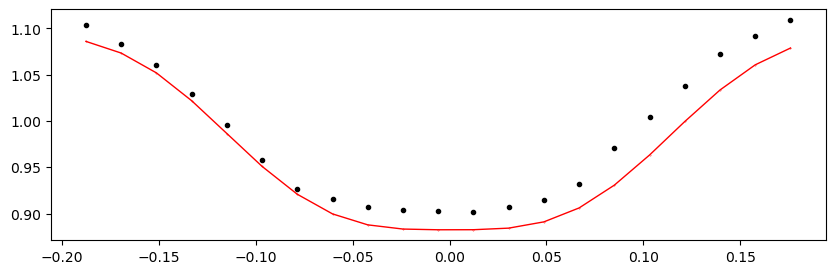

2698.8350372 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.53it/s]


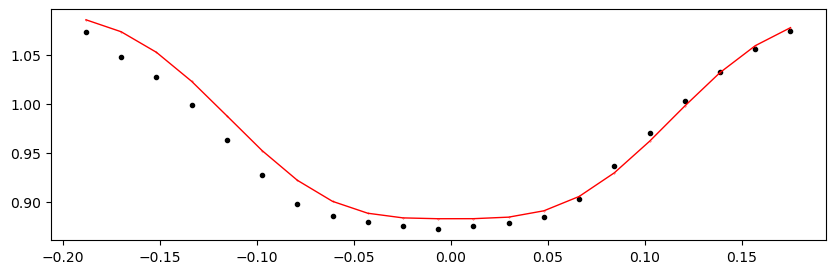

2699.2172683999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.41it/s]


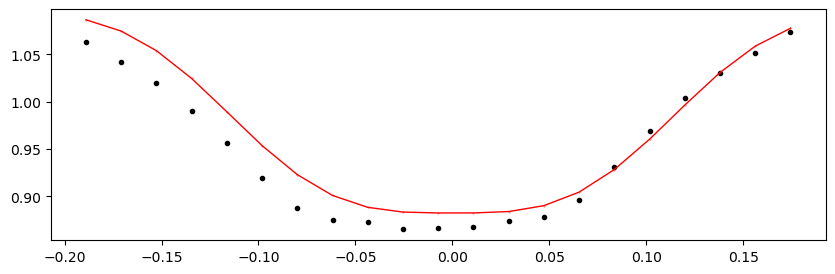

2699.5994996 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.50it/s]


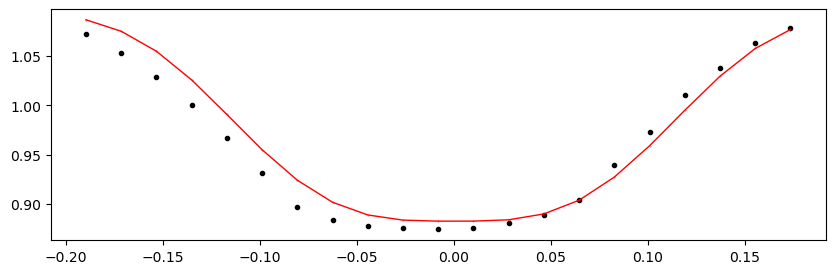

2699.9817308 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.41it/s]


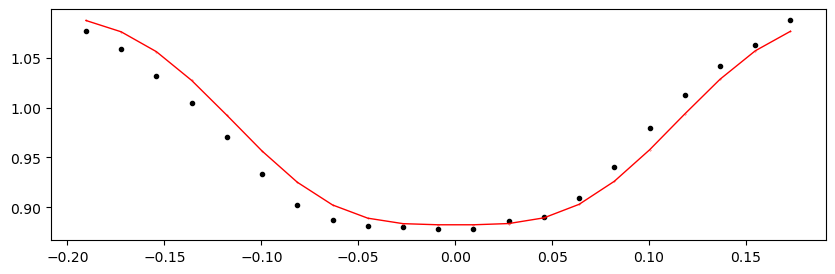

2700.363962 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.97it/s]


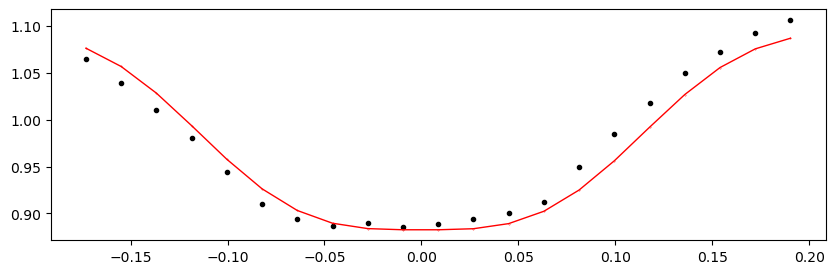

2700.7461932 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.72it/s]


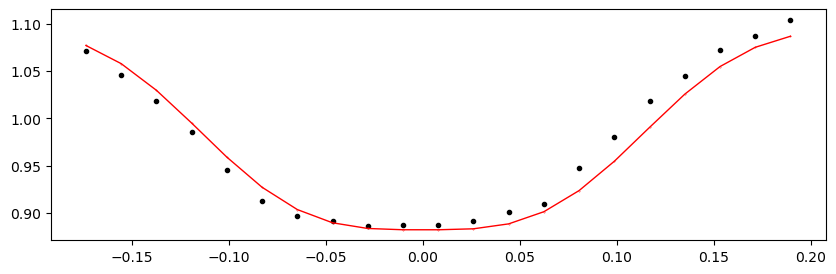

2701.1284244 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.02it/s]


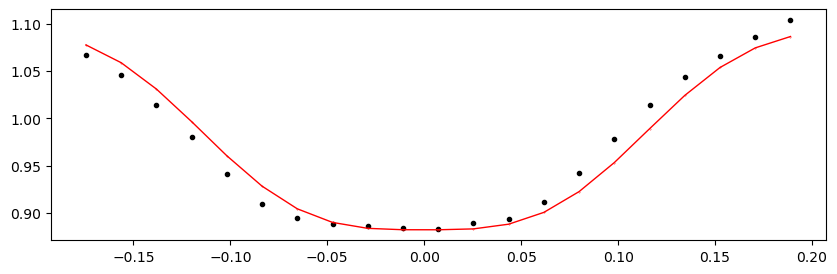

2701.5106556 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.44it/s]


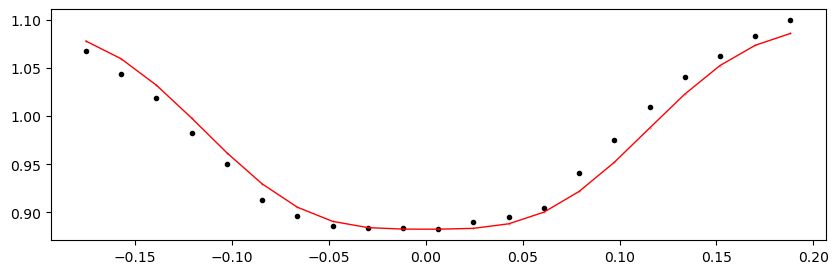

2701.8928868000003 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.38it/s]


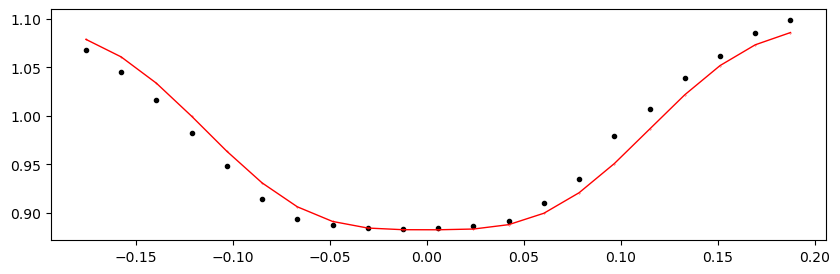

2702.275118 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.35it/s]


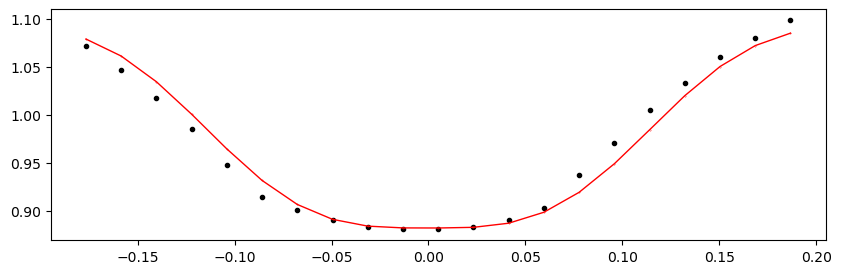

2702.6573491999998 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.99it/s]


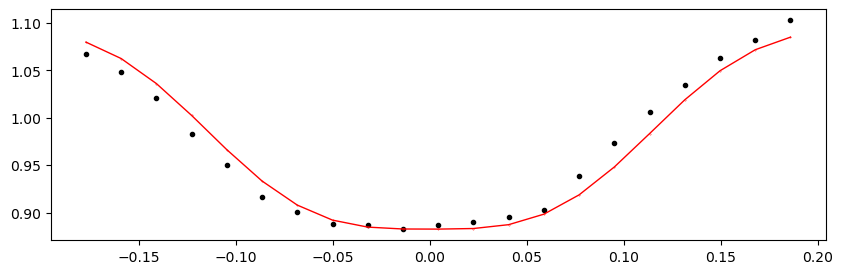

2703.0395804 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.90it/s]


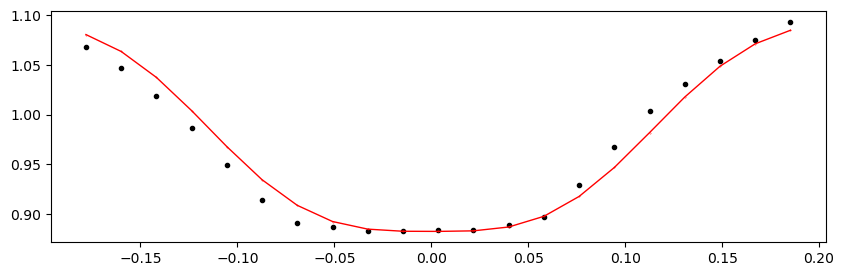

2703.4218116 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.25it/s]


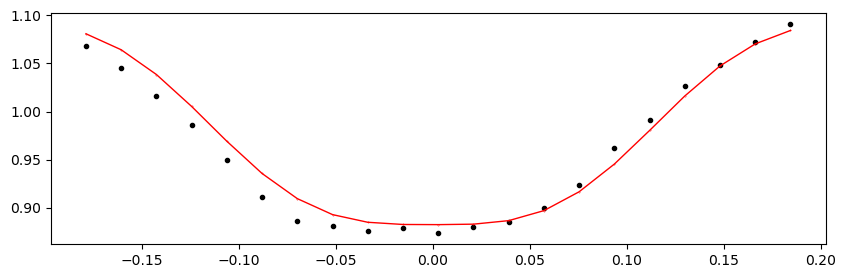

2703.8040428 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.28it/s]


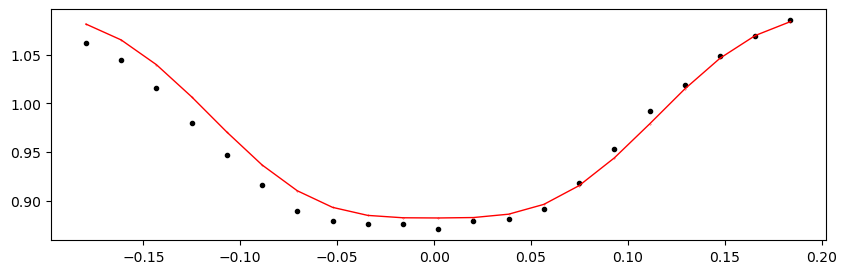

2704.186274 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.91it/s]


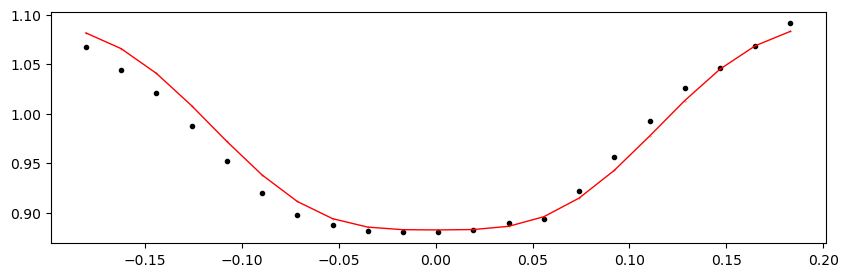

2704.5685052 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.38it/s]


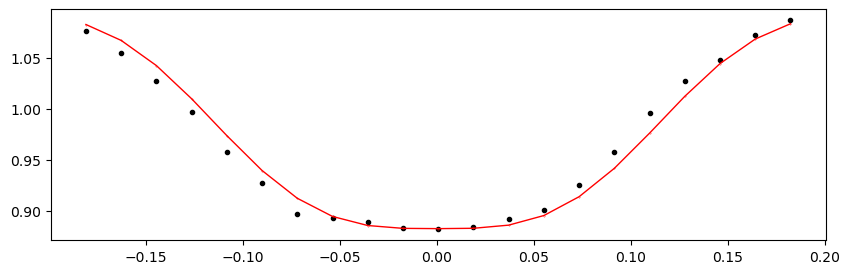

Time 2709.919742 does not have enough data points: 10
2710.3019732000002 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.74it/s]


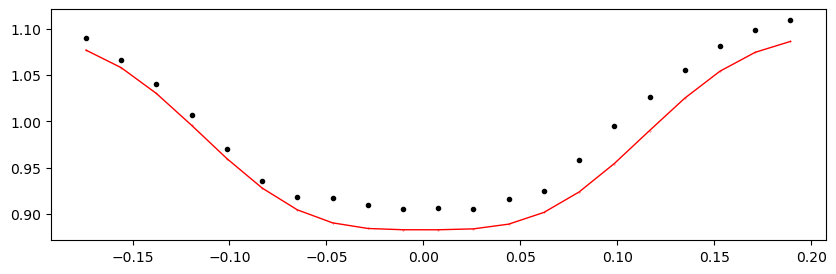

2710.6842044 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.72it/s]


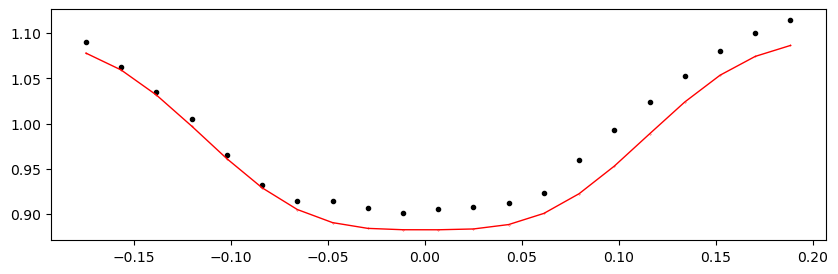

2711.0664355999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.47it/s]


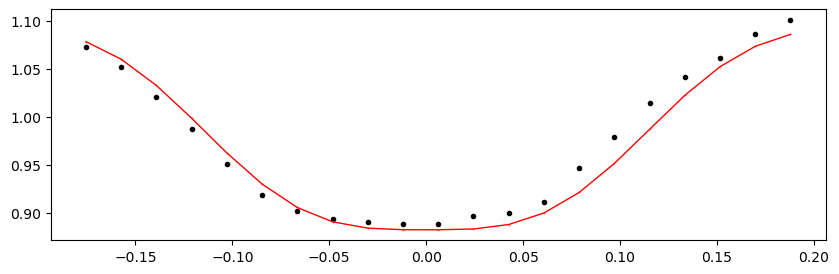

2711.4486668 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.08it/s]


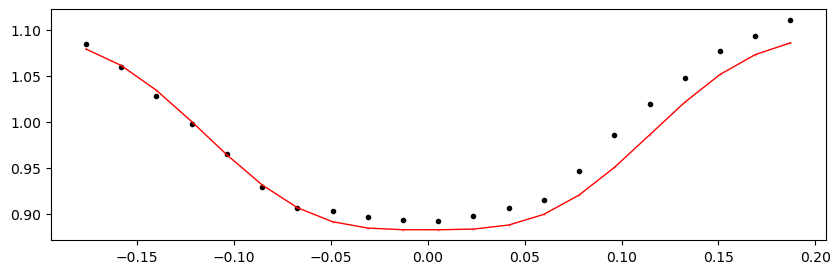

2711.830898 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.86it/s]


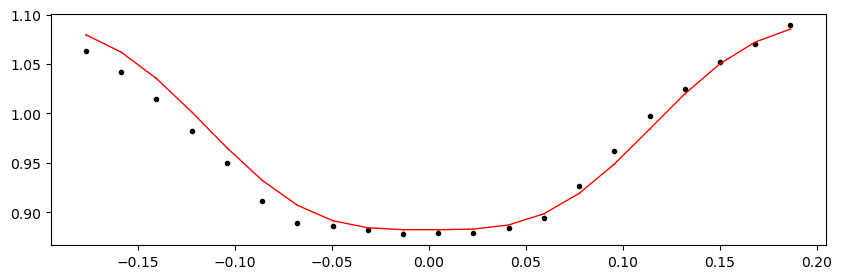

2712.2131292 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.39it/s]


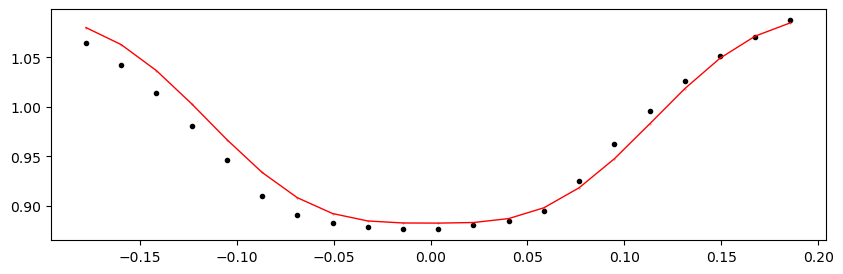

2712.5953604 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.76it/s]


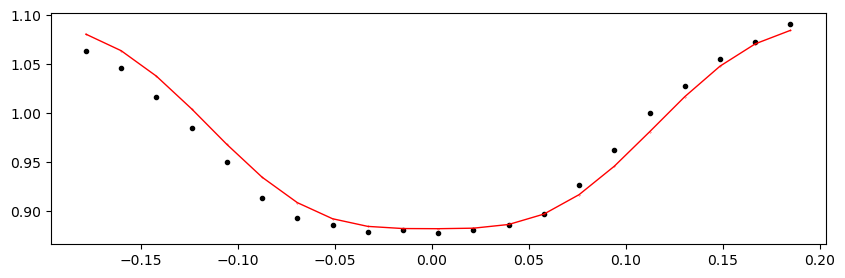

2712.9775916 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.26it/s]


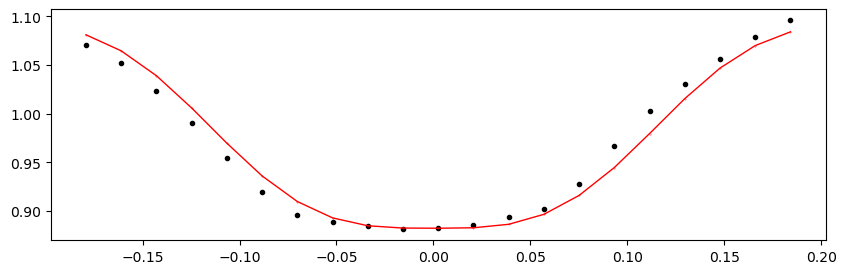

2713.3598228 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.02it/s]


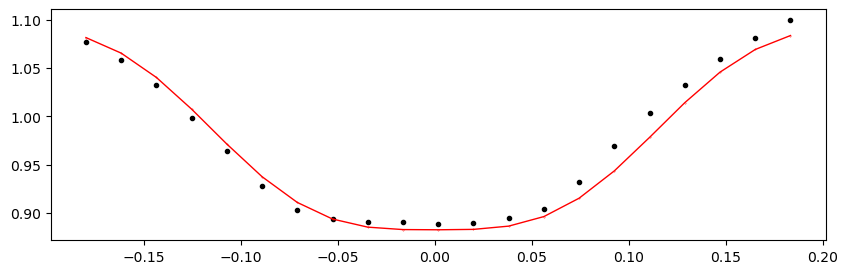

2713.742054 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.61it/s]


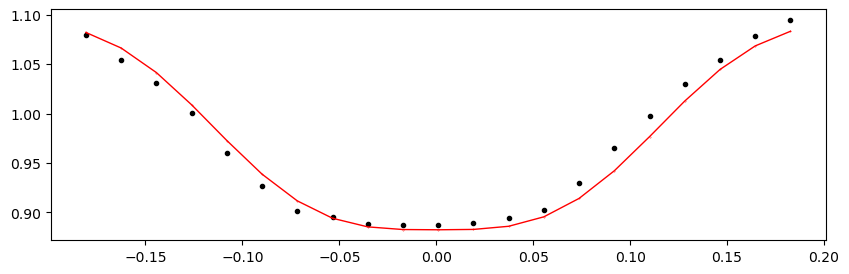

2714.1242852 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.59it/s]


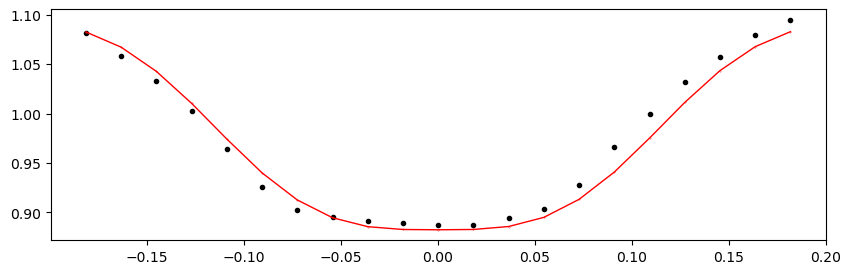

2714.5065164 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.83it/s]


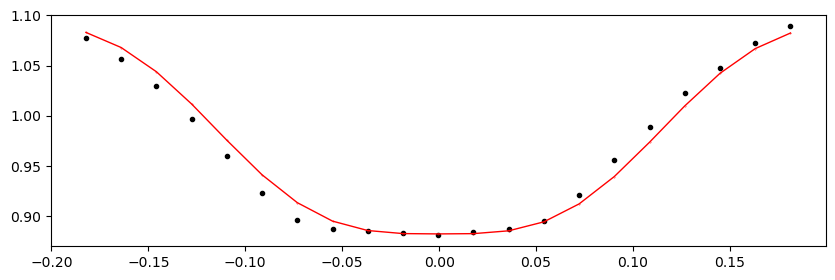

2714.8887476 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.26it/s]


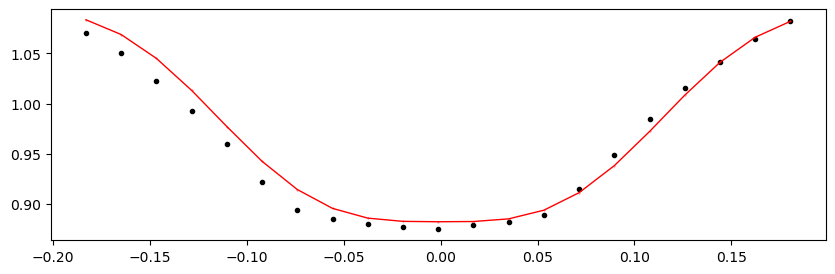

2715.2709788 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.05it/s]


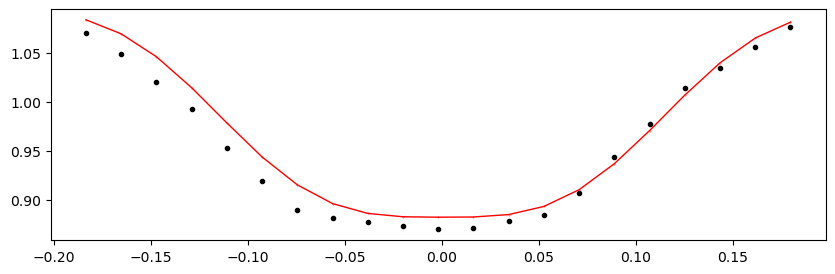

2715.65321 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.68it/s]


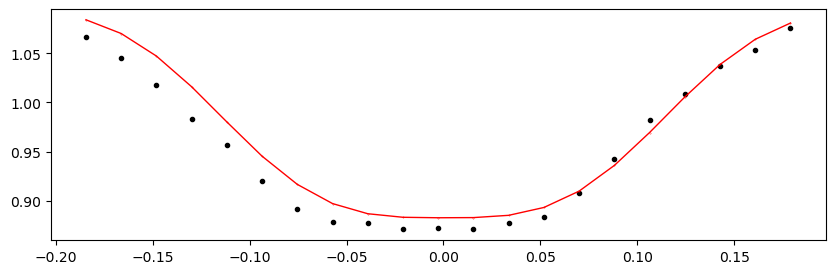

2716.0354412 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.78it/s]


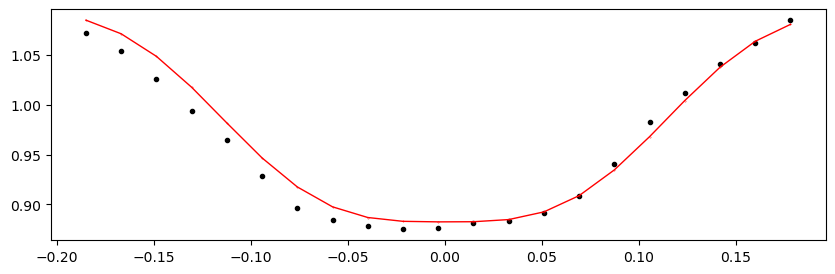

2716.4176724 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.84it/s]


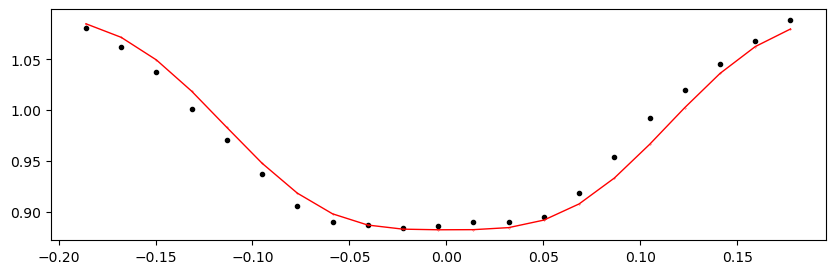

2716.7999036 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.39it/s]


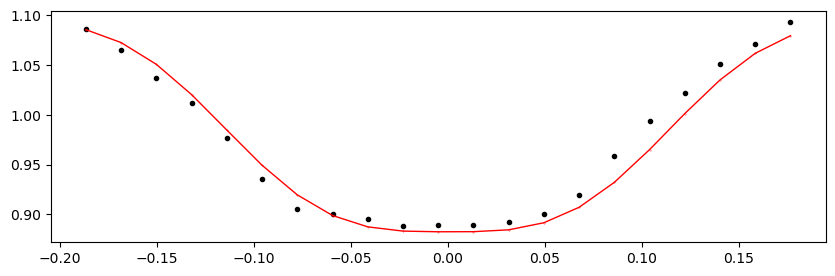

2717.1821348 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.59it/s]


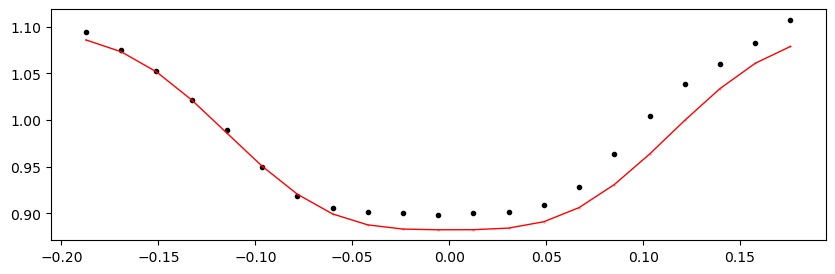

Time 2717.564366 does not have enough data points: 7
Time 2718.7110596 does not have enough data points: 20
2719.0932908 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.30it/s]


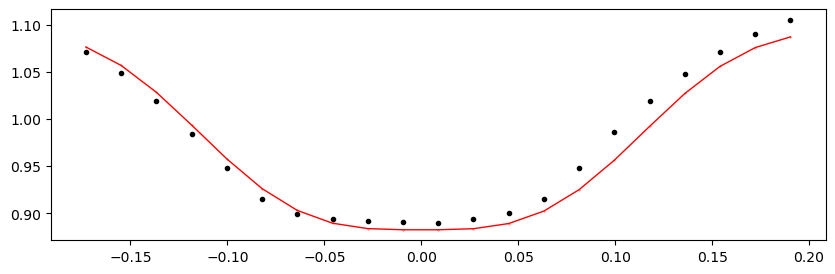

2719.4755219999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.05it/s]


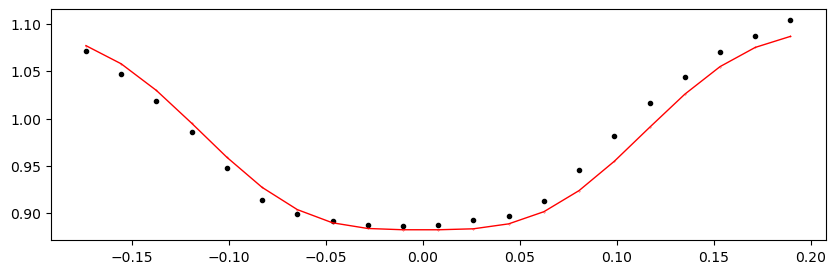

2719.8577532 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.58it/s]


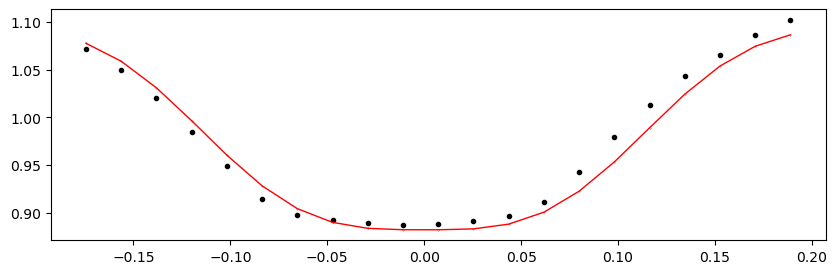

Time 2720.2399844 does not have enough data points: 19
Time 2720.6222156 does not have enough data points: 8
2725.5912212 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.55it/s]


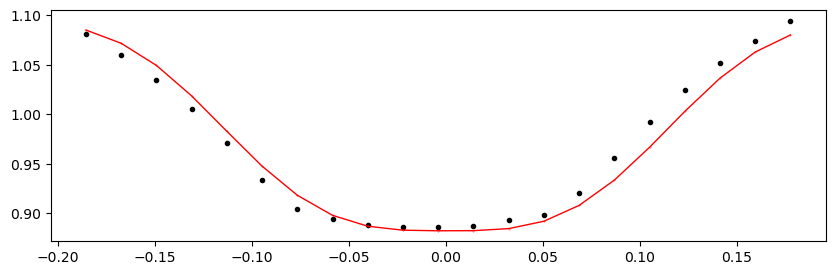

2725.9734524 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.93it/s]


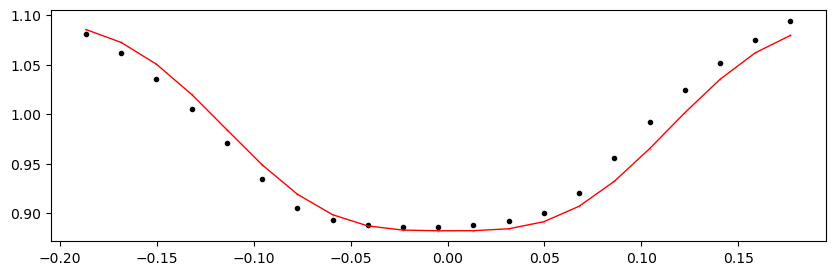

2726.3556836 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.59it/s]


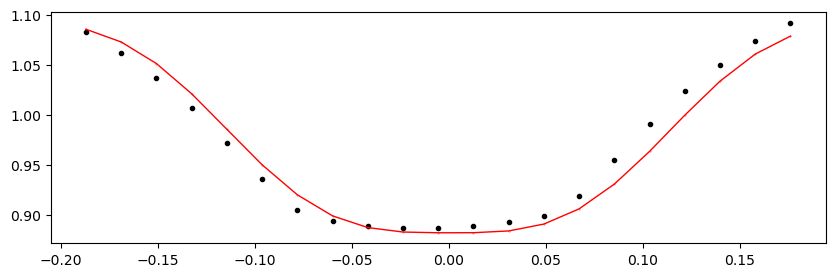

2726.7379148 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.17it/s]


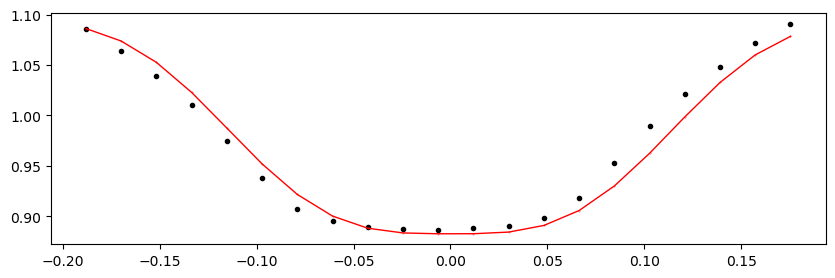

2727.120146 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.07it/s]


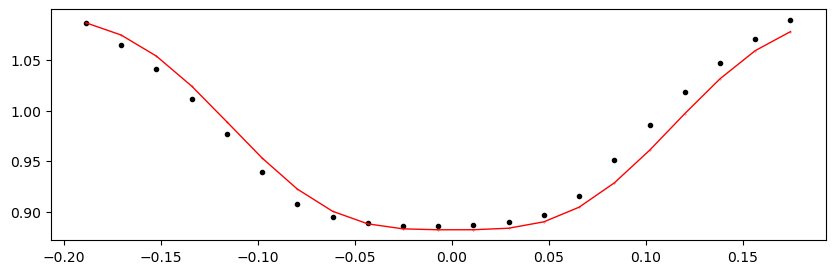

2727.5023772 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.06it/s]


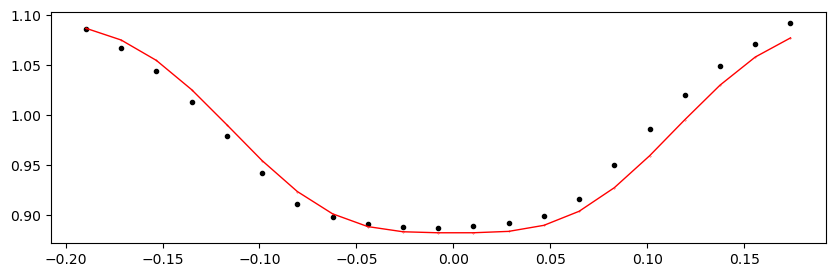

2727.8846083999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.29it/s]


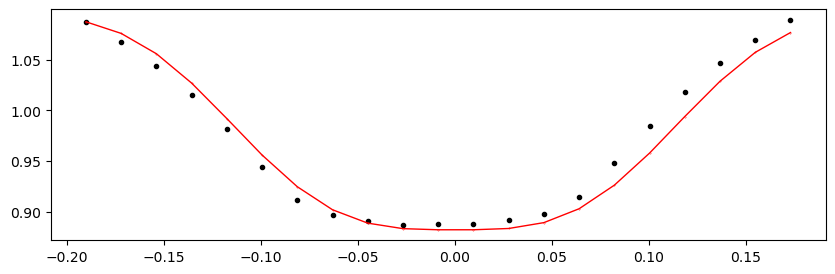

2728.2668396 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.61it/s]


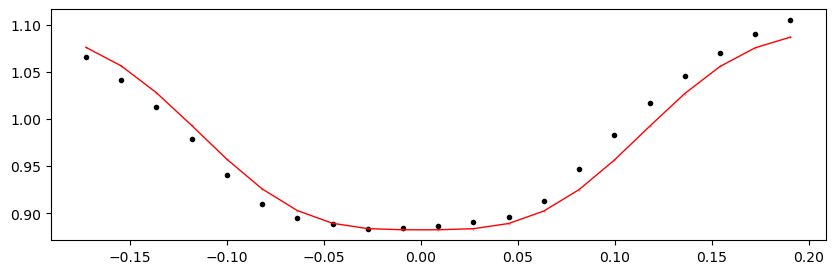

2728.6490708 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.66it/s]


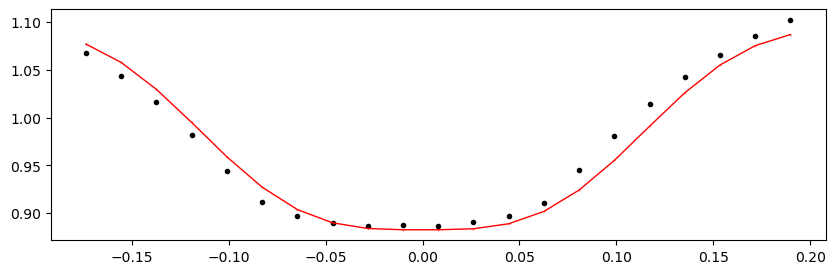

2729.031302 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.50it/s]


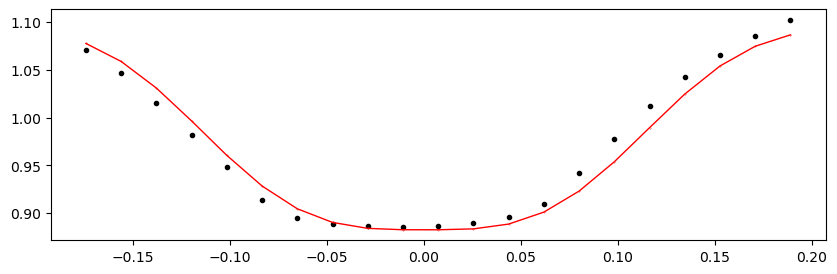

2729.4135332 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.84it/s]


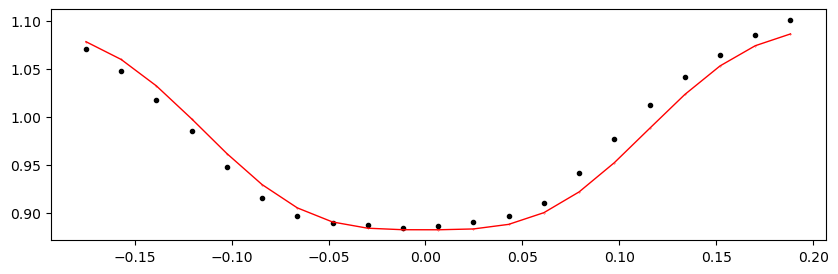

2729.7957644 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.96it/s]


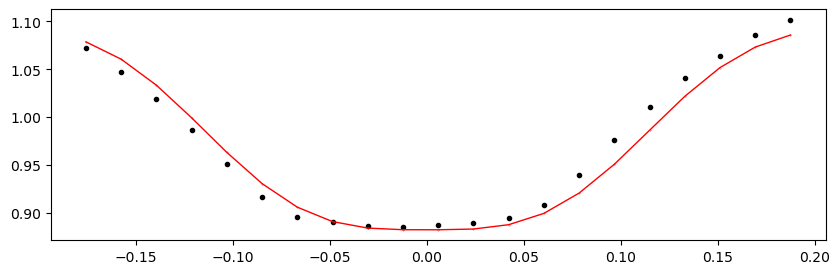

2730.1779956 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.17it/s]


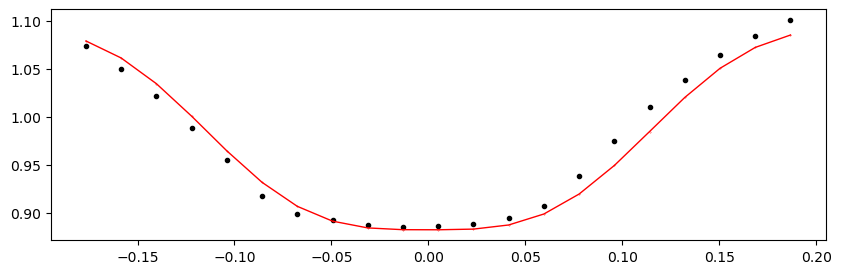

2731.7069204 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.50it/s]


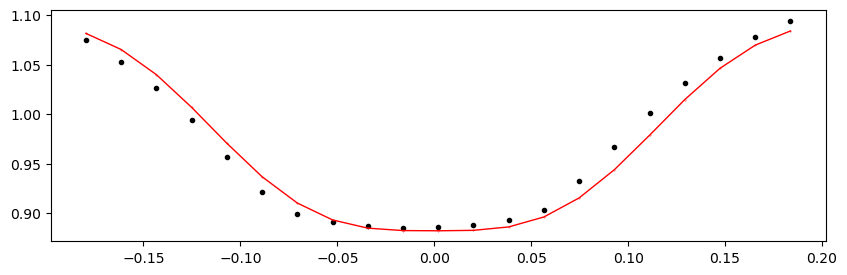

2732.0891516 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.65it/s]


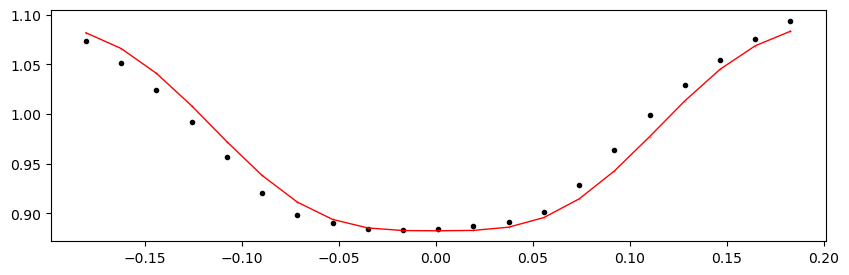

2732.4713828 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.73it/s]


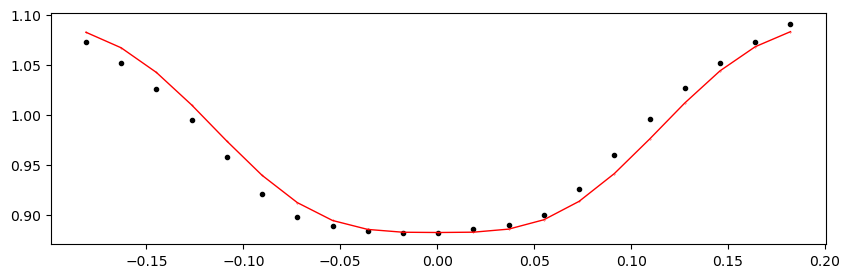

2732.853614 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.85it/s]


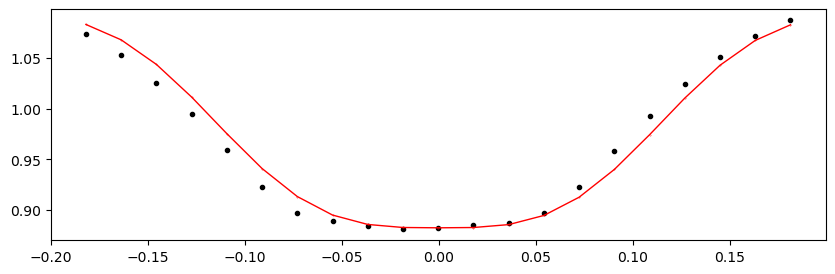

2733.2358452 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.21it/s]


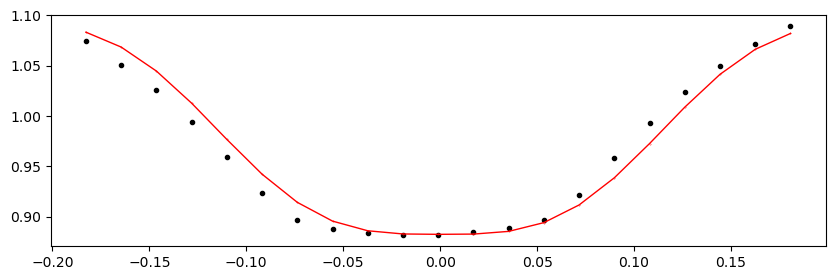

Time 2733.6180764 does not have enough data points: 11
Time 2738.2048508 does not have enough data points: 6
2738.587082 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.16it/s]


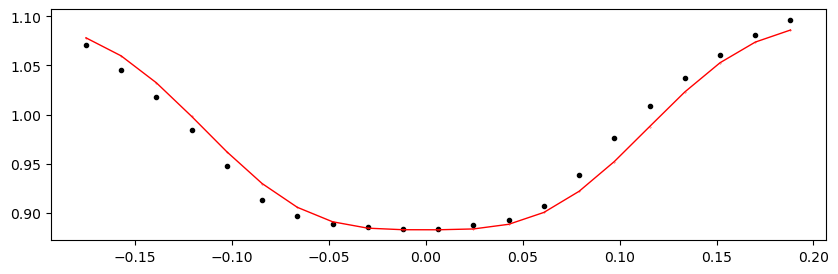

2738.9693132 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.58it/s]


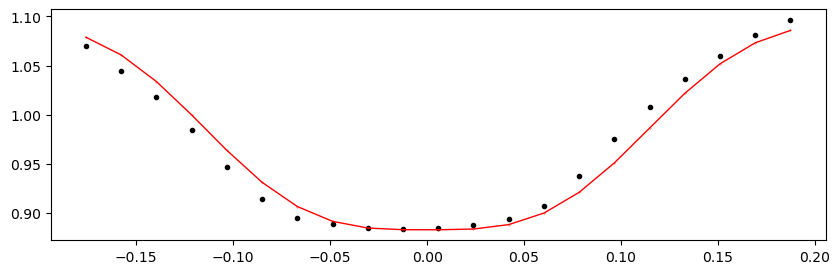

2739.3515444 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.42it/s]


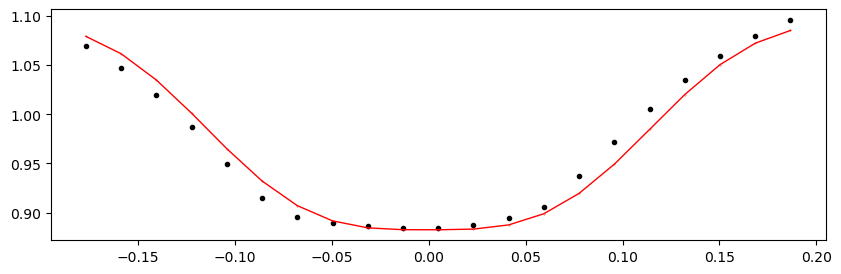

2739.7337755999997 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.36it/s]


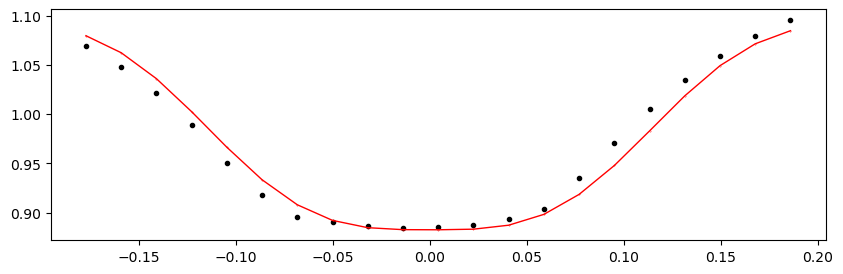

2740.1160068 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.89it/s]


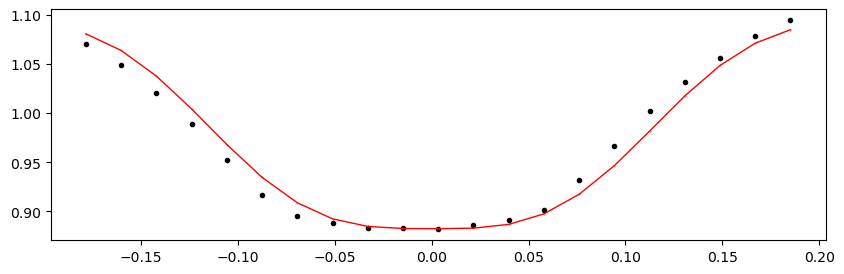

2740.498238 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.41it/s]


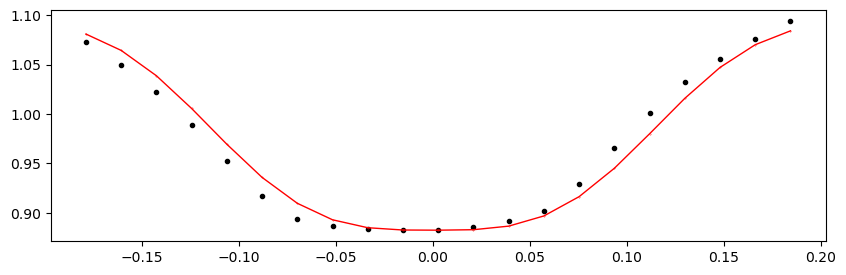

2740.8804692 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.82it/s]


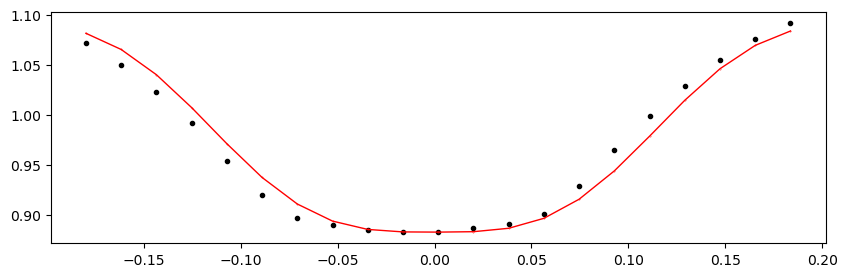

2741.2627004 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.22it/s]


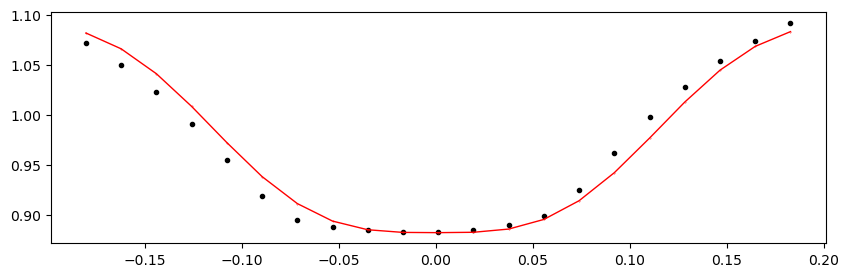

2741.6449316 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.60it/s]


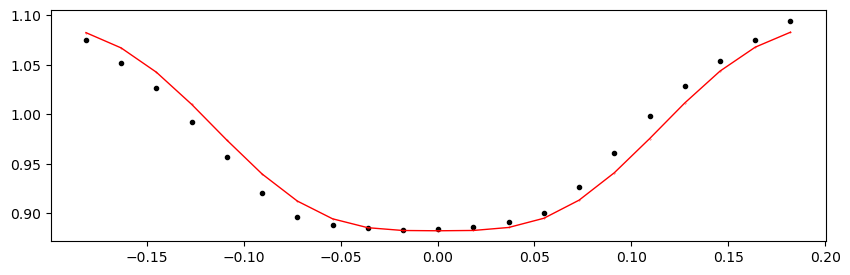

2742.0271628 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.98it/s]


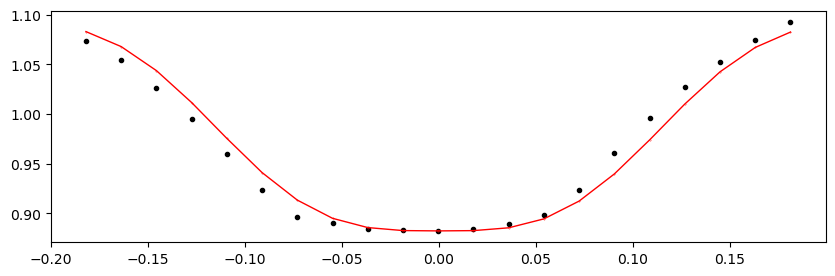

2742.4093940000002 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.65it/s]


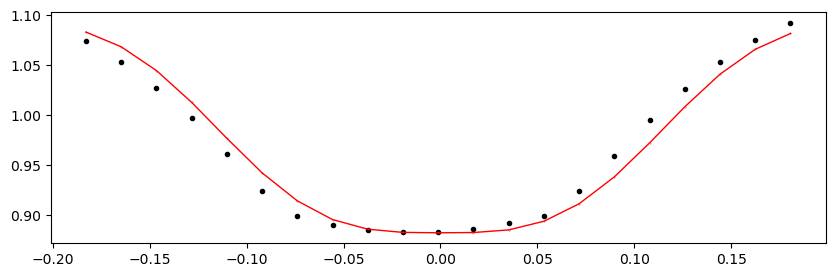

2742.7916252 1.0947691932283237 -0.21229417277560728 -0.28284599880306965


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.12it/s]


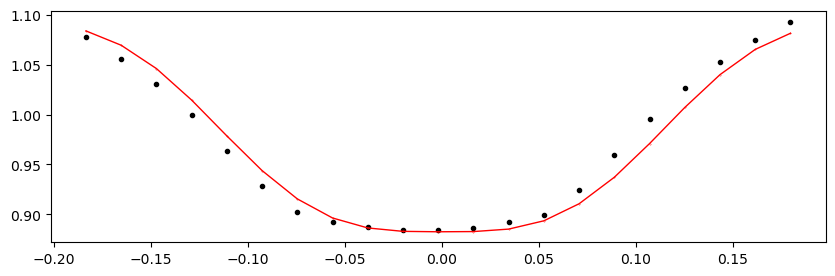

## ETV O-C plot

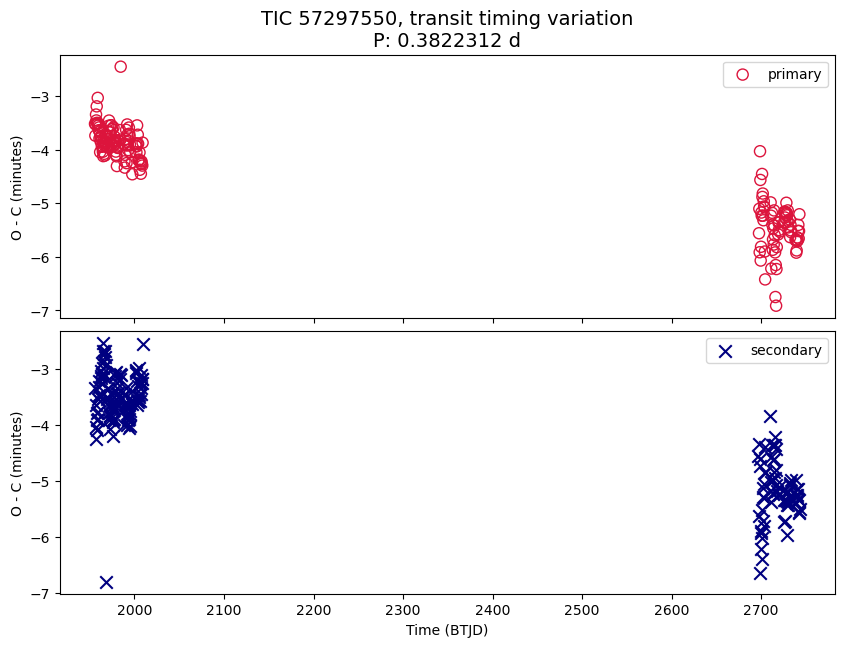

In [29]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              lw = 1, color = 'crimson', )
axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
# axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
#              lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    # axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
    #              lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, transit timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In

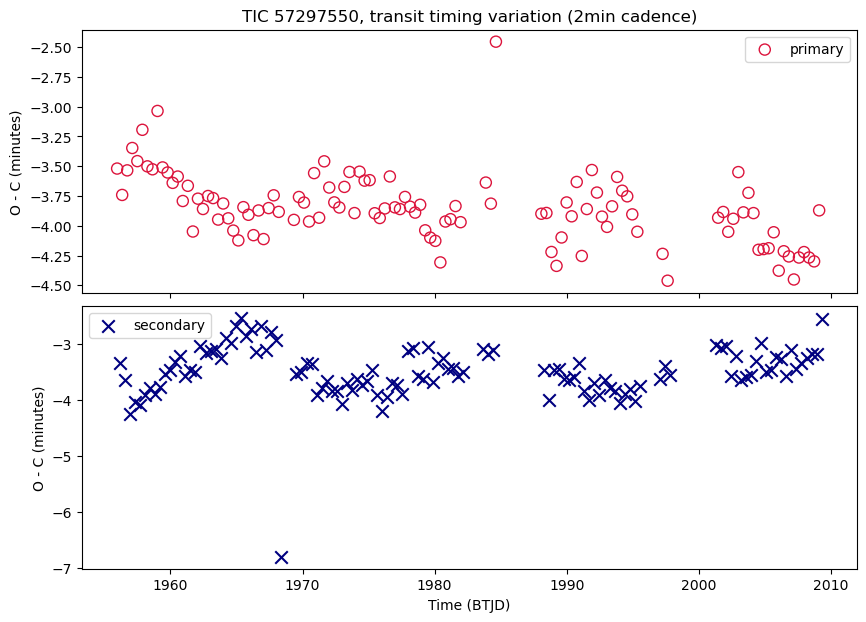

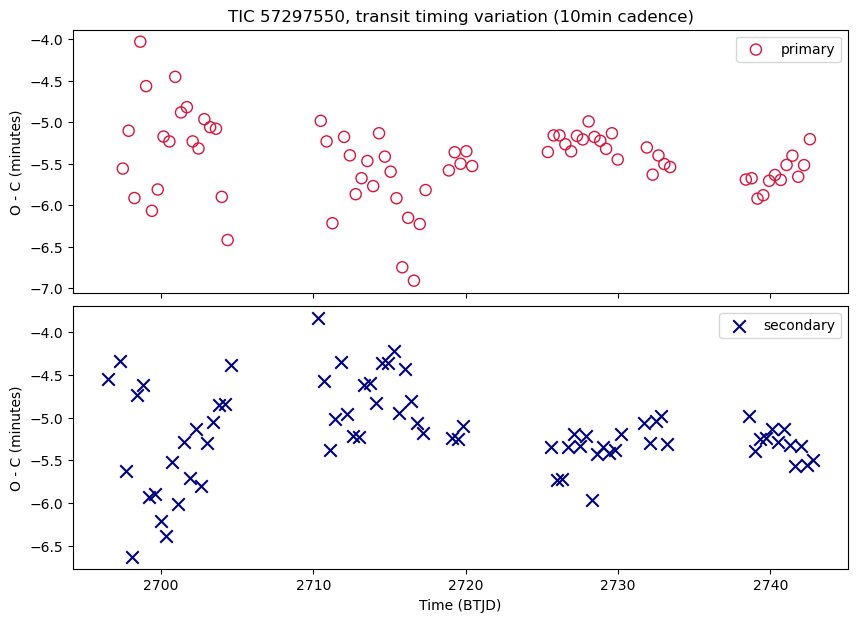

In [30]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1950, 2020),
    (2650, 2750),
]
title_suffix = "transit timing variation"

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    ax = axs_list[0][0]
    ax.set_title(f"{ax.get_title()} (2min cadence)")
    ax = axs_list[1][0]
    ax.set_title(f"{ax.get_title()} (10min cadence)")
    
    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
    
        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]
        
        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]
              
        axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'], 
                       marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        # axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'], 
        #                 lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")
        
        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]
        
            axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
                           marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            # axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
            #                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
        
        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();
        
        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)
        
        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

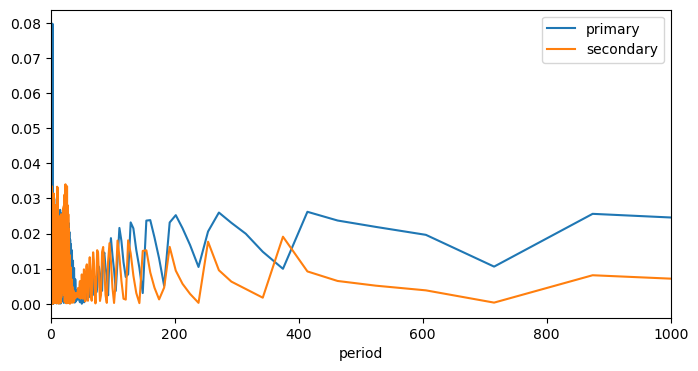

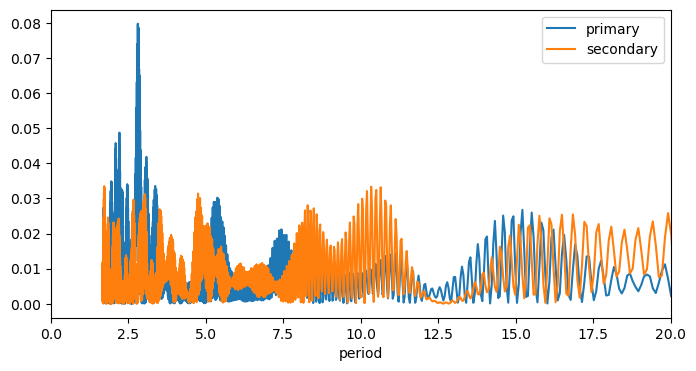

In [76]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 1000)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))
    
    plt.plot(1/frequency, power, label = 'primary')    
    
    if t0_secondary is not None:
        frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
        plt.plot(1/frequency_s, power_s, label = 'secondary')    
    
    plt.xlabel("period")
    
    plt.legend()
    plt.xlim(0, 20)
    plt.show()

## Results Summary

In [32]:
# FILL-IN the ETV results / comments
has_etv = "Y?"
comments = "The O-C scatter seems to follow a pattern, possibly periodic. The trend of primary is opposite of the one of secondary. 2 sectors of 2min cadence + 2 sectors of 10min cadence."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,57297550
has_etv,Y?
comments,"The O-C scatter seems to follow a pattern, possibly periodic. The trend of primary is opposite of the one of secondary. 2 sectors of 2min cadence + 2 sectors of 10min cadence."
period,0.382231
depth_pct_p,18.92
depth_pct_s,21.23
epoch_p,1955.9687
epoch_s,1956.159816
num_sectors,4
time_span,787.28



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
57297550,Y?,"The O-C scatter seems to follow a pattern, possibly periodic. The trend of primary is opposite of the one of secondary. 2 sectors of 2min cadence + 2 sectors of 10min cadence.",0.3822312,18.92,21.23,1955.9687,1956.1598156,4,787.28,1955.8,2743.08

